# 🛡️ AttackDRO · Cluster-GroupDRO Training Notebook

**Adversarial-DRO training** with cluster-discovered group structure, difficulty-score q-updates, multi-backbone support (ResNet-18 / ResNet-50 / ViT), multi-dataset support (CIFAR-10 / CIFAR-100 / ImageNet), and full W&B logging.

---
| Section | Contents |
|---------|----------|
| **0** | W&B login |
| **1** | Installation |
| **2** | Environment & paths |
| **3** | Core imports, seed, device |
| **4** | Pretty-print utilities |
| **5** | Config dataclasses |
| **6** | 📦 Datasets — CIFAR-10 / CIFAR-100 / ImageNet |
| **7** | 🏗️ Backbones — ResNet-18 / ResNet-50 / ViT |
| **8** | Attack registry |
| **9** | Attack generation |
| **10** | Training utilities + W&B helpers |
| **11** | GroupDRO math |
| **12** | Cluster-GroupDRO helpers |
| **13** | Training loop (`train_one_epoch` / `run_training`) |
| **14** | Visualisation |
| **15** | 🔧 **MASTER CONFIG** ← edit here |
| **16** | Pre-built experiment configs |
| **17** | 🚀 Run experiments |
| **18** | K-ablation sweep |
| **19** | Post-hoc evaluation |
| **20** | Multi-run comparison |

> **Quick start:** Run §0 → §1 → §2–§14 (all infrastructure) → edit **§15** → run **§17**.


In [ ]:
!pip install SciencePlots


In [ ]:
# ============================================================================
# SciencePlots style setup
# ============================================================================

# Run once if not installed:
# !pip install -q SciencePlots

import scienceplots
import matplotlib.pyplot as plt

# Use "no-latex" in Colab to avoid LaTeX dependency errors.
# If your runtime has LaTeX installed, you can remove "no-latex".
plt.style.use(["science", "no-latex"])

plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.titlesize": 13,
})

---
## Notebook patch changelog

This version adds paper-inspired AttackDRO++ extensions for final ablations:

- `cluster_sample_reg_lambda` and `cluster_sample_reg_gamma` for the original GroupDRO++ sample-level regularizer.
- `cluster_assignment_mode` for random, loss-aware, attack-identity, feature-only, and GradFP clustering ablations.
- `seen_attack_aug_*` options for source-family-preserving training augmentation.
- Optional `autoattack_l1` and `sparsefool_l0` evaluation hooks for appendix heldout threat-model checks.
- Controlled final experiment launchers in Section 17.7.

Legacy direct-run cells are gated off to make `Runtime -> Run all` safer.


---
## §0 — W&B Login

In [ ]:
import wandb
# Optional interactive login, disabled for reproducible/offline execution:
# get_ipython().system("wandb login --host=https://api.wandb.ai")


---
## §1 — Installation
Uncomment lines on a fresh Colab runtime. Skip if packages are already present.

In [ ]:
# Core + attacks dependency notes
# Network installs are intentionally disabled for reproducible/offline execution.
# If a fresh Colab runtime is missing packages, uncomment the lines below manually.
get_ipython().run_line_magic("pip", "install -q torchattacks scikit-learn pandas matplotlib tqdm wandb timm")
get_ipython().run_line_magic("pip", "install -q git+https://github.com/fra31/auto-attack")
get_ipython().run_line_magic("pip", "install -q git+https://github.com/jeromerony/adversarial-library")
get_ipython().run_line_magic("pip", "install -q git+https://github.com/alirezaabdollahpour/SuperDeepFool")
# get_ipython().run_line_magic("pip", "install -q torchvision")
print("Dependency install lines are disabled. Enable manually only if packages are missing.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.0/142.0 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.2/144.2 kB 21.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.25.1 which is incompatible.
blobfile 3.2.0 requires urllib3>=2, but you have urllib3 1.26.20 which is incompatible.
libpysal 4.14.1 requires requests>=2.32.0, but you have requests 2.25.1 which is incompatible.
sphinx 8.2.3 requires requests>=2.30.0, but you have requests 2.2

---
## §2 — Environment & Paths

In [ ]:
import os, sys, json, math, time, random, warnings, platform, copy
from pathlib import Path

def in_colab():
    return "google.colab" in sys.modules

IS_COLAB = in_colab()
print(f"IS_COLAB : {IS_COLAB}")
print(f"Python   : {sys.version.split()[0]}")
print(f"Platform : {platform.platform()}")

# Optional — mount Drive for persistent storage
if IS_COLAB:
    from google.colab import drive
    drive.mount("/content/drive")
# ROOT_DIR       = Path("/content")     if IS_COLAB else Path.cwd()

ROOT_DIR       = Path("/content/drive/MyDrive")     if IS_COLAB else Path.cwd()
PROJECT_DIR    = ROOT_DIR / "ardg_project"
CHECKPOINT_DIR = PROJECT_DIR / "checkpoints"
RESULTS_DIR    = PROJECT_DIR / "results"
FIG_DIR        = PROJECT_DIR / "figures"
CACHE_DIR      = PROJECT_DIR / "cache"    # dataset cache

for p in [PROJECT_DIR, CHECKPOINT_DIR, RESULTS_DIR, FIG_DIR, CACHE_DIR]:
    p.mkdir(parents=True, exist_ok=True)

print(f"\nPROJECT_DIR    : {PROJECT_DIR}")
print(f"CHECKPOINT_DIR : {CHECKPOINT_DIR}")
print(f"RESULTS_DIR    : {RESULTS_DIR}")


IS_COLAB : True
Python   : 3.12.13
Platform : Linux-6.6.113+-x86_64-with-glibc2.35
Mounted at /content/drive

PROJECT_DIR    : /content/drive/MyDrive/ardg_project
CHECKPOINT_DIR : /content/drive/MyDrive/ardg_project/checkpoints
RESULTS_DIR    : /content/drive/MyDrive/ardg_project/results


---
## §3 — Core Imports · Seed · Device

In [ ]:
from dataclasses import dataclass, field, asdict
from typing import Dict, List, Optional, Tuple, Any
from collections import defaultdict, Counter, deque
from contextlib import nullcontext
import inspect

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from IPython.display import display

import torch
import torch.nn as nn
import torch.nn.functional as F

SEED  = 42

def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False   # set False if input sizes vary

seed_everything(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"DEVICE : {DEVICE}")
if DEVICE == "cuda":
    props = torch.cuda.get_device_properties(0)
    print(f"GPU    : {props.name}")
    print(f"VRAM   : {props.total_memory / 1e9:.1f} GB")
else:
    print("⚠️  Running on CPU — training will be slow")


DEVICE : cuda
GPU    : NVIDIA RTX PRO 6000 Blackwell Server Edition
VRAM   : 102.0 GB


---
## §4 — Pretty-Print & Display Utilities

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
#  Call these anywhere for consistent console output
# ══════════════════════════════════════════════════════════════════════════════

def _bar(w=72, ch="═"): return ch * w

def print_banner(title: str, subtitle: str = "", w: int = 72):
    print(f"\n{_bar(w)}\n  {title}")
    if subtitle: print(f"  {subtitle}")
    print(_bar(w))

def print_section(label: str, w: int = 60):
    print(f"\n{'─'*w}\n  {label}\n{'─'*w}")

def print_config_summary(cfg, title="Training Configuration"):
    d = asdict(cfg)
    print_banner(f"📋  {title}")
    groups = {
        "Experiment" : ["experiment_name","method","dataset_name","backbone","notes"],
        "Training"   : ["epochs","batch_size","lr","weight_decay","momentum",
                        "scheduler","scheduler_milestones","amp","grad_clip_norm","source_attack_mix_in_batch"],
        "Attacks"    : ["train_attack_name","source_attack_names","heldout_attack_names",
                        "eval_attack_names","train_attack_step_overrides"],
        "GroupDRO"   : ["groupdro_eta_q","groupdro_q_floor","groupdro_temperature",
                        "groupdro_q_warmup_epochs","groupdro_difficulty_score"],
        "Cluster"    : ["group_label_mode","cluster_num_clusters","cluster_feature_source",
                        "cluster_q_update_timing","cluster_q_update_metric",
                        "groupdro_cluster_use_uncertainty"],
        "Data"       : ["val_split_ratio","train_subset","val_subset","test_subset",
                        "pretrained","resume_checkpoint","imagenet_root"],
        "W&B"        : ["wandb_enabled","wandb_project","wandb_mode","wandb_run_name",
                        "wandb_group","wandb_tags"],
        "Eval"       : ["autoattack_eval_n","skip_final_eval"],
    }
    for grp, keys in groups.items():
        rows = [(k, d[k]) for k in keys if k in d and d[k] not in (None,"",[])]
        if not rows: continue
        print(f"\n  [{grp}]")
        for k, v in rows:
            vs = json.dumps(v) if isinstance(v,(list,dict)) else str(v)
            if len(vs) > 62: vs = vs[:59]+"..."
            print(f"    {k:<46} {vs}")
    print()

def print_epoch_row(epoch, total_epochs, row, stopper=None):
    flag = " ✓" if stopper and stopper.best_epoch == epoch else ""
    qh   = f"  qH={row.get('q_entropy',float('nan')):.3f}" if "q_entropy" in row else ""
    print(
        f"  [{epoch:03d}/{total_epochs-1:03d}]"
        f"  loss={row.get('train_loss',0):.4f}"
        f"  adv_acc={row.get('train_adv_acc',0):.3f}"
        f"  │  worst={row.get('val_seen_worst_robust_acc',0):.4f}"
        f"  avg={row.get('val_seen_avg_robust_acc',0):.4f}"
        f"  clean={row.get('val_clean_acc',0):.4f}"
        f"  │  lr={row.get('lr',0):.5f}"
        f"  t={row.get('runtime_sec',0):.0f}s"
        f"{qh}{flag}"
    )

def print_cluster_table(epoch, q_state, cfg, show_top_k=None):
    K = int(getattr(cfg,"cluster_num_clusters",6))
    atk_names = list(cfg.source_attack_names)
    top_k = show_top_k or K
    qs = [float(q_state["q"][k]) for k in range(K)]
    order = sorted(range(K), key=lambda k:-qs[k])[:top_k]
    W = 80
    print(f"\n  ┌{'─'*W}┐")
    print(f"  │  Epoch {epoch} — Cluster Diagnostics{' '*(W-34)}│")
    print(f"  ├{'─'*W}┤")
    print(f"  │  {'ID':<12} {'q':>6}  {'RobAcc':>8}  {'ASR':>6}  {'AtkH':>6}  {'ClsH':>6}  {'Top attack':<18}│")
    print(f"  ├{'─'*W}┤")
    for k in order:
        racc = float(q_state["cluster_robust_acc"][k])
        asr  = float(q_state["cluster_asr"][k])
        ah   = float(q_state["cluster_attack_entropy"][k])
        ch   = float(q_state["cluster_class_entropy"][k])
        qk   = qs[k]
        ac   = q_state["cluster_attack_count"][k].cpu()
        ti   = int(ac.argmax()) if ac.sum()>0 else -1
        ta   = f"{atk_names[ti]}({int(ac[ti])})" if ti>=0 else "none"
        print(f"  │  {'cluster_'+str(k):<12} {qk:>6.3f}  {racc:>8.4f}  {asr:>6.4f}  {ah:>6.3f}  {ch:>6.3f}  {ta:<18}│")
    print(f"  └{'─'*W}┘")

def print_final_eval_table(final_eval: dict, name: str = ""):
    print_banner(f"🏁  Final Test-Set Evaluation  —  {name}")
    pe = final_eval.get("per_attack", {})
    rows = [(k.replace("robust_acc/",""), float(v))
            for k,v in final_eval.items() if k.startswith("robust_acc/")]
    if not rows: rows = [(k,float(v)) for k,v in pe.items()]
    rows.sort(key=lambda r: -r[1])
    print(f"  {'Attack':<26}  {'Acc':>8}  Histogram")
    print(f"  {'─'*26}  {'─'*8}  {'─'*22}")
    for atk, acc in rows:
        bar = "█" * max(1, round(acc*22))
        print(f"  {atk:<26}  {acc:>8.4f}  {bar}")
    rob = [v for a,v in rows if a != "clean"]
    if rob:
        print(f"\n  Worst robust : {min(rob):.4f}   Mean robust : {np.mean(rob):.4f}")
    print()

def show_config_df(cfg):
    """Display config as a styled DataFrame — useful in Jupyter."""
    df = pd.DataFrame(list(asdict(cfg).items()), columns=["Parameter","Value"])
    display(df.style.set_properties(**{"text-align":"left"}).hide(axis="index"))

print("✅  Pretty-print utilities defined.")


✅  Pretty-print utilities defined.


---
## §5 — Configuration Dataclasses
> **Do not edit these.** Use the Master Config cell (§15) instead.

In [ ]:
@dataclass
class AttackSpec:
    name: str
    family: str
    norm: str
    eps:   Optional[float] = None
    alpha: Optional[float] = None
    steps: Optional[int]   = None
    restarts: int = 1
    use_for_training: bool = False
    params: Dict[str,Any]  = field(default_factory=dict)

@dataclass
class EarlyStoppingConfig:
    monitor: str      = "val_seen_worst_robust_acc"
    mode: str         = "max"
    patience: int     = 10
    min_delta: float  = 0.0
    warmup_epochs: int = 5
    save_last: bool   = True
    save_best: bool   = True

@dataclass
class TrainConfig:
    # ── Experiment ────────────────────────────────────────────────────────────
    experiment_name: str = "attackdro_run"
    method: str          = "groupdro_online_difficulty"
    # method choices:
    #   single_at                    — train on a single fixed attack (set train_attack_name;
    #                                      supports any attack incl. ddn_l2, pgd10_ce, mifgsm, …)
    #   multi_attack_online_uniform      — random uniform sampling from source_attack_names
    #   groupdro_online                  — GroupDRO with CE-loss q-updates
    #   groupdro_online_difficulty       — GroupDRO with configurable difficulty score
    #   groupdro_cluster_online_difficulty
    notes: str           = ""

    # ── Dataset ───────────────────────────────────────────────────────────────
    dataset_name: str       = "cifar10"   # cifar10 | cifar100 | imagenet
    num_classes: int        = 10
    imagenet_root: str      = "/data/imagenet"   # only used when dataset=imagenet
    val_split_ratio: float  = 0.2         # fraction of train split used as val

    # ── Backbone ──────────────────────────────────────────────────────────────
    backbone: str    = "resnet18"   # resnet18 | resnet50 | vit_s | vit_b | vit_tiny
    pretrained: bool = False

    # ── Training ──────────────────────────────────────────────────────────────
    batch_size: int        = 128
    num_workers: int       = 0
    epochs: int            = 50
    lr: float              = 0.1
    weight_decay: float    = 5e-4
    momentum: float        = 0.9
    label_smoothing: float = 0.0
    grad_clip_norm: Optional[float] = None
    amp: bool              = True

    # ── LR Scheduler ──────────────────────────────────────────────────────────
    scheduler: str                  = "cosine"   # cosine | multistep
    scheduler_milestones: List[int] = field(default_factory=lambda:[30,40])
    scheduler_gamma: float          = 0.1

    # ── Data subsets (None = full split) ──────────────────────────────────────
    train_subset: Optional[int] = None
    val_subset:   Optional[int] = None
    test_subset:  Optional[int] = None
    resume_checkpoint: Optional[str] = None

    # ── Attacks ───────────────────────────────────────────────────────────────
    train_attack_name: str          = "pgd10_ce"
    source_attack_names: List[str]  = field(default_factory=lambda:["pgd10_ce","mifgsm","deepfool_l2"])
    heldout_attack_names: List[str] = field(default_factory=lambda:["tpgd","cw_l2"])
    eval_attack_names: List[str]    = field(default_factory=lambda:[
        "clean","fgsm_rs","pgd20_ce","tpgd","mifgsm","cw_l2","deepfool_l2","autoattack_linf"])
    train_attack_step_overrides: Dict[str,int] = field(default_factory=dict)

    # ── GroupDRO ──────────────────────────────────────────────────────────────
    groupdro_eta_q: float                    = 1e-3
    groupdro_q_floor: float                  = 0.05
    groupdro_temperature: float              = 1.0
    groupdro_q_warmup_epochs: int            = 3
    groupdro_use_importance_correction: bool = True
    online_group_sampling: str               = "uniform"   # uniform | q
    source_attack_mix_in_batch: bool         = False       # True → split each batch evenly across ALL source attacks
    groupdro_difficulty_score: str           = "margin"    # ce|normalized_ce|margin|normalized_margin|error_rate
    groupdro_score_ema: float                = 0.95
    groupdro_score_eps: float                = 1e-8
    groupdro_score_tau: float                = 1.0
    # ── Gradient-fingerprint clustering ───────────────────────────────────────────
    cluster_use_gradient_fingerprints: bool  = False   # use grad fingerprints for clustering
    cluster_gradient_proj_dim: int           = 128     # random projection output dim
    cluster_gradient_weight: float           = 0.1     # weight of grad fingerprints vs features
    # ── Cluster GroupDRO ──────────────────────────────────────────────────────
    group_label_mode: str                        = "attack"      # attack | cluster
    cluster_num_clusters: int                    = 6
    cluster_feature_source: str                  = "penultimate" # penultimate | logits
    cluster_refresh_timing: str                  = "val_end"     # step | val_end
    cluster_refresh_interval: int                = 1
    cluster_refresh_epoch_interval: Optional[int] = None          # refresh every N epochs; None = use cluster_refresh_timing/interval
    cluster_warmup_steps: int                    = 200
    cluster_bank_size: int                       = 8192
    cluster_reset_bank_after_refresh: bool       = True
    cluster_kmeans_batch_size: int               = 2048
    cluster_bootstrap_mode: str                  = "attack"
    cluster_transfer_q_on_refresh: bool          = True
    cluster_q_update_metric: str                 = "hybrid"      # loss|score|hybrid
    cluster_hybrid_alpha: float                  = 0.5
    groupdro_cluster_use_uncertainty: bool       = True
    groupdro_cluster_uncertainty_type: str       = "var"
    groupdro_cluster_uncertainty_lambda: float   = 0.10
    groupdro_cluster_topk_frac: float            = 0.25
    cluster_log_attack_composition: bool         = True
    cluster_q_update_timing: str                 = "epoch_end"   # online|epoch_end|steps
    cluster_q_update_steps: Optional[int]        = None          # update q every N steps; None = use cluster_q_update_timing
    cluster_use_epoch_aggregates_for_q: bool     = True
    cluster_track_composition: bool              = True
    cluster_save_epoch_summaries: bool           = True
    cluster_worst_topk: int                      = 5
    groupdro_use_class_groups: bool = False  # if True, groups = attack × class
    groupdro_gap_adj_C: Optional[float] = None
    cluster_stratify_by_label: bool = False
    cluster_label_weight: float = 0.1

    # Paper-inspired GroupDRO++ extensions
    # Anchor mixing: 1.0 = pure cluster DRO; 0.35 = Anchor35 default.
    cluster_dro_lambda: float = 1.0
    # Original GroupDRO++ sample-level regularizer: mean_i CE_i * q_{g_i}**gamma.
    cluster_sample_reg_lambda: float = 0.0
    cluster_sample_reg_gamma: float = 0.5
    # Cluster ablation mode: kmeans | random | loss_aware | attack_identity.
    cluster_assignment_mode: str = "kmeans"
    cluster_loss_aware_source: str = "difficulty"  # difficulty | ce

    # Seen-attack augmentation for training only. Uses the same source families.
    seen_attack_aug_enabled: bool = False
    seen_attack_aug_prob: float = 1.0
    seen_attack_aug_step_choices: Dict[str, List[int]] = field(default_factory=dict)
    seen_attack_aug_eps_multipliers: Dict[str, List[float]] = field(default_factory=dict)
    seen_attack_aug_alpha_multipliers: Dict[str, List[float]] = field(default_factory=dict)


    # ── Hierarchical Cluster-DRO ───────────────────────────────────────────────
    hier_cluster_k_per_attack: int   = 2    # K' sub-clusters per attack type
    hier_eta_q_attack: float         = 1e-2  # separate lr for attack-level q
    hier_attack_agg: str             = "max" # how to summarize cluster difficulty → attack q: "max"|"mean"|"worst_frac"
    hier_worst_frac: float           = 0.25  # fraction of worst clusters used when hier_attack_agg="worst_frac"
    # ── q logging ─────────────────────────────────────────────────────────────
    q_snapshot_interval: int = 50
    q_log_first_step: bool   = True
    q_log_last_step: bool    = True
    groupdro_attack_min_mass: float = 0

    # ── W&B ───────────────────────────────────────────────────────────────────
    wandb_enabled: bool                 = False
    wandb_project: str                  = "ardg"
    wandb_entity: Optional[str]         = None
    wandb_mode: str                     = "online"   # online | offline
    wandb_run_name: Optional[str]       = None
    wandb_group: Optional[str]          = None
    wandb_tags: List[str]               = field(default_factory=list)
    wandb_log_history_table: bool       = True
    wandb_log_q_figure_every_n_epochs: int = 5
    wandb_log_q_step_metrics: bool      = True
    wandb_log_q_epoch_metrics: bool     = True

    # ── Paths ─────────────────────────────────────────────────────────────────
    ckpt_dir:    str = str(CHECKPOINT_DIR)
    results_dir: str = str(RESULTS_DIR)
    fig_dir:     str = str(FIG_DIR)

    # ── Evaluation ────────────────────────────────────────────────────────────
    autoattack_eval_n: Optional[int] = 512
    skip_final_eval: bool            = False

    # ── Early stopping ────────────────────────────────────────────────────────
    early_stopping: EarlyStoppingConfig = field(default_factory=EarlyStoppingConfig)

    # ── Checkpointing Extras ──────────────────────────────────────────────────
    checkpoint_save_avg: bool           = True
    checkpoint_save_custom: bool        = True
    checkpoint_custom_alpha: float      = 0.5
    checkpoint_custom_beta: float       = 0.5

print("✅  Config dataclasses defined.")


✅  Config dataclasses defined.


---
## §6 — 📦 Datasets

Three sub-sections: CIFAR-10 / CIFAR-100 / ImageNet.
`build_dataloaders(cfg)` dispatches automatically based on `cfg.dataset_name`.

### §6.1 — CIFAR-10

In [ ]:
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader, Subset, random_split

CIFAR10_MEAN = (0.4914, 0.4822, 0.4465)
CIFAR10_STD  = (0.2470, 0.2435, 0.2616)

def cifar10_transforms():
    train_tf = T.Compose([
        T.RandomCrop(32, padding=4),
        T.RandomHorizontalFlip(),
        T.ToTensor(),
        T.Normalize(CIFAR10_MEAN, CIFAR10_STD),
    ])
    test_tf = T.Compose([
        T.ToTensor(),
        T.Normalize(CIFAR10_MEAN, CIFAR10_STD),
    ])
    return train_tf, test_tf

DATASET_STATS = {
    "cifar10":  {"mean": CIFAR10_MEAN,            "std": CIFAR10_STD,            "num_classes": 10},
    "cifar100": {"mean": (0.5071, 0.4867, 0.4408), "std": (0.2675, 0.2565, 0.2761), "num_classes": 100},
    "imagenet": {"mean": (0.485, 0.456, 0.406),   "std": (0.229, 0.224, 0.225),  "num_classes": 1000},
}

print("✅  CIFAR-10 transforms & dataset stats registry defined.")
print(f"   Classes: {DATASET_STATS['cifar10']['num_classes']}")


✅  CIFAR-10 transforms & dataset stats registry defined.
   Classes: 10


### §6.2 — CIFAR-100

In [ ]:
CIFAR100_MEAN = DATASET_STATS["cifar100"]["mean"]
CIFAR100_STD  = DATASET_STATS["cifar100"]["std"]

def cifar100_transforms(image_size: int = 32):
    """Standard CIFAR-100 augmentation. image_size=224 for pretrained ViT/ResNet-50."""
    if image_size == 32:
        train_tf = T.Compose([
            T.RandomCrop(32, padding=4),
            T.RandomHorizontalFlip(),
            T.ToTensor(),
            T.Normalize(CIFAR100_MEAN, CIFAR100_STD),
        ])
        test_tf = T.Compose([
            T.ToTensor(),
            T.Normalize(CIFAR100_MEAN, CIFAR100_STD),
        ])
    else:
        # Up-scale for pretrained models that expect 224×224
        train_tf = T.Compose([
            T.Resize(image_size),
            T.RandomHorizontalFlip(),
            T.ToTensor(),
            T.Normalize(CIFAR100_MEAN, CIFAR100_STD),
        ])
        test_tf = T.Compose([
            T.Resize(image_size),
            T.ToTensor(),
            T.Normalize(CIFAR100_MEAN, CIFAR100_STD),
        ])
    return train_tf, test_tf

print("✅  CIFAR-100 transforms defined.")
print(f"   Classes: {DATASET_STATS['cifar100']['num_classes']}")


✅  CIFAR-100 transforms defined.
   Classes: 100


### §6.3 — ImageNet

In [ ]:
IMAGENET_MEAN = DATASET_STATS["imagenet"]["mean"]
IMAGENET_STD  = DATASET_STATS["imagenet"]["std"]

def imagenet_transforms(image_size: int = 224):
    """Standard ImageNet augmentation pipeline."""
    train_tf = T.Compose([
        T.RandomResizedCrop(image_size),
        T.RandomHorizontalFlip(),
        T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
        T.ToTensor(),
        T.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])
    test_tf = T.Compose([
        T.Resize(int(image_size * 256/224)),
        T.CenterCrop(image_size),
        T.ToTensor(),
        T.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])
    return train_tf, test_tf

print("✅  ImageNet transforms defined.")
print(f"   Classes: {DATASET_STATS['imagenet']['num_classes']}")
print("   ⚠️  Requires ImageNet on disk — set cfg.imagenet_root to your path.")


✅  ImageNet transforms defined.
   Classes: 1000
   ⚠️  Requires ImageNet on disk — set cfg.imagenet_root to your path.


### §6.4 — Unified `build_dataloaders()` dispatcher

In [ ]:
def _maybe_subset(dataset, n, seed=SEED):
    if n is None or n >= len(dataset): return dataset
    idx = np.random.default_rng(seed).choice(len(dataset), n, replace=False).tolist()
    return Subset(dataset, idx)

def _get_image_size(cfg) -> int:
    """Return input image resolution for the chosen backbone."""
    if "vit" in str(cfg.backbone).lower():
        return 224
    if cfg.dataset_name == "imagenet":
        return 224
    if cfg.pretrained and cfg.backbone in ("resnet50",):
        return 224
    return 32   # native CIFAR size

def _make_loaders(train_ds, val_ds, test_ds, cfg):
    # Disable pin_memory to avoid QueueFeederThread teardown crashes in Colab
    kw = dict(num_workers=cfg.num_workers, pin_memory=False)
    return (
        DataLoader(train_ds, batch_size=cfg.batch_size, shuffle=True,  **kw),
        DataLoader(val_ds,   batch_size=cfg.batch_size, shuffle=False, **kw),
        DataLoader(test_ds,  batch_size=cfg.batch_size, shuffle=False, **kw),
    )

def _print_split_info(train_ds, val_ds, test_ds, cfg, train_l, val_l, test_l):
    print_banner(f"📦  Dataset: {cfg.dataset_name.upper()}  |  Backbone input: {_get_image_size(cfg)}px")
    for name, ds, ld in [("Train",train_ds,train_l),("Val",val_ds,val_l),("Test",test_ds,test_l)]:
        print(f"  {name:<5}: {len(ds):>7,} samples  ({len(ld):>4} batches @ bs={cfg.batch_size})")

def build_dataloaders(cfg):
    """Dispatch to the correct dataset based on cfg.dataset_name.
    Returns (train_loader, val_loader, test_loader).
    """
    dname = cfg.dataset_name.lower()
    img_sz = _get_image_size(cfg)
    gen    = torch.Generator().manual_seed(SEED)

    # ── CIFAR-10 ──────────────────────────────────────────────────────────────
    if dname == "cifar10":
        if img_sz == 32:
            train_tf, test_tf = cifar10_transforms()
        else:  # upscale for large backbone
            train_tf = T.Compose([T.Resize(img_sz), T.RandomHorizontalFlip(),
                                   T.ToTensor(), T.Normalize(CIFAR10_MEAN, CIFAR10_STD)])
            test_tf  = T.Compose([T.Resize(img_sz), T.ToTensor(),
                                   T.Normalize(CIFAR10_MEAN, CIFAR10_STD)])
        full_train = torchvision.datasets.CIFAR10(root=CACHE_DIR, train=True,  download=True, transform=train_tf)
        test_ds    = torchvision.datasets.CIFAR10(root=CACHE_DIR, train=False, download=True, transform=test_tf)
        val_base   = torchvision.datasets.CIFAR10(root=CACHE_DIR, train=True,  download=False,transform=test_tf)

    # ── CIFAR-100 ─────────────────────────────────────────────────────────────
    elif dname == "cifar100":
        train_tf, test_tf = cifar100_transforms(image_size=img_sz)
        full_train = torchvision.datasets.CIFAR100(root=CACHE_DIR, train=True,  download=True, transform=train_tf)
        test_ds    = torchvision.datasets.CIFAR100(root=CACHE_DIR, train=False, download=True, transform=test_tf)
        val_base   = torchvision.datasets.CIFAR100(root=CACHE_DIR, train=True,  download=False,transform=test_tf)

    # ── ImageNet ──────────────────────────────────────────────────────────────
    elif dname == "imagenet":
        train_tf, test_tf = imagenet_transforms(image_size=img_sz)
        root = str(getattr(cfg, "imagenet_root", "/data/imagenet"))
        full_train = torchvision.datasets.ImageNet(root=root, split="train", transform=train_tf)
        test_ds    = torchvision.datasets.ImageNet(root=root, split="val",   transform=test_tf)
        val_base   = torchvision.datasets.ImageNet(root=root, split="train", transform=test_tf)

    else:
        raise NotImplementedError(f"Unknown dataset: {cfg.dataset_name}. "
                                   f"Supported: cifar10, cifar100, imagenet")

    # ── Train / Val split ─────────────────────────────────────────────────────
    val_n   = max(1, int(len(full_train) * cfg.val_split_ratio))
    train_n = len(full_train) - val_n
    t_split, v_split = random_split(full_train, [train_n, val_n], generator=gen)

    train_ds = _maybe_subset(Subset(full_train, t_split.indices), cfg.train_subset, SEED+1)
    val_ds   = _maybe_subset(Subset(val_base,   v_split.indices), cfg.val_subset,   SEED+2)
    test_ds  = _maybe_subset(test_ds,                             cfg.test_subset,  SEED+3)

    train_l, val_l, test_l = _make_loaders(train_ds, val_ds, test_ds, cfg)
    _print_split_info(train_ds, val_ds, test_ds, cfg, train_l, val_l, test_l)
    return train_l, val_l, test_l

print("✅  build_dataloaders() defined. Supports: cifar10 / cifar100 / imagenet")

✅  build_dataloaders() defined. Supports: cifar10 / cifar100 / imagenet


---
## §7 — 🏗️ Backbones

Three sub-sections: ResNet-18 / ResNet-50 / ViT.
`build_model(cfg)` dispatches automatically based on `cfg.backbone`.

### §7.1 — ResNet-18  (CIFAR-adapted)

In [ ]:
from torchvision.models import resnet18, ResNet18_Weights

def build_resnet18(num_classes: int, pretrained: bool, image_size: int) -> nn.Module:
    """
    ResNet-18 with a CIFAR-friendly stem when image_size=32
    (3×3 conv, stride 1, no maxpool). Restores standard ImageNet stem for 224px.
    """
    weights = ResNet18_Weights.IMAGENET1K_V1 if pretrained else None
    model   = resnet18(weights=weights)

    if image_size <= 64:    # CIFAR / small-input mode
        model.conv1  = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        model.maxpool = nn.Identity()

    if num_classes != 1000:
        model.fc = nn.Linear(model.fc.in_features, num_classes)

    n_params = sum(p.numel() for p in model.parameters()) / 1e6
    print(f"  ResNet-18  |  classes={num_classes}  "
          f"pretrained={pretrained}  img_sz={image_size}  params={n_params:.1f}M")
    return model

print("✅  build_resnet18() defined.")


✅  build_resnet18() defined.


### §7.2 — ResNet-50  (standard + CIFAR-adapted)

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

def build_resnet50(num_classes: int, pretrained: bool, image_size: int) -> nn.Module:
    """
    ResNet-50. CIFAR stem adaptation is applied automatically when image_size ≤ 64.
    Pretrained weights are ImageNet-1K unless fine-tuning is not needed.
    """
    weights = ResNet50_Weights.IMAGENET1K_V2 if pretrained else None
    model   = resnet50(weights=weights)

    if image_size <= 64:    # CIFAR / small-input mode
        model.conv1  = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        model.maxpool = nn.Identity()

    if num_classes != 1000:
        model.fc = nn.Linear(model.fc.in_features, num_classes)

    n_params = sum(p.numel() for p in model.parameters()) / 1e6
    print(f"  ResNet-50  |  classes={num_classes}  "
          f"pretrained={pretrained}  img_sz={image_size}  params={n_params:.1f}M")
    return model

print("✅  build_resnet50() defined.")


✅  build_resnet50() defined.


### §7.3 — Vision Transformer (ViT-Tiny / ViT-S / ViT-B via `timm`)

In [ ]:
# Requires: pip install timm
# Supported backbone names in cfg.backbone:
#   vit_tiny  → vit_tiny_patch16_224
#   vit_s     → vit_small_patch16_224
#   vit_b     → vit_base_patch16_224

_VIT_TIMM_MAP = {
    "vit_tiny": "vit_tiny_patch16_224",
    "vit_s":    "vit_small_patch16_224",
    "vit_b":    "vit_base_patch16_224",
}

def build_vit(backbone_key: str, num_classes: int, pretrained: bool) -> nn.Module:
    """
    Build a ViT via timm. Always expects 224×224 input.
    The final head is replaced for non-ImageNet num_classes.
    """
    try:
        import timm
    except ImportError:
        raise ImportError("timm is required for ViT. Install with: pip install timm")

    timm_name = _VIT_TIMM_MAP.get(backbone_key, backbone_key)
    model = timm.create_model(timm_name, pretrained=pretrained, num_classes=num_classes)

    n_params = sum(p.numel() for p in model.parameters()) / 1e6
    print(f"  ViT  |  timm_name={timm_name}  classes={num_classes}  "
          f"pretrained={pretrained}  params={n_params:.1f}M")
    return model

print("✅  build_vit() defined.  (requires: pip install timm)")


✅  build_vit() defined.  (requires: pip install timm)


### §7.4 — Unified `build_model()` dispatcher

In [ ]:
def build_model(cfg) -> nn.Module:
    """
    Build the model specified by cfg.backbone.
    Returns an nn.Module on CPU — call .to(DEVICE) after.

    cfg.backbone choices:
        resnet18  → ResNet-18 (CIFAR-adapted when input <= 64px)
        resnet50  → ResNet-50 (CIFAR-adapted when input <= 64px)
        vit_tiny  → ViT-Tiny/16  (always 224px)
        vit_s     → ViT-Small/16 (always 224px)
        vit_b     → ViT-Base/16  (always 224px)
    """
    img_sz  = _get_image_size(cfg)
    nc      = cfg.num_classes
    pre     = cfg.pretrained
    bk      = str(cfg.backbone).strip().lower()

    if bk == "resnet18":
        return build_resnet18(nc, pre, img_sz)
    if bk == "resnet50":
        return build_resnet50(nc, pre, img_sz)
    if bk in _VIT_TIMM_MAP or bk.startswith("vit"):
        return build_vit(bk, nc, pre)
    if cfg.backbone.lower().startswith("wrn"):
        return build_wide_resnet(cfg.backbone, cfg.num_classes)

    raise ValueError(f"Unknown backbone: {cfg.backbone}. "
                     f"Supported: resnet18, resnet50, vit_tiny, vit_s, vit_b")

# Quick test (no GPU needed)
_test_cfg = TrainConfig(backbone="resnet18", dataset_name="cifar10", num_classes=10)
_m = build_model(_test_cfg)
assert _m(torch.randn(2,3,32,32)).shape == (2,10)
del _m, _test_cfg
print("\n✅  build_model() defined and smoke-tested.")


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

✅  build_model() defined and smoke-tested.


### §7.5 — WideResNet (standard AT benchmark backbone)


In [ ]:

class _WRNBlock(nn.Module):
    def __init__(self, in_ch, out_ch, stride, dropout=0.0):
        super().__init__()
        self.bn1   = nn.BatchNorm2d(in_ch)
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, stride, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, 1, 1, bias=False)
        self.drop  = nn.Dropout(p=dropout) if dropout > 0 else nn.Identity()
        self.sc    = (nn.Conv2d(in_ch, out_ch, 1, stride, bias=False)
                      if stride != 1 or in_ch != out_ch else nn.Identity())
    def forward(self, x):
        out = self.conv1(F.relu(self.bn1(x), inplace=True))
        out = self.conv2(self.drop(F.relu(self.bn2(out), inplace=True)))
        return out + self.sc(x)

class WideResNet(nn.Module):
    """
    WideResNet for CIFAR — CIFAR-adapted (no initial maxpool, 3x3 conv stem).
    Standard configs:
        wrn_28_10  → 36.5M params, feature_dim=640  ← recommended for AT
        wrn_34_10  → 46.2M params, feature_dim=640
        wrn_28_2   → 1.5M  params, feature_dim=128  ← lightweight test
    """
    def __init__(self, depth, widen, num_classes, dropout=0.0):
        super().__init__()
        assert (depth - 4) % 6 == 0, "depth must be 6n+4"
        n    = (depth - 4) // 6
        nch  = [16, 16 * widen, 32 * widen, 64 * widen]

        def _make_layer(in_ch, out_ch, stride):
            layers = [_WRNBlock(in_ch, out_ch, stride, dropout)]
            for _ in range(n - 1):
                layers.append(_WRNBlock(out_ch, out_ch, 1, dropout))
            return nn.Sequential(*layers)

        self.conv1   = nn.Conv2d(3, nch[0], 3, 1, 1, bias=False)
        self.layer1  = _make_layer(nch[0], nch[1], 1)
        self.layer2  = _make_layer(nch[1], nch[2], 2)
        self.layer3  = _make_layer(nch[2], nch[3], 2)
        self.bn_out  = nn.BatchNorm2d(nch[3])
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.fc      = nn.Linear(nch[3], num_classes)
        self.feature_dim = nch[3]

        # weight init
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1); m.bias.data.zero_()
            elif isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight); m.bias.data.zero_()

    def forward(self, x):
        z = self.conv1(x)
        z = self.layer1(z)
        z = self.layer2(z)
        z = self.layer3(z)
        z = F.relu(self.bn_out(z), inplace=True)
        z = self.avgpool(z)
        return self.fc(torch.flatten(z, 1))

    @property
    def maxpool(self): return nn.Identity()   # dummy attr for compat

def build_wide_resnet(backbone_key: str, num_classes: int) -> WideResNet:
    parts  = backbone_key.lower().replace("wrn_","").split("_")
    depth  = int(parts[0])
    widen  = int(parts[1])
    model  = WideResNet(depth, widen, num_classes)
    params = sum(p.numel() for p in model.parameters()) / 1e6
    print(f"  WideResNet-{depth}-{widen}  |  classes={num_classes}  "
          f"params={params:.1f}M  feature_dim={model.feature_dim}")
    return model

print("✅  WideResNet defined. Keys: wrn_28_10, wrn_34_10, wrn_28_2")

✅  WideResNet defined. Keys: wrn_28_10, wrn_34_10, wrn_28_2


---
## §8 — Attack Registry

In [ ]:
EPS8   = 8 / 255
ALPHA2 = 2 / 255
L2_EPS = 0.5

ATTACK_SPECS: Dict[str, AttackSpec] = {
    "fgsm":            AttackSpec("fgsm",           "single_step",  "linf", eps=EPS8,   alpha=None,      steps=1,    use_for_training=True),
    "fgsm_rs":         AttackSpec("fgsm_rs",         "single_step",  "linf", eps=EPS8,   alpha=EPS8,      steps=1,    use_for_training=True),
    "pgd_ce":          AttackSpec("pgd_ce",           "pgd",          "linf", eps=EPS8,   alpha=ALPHA2,    steps=10,   use_for_training=True),
    "pgd10_ce":        AttackSpec("pgd10_ce",         "pgd",          "linf", eps=EPS8,   alpha=ALPHA2,    steps=10,   use_for_training=True),
    "pgd20_ce":        AttackSpec("pgd20_ce",         "pgd",          "linf", eps=EPS8,   alpha=ALPHA2,    steps=20,   use_for_training=False),
    "pgd_l2":          AttackSpec("pgd_l2",           "pgd",          "l2",   eps=L2_EPS, alpha=L2_EPS/10, steps=10,   use_for_training=True),
    "pgd_dlr":         AttackSpec("pgd_dlr",          "pgd",          "linf", eps=EPS8,   alpha=ALPHA2,    steps=10,   use_for_training=True),
    "tpgd":            AttackSpec("tpgd",             "trades_like",  "linf", eps=EPS8,   alpha=ALPHA2,    steps=10,   use_for_training=True),
    "mifgsm":          AttackSpec("mifgsm",           "momentum",     "linf", eps=EPS8,   alpha=ALPHA2,    steps=10,   use_for_training=True),
    "cw_l2":           AttackSpec("cw_l2",            "optimization", "l2",   eps=L2_EPS,   alpha=None,      steps=20,   use_for_training=False,
                                   params={"c":1,"kappa":0,"lr":0.01}),
    # "deepfool_l2":     AttackSpec("deepfool_l2",      "boundary",     "l2",   eps=None,   alpha=None,      steps=50,   use_for_training=False,
    #                                params={"overshoot":0.02}),
    # "ddn_l2":          AttackSpec("ddn_l2",           "ddn",          "l2",   eps=None,   alpha=None,      steps=20,   use_for_training=True),
    "autoattack_linf": AttackSpec("autoattack_linf",  "ensemble",     "linf", eps=EPS8,   alpha=None,      steps=None, use_for_training=False),
    # "superdeepfool_l2": AttackSpec("superdeepfool_l2", "boundary",     "l2",  eps=None,   alpha=None,      steps=20,   use_for_training=True,
    #                                params={"overshoot":0.02,"search_iter":0}),
    "deepfool_l2": AttackSpec("deepfool_l2", "boundary", "l2", eps=L2_EPS, alpha=None, steps=50,
                          use_for_training=False, params={"overshoot": 0.02}),
    "ddn_l2": AttackSpec("ddn_l2", "ddn", "l2", eps=L2_EPS, alpha=None, steps=20,
                        use_for_training=True),
    "superdeepfool_l2": AttackSpec("superdeepfool_l2", "boundary", "l2", eps=L2_EPS, alpha=None, steps=20,
                                  use_for_training=True, params={"overshoot": 0.02, "search_iter": 0}),
}

def copy_attack_spec(s: AttackSpec) -> AttackSpec:
    return AttackSpec(s.name,s.family,s.norm,s.eps,s.alpha,s.steps,s.restarts,s.use_for_training,dict(s.params))

def resolve_attack_spec(name: str, cfg=None, train_mode: bool=False) -> AttackSpec:
    spec = copy_attack_spec(ATTACK_SPECS[name])
    if train_mode and cfg is not None and name in getattr(cfg,"train_attack_step_overrides",{}):
        spec.steps = int(cfg.train_attack_step_overrides[name])
    return spec

display(pd.DataFrame([
    {"name":k, "family":v.family, "norm":v.norm,
     "eps":f"{v.eps:.4f}" if v.eps else "—",
     "steps":v.steps or "—", "train?":"✓" if v.use_for_training else "✗"}
    for k,v in ATTACK_SPECS.items()
]).set_index("name"))
print("\n✅  Attack registry ready.")


,family,norm,eps,steps,train?
name,,,,,
fgsm,single_step,linf,0.0314,1,✓
fgsm_rs,single_step,linf,0.0314,1,✓
pgd_ce,pgd,linf,0.0314,10,✓
pgd10_ce,pgd,linf,0.0314,10,✓
pgd20_ce,pgd,linf,0.0314,20,✗
pgd_l2,pgd,l2,0.5000,10,✓
pgd_dlr,pgd,linf,0.0314,10,✓
tpgd,trades_like,linf,0.0314,10,✓
mifgsm,momentum,linf,0.0314,10,✓



✅  Attack registry ready.


---
## §9 — Attack Generation

In [ ]:
from tqdm.auto import tqdm

try:
    import torchattacks
    print(f"✅  torchattacks {torchattacks.__version__}")
except Exception as e:
    torchattacks = None
    print(f"⚠️  torchattacks unavailable: {e}")

try:
    from adv_lib.attacks import ddn as advlib_ddn
    print("✅  adv_lib (DDN) available")
except Exception as e:
    advlib_ddn = None
    print(f"⚠️  adv_lib unavailable: {e}")

try:
    from superdeepfool.attacks.SuperDeepFool import SuperDeepFool as _SuperDeepFool
    print("✅  superdeepfool available")
except Exception as e:
    _SuperDeepFool = None
    print(f"⚠️  superdeepfool unavailable: {e}  —  pip install git+https://github.com/alirezaabdollahpour/SuperDeepFool")

class _SDFWrapper:
    """Thin adapter: suppresses verbose output and matches torchattacks call signature."""
    def __init__(self, sdf): self._sdf = sdf
    def __call__(self, x, y): return self._sdf(x, y, verbose=False)

# ── Normalisation helpers ──────────────────────────────────────────────────────
def get_dataset_mean_std(cfg):
    stats = DATASET_STATS.get(cfg.dataset_name.lower(), DATASET_STATS["cifar10"])
    return stats["mean"], stats["std"]

def autocast_context(enabled: bool):
    return torch.amp.autocast("cuda", enabled=enabled) if DEVICE=="cuda" else nullcontext()

def denormalize(x: torch.Tensor, mean, std) -> torch.Tensor:
    m = torch.tensor(mean, device=x.device).view(1,3,1,1)
    s = torch.tensor(std,  device=x.device).view(1,3,1,1)
    return x * s + m

def renormalize(x: torch.Tensor, mean, std) -> torch.Tensor:
    m = torch.tensor(mean, device=x.device).view(1,3,1,1)
    s = torch.tensor(std,  device=x.device).view(1,3,1,1)
    return (x - m) / s

def project_l2_ball(x_adv: torch.Tensor, x_orig: torch.Tensor, eps: float) -> torch.Tensor:
    delta = x_adv - x_orig
    flat  = delta.view(delta.size(0), -1)
    norm  = flat.norm(p=2, dim=1, keepdim=True).clamp_min(1e-12)
    scale = torch.clamp(eps / norm, max=1.0)
    delta = (flat * scale).view_as(delta)
    return (x_orig + delta).clamp(0.0, 1.0)
class NormalizeWrapper(nn.Module):
    """Wraps a model so attacks can work in pixel space [0,1]."""
    def __init__(self, model, mean, std):
        super().__init__(); self.model=model; self.mean=mean; self.std=std
    def forward(self, x_pixel):
        return self.model(renormalize(x_pixel, self.mean, self.std))


class SuperDeepFoolFast:
    """Vectorized SuperDeepFool (L2) -- batch-parallel, CUDA-compatible.

    The original implementation loops per-sample (batch_size x steps sequential
    forward/backward passes), making it ~100x slower than PGD at train time.
    This version processes the whole batch in parallel:
      - one forward pass per step
      - one torch.autograd.grad call per step (does NOT accumulate into
        model .grad buffers -- safe to call inside the outer training loop)

    Complexity: O(steps) total passes.  Original: O(B * steps * deepfool_steps).

    Algorithm per step:
      1. Forward -> logits for all still-active (correctly-classified) samples
      2. Target class = argmin_j |f_j - f_y| for j != y  (score-gap approximation,
         avoids computing C per-class gradients per step)
      3. torch.autograd.grad of sum(f_target - f_y) over active samples only
      4. L2 DeepFool step: r += (|f_diff| / ||g||^2) * g * (1 + overshoot)
      5. Mask: only active samples are updated; mask is refreshed each step

    Training:  steps=20, search_iter=0   (fast, comparable wall-time to PGD-20)
    Eval:      steps=50, search_iter=5   (binary search tightens perturbation norms)
    """

    def __init__(self, model, steps=20, overshoot=0.02, search_iter=0):
        self.model       = model
        self.steps       = steps
        self.overshoot   = overshoot
        self.search_iter = search_iter

    @property
    def device(self):
        return next(self.model.parameters()).device

    def __call__(self, images, labels):
        device  = self.device
        images  = images.clone().detach().to(device)
        labels  = labels.clone().detach().to(device)
        B       = images.size(0)

        r_tot  = torch.zeros_like(images)
        active = torch.ones(B, dtype=torch.bool, device=device)

        was_training = self.model.training
        self.model.eval()
        try:
            for _ in range(self.steps):
                if not active.any():
                    break

                adv_req = (images + r_tot).clamp(0.0, 1.0).detach().requires_grad_(True)
                logits  = self.model(adv_req)                    # (B, C)

                with torch.no_grad():
                    active = active & (logits.detach().argmax(1) == labels)
                if not active.any():
                    break

                # nearest boundary by score gap (avoids C per-class grad calls)
                with torch.no_grad():
                    idx_B   = torch.arange(B, device=device)
                    f_y_det = logits.detach()[idx_B, labels]
                    gaps    = (logits.detach() - f_y_det.unsqueeze(1)).abs()  # (B, C)
                    gaps.scatter_(1, labels.unsqueeze(1), float('inf'))
                    target  = gaps.argmin(1)                                  # (B,)

                # one grad call -- does not accumulate into model .grad buffers
                idx_B  = torch.arange(B, device=device)
                f_diff = logits[idx_B, target] - logits[idx_B, labels]       # (B,)
                grad   = torch.autograd.grad(
                    (f_diff * active.float()).sum(), adv_req,
                    create_graph=False, retain_graph=False
                )[0]                                                          # (B, C, H, W)

                # L2 DeepFool step with overshoot
                with torch.no_grad():
                    g_norm_sq = grad.view(B, -1).pow(2).sum(1).clamp_min(1e-12)  # (B,)
                    step_sz   = (
                        f_diff.detach().abs() * (1.0 + self.overshoot) / g_norm_sq
                    ).view(B, 1, 1, 1)
                    r_tot = r_tot + step_sz * grad * active.view(B, 1, 1, 1).float()

        finally:
            self.model.train(was_training)

        adv_out = (images + r_tot).clamp(0.0, 1.0).detach()

        # optional binary search: tightens perturbation magnitude at eval time
        if self.search_iter > 0:
            self.model.eval()
            dx = adv_out - images
            lo = torch.zeros(B, 1, 1, 1, device=device)
            hi = torch.ones( B, 1, 1, 1, device=device)
            with torch.no_grad():
                for _ in range(self.search_iter):
                    mid      = (lo + hi) / 2.0
                    pred_mid = self.model((images + mid * dx).clamp(0, 1)).argmax(1)
                    still_ok = (pred_mid == labels).view(B, 1, 1, 1)
                    lo = torch.where(still_ok,  mid, lo)
                    hi = torch.where(~still_ok, mid, hi)
            adv_out = (images + hi * dx).clamp(0.0, 1.0).detach()
            self.model.train(was_training)

        return adv_out


def _inst(cls, wm, kw):
    sig=inspect.signature(cls.__init__)
    return cls(wm, **{k:v for k,v in kw.items() if k in sig.parameters and v is not None})

def make_attack(model, attack_name, *, cfg=None, train_mode=False):
    if attack_name == "clean": return None
    if attack_name not in {"autoattack_linf","ddn_l2"} and torchattacks is None:
        raise ImportError("torchattacks required.")
    spec = resolve_attack_spec(attack_name, cfg=cfg, train_mode=train_mode)
    mean, std = get_dataset_mean_std(cfg) if cfg else (CIFAR10_MEAN, CIFAR10_STD)
    wm   = NormalizeWrapper(model, mean, std)

    if attack_name == "fgsm":        return _inst(torchattacks.FGSM,    wm, {"eps":spec.eps})
    if attack_name == "fgsm_rs":     return _inst(torchattacks.RFGSM,   wm, {"eps":spec.eps,"alpha":spec.alpha,"steps":1})
    if attack_name in {"pgd_ce","pgd10_ce","pgd20_ce"}:
                                      return _inst(torchattacks.PGD,     wm, {"eps":spec.eps,"alpha":spec.alpha,"steps":spec.steps,"random_start":True})
    if attack_name == "pgd_l2":       return _inst(torchattacks.PGDL2,  wm, {"eps":spec.eps,"alpha":spec.alpha,"steps":spec.steps,"random_start":True})
    if attack_name == "pgd_dlr":      return _inst(torchattacks.APGD,   wm, {"norm":"Linf","eps":spec.eps,"steps":spec.steps,"loss":"dlr"})
    if attack_name == "mifgsm":       return _inst(torchattacks.MIFGSM, wm, {"eps":spec.eps,"alpha":spec.alpha,"steps":spec.steps,"decay":1.0})
    if attack_name == "cw_l2":        return _inst(torchattacks.CW,     wm, {"c":spec.params.get("c",1),"kappa":spec.params.get("kappa",0),"steps":spec.steps,"lr":spec.params.get("lr",0.01)})
    if attack_name == "deepfool_l2":  return _inst(torchattacks.DeepFool,wm,{"steps":spec.steps,"overshoot":spec.params.get("overshoot",0.02)})
    if attack_name == "tpgd":
        if hasattr(torchattacks,"TPGD"):
            try: return _inst(torchattacks.TPGD,wm,{"eps":spec.eps,"alpha":spec.alpha,"steps":spec.steps})
            except: pass
        atk=_inst(torchattacks.PGD,wm,{"eps":spec.eps,"alpha":spec.alpha,"steps":spec.steps,"random_start":True})
        if hasattr(atk,"set_mode_targeted_random"): atk.set_mode_targeted_random()
        return atk
    if attack_name in {"ddn_l2","autoattack_linf"}: return attack_name
    if attack_name == "superdeepfool_l2":
        spec        = resolve_attack_spec(attack_name, cfg=cfg, train_mode=train_mode)
        search_iter = 0 if train_mode else int(spec.params.get("search_iter", 0))
        return SuperDeepFoolFast(wm, steps=int(spec.steps),
                                 overshoot=spec.params.get("overshoot", 0.02),
                                 search_iter=search_iter)
    raise KeyError(f"Unknown attack: {attack_name}")

def generate_adv_examples(model, x, y, attack_name, *, cfg=None, train_mode=False):
    if attack_name == "clean":
        return x

    spec = resolve_attack_spec(attack_name, cfg=cfg, train_mode=train_mode)
    mean, std = get_dataset_mean_std(cfg) if cfg else (CIFAR10_MEAN, CIFAR10_STD)
    was_training = model.training
    model.eval()
    try:
        with autocast_context(False):
            x = x.float()
            x_pixel = denormalize(x, mean, std).clamp(0, 1)

            if attack_name == "autoattack_linf":
                from autoattack import AutoAttack
                wm = NormalizeWrapper(model, mean, std).eval()
                aa = AutoAttack(wm, norm="Linf", eps=spec.eps, version="standard", device=x.device)
                adv = aa.run_standard_evaluation(x_pixel, y, bs=min(64, x.size(0)), return_labels=False)

            elif attack_name == "ddn_l2":
                if advlib_ddn is None:
                    raise ImportError("adv_lib required for ddn_l2.")
                wm = NormalizeWrapper(model, mean, std).eval()
                adv = advlib_ddn(model=wm, inputs=x_pixel, labels=y, targeted=False,
                                 steps=int(spec.steps)).clamp(0, 1)

            else:
                atk = make_attack(model, attack_name, cfg=cfg, train_mode=train_mode)
                adv = atk(x_pixel, y)

            # generic bounded-L2 enforcement
            if spec.norm == "l2" and spec.eps is not None:
                adv = project_l2_ball(adv, x_pixel, float(spec.eps))

            return renormalize(torch.nan_to_num(adv, nan=0.0).clamp(0, 1), mean, std).detach()
    finally:
        model.train(was_training)

print("✅  Attack factory defined  (NormalizeWrapper is dataset-aware).")

def generate_mixed_adv_batch(model, x, y, attack_names, *, cfg=None, train_mode=False):
    """Generate adversarial examples by splitting the batch evenly across source attacks.

    Each of the N source attacks gets ~bsz/N examples (interleaved, random permutation).
    Returns:
        x_adv      : (bsz, C, H, W) mixed adversarial batch
        attack_ids : (bsz,) LongTensor with the source-attack index for every example
    """
    bsz = x.size(0); n = len(attack_names)
    perm = torch.randperm(bsz, device=x.device)
    x_adv = x.clone()
    attack_ids = torch.zeros(bsz, dtype=torch.long, device=x.device)
    for i, atk_name in enumerate(attack_names):
        chunk = perm[i::n]
        if chunk.numel() == 0: continue
        x_adv[chunk] = generate_adv_examples(model, x[chunk], y[chunk], atk_name, cfg=cfg, train_mode=train_mode)
        attack_ids[chunk] = i
    return x_adv, attack_ids

print("✅  Attack generation + mixed-batch helpers defined.")


✅  torchattacks 3.5.1
✅  adv_lib (DDN) available
⚠️  superdeepfool unavailable: No module named 'superdeepfool.attacks'  —  pip install git+https://github.com/alirezaabdollahpour/SuperDeepFool
✅  Attack factory defined  (NormalizeWrapper is dataset-aware).
✅  Attack generation + mixed-batch helpers defined.


---
## §10 — Training Utilities · Checkpoint I/O · W&B

In [ ]:
# ── Optimiser / scheduler / criterion ─────────────────────────────────────────
def criterion_from_cfg(cfg):
    return nn.CrossEntropyLoss(label_smoothing=cfg.label_smoothing)

def build_optimizer_and_scheduler(model, cfg):
    # Use AdamW for ViT backbones, SGD otherwise
    if "vit" in str(cfg.backbone).lower():
        optimizer = torch.optim.AdamW(model.parameters(), lr=cfg.lr,
                                       weight_decay=cfg.weight_decay)
    else:
        optimizer = torch.optim.SGD(model.parameters(), lr=cfg.lr,
                                     momentum=cfg.momentum,
                                     weight_decay=cfg.weight_decay, nesterov=False)
    if cfg.scheduler == "multistep":
        scheduler = torch.optim.lr_scheduler.MultiStepLR(
            optimizer, milestones=cfg.scheduler_milestones, gamma=cfg.scheduler_gamma)
    else:
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=cfg.epochs)
    return optimizer, scheduler

def accuracy_from_logits(logits, y):
    return (logits.argmax(1) == y).float().mean().item()

# ── I/O ───────────────────────────────────────────────────────────────────────
def save_json(obj, path):
    with open(path,"w") as f: json.dump(obj, f, indent=2)

def save_checkpoint(state: dict, path: Path):
    torch.save(state, path)

def tensor_to_serializable(x):
    return x.detach().cpu().tolist() if torch.is_tensor(x) else x

def serialize_q_state(q_state):
    if q_state is None: return None
    skip = {"feature_bank","attack_bank","epoch_cache"}
    return {k: tensor_to_serializable(v) for k,v in q_state.items() if k not in skip}

def extract_state_dict_from_checkpoint(ckpt):
    if not isinstance(ckpt, dict): return ckpt
    for key in ["model_state","model","state_dict"]:
        if key in ckpt and isinstance(ckpt[key],dict): return ckpt[key]
    if any(k.startswith(("conv1","layer1","fc","patch_embed","blocks")) for k in list(ckpt.keys())[:10]):
        return ckpt
    raise ValueError(f"Cannot locate model weights. Keys: {list(ckpt.keys())[:20]}")

def load_checkpoint(path, model, optimizer=None, scheduler=None, map_location=DEVICE, strict=True):
    ckpt = torch.load(path, map_location=map_location, weights_only=False)
    sd   = extract_state_dict_from_checkpoint(ckpt)
    miss, unex = model.load_state_dict(sd, strict=strict)
    if not strict:
        print(f"  Missing keys: {len(miss)}  |  Unexpected keys: {len(unex)}")
    if optimizer and isinstance(ckpt,dict):
        for k in ["optimizer_state","optimizer"]:
            if k in ckpt: optimizer.load_state_dict(ckpt[k]); break
    if scheduler and isinstance(ckpt,dict):
        for k in ["scheduler_state","scheduler"]:
            if k in ckpt: scheduler.load_state_dict(ckpt[k]); break
    return ckpt

def sanitize_metric_dict(d):
    return {k: (v.item() if isinstance(v,np.generic) else v)
            for k,v in d.items() if isinstance(v,(int,float,bool,str,np.generic))}

# ── W&B ───────────────────────────────────────────────────────────────────────
def maybe_import_wandb():
    try: import wandb; return wandb
    except Exception: return None

def init_wandb_run(cfg):
    """Initialise a W&B run. Injects hardware metadata into config. Returns run or None."""
    if not bool(getattr(cfg,"wandb_enabled",False)): return None
    wb = maybe_import_wandb()
    if wb is None: raise ImportError("wandb not installed.")

    hw = {"hw/device":DEVICE, "hw/python":sys.version.split()[0]}
    if DEVICE=="cuda":
        hw["hw/gpu"]     = torch.cuda.get_device_name(0)
        hw["hw/vram_gb"] = round(torch.cuda.get_device_properties(0).total_memory/1e9,1)

    cfg_dict = asdict(cfg)
    cfg_dict.update(hw)

    run = wb.init(
        project = cfg.wandb_project,
        entity  = cfg.wandb_entity or None,
        name    = cfg.wandb_run_name or cfg.experiment_name,
        group   = cfg.wandb_group or None,
        tags    = list(cfg.wandb_tags),
        mode    = str(cfg.wandb_mode).strip().lower(),
        config  = cfg_dict,
        notes   = getattr(cfg,"notes",""),
    )
    print(f"  🟢 W&B  run={run.name}  url={run.url}")
    return run

# ── q-snapshot helpers ─────────────────────────────────────────────────────────
def q_entropy(q: torch.Tensor) -> float:
    q = q.float().clamp_min(1e-12)
    return float((-(q*q.log()).sum()).item())

def should_record_q_snapshot(cfg, step_in_epoch, num_batches):
    interval = max(1, int(getattr(cfg,"q_snapshot_interval",50)))
    if bool(getattr(cfg,"q_log_first_step",True)) and step_in_epoch==1: return True
    if bool(getattr(cfg,"q_log_last_step", True)) and step_in_epoch==num_batches: return True
    return (step_in_epoch % interval)==0

def append_q_snapshot(q_state, q, *, source_names, global_step, epoch,
                       selected_group=None, raw_score=None, used_score=None):
    rec = {"train_step":int(global_step),"epoch":int(epoch),
           "q_entropy":q_entropy(q),"q_max":float(q.max()),"q_min":float(q.min())}
    if selected_group: rec["selected_group"]=str(selected_group)
    if raw_score  is not None: rec["difficulty_raw"] =float(raw_score.detach().float())
    if used_score is not None: rec["difficulty_used"]=float(used_score.detach().float())
    for i,n in enumerate(source_names): rec[f"q/{n}"]=float(q[i])
    q_state.setdefault("trajectory",[]).append(rec)
    return rec

def q_snapshot_to_wandb_metrics(snap):
    out = {"train_step":int(snap["train_step"]),"epoch":int(snap["epoch"])}
    for k,v in snap.items():
        if k in {"train_step","epoch","selected_group"}: continue
        if isinstance(v,(int,float,bool,np.generic)):
            out[f"q_step/{k}"] = float(v) if not isinstance(v,bool) else v
    return out

def maybe_log_q_figure_to_wandb(wandb_run, records, title, step):
    if wandb_run is None: return
    wb  = maybe_import_wandb()
    fig = build_q_trajectory_figure(records, title=title)
    if fig is None: return
    try: wandb_run.log({"media/q_trajectory":wb.Image(fig)}, step=int(step))
    finally: plt.close(fig)
def compute_gradient_fingerprints(logits, feats, y, cfg, q_state):
    """
    Compute per-sample gradient fingerprints w.r.t. the last FC layer
    using the outer product formula — fully vectorized, zero extra backward passes.

    For CE loss: ∇W_i = delta_i ⊗ feat_i
    where delta_i = softmax(logit_i) - one_hot(y_i)

    Returns: [N, proj_dim] float tensor on same device as logits.
    """
    N = logits.size(0)
    C = logits.size(1)
    D = feats.size(1)

    with torch.no_grad():
        probs   = F.softmax(logits.detach().float(), dim=1).clamp(1e-8, 1.0)
        one_hot = torch.zeros_like(probs)
        one_hot[torch.arange(N, device=logits.device), y] = 1.0
        delta   = probs - one_hot                                     # [N, C]

        feats_f = feats.detach().float()
        # ── guard: replace any NaN/Inf in feats before outer product ──
        feats_f = torch.nan_to_num(feats_f, nan=0.0, posinf=1.0, neginf=-1.0)

        grad_fp = torch.bmm(
            delta.unsqueeze(2),       # [N, C, 1]
            feats_f.unsqueeze(1)      # [N, 1, D]
        ).view(N, C * D)              # [N, C*D]

        # ── guard: NaN from zero-norm vectors ──
        grad_fp = torch.nan_to_num(grad_fp, nan=0.0, posinf=0.0, neginf=0.0)
        norms   = grad_fp.norm(dim=1, keepdim=True).clamp_min(1e-8)
        grad_fp = grad_fp / norms

        proj_dim = int(getattr(cfg, "cluster_gradient_proj_dim", 128))
        if "grad_proj_matrix" not in q_state:
            proj = torch.randn(C * D, proj_dim, device=logits.device)
            proj = F.normalize(proj, dim=0)
            q_state["grad_proj_matrix"] = proj
            print(f"  [GradFP] projection matrix initialized: [{C*D} → {proj_dim}]")

        proj    = q_state["grad_proj_matrix"].to(logits.device)
        grad_fp = grad_fp @ proj
        # ── guard again after projection ──
        grad_fp = torch.nan_to_num(grad_fp, nan=0.0, posinf=0.0, neginf=0.0)
        norms   = grad_fp.norm(dim=1, keepdim=True).clamp_min(1e-8)
        grad_fp = grad_fp / norms

    return grad_fp.detach()
print("✅  Training utilities, checkpoint I/O, and W&B helpers defined.")


✅  Training utilities, checkpoint I/O, and W&B helpers defined.


---
## §11 — GroupDRO Math

In [ ]:
def init_groupdro_state(n_groups, device):
    q=torch.ones(n_groups,device=device,dtype=torch.float32)/max(1,n_groups)
    return {"q":q,
            "score_mean":torch.zeros(n_groups,device=device,dtype=torch.float32),
            "score_var":torch.ones(n_groups,device=device,dtype=torch.float32),
            "score_seen":torch.zeros(n_groups,device=device,dtype=torch.long),
            "last_raw_score":torch.zeros(n_groups,device=device,dtype=torch.float32),
            "last_used_score":torch.zeros(n_groups,device=device,dtype=torch.float32),
            "trajectory":[]}

def normalize_q(q,floor=0.0):
    q=q.float()
    if floor>0: q=torch.clamp(q,min=floor)
    return q/q.sum().clamp_min(1e-12)

def groupdro_update_q(q,scores,eta,floor=0.0,temperature=1.0):
    scaled=scores.detach().float()/max(1e-8,temperature)
    return normalize_q(torch.softmax(torch.log(q.clamp_min(1e-12))+eta*scaled,dim=0),floor=floor)

def groupdro_update_q_one_group(q,idx,score,eta,floor=0.0,temperature=1.0):
    lq=torch.log(q.clamp_min(1e-12))
    lq[idx]+=eta*(score.detach().float()/max(1e-8,temperature))
    return normalize_q(torch.softmax(lq,dim=0),floor=floor)

def q_updates_enabled(cfg,epoch):
    return int(epoch)>=int(cfg.groupdro_q_warmup_epochs)

def sample_online_group(q,mode="uniform"):
    if q is None or mode=="uniform":
        n=len(q) if q is not None else 1; return random.randint(0,n-1), 1.0/n
    qn=q.detach().cpu().float().numpy(); qn/=qn.sum()
    idx=int(np.random.choice(len(qn),p=qn)); return idx, float(qn[idx])

def margin_values_from_logits(logits,y):
    logits=logits.float()
    tl=logits.gather(1,y.view(-1,1)).squeeze(1)
    masked=logits.clone()
    masked[torch.arange(logits.size(0),device=logits.device),y]=float("-inf")
    return tl-masked.max(1).values

def difficulty_raw_from_logits(logits,y,score_name="ce",tau=1.0):
    sn=str(score_name).strip().lower(); logits=logits.float()
    if sn in {"ce","normalized_ce"}: return F.cross_entropy(logits,y,reduction="mean")
    if sn in {"margin","normalized_margin"}: return F.softplus(-margin_values_from_logits(logits,y)/max(1e-8,tau)).mean()
    if sn=="error_rate": return (logits.argmax(1)!=y).float().mean()
    raise ValueError(f"Unknown score: {score_name}")

def difficulty_requires_normalization(sn):
    return str(sn).strip().lower() in {"normalized_ce","normalized_margin"}

def update_group_score_stats(q_state,idx,raw_score,cfg):
    raw_score=raw_score.detach().float(); q_state["last_raw_score"][idx]=raw_score
    need_norm=difficulty_requires_normalization(cfg.groupdro_difficulty_score)
    seen=int(q_state["score_seen"][idx])
    pm=q_state["score_mean"][idx]; pv=q_state["score_var"][idx]
    used=(torch.zeros_like(raw_score) if seen<=0 else (raw_score-pm)/torch.sqrt(pv+cfg.groupdro_score_eps)) if need_norm else raw_score
    beta=float(cfg.groupdro_score_ema)
    nm=(raw_score if seen<=0 else beta*pm+(1-beta)*raw_score)
    nv=(torch.ones_like(raw_score) if seen<=0 else (beta*pv+(1-beta)*(raw_score-pm)**2).clamp_min(cfg.groupdro_score_eps))
    q_state["score_mean"][idx]=nm; q_state["score_var"][idx]=nv
    q_state["score_seen"][idx]=seen+1; q_state["last_used_score"][idx]=used.detach().float()
    return used.detach().float()

def compute_group_losses(model,x,y,source_attack_names,criterion,cfg):
    glosses,glogits,gaccs={},{},{}
    for aname in source_attack_names:
        x_adv=generate_adv_examples(model,x,y,aname,cfg=cfg,train_mode=True)
        with autocast_context(cfg.amp and DEVICE=="cuda"):
            logits=model(x_adv); loss=criterion(logits,y)
        glosses[aname]=loss; glogits[aname]=logits; gaccs[aname]=accuracy_from_logits(logits,y)
    return glosses,glogits,gaccs

print("✅  GroupDRO math defined.")


✅  GroupDRO math defined.


---
## §12 — Cluster-GroupDRO Helpers

In [ ]:
from sklearn.cluster import MiniBatchKMeans

def cluster_names_from_cfg(cfg):
    return [f"cluster_{i}" for i in range(int(getattr(cfg,"cluster_num_clusters",6)))]

def init_cluster_groupdro_state(cfg,device):
    k=int(getattr(cfg,"cluster_num_clusters",6)); a=len(cfg.source_attack_names); c=int(cfg.num_classes)
    q=torch.ones(k,device=device,dtype=torch.float32)/max(1,k)
    Z=lambda *s:torch.zeros(*s,device=device,dtype=torch.float32)
    ZL=lambda *s:torch.zeros(*s,device=device,dtype=torch.long)
    return {"q":q,"score_mean":Z(k),"score_var":torch.ones(k,device=device,dtype=torch.float32),
            "score_seen":ZL(k),"last_raw_score":Z(k),"last_used_score":Z(k),"trajectory":[],
            "attack_hist":Z(k,a),"cluster_count":Z(k),
            "cluster_attack_count":Z(k,a),"cluster_class_count":Z(k,c),
            "cluster_attack_class_count":Z(k,a,c),"cluster_correct_count":Z(k),
            "cluster_robust_acc":Z(k),"cluster_asr":Z(k),
            "cluster_attack_correct_count":Z(k,a),"cluster_attack_robust_acc":Z(k,a),
            "cluster_class_correct_count":Z(k,c),"cluster_class_robust_acc":Z(k,c),
            "cluster_attack_entropy":Z(k),"cluster_class_entropy":Z(k),
            "feature_bank":deque(),"attack_bank":deque(),"bank_n":0,
            "step":0,"refresh_count":0,"last_refresh_epoch":-1,
            "clusterer":None,"prev_centers":None,
            "last_present_mask":torch.zeros(k,device=device,dtype=torch.bool),
            "last_worst_cluster":-1,"epoch_cache":[],"last_epoch_cluster_metrics":{}}

def get_features_and_logits(model,x,feature_source="penultimate",num_classes=None):
    fs=str(feature_source).strip().lower()
    if fs=="logits":
        out=model(x); logits=out[0] if isinstance(out,(tuple,list)) else out; return logits.float(),logits
    # ── WideResNet (has conv1, layer1-3, bn_out, avgpool, fc) ────────────
    if isinstance(model, WideResNet):
        z = model.conv1(x)
        z = model.layer1(z); z = model.layer2(z); z = model.layer3(z)
        z = F.relu(model.bn_out(z), inplace=True)
        feats  = torch.flatten(model.avgpool(z), 1)
        logits = model.fc(feats)
        return feats, logits
    # timm ViT
    if hasattr(model,"forward_features"):
        feats=model.forward_features(x)
        if isinstance(feats,(tuple,list)): feats=feats[0]
        if feats.ndim==3: feats=feats[:,0]   # CLS token
        logits=model.head(feats) if hasattr(model,"head") else model.fc(feats)
        return feats.flatten(1),logits
    # ResNet
    if all(hasattr(model,a) for a in ["conv1","bn1","relu","maxpool","layer1","layer2","layer3","layer4","avgpool","fc"]):
        z=model.conv1(x); z=model.bn1(z); z=model.relu(z); z=model.maxpool(z)
        z=model.layer1(z); z=model.layer2(z); z=model.layer3(z); z=model.layer4(z)
        feats=torch.flatten(model.avgpool(z),1); logits=model.fc(feats); return feats,logits
    out=model(x); logits=out[0] if isinstance(out,(tuple,list)) else out; return logits.flatten(1),logits

def compute_example_difficulty(logits,y,cfg):
    sn=str(getattr(cfg,"groupdro_difficulty_score","normalized_margin")).strip().lower()
    tau=max(float(getattr(cfg,"groupdro_score_tau",1.0)),1e-8)
    ce=F.cross_entropy(logits.float(),y,reduction="none",label_smoothing=float(getattr(cfg,"label_smoothing",0.0)))
    if sn=="ce":            return ce.detach()
    if sn=="normalized_ce": return (ce/ce.detach().mean().clamp_min(1e-8)).detach()
    margins=margin_values_from_logits(logits,y)
    if sn=="margin":           return F.softplus(-margins/tau).detach()
    if sn=="normalized_margin":
        scale=logits.detach().float().std(dim=1,unbiased=False).clamp_min(1e-6)
        return F.softplus(-(margins/scale)/tau).detach()
    if sn=="error_rate": return (logits.argmax(1)!=y).float().detach()
    raise ValueError(f"Unknown difficulty score: {sn}")

def _match_centers(prev,new):
    def norm(x): return x/np.clip(np.linalg.norm(x,axis=1,keepdims=True),1e-12,None)
    sim=norm(prev)@norm(new).T; order=[]; used=set()
    for i in range(prev.shape[0]):
        for j in np.argsort(-sim[i]):
            if int(j) not in used: order.append(int(j)); used.add(int(j)); break
        else:
            r=[j for j in range(new.shape[0]) if j not in used]; order.append(r[0]); used.add(r[0])
    return np.asarray(order,dtype=np.int64)

def _append_cluster_bank(q_state, feats, attack_idx, cfg,
                          labels=None, grad_fps=None):
    fn = F.normalize(feats.detach().float(), dim=1).cpu().numpy()
    fn = np.nan_to_num(fn, nan=0.0, posinf=0.0, neginf=0.0)

    if bool(getattr(cfg, "cluster_stratify_by_label", False)) and labels is not None:
        C_cls      = int(cfg.num_classes)
        lbl_weight = float(getattr(cfg, "cluster_label_weight", 0.1))
        lbl        = labels.cpu().numpy().astype(np.float32) / max(1.0, C_cls - 1)
        fn         = np.concatenate([fn, lbl_weight * lbl[:, None]], axis=1)

    if bool(getattr(cfg, "cluster_use_gradient_fingerprints", False)):
        proj_dim = int(getattr(cfg, "cluster_gradient_proj_dim", 128))
        if grad_fps is not None:
            gw     = float(getattr(cfg, "cluster_gradient_weight", 0.1))
            gfp_np = grad_fps.detach().float().cpu().numpy() * gw
            gfp_np = np.nan_to_num(gfp_np, nan=0.0, posinf=0.0, neginf=0.0)
        else:
            # ── fix: always append zeros so all bank rows have same dim ──
            gfp_np = np.zeros((fn.shape[0], proj_dim), dtype=np.float32)
        fn = np.concatenate([fn, gfp_np], axis=1)

    if isinstance(attack_idx, torch.Tensor):
        an = attack_idx.cpu().numpy().astype(np.int64)
    else:
        an = np.full((fn.shape[0],), int(attack_idx), dtype=np.int64)

    q_state["feature_bank"].append(fn)
    q_state["attack_bank"].append(an)
    q_state["bank_n"] += fn.shape[0]
    mb = int(getattr(cfg, "cluster_bank_size", 8192))
    while q_state["bank_n"] > mb and q_state["feature_bank"]:
        old = q_state["feature_bank"].popleft()
        q_state["attack_bank"].popleft()
        q_state["bank_n"] -= int(old.shape[0])
def reset_cluster_bank(q_state):
    q_state["feature_bank"]=deque(); q_state["attack_bank"]=deque(); q_state["bank_n"]=0

def refresh_clusterer_from_bank(q_state,cfg,force=False,epoch=None):
    k=int(getattr(cfg,"cluster_num_clusters",6))
    min_bank=max(k*32,int(getattr(cfg,"batch_size",128)))
    if q_state["bank_n"]<min_bank: return False
    if q_state["step"]<int(getattr(cfg,"cluster_warmup_steps",0)): return False
    _epoch_iv=int(getattr(cfg,"cluster_refresh_epoch_interval",0) or 0)
    if _epoch_iv>0:
        # dedicated N-epoch refresh: refresh at end of epochs _epoch_iv-1, 2*_epoch_iv-1, ...
        if epoch is None: return False
        if q_state.get("last_refresh_epoch",-1)>=int(epoch): return False
        if ((int(epoch)+1)%_epoch_iv)!=0: return False
    else:
        timing=str(getattr(cfg,"cluster_refresh_timing","val_end")).strip().lower()
        interval=max(1,int(getattr(cfg,"cluster_refresh_interval",1)))
        if not force:
            if timing=="step" and q_state["clusterer"] is not None and (int(q_state["step"])%interval)!=0: return False
            if timing!="step": return False
        else:
            if timing=="val_end" and epoch is not None:
                if q_state.get("last_refresh_epoch",-1)>=int(epoch): return False
                if ((int(epoch)+1)%interval)!=0: return False
    try:
        X = np.concatenate(list(q_state["feature_bank"]), axis=0)
    except ValueError:
        # dimension mismatch in bank — reset and skip this refresh
        reset_cluster_bank(q_state)
        return False
    X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
    X = X[~np.isnan(X).any(axis=1) & ~np.isinf(X).any(axis=1)]
    if X.shape[0]<k: return False
    km=MiniBatchKMeans(n_clusters=k,batch_size=min(int(getattr(cfg,"cluster_kmeans_batch_size",2048)),X.shape[0]),
                        random_state=SEED,n_init=10)
    km.fit(X)
    if q_state["prev_centers"] is not None and bool(getattr(cfg,"cluster_transfer_q_on_refresh",True))        and q_state["prev_centers"].shape==km.cluster_centers_.shape:
        order=_match_centers(q_state["prev_centers"],km.cluster_centers_)
        km.cluster_centers_=km.cluster_centers_[order]
    else:
        q_state["q"]=torch.ones_like(q_state["q"])/max(1,q_state["q"].numel())
        for kk in ["score_mean","score_var","score_seen","last_raw_score","last_used_score"]:
            if kk=="score_var": q_state[kk].fill_(1.0)
            else: q_state[kk].zero_()
    q_state["clusterer"]=km; q_state["prev_centers"]=km.cluster_centers_.copy()
    q_state["refresh_count"]=int(q_state.get("refresh_count",0))+1
    if epoch is not None: q_state["last_refresh_epoch"]=int(epoch)
    if bool(getattr(cfg,"cluster_reset_bank_after_refresh",True)): reset_cluster_bank(q_state)
    return True

def assign_cluster_ids(q_state, feats, attack_idx, cfg, labels=None, grad_fps=None):
    _append_cluster_bank(q_state, feats, attack_idx, cfg,
                         labels=labels, grad_fps=grad_fps)
    if str(getattr(cfg,"cluster_refresh_timing","val_end")).strip().lower()=="step":
        refresh_clusterer_from_bank(q_state,cfg,force=False)
    if q_state["clusterer"] is None:
        mode=str(getattr(cfg,"cluster_bootstrap_mode","attack")).strip().lower()
        k=int(getattr(cfg,"cluster_num_clusters",6))
        if mode=="random": return torch.randint(0,k,(feats.size(0),),device=feats.device)
        if mode=="zero":   return torch.zeros(feats.size(0),dtype=torch.long,device=feats.device)
        if isinstance(attack_idx,torch.Tensor):
            return (attack_idx%k).to(dtype=torch.long,device=feats.device)
        return torch.full((feats.size(0),),int(attack_idx)%k,device=feats.device,dtype=torch.long)

    fn = F.normalize(feats.detach().float(),dim=1).cpu().numpy()
    fn = np.nan_to_num(fn, nan=0.0)

    # optionally append label column
    if bool(getattr(cfg, "cluster_stratify_by_label", False)) and labels is not None:
        C_cls      = int(cfg.num_classes)
        lbl_weight = float(getattr(cfg, "cluster_label_weight", 0.1))
        lbl        = labels.cpu().numpy().astype(np.float32) / max(1.0, C_cls - 1)
        fn         = np.concatenate([fn, lbl_weight * lbl[:, None]], axis=1)

    # optionally append gradient fingerprint columns
    if bool(getattr(cfg, "cluster_use_gradient_fingerprints", False)) and grad_fps is not None:
        gw     = float(getattr(cfg, "cluster_gradient_weight", 0.1))
        gfp_np = grad_fps.detach().float().cpu().numpy() * gw
        fn     = np.concatenate([fn, gfp_np], axis=1)

    return torch.as_tensor(
        q_state["clusterer"].predict(fn), device=feats.device, dtype=torch.long
    )

def robustify_cluster_loss(losses_c,feats_c,cfg):
    base=losses_c.mean()
    if not bool(getattr(cfg,"groupdro_cluster_use_uncertainty",False)): return base
    lam=float(getattr(cfg,"groupdro_cluster_uncertainty_lambda",0.0))
    typ=str(getattr(cfg,"groupdro_cluster_uncertainty_type","var")).strip().lower()
    if typ=="var":    return base+lam*torch.sqrt(losses_c.var(unbiased=False)+1e-8)
    if typ=="topk":   k=max(1,int(math.ceil(float(getattr(cfg,"groupdro_cluster_topk_frac",0.25))*losses_c.numel()))); return losses_c.topk(k).values.mean()
    if typ=="feature_radius":
        mu=feats_c.mean(0,keepdim=True); return base+lam*((feats_c-mu)**2).sum(1).mean()
    raise ValueError(f"Unknown uncertainty type: {typ}")

def _epoch_metric_from_cluster_aggregates(robust_k,used_score_k,cfg):
    mn=str(getattr(cfg,"cluster_q_update_metric","hybrid")).strip().lower()
    alpha=float(getattr(cfg,"cluster_hybrid_alpha",0.5))
    if mn=="loss":   return robust_k
    if mn=="score":  return used_score_k
    if mn=="hybrid": return alpha*robust_k+(1-alpha)*used_score_k
    raise ValueError(f"Unknown cluster_q_update_metric: {mn}")

def normalized_entropy_from_counts(counts,dim=-1,eps=1e-12):
    probs=counts.float()/counts.sum(dim=dim,keepdim=True).clamp_min(eps)
    ent=-(probs.clamp_min(eps)*probs.clamp_min(eps).log()).sum(dim=dim)
    return ent/float(np.log(max(2,counts.size(dim))))

def flatten_cluster_tracking_metrics(q_state,cfg):
    out={}; K=int(getattr(cfg,"cluster_num_clusters",6))
    for k in range(K):
        out[f"cluster_size/cluster_{k}"]        = float(q_state["cluster_count"][k])
        out[f"cluster_robust_acc/cluster_{k}"]  = float(q_state["cluster_robust_acc"][k])
        out[f"cluster_asr/cluster_{k}"]         = float(q_state["cluster_asr"][k])
        out[f"cluster_attack_H/cluster_{k}"]    = float(q_state["cluster_attack_entropy"][k])
        out[f"cluster_class_H/cluster_{k}"]     = float(q_state["cluster_class_entropy"][k])
    return out

def cluster_attack_composition(q_state,source_attack_names):
    hist=q_state.get("cluster_attack_count")
    if hist is None: return {}
    hist=hist.detach().float().cpu()/hist.detach().float().cpu().sum(1,keepdim=True).clamp_min(1.0)
    return {f"cluster_{k}":{source_attack_names[a]:float(hist[k,a]) for a in range(hist.size(1))}
            for k in range(hist.size(0))}

def compute_cluster_groupdro_batch(model,x_adv,y,attack_idx,q_state,cfg,epoch):
    feats,logits=get_features_and_logits(model,x_adv,
                   feature_source=getattr(cfg,"cluster_feature_source","penultimate"),
                   num_classes=cfg.num_classes)
    ce_losses=F.cross_entropy(logits,y,reduction="none",label_smoothing=float(getattr(cfg,"label_smoothing",0.0)))
    raw_scores=compute_example_difficulty(logits,y,cfg)
    correct_adv=(logits.argmax(1)==y).float()
    # compute gradient fingerprints if enabled
    grad_fps = None
    if bool(getattr(cfg, "cluster_use_gradient_fingerprints", False)):
        grad_fps = compute_gradient_fingerprints(logits, feats, y, cfg, q_state)

    cluster_ids = assign_cluster_ids(
        q_state, feats, attack_idx, cfg, labels=y, grad_fps=grad_fps
    )

    K=int(getattr(cfg,"cluster_num_clusters",6))
    robust_k=torch.zeros(K,device=logits.device); raw_score_k=torch.zeros(K,device=logits.device)
    used_score_k=torch.zeros(K,device=logits.device); present=torch.zeros(K,device=logits.device,dtype=torch.bool)
    for k in cluster_ids.unique().tolist():
        k=int(k); mask=(cluster_ids==k); present[k]=True
        robust_k[k]=robustify_cluster_loss(ce_losses[mask],feats[mask],cfg)
        raw_score_k[k]=raw_scores[mask].mean()
        used_score_k[k]=update_group_score_stats(q_state,k,raw_score_k[k],cfg)
    metric_k=_epoch_metric_from_cluster_aggregates(robust_k,used_score_k,cfg)
    present_idx=present.nonzero(as_tuple=False).view(-1)
    qt=str(getattr(cfg,"cluster_q_update_timing","epoch_end")).strip().lower()
    qstep=int(getattr(cfg,"cluster_q_update_steps",0) or 0)
    _do_intra_q=(
        (qt=="online" or (qstep>0 and (int(q_state["step"])%qstep==qstep-1)))
        and present_idx.numel()>0
        and q_updates_enabled(cfg,epoch)
    )
    if _do_intra_q:
        qn=q_state["q"].clone()
        qn[present_idx]*=torch.exp(float(getattr(cfg,"groupdro_eta_q",1e-3))*metric_k[present_idx].detach().float()/max(1e-8,float(getattr(cfg,"groupdro_temperature",1.0))))
        q_state["q"]=normalize_q(qn,floor=float(getattr(cfg,"groupdro_q_floor",0.0)))
    else:
        q_state["q"]=normalize_q(q_state["q"],floor=float(getattr(cfg,"groupdro_q_floor",0.0)))
    qp=q_state["q"][present_idx]; qp=qp/qp.sum().clamp_min(1e-8) if present_idx.numel()>0 else qp
    loss_g=ce_losses.mean()
    loss=(qp*robust_k[present_idx]).sum() if present_idx.numel()>0 else loss_g
    if bool(getattr(cfg,"groupdro_use_importance_correction",False)) and present_idx.numel()>0:
        loss*=K/max(1,int(present_idx.numel()))
    # cache for epoch-end; attack_idx may be scalar int or per-example LongTensor
    _ai_cache=(attack_idx.cpu().numpy().tolist() if isinstance(attack_idx,torch.Tensor) else int(attack_idx))

    q_state["epoch_cache"].append({"feats":feats.detach().float().cpu(),"ce_losses":ce_losses.detach().float().cpu(),
        "raw_scores":raw_scores.detach().float().cpu(),"attack_idx":_ai_cache,
        "y":y.detach().long().cpu(),"correct_adv":correct_adv.detach().float().cpu(),    "grad_fps"   : grad_fps.detach().cpu() if grad_fps is not None else None,  # ← add
})
    q_state["last_present_mask"]=present
    q_state["last_worst_cluster"]=int(metric_k.argmax()) if present_idx.numel()>0 else -1
    q_state["last_raw_score"]=raw_score_k.detach().clone(); q_state["last_used_score"]=used_score_k.detach().clone()
    q_state["step"]=int(q_state["step"])+1
    return {"loss":loss,"loss_group":loss_g,"logits":logits,"cluster_ids":cluster_ids,
            "present_mask":present,"raw_scores_batch_mean":raw_scores.mean(),
            "used_score_placeholder":metric_k[present_idx].mean() if present_idx.numel()>0 else torch.tensor(0.0,device=logits.device),
            "metric_k":metric_k}

def update_cluster_q_from_epoch_cache(q_state, cfg, epoch=None):
    cache=q_state.get("epoch_cache",[])
    if not cache or q_state.get("clusterer") is None: return False
    _qt  = str(getattr(cfg, "cluster_q_update_timing", "epoch_end")).strip().lower()
    _qst = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)
    _online_active = (_qt == "online") or (_qst > 0)

    K=int(getattr(cfg,"cluster_num_clusters",6)); A=len(getattr(cfg,"source_attack_names",[])); C=int(getattr(cfg,"num_classes",10))
    robust_sum=torch.zeros(K); raw_sum=torch.zeros(K); count=torch.zeros(K)
    correct_count=torch.zeros(K); present=torch.zeros(K,dtype=torch.bool)
    cat=torch.zeros(K,A); cct=torch.zeros(K,C); cacc=torch.zeros(K,A); cccc=torch.zeros(K,C)
    for rec in cache:
        fn = F.normalize(rec["feats"].float(), dim=1).numpy()
        fn = np.nan_to_num(fn, nan=0.0)

        # mirror label stratification
        if bool(getattr(cfg, "cluster_stratify_by_label", False)) and "y" in rec:
            C_cls      = int(cfg.num_classes)
            lbl        = rec["y"].numpy().astype(np.float32) / max(1.0, C_cls - 1)
            lbl_weight = float(getattr(cfg, "cluster_label_weight", 0.1))
            fn         = np.concatenate([fn, lbl_weight * lbl[:, None]], axis=1)

        # mirror gradient fingerprint augmentation
        if (bool(getattr(cfg, "cluster_use_gradient_fingerprints", False))
                and rec.get("grad_fps") is not None):
            gw     = float(getattr(cfg, "cluster_gradient_weight", 0.1))
            gfp_np = rec["grad_fps"].float().numpy() * gw
            fn     = np.concatenate([fn, gfp_np], axis=1)

        cids = torch.as_tensor(q_state["clusterer"].predict(fn), dtype=torch.long)
        # ───────────────────────────────────────────────────────────────────────
        cids = torch.as_tensor(q_state["clusterer"].predict(fn), dtype=torch.long)
        ce=rec["ce_losses"]; rs=rec["raw_scores"]; ai_raw=rec["attack_idx"]; y=rec["y"].long(); cor=rec["correct_adv"].float()
        # ai_raw is int (single attack) or list (per-example attack ids from mixed-batch mode)
        per_ex_ai=isinstance(ai_raw,list)
        ai_tensor=torch.tensor(ai_raw,dtype=torch.long) if per_ex_ai else None
        for k in cids.unique().tolist():
            k=int(k); mask=(cids==k); nk=float(mask.sum()); present[k]=True; count[k]+=nk
            robust_sum[k]+=robustify_cluster_loss(ce[mask],rec["feats"][mask],cfg)*nk
            raw_sum[k]+=rs[mask].mean()*nk; correct_count[k]+=cor[mask].sum()
            if per_ex_ai:
                ai_k=ai_tensor[mask]
                for a in range(A):
                    a_mask=(ai_k==a)
                    if a_mask.any(): cat[k,a]+=float(a_mask.sum()); cacc[k,a]+=cor[mask][a_mask].sum()
            else:
                ai=int(ai_raw); cat[k,ai]+=nk; cacc[k,ai]+=cor[mask].sum()
            for c in y[mask].unique().tolist(): c=int(c); cm=(y[mask]==c); cct[k,c]+=float(cm.sum()); cccc[k,c]+=cor[mask][cm].sum()
    if not present.any(): q_state["epoch_cache"]=[]; return False
    pi=present.nonzero(as_tuple=False).view(-1)
    robust_k=torch.zeros(K); rsk=torch.zeros(K)
    robust_k[pi]=robust_sum[pi]/count[pi].clamp_min(1); rsk[pi]=raw_sum[pi]/count[pi].clamp_min(1)
    robust_k_d=robust_k.to(DEVICE); rsk_d=rsk.to(DEVICE)
    usk_d=torch.zeros(K,device=DEVICE)
    for k in pi.tolist(): usk_d[k]=update_group_score_stats(q_state,int(k),rsk_d[k],cfg)
    mk=_epoch_metric_from_cluster_aggregates(robust_k_d,usk_d,cfg)
    _qstep_cfg=int(getattr(cfg,"cluster_q_update_steps",0) or 0)
    warm_updates_enabled = (epoch is None) or q_updates_enabled(cfg, epoch)

    if not _online_active:
        _qstep_cfg = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)
        if _qstep_cfg == 0 and _qt == "epoch_end":
            if warm_updates_enabled:
                qn = q_state["q"].clone()
                qn[pi.to(DEVICE)] *= torch.exp(
                    float(getattr(cfg, "groupdro_eta_q", 1e-3))
                    * mk[pi.to(DEVICE)].detach().float()
                    / max(1e-8, float(getattr(cfg, "groupdro_temperature", 1.0)))
                )
                q_state["q"] = normalize_q(
                    qn, floor=float(getattr(cfg, "groupdro_q_floor", 0.0))
                )
            else:
                # keep q frozen during warmup
                q_state["q"] = normalize_q(
                    q_state["q"], floor=float(getattr(cfg, "groupdro_q_floor", 0.0))
                )
    q_state["cluster_count"]=count.to(DEVICE); q_state["cluster_correct_count"]=correct_count.to(DEVICE)
    q_state["cluster_robust_acc"]=(correct_count/count.clamp_min(1)).to(DEVICE)
    q_state["cluster_asr"]=(1-(correct_count/count.clamp_min(1))).to(DEVICE)
    q_state["cluster_attack_count"]=cat.to(DEVICE); q_state["cluster_class_count"]=cct.to(DEVICE)
    q_state["cluster_attack_correct_count"]=cacc.to(DEVICE); q_state["cluster_class_correct_count"]=cccc.to(DEVICE)
    q_state["cluster_attack_robust_acc"]=(cacc/cat.clamp_min(1)).to(DEVICE)
    q_state["cluster_class_robust_acc"]=(cccc/cct.clamp_min(1)).to(DEVICE)
    q_state["cluster_attack_entropy"]=normalized_entropy_from_counts(cat,dim=1).to(DEVICE)
    q_state["cluster_class_entropy"]=normalized_entropy_from_counts(cct,dim=1).to(DEVICE)
    q_state["last_present_mask"]=present.to(DEVICE)
    q_state["last_worst_cluster"]=int(mk.argmax())
    q_state["last_raw_score"]=rsk_d.detach().clone(); q_state["last_used_score"]=usk_d.detach().clone()
    q_state["epoch_cache"]=[]
    return {"present_idx":pi.to(DEVICE),"robust_k":robust_k_d,"metric_k":mk}

print("✅  Cluster-GroupDRO helpers defined.")


✅  Cluster-GroupDRO helpers defined.


In [ ]:
# ============================================================
# PATCH A: sample-level regularization + group-size adjustment
# + warmup-safe epoch-end q update
# ============================================================

def _apply_group_size_adjustment(metric_k, count_k, cfg, present_idx=None, device=None):
    """
    adjusted_metric_k = metric_k + C / sqrt(n_k)
    Uses cfg.groupdro_gap_adj_C if provided and > 0.
    """
    C_adj = getattr(cfg, "groupdro_gap_adj_C", None)
    if C_adj is None:
        return metric_k

    C_adj = float(C_adj)
    if C_adj <= 0:
        return metric_k

    if device is None:
        device = metric_k.device

    out = metric_k.clone()
    if present_idx is None:
        present_idx = torch.arange(len(metric_k), device=device)

    cnt = count_k[present_idx].to(device).float().clamp_min(1.0)
    out[present_idx] = out[present_idx] + (C_adj / torch.sqrt(cnt))
    return out


def compute_cluster_groupdro_batch(model, x_adv, y, attack_idx, q_state, cfg, epoch):
    feats, logits = get_features_and_logits(
        model, x_adv,
        feature_source=getattr(cfg, "cluster_feature_source", "penultimate"),
        num_classes=cfg.num_classes
    )

    ce_losses = F.cross_entropy(
        logits, y, reduction="none",
        label_smoothing=float(getattr(cfg, "label_smoothing", 0.0))
    )
    raw_scores = compute_example_difficulty(logits, y, cfg)
    correct_adv = (logits.argmax(1) == y).float()

    grad_fps = None
    if bool(getattr(cfg, "cluster_use_gradient_fingerprints", False)):
        grad_fps = compute_gradient_fingerprints(logits, feats, y, cfg, q_state)

    cluster_ids = assign_cluster_ids(
        q_state, feats, attack_idx, cfg, labels=y, grad_fps=grad_fps
    )

    K = int(getattr(cfg, "cluster_num_clusters", 6))
    robust_k = torch.zeros(K, device=logits.device)
    raw_score_k = torch.zeros(K, device=logits.device)
    used_score_k = torch.zeros(K, device=logits.device)
    count_k = torch.zeros(K, device=logits.device)
    present = torch.zeros(K, device=logits.device, dtype=torch.bool)

    for k in cluster_ids.unique().tolist():
        k = int(k)
        mask = (cluster_ids == k)
        nk = float(mask.sum())
        present[k] = True
        count_k[k] = nk
        robust_k[k] = robustify_cluster_loss(ce_losses[mask], feats[mask], cfg)
        raw_score_k[k] = raw_scores[mask].mean()
        used_score_k[k] = update_group_score_stats(q_state, k, raw_score_k[k], cfg)

    present_idx = present.nonzero(as_tuple=False).view(-1)

    metric_k = _epoch_metric_from_cluster_aggregates(robust_k, used_score_k, cfg)
    metric_k = _apply_group_size_adjustment(
        metric_k, count_k, cfg, present_idx=present_idx, device=logits.device
    )

    qt = str(getattr(cfg, "cluster_q_update_timing", "epoch_end")).strip().lower()
    qstep = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)

    _do_intra_q = (
        (qt == "online" or (qstep > 0 and (int(q_state["step"]) % qstep == qstep - 1)))
        and present_idx.numel() > 0
        and q_updates_enabled(cfg, epoch)
    )

    if _do_intra_q:
        qn = q_state["q"].clone()
        qn[present_idx] *= torch.exp(
            float(getattr(cfg, "groupdro_eta_q", 1e-3))
            * metric_k[present_idx].detach().float()
            / max(1e-8, float(getattr(cfg, "groupdro_temperature", 1.0)))
        )
        q_state["q"] = normalize_q(
            qn, floor=float(getattr(cfg, "groupdro_q_floor", 0.0))
        )
    else:
        q_state["q"] = normalize_q(
            q_state["q"], floor=float(getattr(cfg, "groupdro_q_floor", 0.0))
        )

    # cluster-level loss
    loss_group = ce_losses.mean()
    if present_idx.numel() > 0:
        qp = q_state["q"][present_idx]
        qp = qp / qp.sum().clamp_min(1e-8)
        loss_cluster = (qp * robust_k[present_idx]).sum()
    else:
        loss_cluster = loss_group

    if bool(getattr(cfg, "groupdro_use_importance_correction", False)) and present_idx.numel() > 0:
        loss_cluster = loss_cluster * K / max(1, int(present_idx.numel()))

    # NEW: sample-level regularization
    reg_lambda = float(getattr(cfg, "cluster_sample_reg_lambda", 0.0) or 0.0)
    reg_gamma = float(getattr(cfg, "cluster_sample_reg_gamma", 0.5) or 0.5)

    sample_reg = torch.zeros([], device=logits.device)
    if reg_lambda > 0:
        q_per_sample = q_state["q"][cluster_ids].detach().float()
        sample_reg = (ce_losses * torch.pow(q_per_sample, reg_gamma)).mean()

    dro_lambda = float(getattr(cfg, "cluster_dro_lambda", 0.35))
    total_loss = (
        (1.0 - dro_lambda) * loss_group
        + dro_lambda * loss_cluster
        + reg_lambda * sample_reg
    )

    _ai_cache = (
        attack_idx.cpu().numpy().tolist()
        if isinstance(attack_idx, torch.Tensor)
        else int(attack_idx)
    )

    q_state["epoch_cache"].append({
        "feats": feats.detach().float().cpu(),
        "ce_losses": ce_losses.detach().float().cpu(),
        "raw_scores": raw_scores.detach().float().cpu(),
        "attack_idx": _ai_cache,
        "y": y.detach().long().cpu(),
        "correct_adv": correct_adv.detach().float().cpu(),
        "grad_fps": grad_fps.detach().cpu() if grad_fps is not None else None,
    })

    q_state["last_present_mask"] = present
    q_state["last_worst_cluster"] = int(metric_k.argmax()) if present_idx.numel() > 0 else -1
    q_state["last_raw_score"] = raw_score_k.detach().clone()
    q_state["last_used_score"] = used_score_k.detach().clone()
    q_state["step"] = int(q_state["step"]) + 1

    return {
        "loss": total_loss,
        "loss_group": loss_group,
        "loss_cluster": loss_cluster.detach(),
        "loss_sample_reg": sample_reg.detach(),
        "logits": logits,
        "cluster_ids": cluster_ids,
        "present_mask": present,
        "raw_scores_batch_mean": raw_scores.mean(),
        "used_score_placeholder": (
            metric_k[present_idx].mean()
            if present_idx.numel() > 0
            else torch.tensor(0.0, device=logits.device)
        ),
        "metric_k": metric_k,
        "cluster_count_k": count_k.detach(),
    }


def update_cluster_q_from_epoch_cache(q_state, cfg, epoch=None):
    cache = q_state.get("epoch_cache", [])
    if not cache or q_state.get("clusterer") is None:
        return False

    _qt  = str(getattr(cfg, "cluster_q_update_timing", "epoch_end")).strip().lower()
    _qst = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)
    _online_active = (_qt == "online") or (_qst > 0)

    K = int(getattr(cfg, "cluster_num_clusters", 6))
    A = len(getattr(cfg, "source_attack_names", []))
    C = int(getattr(cfg, "num_classes", 10))

    robust_sum = torch.zeros(K)
    raw_sum = torch.zeros(K)
    count = torch.zeros(K)
    correct_count = torch.zeros(K)
    present = torch.zeros(K, dtype=torch.bool)

    cat = torch.zeros(K, A)
    cct = torch.zeros(K, C)
    cacc = torch.zeros(K, A)
    cccc = torch.zeros(K, C)

    for rec in cache:
        fn = F.normalize(rec["feats"].float(), dim=1).numpy()
        fn = np.nan_to_num(fn, nan=0.0)

        if bool(getattr(cfg, "cluster_stratify_by_label", False)) and "y" in rec:
            C_cls = int(cfg.num_classes)
            lbl = rec["y"].numpy().astype(np.float32) / max(1.0, C_cls - 1)
            lbl_weight = float(getattr(cfg, "cluster_label_weight", 0.1))
            fn = np.concatenate([fn, lbl_weight * lbl[:, None]], axis=1)

        if bool(getattr(cfg, "cluster_use_gradient_fingerprints", False)) and rec.get("grad_fps") is not None:
            gw = float(getattr(cfg, "cluster_gradient_weight", 0.1))
            gfp_np = rec["grad_fps"].float().numpy() * gw
            fn = np.concatenate([fn, gfp_np], axis=1)

        cids = torch.as_tensor(q_state["clusterer"].predict(fn), dtype=torch.long)

        ce = rec["ce_losses"]
        rs = rec["raw_scores"]
        ai_raw = rec["attack_idx"]
        y = rec["y"].long()
        cor = rec["correct_adv"].float()

        per_ex_ai = isinstance(ai_raw, list)
        ai_tensor = torch.tensor(ai_raw, dtype=torch.long) if per_ex_ai else None

        for k in cids.unique().tolist():
            k = int(k)
            mask = (cids == k)
            nk = float(mask.sum())

            present[k] = True
            count[k] += nk
            robust_sum[k] += robustify_cluster_loss(ce[mask], rec["feats"][mask], cfg) * nk
            raw_sum[k] += rs[mask].mean() * nk
            correct_count[k] += cor[mask].sum()

            if per_ex_ai:
                ai_k = ai_tensor[mask]
                for a in range(A):
                    a_mask = (ai_k == a)
                    if a_mask.any():
                        cat[k, a] += float(a_mask.sum())
                        cacc[k, a] += cor[mask][a_mask].sum()
            else:
                ai = int(ai_raw)
                cat[k, ai] += nk
                cacc[k, ai] += cor[mask].sum()

            for c in y[mask].unique().tolist():
                c = int(c)
                cm = (y[mask] == c)
                cct[k, c] += float(cm.sum())
                cccc[k, c] += cor[mask][cm].sum()

    if not present.any():
        q_state["epoch_cache"] = []
        return False

    pi = present.nonzero(as_tuple=False).view(-1)

    robust_k = torch.zeros(K)
    rsk = torch.zeros(K)
    robust_k[pi] = robust_sum[pi] / count[pi].clamp_min(1)
    rsk[pi] = raw_sum[pi] / count[pi].clamp_min(1)

    robust_k_d = robust_k.to(DEVICE)
    rsk_d = rsk.to(DEVICE)
    usk_d = torch.zeros(K, device=DEVICE)

    for k in pi.tolist():
        usk_d[k] = update_group_score_stats(q_state, int(k), rsk_d[k], cfg)

    mk = _epoch_metric_from_cluster_aggregates(robust_k_d, usk_d, cfg)
    mk = _apply_group_size_adjustment(
        mk, count.to(DEVICE), cfg, present_idx=pi.to(DEVICE), device=DEVICE
    )

    warm_updates_enabled = (epoch is None) or q_updates_enabled(cfg, epoch)

    if not _online_active:
        _qstep_cfg = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)
        if _qstep_cfg == 0 and _qt == "epoch_end":
            if warm_updates_enabled:
                qn = q_state["q"].clone()
                qn[pi.to(DEVICE)] *= torch.exp(
                    float(getattr(cfg, "groupdro_eta_q", 1e-3))
                    * mk[pi.to(DEVICE)].detach().float()
                    / max(1e-8, float(getattr(cfg, "groupdro_temperature", 1.0)))
                )
                q_state["q"] = normalize_q(
                    qn, floor=float(getattr(cfg, "groupdro_q_floor", 0.0))
                )
            else:
                q_state["q"] = normalize_q(
                    q_state["q"], floor=float(getattr(cfg, "groupdro_q_floor", 0.0))
                )

    q_state["cluster_count"] = count.to(DEVICE)
    q_state["cluster_correct_count"] = correct_count.to(DEVICE)
    q_state["cluster_robust_acc"] = (correct_count / count.clamp_min(1)).to(DEVICE)
    q_state["cluster_asr"] = (1 - (correct_count / count.clamp_min(1))).to(DEVICE)
    q_state["cluster_attack_count"] = cat.to(DEVICE)
    q_state["cluster_class_count"] = cct.to(DEVICE)
    q_state["cluster_attack_correct_count"] = cacc.to(DEVICE)
    q_state["cluster_class_correct_count"] = cccc.to(DEVICE)
    q_state["cluster_attack_robust_acc"] = (cacc / cat.clamp_min(1)).to(DEVICE)
    q_state["cluster_class_robust_acc"] = (cccc / cct.clamp_min(1)).to(DEVICE)
    q_state["cluster_attack_entropy"] = normalized_entropy_from_counts(cat, dim=1).to(DEVICE)
    q_state["cluster_class_entropy"] = normalized_entropy_from_counts(cct, dim=1).to(DEVICE)

    q_state["last_present_mask"] = present.to(DEVICE)
    q_state["last_worst_cluster"] = int(mk.argmax())
    q_state["last_raw_score"] = rsk_d.detach().clone()
    q_state["last_used_score"] = usk_d.detach().clone()
    q_state["epoch_cache"] = []

    return {
        "present_idx": pi.to(DEVICE),
        "robust_k": robust_k_d,
        "metric_k": mk,
    }

print("✅ Patched compute_cluster_groupdro_batch and update_cluster_q_from_epoch_cache")

✅ Patched compute_cluster_groupdro_batch and update_cluster_q_from_epoch_cache


---
## §13 — Training Loop

In [ ]:
# ── Evaluation helpers ─────────────────────────────────────────────────────────
@torch.no_grad()
def evaluate_clean(model,loader):
    model.eval(); crit=nn.CrossEntropyLoss(); tl=tc=tn=0
    for x,y in loader:
        x,y=x.to(DEVICE),y.to(DEVICE); lo=model(x); loss=crit(lo,y)
        tl+=loss.item()*x.size(0); tc+=(lo.argmax(1)==y).sum().item(); tn+=x.size(0)
    return {"clean_loss":tl/max(1,tn),"clean_acc":tc/max(1,tn)}

def evaluate_under_attack(model, loader, attack_name, cfg=None, max_items=None, return_predictions=False):
    model.eval()
    tc = tn = proc = 0
    preds_l, labels_l = [], []

    for x, y in tqdm(loader, desc=f"  Eval [{attack_name}]", leave=False):
        if max_items and proc >= max_items:
            break

        x, y = x.to(DEVICE), y.to(DEVICE)

        if max_items and proc + x.size(0) > max_items:
            keep = max_items - proc
            x, y = x[:keep], y[:keep]

        xa = generate_adv_examples(model, x, y, attack_name, cfg=cfg, train_mode=False)

        with torch.no_grad():
            lo = model(xa)
            pd = lo.argmax(1)

        tc += (pd == y).sum().item()
        bs = x.size(0)
        tn += bs
        proc += bs

        if return_predictions:
            preds_l.append(pd.cpu())
            labels_l.append(y.cpu())

        del x, y, xa, lo, pd

    acc = float("nan") if tn == 0 else tc / tn

    out = {
        "attack_name": attack_name,
        "robust_acc": acc,
    }

    if return_predictions:
        out["preds"] = torch.cat(preds_l) if preds_l else torch.tensor([])
        out["labels"] = torch.cat(labels_l) if labels_l else torch.tensor([])

    return out

def evaluate_suite(model,loader,cfg,attack_names=None):
    attack_names=cfg.eval_attack_names if attack_names is None else attack_names
    clean=evaluate_clean(model,loader); results=dict(clean); pe={}
    for aname in attack_names:
        if aname=="clean": pe["clean"]=clean["clean_acc"]; continue
        mi=cfg.autoattack_eval_n if aname=="autoattack_linf" else None
        r=evaluate_under_attack(model,loader,aname,cfg=cfg,max_items=mi)
        pe[aname]=r["robust_acc"]; results[f"robust_acc/{aname}"]=r["robust_acc"]
    seen=[pe[a] for a in cfg.source_attack_names if a in pe]
    held=[pe[a] for a in cfg.heldout_attack_names if a in pe]
    if seen:    results["seen_avg_robust_acc"]=float(np.mean(seen));    results["seen_worst_robust_acc"]=float(np.min(seen))
    if held:    results["heldout_avg_robust_acc"]=float(np.mean(held)); results["heldout_worst_robust_acc"]=float(np.min(held))
    results["per_attack"]=pe
    return results

def robust_validate_seen_domains(model, loader, cfg):
    model.eval()
    pe = {}

    for aname in cfg.source_attack_names:
        val_atk = "pgd20_ce" if aname == "pgd10_ce" else aname
        pe[aname] = evaluate_under_attack(
            model, loader, val_atk, cfg=cfg, return_predictions=False
        )["robust_acc"]

    clean = evaluate_clean(model, loader)

    out = {
        "val_clean_acc": clean["clean_acc"],
        "val_seen_avg_robust_acc": float(np.mean(list(pe.values()))),
        "val_seen_worst_robust_acc": float(np.min(list(pe.values()))),
    }
    out.update({f"val_robust_acc/{k}": v for k, v in pe.items()})
    return out

# ── EarlyStopping ──────────────────────────────────────────────────────────────
class EarlyStopping:
    def __init__(self,cfg):
        self.cfg=cfg; self.best=None; self.best_epoch=-1; self.num_bad=0
    def _is_better(self,cur):
        if self.best is None: return True
        return cur>self.best+self.cfg.min_delta if self.cfg.mode=="max" else cur<self.best-self.cfg.min_delta
    def step(self,epoch,cur):
        imp=self._is_better(cur)
        if imp: self.best=cur; self.best_epoch=epoch; self.num_bad=0
        elif epoch>=self.cfg.warmup_epochs: self.num_bad+=1
        stop=epoch>=self.cfg.warmup_epochs and self.num_bad>=self.cfg.patience
        return imp,stop

print("✅  Evaluation helpers & EarlyStopping defined.")


✅  Evaluation helpers & EarlyStopping defined.


In [ ]:
# ── train_one_epoch ────────────────────────────────────────────────────────────
def train_one_epoch(model,loader,optimizer,scaler,cfg,epoch,q_state=None,global_step=0,wandb_run=None):
    model.train(); criterion=criterion_from_cfg(cfg); meters=defaultdict(float); total_n=0
    src=cfg.source_attack_names;
    cluster_mode   = (cfg.method == "groupdro_cluster_online_difficulty")
    hier_mode      = (cfg.method == "groupdro_hierarchical_cluster_difficulty")
    use_q=cfg.method in {
        "groupdro_online",
        "groupdro_online_difficulty",
        "groupdro_cluster_online_difficulty",
        "groupdro_hierarchical_cluster_difficulty",
        "groupdro_attack_label_difficulty",          # ← this was missing
    }
    if use_q:
        if q_state is None:
            if cluster_mode:
                q_state = init_cluster_groupdro_state(cfg, DEVICE)
            elif hier_mode:
                q_state = init_hierarchical_groupdro_state(cfg, DEVICE)
            elif cfg.method == "groupdro_attack_label_difficulty":
                q_state = init_attack_label_groupdro_state(cfg, DEVICE)
            else:
                q_state = init_groupdro_state(len(src), DEVICE)
        q=q_state.get("q")
    else: q=None; q_state=None
    sel_cnt=Counter(); nb=len(loader)
    for si,(x,y) in enumerate(tqdm(loader,desc=f"  Train E{epoch}",leave=False),start=1):
        global_step+=1; x,y=x.to(DEVICE),y.to(DEVICE); bsz=x.size(0); total_n+=bsz
        optimizer.zero_grad(set_to_none=True)
        sg=rsc=usc=None
        if cfg.method=="single_at":
            xa=generate_adv_examples(model,x,y,cfg.train_attack_name,cfg=cfg,train_mode=True)
            with autocast_context(cfg.amp and DEVICE=="cuda"): lo=model(xa); loss=criterion(lo,y)
            meters["train_adv_acc"]+=accuracy_from_logits(lo,y)*bsz
        elif cfg.method=="multi_attack_online_uniform":
            if getattr(cfg,"source_attack_mix_in_batch",False):
                xa,atk_ids=generate_mixed_adv_batch(model,x,y,src,cfg=cfg,train_mode=True)
                for i,an in enumerate(src): sel_cnt[an]+=int((atk_ids==i).sum().item())
                sg="mixed"
            else:
                an=random.choice(src); sel_cnt[an]+=bsz; sg=an
                xa=generate_adv_examples(model,x,y,an,cfg=cfg,train_mode=True)
            with autocast_context(cfg.amp and DEVICE=="cuda"): lo=model(xa); loss=criterion(lo,y)
            meters["train_adv_acc"]+=accuracy_from_logits(lo,y)*bsz
        elif cfg.method=="groupdro_online":
            idx,p=sample_online_group(q,cfg.online_group_sampling); an=src[idx]; sel_cnt[an]+=bsz
            xa=generate_adv_examples(model,x,y,an,cfg=cfg,train_mode=True)
            with autocast_context(cfg.amp and DEVICE=="cuda"): lo=model(xa); lg=criterion(lo,y)
            q=(groupdro_update_q_one_group(q,idx,lg.detach().float(),cfg.groupdro_eta_q,cfg.groupdro_q_floor,cfg.groupdro_temperature)
               if q_updates_enabled(cfg,epoch) else normalize_q(q,floor=cfg.groupdro_q_floor))
            w=q[idx]/(max(p,1e-8)) if cfg.groupdro_use_importance_correction else q[idx]
            loss=w.detach()*lg; meters["train_adv_acc"]+=accuracy_from_logits(lo,y)*bsz
            meters["loss_group"]+=float(lg.item())*bsz; sg=an; rsc=lg.detach().float(); usc=rsc
        elif cfg.method=="groupdro_online_difficulty":
            if getattr(cfg,"source_attack_mix_in_batch",False):
                xa,atk_ids=generate_mixed_adv_batch(model,x,y,src,cfg=cfg,train_mode=True)
                for i,an in enumerate(src): sel_cnt[an]+=int((atk_ids==i).sum().item())
                with autocast_context(cfg.amp and DEVICE=="cuda"): lo=model(xa); lg_per=F.cross_entropy(lo,y,reduction="none")
                q_prev=q.clone(); p=1.0/max(1,len(src)); loss=torch.zeros([],device=lo.device)
                raw_buf=[]; used_buf=[]
                for i,an in enumerate(src):
                    m=(atk_ids==i)
                    if not bool(m.any()): continue
                    lg_i=lg_per[m].mean()
                    rs_i=difficulty_raw_from_logits(lo[m].detach(),y[m],cfg.groupdro_difficulty_score,cfg.groupdro_score_tau)
                    us_i=update_group_score_stats(q_state,i,rs_i,cfg)
                    w=(q_prev[i]/max(p,1e-8)) if cfg.groupdro_use_importance_correction else q_prev[i]
                    loss=loss+w.detach()*lg_i
                    raw_buf.append(rs_i.detach().float()); used_buf.append(us_i.detach().float())
                q=(q.clone() if q_updates_enabled(cfg,epoch) else normalize_q(q,floor=cfg.groupdro_q_floor))
                if q_updates_enabled(cfg,epoch):
                    for i,an in enumerate(src):
                        m=(atk_ids==i)
                        if not bool(m.any()): continue
                        rs_i=difficulty_raw_from_logits(lo[m].detach(),y[m],cfg.groupdro_difficulty_score,cfg.groupdro_score_tau)
                        us_i=update_group_score_stats(q_state,i,rs_i,cfg)
                        q=groupdro_update_q_one_group(q,i,us_i,cfg.groupdro_eta_q,cfg.groupdro_q_floor,cfg.groupdro_temperature)
                else:
                    q=normalize_q(q,floor=cfg.groupdro_q_floor)
                meters["train_adv_acc"]+=accuracy_from_logits(lo,y)*bsz
                meters["loss_group"]+=float(lg_per.mean().item())*bsz
                sg="mixed"
                rsc=(torch.stack(raw_buf).mean() if len(raw_buf) else torch.tensor(0.,device=lo.device)).detach().float()
                usc=(torch.stack(used_buf).mean() if len(used_buf) else rsc).detach().float()
            else:
                idx,p=sample_online_group(q,cfg.online_group_sampling); an=src[idx]; sel_cnt[an]+=bsz
                xa=generate_adv_examples(model,x,y,an,cfg=cfg,train_mode=True)
                with autocast_context(cfg.amp and DEVICE=="cuda"): lo=model(xa); lg=criterion(lo,y)
                rs=difficulty_raw_from_logits(lo,y,cfg.groupdro_difficulty_score,cfg.groupdro_score_tau)
                us=update_group_score_stats(q_state,idx,rs,cfg)
                q=(groupdro_update_q_one_group(q,idx,us,cfg.groupdro_eta_q,cfg.groupdro_q_floor,cfg.groupdro_temperature)
                  if q_updates_enabled(cfg,epoch) else normalize_q(q,floor=cfg.groupdro_q_floor))
                w=q[idx]/max(p,1e-8) if cfg.groupdro_use_importance_correction else q[idx]
                loss=w.detach()*lg; meters["train_adv_acc"]+=accuracy_from_logits(lo,y)*bsz
                meters["loss_group"]+=float(lg.item())*bsz; sg=an; rsc=rs.detach().float(); usc=us.detach().float()
        elif cfg.method=="groupdro_cluster_online_difficulty":
            if getattr(cfg,"source_attack_mix_in_batch",False):
                xa,atk_ids=generate_mixed_adv_batch(model,x,y,src,cfg=cfg,train_mode=True)
                for i,an in enumerate(src):
                    sel_cnt[an]+=int((atk_ids==i).sum().item())
                an="mixed"
                with autocast_context(cfg.amp and DEVICE=="cuda"):
                    bo=compute_cluster_groupdro_batch(model,xa,y,atk_ids,q_state,cfg,epoch=epoch)
            else:
                an=random.choice(src)
                idx=src.index(an)
                sel_cnt[an]+=bsz
                xa=generate_adv_examples(model,x,y,an,cfg=cfg,train_mode=True)
                with autocast_context(cfg.amp and DEVICE=="cuda"):
                    bo=compute_cluster_groupdro_batch(model,xa,y,idx,q_state,cfg,epoch=epoch)

            if not q_updates_enabled(cfg,epoch):
                q_state["q"]=normalize_q(q_state["q"],floor=cfg.groupdro_q_floor)

            loss=bo["loss"]
            lo=bo["logits"]
            q=q_state["q"]

            meters["train_adv_acc"]+=accuracy_from_logits(lo,y)*bsz
            meters["loss_group"]+=float(bo["loss_group"].item())*bsz
            meters["loss_cluster"]+=float(bo["loss_cluster"].item())*bsz
            meters["loss_sample_reg"]+=float(bo["loss_sample_reg"].item())*bsz

            sg=an
            rsc=bo["raw_scores_batch_mean"].detach().float()
            usc=bo.get("used_score_placeholder",rsc).detach().float()
        elif cfg.method == "groupdro_hierarchical_cluster_difficulty":
            # Always use mixed batch so atk_ids is defined per sample
            xa, atk_ids = generate_mixed_adv_batch(model, x, y, src, cfg=cfg, train_mode=True)
            for i, an in enumerate(src):
                sel_cnt[an] += int((atk_ids == i).sum().item())
            with autocast_context(cfg.amp and DEVICE == "cuda"):
                bo = compute_hierarchical_cluster_groupdro_batch(
                    model, xa, y, atk_ids, q_state, cfg, epoch=epoch
                )
            loss = bo["loss"]
            lo   = bo["logits"]
            meters["train_adv_acc"] += accuracy_from_logits(lo, y) * bsz
            meters["loss_group"]    += float(bo["loss_group"].item()) * bsz
            sg  = "mixed_hier"
            rsc = bo["raw_scores_batch_mean"].detach().float()
            usc = bo["used_score_placeholder"].detach().float()
            # log step-level q to W&B for hierarchical method
            if wandb_run and bool(getattr(cfg, "wandb_log_q_step_metrics", True)):
                snap = q_state.get("_last_step_snap", {})
                if snap:
                    wandb_run.log({**snap, "train_step": global_step},
                                  step=int(global_step))
        elif cfg.method == "groupdro_attack_label_difficulty":
            # always mixed batch so every sample has a per-sample attack label
            xa, atk_ids = generate_mixed_adv_batch(
                model, x, y, src, cfg=cfg, train_mode=True
            )
            for i, an in enumerate(src):
                sel_cnt[an] += int((atk_ids == i).sum().item())

            bo   = compute_attack_label_groupdro_batch(
                model, xa, y, atk_ids, q_state, cfg, epoch=epoch
            )
            loss = bo["loss"]
            lo   = bo["logits"]
            meters["train_adv_acc"] += accuracy_from_logits(lo, y) * bsz
            meters["loss_group"]    += float(bo["loss_group"].item()) * bsz
            sg  = "mixed_label"
            rsc = bo["raw_scores_batch_mean"].detach().float()
            usc = bo["used_score_placeholder"].detach().float()
        else:
            raise ValueError(f"Unknown method: {cfg.method}")
        # backward
        if scaler.is_enabled():
            scaler.scale(loss).backward()
            if cfg.grad_clip_norm: scaler.unscale_(optimizer); torch.nn.utils.clip_grad_norm_(model.parameters(),cfg.grad_clip_norm)
            scaler.step(optimizer); scaler.update()
        else:
            loss.backward()
            if cfg.grad_clip_norm: torch.nn.utils.clip_grad_norm_(model.parameters(),cfg.grad_clip_norm)
            optimizer.step()
        meters["train_loss"]+=float(loss.item())*bsz
        # q snapshot
        if use_q and should_record_q_snapshot(cfg,si,nb):
            names=cluster_names_from_cfg(cfg) if cluster_mode else src
            snap=append_q_snapshot(q_state,q_state["q"] if cluster_mode else (q if q is not None else q_state.get("q_attack", torch.ones(1))),
                                    source_names=names,global_step=global_step,epoch=epoch,
                                    selected_group=sg,raw_score=rsc,used_score=usc)
            if wandb_run and bool(getattr(cfg,"wandb_log_q_step_metrics",True)):
                wandb_run.log(q_snapshot_to_wandb_metrics(snap),step=int(global_step))
    row={
        "train_loss":meters["train_loss"]/max(1,total_n),
        "train_adv_acc":meters.get("train_adv_acc",0)/max(1,total_n),
        "train_loss_group":meters.get("loss_group",0)/max(1,total_n),
        "train_loss_cluster":meters.get("loss_cluster",0)/max(1,total_n),
        "train_loss_sample_reg":meters.get("loss_sample_reg",0)/max(1,total_n),
    }
    if use_q and q is not None:
        is_state_q = cluster_mode or cfg.method == "groupdro_attack_label_difficulty"
        q_state["q"]=normalize_q(q_state["q"] if is_state_q else q,floor=cfg.groupdro_q_floor)
        row["q_entropy"]=q_entropy(q_state["q"])

        if cluster_mode:
            names = cluster_names_from_cfg(cfg)
        elif cfg.method == "groupdro_attack_label_difficulty":
            names = attack_label_group_names(src, cfg.num_classes)
        else:
            names = src

        for i,n in enumerate(names):
            row[f"q/{n}"]=float(q_state["q"][i]); row[f"score_used/{n}"]=float(q_state["last_used_score"][i])
            row[f"score_raw/{n}"]=float(q_state["last_raw_score"][i])
        for an in src: row[f"selected_frac/{an}"]=sel_cnt[an]/max(1,total_n)
    return row,q_state,global_step


In [ ]:
# ── run_training ───────────────────────────────────────────────────────────────
def run_training(cfg):
    """Main entry-point. Returns results dict with model, history, final_eval, paths."""
    seed_everything(SEED)
    if isinstance(cfg.early_stopping,dict):
        cfg.early_stopping=EarlyStoppingConfig(**cfg.early_stopping)

    print_config_summary(cfg)
    print_banner(f"🚀  Starting: {cfg.experiment_name}",
                 f"Method: {cfg.method}  |  Backbone: {cfg.backbone}  |  Dataset: {cfg.dataset_name}  |  Device: {DEVICE}")

    train_loader,val_loader,test_loader=build_dataloaders(cfg)
    model=build_model(cfg).to(DEVICE)

    if getattr(cfg,"resume_checkpoint",None):
        print(f"  ⬇️  Resuming from: {cfg.resume_checkpoint}")
        load_checkpoint(cfg.resume_checkpoint,model,strict=False)

    optimizer,scheduler=build_optimizer_and_scheduler(model,cfg)
    scaler=torch.amp.GradScaler("cuda",enabled=(cfg.amp and DEVICE=="cuda"))
    stopper=EarlyStopping(cfg.early_stopping)

    run_dir=Path(cfg.results_dir)/cfg.experiment_name; run_dir.mkdir(parents=True,exist_ok=True)
    best_path=Path(cfg.ckpt_dir)/f"{cfg.experiment_name}_best.pt"
    last_path=Path(cfg.ckpt_dir)/f"{cfg.experiment_name}_last.pt"
    best_avg_path=Path(cfg.ckpt_dir)/f"{cfg.experiment_name}_best_avg.pt"
    best_custom_path=Path(cfg.ckpt_dir)/f"{cfg.experiment_name}_best_custom.pt"
    history_path=run_dir/"history.csv"

    save_json(asdict(cfg),run_dir/"config.json")
    history=[]; q_state=None; best_metric=None; best_avg_metric=-1.0; best_custom_metric=-1.0; global_step=0
    wandb_run=init_wandb_run(cfg)

    # ── epoch header ──────────────────────────────────────────────────────────
    hdr = (f"  {'Ep':>5}  {'Loss':>8}  {'AdvAcc':>7}"
           f"  │  {'Worst':>8}  {'Avg':>8}  {'Clean':>8}"
           f"  │  {'LR':>9}  {'T':>5}  {'qH':>6}")
    print(f"\n{hdr}\n  {'─'*len(hdr.strip())}")

    try:
        for epoch in range(cfg.epochs):
            t0=time.time()
            train_m,q_state,global_step=train_one_epoch(
                model,train_loader,optimizer,scaler,cfg,epoch,
                q_state=q_state,global_step=global_step,wandb_run=wandb_run)

            cr = ceq = False
            if cfg.method == "groupdro_cluster_online_difficulty" and q_state is not None:
                cr = refresh_clusterer_from_bank(q_state, cfg, force=True, epoch=epoch)
                if cr:
                    ceq = update_cluster_q_from_epoch_cache(q_state, cfg, epoch=epoch)
            elif cfg.method == "groupdro_hierarchical_cluster_difficulty" and q_state is not None:
                cr  = refresh_hierarchical_clusterers(q_state, cfg, epoch=epoch)
                ceq = update_hierarchical_q_from_epoch_cache(q_state, cfg)

            val_m=robust_validate_seen_domains(model,val_loader,cfg)
            scheduler.step()

            row={"epoch":epoch,"train_step":global_step,"lr":optimizer.param_groups[0]["lr"],"runtime_sec":time.time()-t0}
            row.update(train_m); row.update(val_m)
            if cfg.method=="groupdro_cluster_online_difficulty" and q_state is not None:
                row["cluster_refreshed"]=int(bool(cr)); row["cluster_refresh_count"]=int(q_state.get("refresh_count",0))
                row["cluster_bank_n"]=int(q_state.get("bank_n",0))
                row.update(flatten_cluster_tracking_metrics(q_state,cfg))
            elif cfg.method == "groupdro_hierarchical_cluster_difficulty" and q_state is not None:
                row["cluster_refreshed"]    = int(bool(cr))
                row["cluster_refresh_count"]= int(q_state.get("refresh_count", 0))
                row.update(flatten_hierarchical_metrics(q_state, cfg))
            elif cfg.method == "groupdro_attack_label_difficulty" and q_state is not None:
                row.update(flatten_attack_label_metrics(q_state, cfg))

            history.append(row)

            cur=float(val_m[cfg.early_stopping.monitor]); imp,stop=stopper.step(epoch,cur)

            cur_avg = float(val_m.get("val_seen_avg_robust_acc", 0.0))
            cur_worst = float(val_m.get("val_seen_worst_robust_acc", 0.0))
            alpha = float(getattr(cfg, "checkpoint_custom_alpha", 0.5))
            beta = float(getattr(cfg, "checkpoint_custom_beta", 0.5))
            cur_custom = alpha * cur_avg + beta * cur_worst

            state={"epoch":epoch,"global_step":global_step,"model_state":model.state_dict(),
                   "optimizer_state":optimizer.state_dict(),"scheduler_state":scheduler.state_dict(),
                   "cfg":asdict(cfg),"history":history,"q_state":serialize_q_state(q_state)}

            if cfg.early_stopping.save_last: save_checkpoint(state,last_path)
            if imp and cfg.early_stopping.save_best: best_metric=cur; save_checkpoint(state,best_path)

            if getattr(cfg, "checkpoint_save_avg", True) and cur_avg > best_avg_metric:
                best_avg_metric = cur_avg
                save_checkpoint(state, best_avg_path)
            if getattr(cfg, "checkpoint_save_custom", True) and cur_custom > best_custom_metric:
                best_custom_metric = cur_custom
                save_checkpoint(state, best_custom_path)

            # W&B epoch log
            if wandb_run and bool(getattr(cfg,"wandb_log_q_epoch_metrics",True)):
                wandb_run.log(sanitize_metric_dict(row),step=int(global_step))
                every_n=int(getattr(cfg,"wandb_log_q_figure_every_n_epochs",0) or 0)
                if every_n>0 and q_state and ((epoch+1)%every_n)==0:
                    maybe_log_q_figure_to_wandb(wandb_run,q_state.get("trajectory",[]),
                                                 title=f"{cfg.experiment_name} q-traj",step=global_step)

            pd.DataFrame(history).to_csv(history_path,index=False)
            print_epoch_row(epoch,cfg.epochs,row,stopper)
            if cfg.method=="groupdro_cluster_online_difficulty" and q_state is not None and cr:
                if (epoch%max(1,cfg.epochs//10))==0:
                    print_cluster_table(epoch,q_state,cfg)
            # and for the periodic table print:
            if cfg.method == "groupdro_attack_label_difficulty" and q_state is not None:
                if (epoch % max(1, cfg.epochs // 10)) == 0:
                    print_attack_label_table(epoch, q_state, cfg)
            if stop:
                print(f"\n  ⏹  Early stopping at epoch {epoch}  (best epoch={stopper.best_epoch}, metric={stopper.best:.4f})")
                break

        # ── final eval ────────────────────────────────────────────────────────
        if best_path.exists():
            load_checkpoint(str(best_path),model)
            print(f"\n  ✅ Loaded best checkpoint (epoch={stopper.best_epoch}, metric={best_metric:.4f})")
        else:
            print("  ⚠️  Best checkpoint not found — using last state.")

        if getattr(cfg,"skip_final_eval",False):
            print("  ⏭  Skipping final eval (skip_final_eval=True)"); final_eval={}
        else:
            print_section("📊  Final Test-Set Evaluation")
            orig_cw=ATTACK_SPECS["cw_l2"].steps; ATTACK_SPECS["cw_l2"].steps=200
            final_eval=evaluate_suite(model,test_loader,cfg)
            ATTACK_SPECS["cw_l2"].steps=orig_cw
        print_final_eval_table(final_eval,cfg.experiment_name)

        q_traj_path=run_dir/"q_trajectory.png"
        if q_state and q_state.get("trajectory"):
            fig=build_q_trajectory_figure(q_state["trajectory"],title=f"{cfg.experiment_name} — q trajectory")
            if fig: fig.savefig(q_traj_path,dpi=160,bbox_inches="tight"); plt.close(fig)

        save_json({"config":asdict(cfg),"best_metric":best_metric,
                   "history_last":history[-1] if history else {},
                   "final_eval":{k:v for k,v in final_eval.items() if k!="detailed"}},
                  run_dir/"final_eval.json")

        if wandb_run:
            wb=maybe_import_wandb()
            wandb_run.summary["best_metric"]=best_metric
            for k,v in sanitize_metric_dict({f"final/{kk}":vv for kk,vv in final_eval.items() if kk!="detailed"}).items():
                wandb_run.summary[k]=v
            if q_state and q_state.get("trajectory") and wb:
                maybe_log_q_figure_to_wandb(wandb_run,q_state["trajectory"],title=f"{cfg.experiment_name} q-traj",step=global_step)
                if bool(getattr(cfg,"wandb_log_history_table",True)):
                    wandb_run.log({"tables/q_trajectory":wb.Table(dataframe=pd.DataFrame(q_state["trajectory"]))},step=int(global_step))
            if wb and bool(getattr(cfg,"wandb_log_history_table",True)):
                wandb_run.log({"tables/history":wb.Table(dataframe=pd.DataFrame(history))},step=int(global_step))

        return {"model":model,"history":history,"final_eval":final_eval,
                "best_ckpt":str(best_path),"last_ckpt":str(last_path),
                "best_avg_ckpt":str(best_avg_path), "best_custom_ckpt":str(best_custom_path),
                "run_dir":str(run_dir),"q_state":q_state}
    finally:
        if wandb_run: wandb_run.finish(); print("  🏁 W&B run finished.")

print("✅  run_training() defined.")

✅  run_training() defined.


In [ ]:
# ============================================================
# PATCH B: config helpers
# ============================================================

def apply_attackdropp_improvements(
    cfg,
    *,
    sample_reg_lambda=0.25,
    sample_reg_gamma=0.5,
    gap_adj_C=0.05,
    monitor="val_seen_worst_robust_acc",
):
    # these two are dynamic attrs unless you added them to TrainConfig
    cfg.cluster_sample_reg_lambda = float(sample_reg_lambda)
    cfg.cluster_sample_reg_gamma  = float(sample_reg_gamma)

    cfg.groupdro_gap_adj_C = float(gap_adj_C)

    # switch monitoring to worst-case robust acc
    cfg.early_stopping.monitor = str(monitor)
    cfg.early_stopping.mode = "max"
    return cfg


def make_curriculum_cfg(
    base_cluster_cfg,
    uniform_best_ckpt,
    *,
    suffix="_from_uniform",
    ft_epochs=15,
    ft_lr=0.01,
    ft_milestones=(8, 12),
    q_warmup_epochs=1,
    cluster_warmup_steps=0,
):
    c = copy.deepcopy(base_cluster_cfg)

    c.resume_checkpoint = str(uniform_best_ckpt)
    c.experiment_name = f"{c.experiment_name}{suffix}"
    c.wandb_run_name  = f"{(c.wandb_run_name or c.experiment_name)}{suffix}"

    c.epochs = int(ft_epochs)
    c.lr = float(ft_lr)
    c.scheduler = "multistep"
    c.scheduler_milestones = list(ft_milestones)
    c.scheduler_gamma = 0.1

    c.groupdro_q_warmup_epochs = int(q_warmup_epochs)
    c.cluster_warmup_steps = int(cluster_warmup_steps)

    c.early_stopping.monitor = "val_seen_worst_robust_acc"
    c.early_stopping.mode = "max"
    c.early_stopping.patience = 50

    return c


def make_gradfp_tune_cfg(base_cfg, *, grad_weight=0.2, num_clusters=4, suffix=None):
    c = copy.deepcopy(base_cfg)
    c.cluster_use_gradient_fingerprints = True
    c.cluster_gradient_weight = float(grad_weight)
    c.cluster_num_clusters = int(num_clusters)

    tag = suffix or f"gw{str(grad_weight).replace('.','')}_k{num_clusters}"
    c.experiment_name = f"{c.experiment_name}_{tag}"
    c.wandb_run_name  = f"{(c.wandb_run_name or c.experiment_name)}_{tag}"
    return c

print("✅ Config helpers ready")

✅ Config helpers ready


---
## Section 12.5 - Paper-inspired AttackDRO++ extensions

This patch adds three optional extensions for final ablation runs:

1. **GroupDRO++ sample-level regularizer**: `lambda_reg * mean_i CE_i * q[g_i]**gamma`.
2. **Cluster-assignment ablations**: random clusters, loss-aware groups, feature-only K-means, and feature+GradFP K-means.
3. **Seen-attack augmentation**: training-only jitter of the existing PGD-Linf and DDN-L2 source attack families.

All options are off by default unless enabled in the final experiment launcher cells.


In [ ]:

# ============================================================================
# Paper-inspired AttackDRO++ extensions
# ============================================================================
# Adds:
#   A) Original GroupDRO++ sample-level regularizer
#   B) Cluster-assignment ablation modes
#   C) Training-only seen-attack augmentation
#   D) Optional L1/L0 heldout-evaluation attacks for appendix use
# ============================================================================

# -- Optional extra heldout attacks for appendix / extended threat-model checks.
# These are not part of the main Mean(8) unless you explicitly add them there.
try:
    ATTACK_SPECS.setdefault(
        "autoattack_l1",
        AttackSpec("autoattack_l1", "ensemble", "l1", eps=12.0, alpha=None,
                   steps=None, use_for_training=False),
    )
    ATTACK_SPECS.setdefault(
        "sparsefool_l0",
        AttackSpec("sparsefool_l0", "sparse", "l0", eps=None, alpha=None,
                   steps=20, use_for_training=False,
                   params={"lam": 3.0, "overshoot": 0.02}),
    )
except Exception as _e:
    print(f"[paper patch] Could not register optional L1/L0 attacks: {_e}")


def _paper_choice(x, default=None):
    """Randomly choose from a scalar/list/tuple/string. Empty -> default."""
    if x is None:
        return default
    if isinstance(x, str):
        xs = [t.strip() for t in x.split(',') if t.strip()]
        if not xs:
            return default
        vals = []
        for t in xs:
            try:
                vals.append(float(t) if ('.' in t or 'e' in t.lower()) else int(t))
            except Exception:
                vals.append(t)
        return random.choice(vals)
    if isinstance(x, (list, tuple)):
        return random.choice(list(x)) if len(x) else default
    return x


def _paper_lookup_attack_map(cfg, attr_name, attack_name, default=None):
    m = getattr(cfg, attr_name, None) if cfg is not None else None
    if isinstance(m, dict):
        return m.get(attack_name, m.get('_default', default))
    return m if m is not None else default


def _paper_augmented_attack_spec(spec, attack_name, cfg, train_mode=False):
    """Apply training-only seen-attack augmentation to a copied AttackSpec."""
    if (not train_mode) or cfg is None:
        return spec
    if not bool(getattr(cfg, 'seen_attack_aug_enabled', False)):
        return spec
    if attack_name not in set(getattr(cfg, 'source_attack_names', [])):
        return spec
    if random.random() > float(getattr(cfg, 'seen_attack_aug_prob', 1.0)):
        return spec

    step_choices = _paper_lookup_attack_map(cfg, 'seen_attack_aug_step_choices', attack_name, None)
    eps_mults    = _paper_lookup_attack_map(cfg, 'seen_attack_aug_eps_multipliers', attack_name, None)
    alpha_mults  = _paper_lookup_attack_map(cfg, 'seen_attack_aug_alpha_multipliers', attack_name, None)

    step = _paper_choice(step_choices, None)
    if step is not None and spec.steps is not None:
        spec.steps = int(step)

    eps_m = _paper_choice(eps_mults, None)
    if eps_m is not None and spec.eps is not None:
        spec.eps = float(spec.eps) * float(eps_m)

    alpha_m = _paper_choice(alpha_mults, None)
    if alpha_m is not None and spec.alpha is not None:
        spec.alpha = float(spec.alpha) * float(alpha_m)

    spec.params = dict(spec.params)
    spec.params['seen_attack_augmented'] = True
    return spec


# Save original functions for fallback/debugging.
_original_resolve_attack_spec = resolve_attack_spec
_original_make_attack = make_attack
_original_generate_adv_examples = generate_adv_examples
_original_assign_cluster_ids = assign_cluster_ids
_original_update_cluster_q_from_epoch_cache = update_cluster_q_from_epoch_cache
_original_evaluate_suite = evaluate_suite


def resolve_attack_spec(name: str, cfg=None, train_mode: bool=False) -> AttackSpec:
    spec = copy_attack_spec(ATTACK_SPECS[name])
    if train_mode and cfg is not None and name in getattr(cfg, 'train_attack_step_overrides', {}):
        spec.steps = int(cfg.train_attack_step_overrides[name])
    spec = _paper_augmented_attack_spec(spec, name, cfg, train_mode=train_mode)
    return spec


def make_attack(model, attack_name, *, cfg=None, train_mode=False, spec_override=None):
    if attack_name == 'clean':
        return None
    if attack_name not in {'autoattack_linf', 'autoattack_l1', 'ddn_l2'} and torchattacks is None:
        raise ImportError('torchattacks required.')

    spec = copy_attack_spec(spec_override) if spec_override is not None else resolve_attack_spec(
        attack_name, cfg=cfg, train_mode=train_mode
    )
    mean, std = get_dataset_mean_std(cfg) if cfg else (CIFAR10_MEAN, CIFAR10_STD)
    wm = NormalizeWrapper(model, mean, std)

    if attack_name == 'fgsm':
        return _inst(torchattacks.FGSM, wm, {'eps': spec.eps})
    if attack_name == 'fgsm_rs':
        return _inst(torchattacks.RFGSM, wm, {'eps': spec.eps, 'alpha': spec.alpha, 'steps': 1})
    if attack_name in {'pgd_ce', 'pgd10_ce', 'pgd20_ce'}:
        return _inst(torchattacks.PGD, wm, {'eps': spec.eps, 'alpha': spec.alpha,
                                            'steps': spec.steps, 'random_start': True})
    if attack_name == 'pgd_l2':
        return _inst(torchattacks.PGDL2, wm, {'eps': spec.eps, 'alpha': spec.alpha,
                                             'steps': spec.steps, 'random_start': True})
    if attack_name == 'pgd_dlr':
        return _inst(torchattacks.APGD, wm, {'norm': 'Linf', 'eps': spec.eps,
                                            'steps': spec.steps, 'loss': 'dlr'})
    if attack_name == 'mifgsm':
        return _inst(torchattacks.MIFGSM, wm, {'eps': spec.eps, 'alpha': spec.alpha,
                                              'steps': spec.steps, 'decay': 1.0})
    if attack_name == 'cw_l2':
        return _inst(torchattacks.CW, wm, {'c': spec.params.get('c', 1),
                                          'kappa': spec.params.get('kappa', 0),
                                          'steps': spec.steps,
                                          'lr': spec.params.get('lr', 0.01)})
    if attack_name == 'deepfool_l2':
        return _inst(torchattacks.DeepFool, wm, {'steps': spec.steps,
                                                'overshoot': spec.params.get('overshoot', 0.02)})
    if attack_name == 'sparsefool_l0':
        if not hasattr(torchattacks, 'SparseFool'):
            raise ImportError('torchattacks.SparseFool is unavailable in this torchattacks version.')
        return _inst(torchattacks.SparseFool, wm, {'steps': spec.steps,
                                                  'lam': spec.params.get('lam', 3.0),
                                                  'overshoot': spec.params.get('overshoot', 0.02)})
    if attack_name == 'tpgd':
        if hasattr(torchattacks, 'TPGD'):
            try:
                return _inst(torchattacks.TPGD, wm, {'eps': spec.eps,
                                                    'alpha': spec.alpha,
                                                    'steps': spec.steps})
            except Exception:
                pass
        atk = _inst(torchattacks.PGD, wm, {'eps': spec.eps, 'alpha': spec.alpha,
                                           'steps': spec.steps, 'random_start': True})
        if hasattr(atk, 'set_mode_targeted_random'):
            atk.set_mode_targeted_random()
        return atk
    if attack_name in {'ddn_l2', 'autoattack_linf', 'autoattack_l1'}:
        return attack_name
    if attack_name == 'superdeepfool_l2':
        search_iter = 0 if train_mode else int(spec.params.get('search_iter', 0))
        return SuperDeepFoolFast(wm, steps=int(spec.steps),
                                 overshoot=spec.params.get('overshoot', 0.02),
                                 search_iter=search_iter)
    raise KeyError(f'Unknown attack: {attack_name}')


def generate_adv_examples(model, x, y, attack_name, *, cfg=None, train_mode=False):
    if attack_name == 'clean':
        return x

    spec = resolve_attack_spec(attack_name, cfg=cfg, train_mode=train_mode)
    mean, std = get_dataset_mean_std(cfg) if cfg else (CIFAR10_MEAN, CIFAR10_STD)
    was_training = model.training
    model.eval()
    try:
        with autocast_context(False):
            x = x.float()
            x_pixel = denormalize(x, mean, std).clamp(0, 1)

            if attack_name in {'autoattack_linf', 'autoattack_l1'}:
                from autoattack import AutoAttack
                norm = 'Linf' if attack_name == 'autoattack_linf' else 'L1'
                wm = NormalizeWrapper(model, mean, std).eval()
                aa = AutoAttack(wm, norm=norm, eps=spec.eps,
                                version='standard', device=x.device)
                adv = aa.run_standard_evaluation(x_pixel, y, bs=min(64, x.size(0)),
                                                 return_labels=False)
            elif attack_name == 'ddn_l2':
                if advlib_ddn is None:
                    raise ImportError('adv_lib required for ddn_l2.')
                wm = NormalizeWrapper(model, mean, std).eval()
                adv = advlib_ddn(model=wm, inputs=x_pixel, labels=y,
                                 targeted=False, steps=int(spec.steps)).clamp(0, 1)
            else:
                atk = make_attack(model, attack_name, cfg=cfg, train_mode=train_mode,
                                  spec_override=spec)
                adv = atk(x_pixel, y)

            if spec.norm == 'l2' and spec.eps is not None:
                adv = project_l2_ball(adv, x_pixel, float(spec.eps))

            return renormalize(torch.nan_to_num(adv, nan=0.0).clamp(0, 1), mean, std).detach()
    finally:
        model.train(was_training)


def _cluster_assignment_mode(cfg):
    return str(getattr(cfg, 'cluster_assignment_mode', 'kmeans')).strip().lower()


def _rank_bucket_ids(values, k):
    """Balanced rank buckets: lowest values -> bucket 0, highest -> bucket k-1."""
    values = values.detach().float().view(-1)
    n = values.numel()
    if n == 0:
        return torch.empty(0, dtype=torch.long, device=values.device)
    order = torch.argsort(values)
    ids = torch.empty(n, dtype=torch.long, device=values.device)
    ids[order] = (torch.arange(n, device=values.device) * int(k) // max(1, n)).long()
    return ids.clamp(0, int(k) - 1)


def assign_cluster_ids(q_state, feats, attack_idx, cfg, labels=None, grad_fps=None,
                       losses=None, difficulty=None):
    """Patched assignment function with ablation modes.

    kmeans: original feature/GradFP K-means path.
    random: random cluster IDs every batch, sanity check.
    loss_aware: rank-bucket current-batch CE or difficulty, no K-means.
    attack_identity: map source attack ID to cluster ID, useful sanity check.
    """
    mode = _cluster_assignment_mode(cfg)
    k = int(getattr(cfg, 'cluster_num_clusters', 6))
    device = feats.device

    if mode in {'random', 'random_batch'}:
        return torch.randint(0, k, (feats.size(0),), device=device, dtype=torch.long)

    if mode in {'attack_identity', 'attack', 'source_attack'}:
        if isinstance(attack_idx, torch.Tensor):
            return (attack_idx.to(device=device, dtype=torch.long) % k)
        return torch.full((feats.size(0),), int(attack_idx) % k, device=device, dtype=torch.long)

    if mode in {'loss_aware', 'loss', 'difficulty'}:
        src_name = str(getattr(cfg, 'cluster_loss_aware_source', 'difficulty')).strip().lower()
        vals = difficulty if src_name in {'difficulty', 'score'} else losses
        if vals is None:
            vals = losses if losses is not None else difficulty
        if vals is None:
            raise ValueError('loss_aware clustering requires losses or difficulty values.')
        return _rank_bucket_ids(vals, k)

    # default/original path: K-means over features, optionally label and GradFP augmented.
    return _original_assign_cluster_ids(q_state, feats, attack_idx, cfg,
                                        labels=labels, grad_fps=grad_fps)


# Fallback in case the earlier patch cell was skipped.
if '_apply_group_size_adjustment' not in globals():
    def _apply_group_size_adjustment(metric_k, count_k, cfg, present_idx=None, device=None):
        C_adj = getattr(cfg, 'groupdro_gap_adj_C', None)
        if C_adj is None or float(C_adj) <= 0:
            return metric_k
        device = metric_k.device if device is None else device
        if present_idx is None:
            present_idx = torch.arange(len(metric_k), device=device)
        out = metric_k.clone()
        cnt = count_k[present_idx].to(device).float().clamp_min(1.0)
        out[present_idx] = out[present_idx] + float(C_adj) / torch.sqrt(cnt)
        return out


def compute_cluster_groupdro_batch(model, x_adv, y, attack_idx, q_state, cfg, epoch):
    feats, logits = get_features_and_logits(
        model, x_adv,
        feature_source=getattr(cfg, 'cluster_feature_source', 'penultimate'),
        num_classes=cfg.num_classes,
    )

    ce_losses = F.cross_entropy(
        logits, y, reduction='none',
        label_smoothing=float(getattr(cfg, 'label_smoothing', 0.0)),
    )
    raw_scores = compute_example_difficulty(logits, y, cfg)
    correct_adv = (logits.argmax(1) == y).float()

    grad_fps = None
    if bool(getattr(cfg, 'cluster_use_gradient_fingerprints', False)):
        grad_fps = compute_gradient_fingerprints(logits, feats, y, cfg, q_state)

    cluster_ids = assign_cluster_ids(
        q_state, feats, attack_idx, cfg, labels=y, grad_fps=grad_fps,
        losses=ce_losses.detach(), difficulty=raw_scores.detach(),
    )

    K = int(getattr(cfg, 'cluster_num_clusters', 6))
    cluster_ids = cluster_ids.to(device=logits.device, dtype=torch.long).clamp(0, K - 1)

    robust_k = torch.zeros(K, device=logits.device)
    raw_score_k = torch.zeros(K, device=logits.device)
    used_score_k = torch.zeros(K, device=logits.device)
    count_k = torch.zeros(K, device=logits.device)
    present = torch.zeros(K, device=logits.device, dtype=torch.bool)

    for k_id in cluster_ids.unique().tolist():
        k_id = int(k_id)
        mask = (cluster_ids == k_id)
        nk = float(mask.sum())
        present[k_id] = True
        count_k[k_id] = nk
        robust_k[k_id] = robustify_cluster_loss(ce_losses[mask], feats[mask], cfg)
        raw_score_k[k_id] = raw_scores[mask].mean()
        used_score_k[k_id] = update_group_score_stats(q_state, k_id, raw_score_k[k_id], cfg)

    present_idx = present.nonzero(as_tuple=False).view(-1)
    metric_k = _epoch_metric_from_cluster_aggregates(robust_k, used_score_k, cfg)
    metric_k = _apply_group_size_adjustment(
        metric_k, count_k, cfg, present_idx=present_idx, device=logits.device
    )

    qt = str(getattr(cfg, 'cluster_q_update_timing', 'epoch_end')).strip().lower()
    qstep = int(getattr(cfg, 'cluster_q_update_steps', 0) or 0)
    do_online_q = (
        (qt == 'online' or (qstep > 0 and (int(q_state['step']) % qstep == qstep - 1)))
        and present_idx.numel() > 0
        and q_updates_enabled(cfg, epoch)
    )

    if do_online_q:
        qn = q_state['q'].clone()
        qn[present_idx] *= torch.exp(
            float(getattr(cfg, 'groupdro_eta_q', 1e-3))
            * metric_k[present_idx].detach().float()
            / max(1e-8, float(getattr(cfg, 'groupdro_temperature', 1.0)))
        )
        q_state['q'] = normalize_q(qn, floor=float(getattr(cfg, 'groupdro_q_floor', 0.0)))
    else:
        q_state['q'] = normalize_q(q_state['q'], floor=float(getattr(cfg, 'groupdro_q_floor', 0.0)))

    loss_uniform = ce_losses.mean()
    if present_idx.numel() > 0:
        q_present = q_state['q'][present_idx]
        q_present = q_present / q_present.sum().clamp_min(1e-8)
        loss_cluster = (q_present.detach() * robust_k[present_idx]).sum()
    else:
        loss_cluster = loss_uniform

    if bool(getattr(cfg, 'groupdro_use_importance_correction', False)) and present_idx.numel() > 0:
        loss_cluster = loss_cluster * K / max(1, int(present_idx.numel()))

    # Original GroupDRO++ sample-level regularizer:
    #   R = mean_i CE_i * q[g_i]**gamma, 0 < gamma < 1.
    reg_lambda = float(getattr(cfg, 'cluster_sample_reg_lambda', 0.0) or 0.0)
    reg_gamma = float(getattr(cfg, 'cluster_sample_reg_gamma', 0.5) or 0.5)
    reg_gamma = min(max(reg_gamma, 1e-6), 1.0 - 1e-6)

    sample_reg = torch.zeros([], device=logits.device)
    if reg_lambda > 0:
        q_per_sample = q_state['q'][cluster_ids].detach().float().clamp_min(1e-12)
        sample_reg = (ce_losses * torch.pow(q_per_sample, reg_gamma)).mean()

    dro_lambda = float(getattr(cfg, 'cluster_dro_lambda', 1.0))
    dro_lambda = min(max(dro_lambda, 0.0), 1.0)
    total_loss = ((1.0 - dro_lambda) * loss_uniform
                  + dro_lambda * loss_cluster
                  + reg_lambda * sample_reg)

    # Cache only for K-means modes; non-K-means ablations use online q and skip heavy caches.
    if _cluster_assignment_mode(cfg) not in {'random', 'random_batch', 'loss_aware', 'loss',
                                             'difficulty', 'attack_identity', 'attack',
                                             'source_attack'}:
        ai_cache = (attack_idx.cpu().numpy().tolist()
                    if isinstance(attack_idx, torch.Tensor) else int(attack_idx))
        q_state['epoch_cache'].append({
            'feats': feats.detach().float().cpu(),
            'ce_losses': ce_losses.detach().float().cpu(),
            'raw_scores': raw_scores.detach().float().cpu(),
            'attack_idx': ai_cache,
            'y': y.detach().long().cpu(),
            'correct_adv': correct_adv.detach().float().cpu(),
            'grad_fps': grad_fps.detach().cpu() if grad_fps is not None else None,
        })

    q_state['last_present_mask'] = present
    q_state['last_worst_cluster'] = int(metric_k.argmax()) if present_idx.numel() > 0 else -1
    q_state['last_raw_score'] = raw_score_k.detach().clone()
    q_state['last_used_score'] = used_score_k.detach().clone()
    q_state['step'] = int(q_state['step']) + 1

    return {
        'loss': total_loss,
        'loss_group': loss_uniform,
        'loss_cluster': loss_cluster.detach(),
        'loss_sample_reg': sample_reg.detach(),
        'logits': logits,
        'cluster_ids': cluster_ids,
        'present_mask': present,
        'raw_scores_batch_mean': raw_scores.mean(),
        'used_score_placeholder': (metric_k[present_idx].mean()
                                   if present_idx.numel() > 0
                                   else torch.tensor(0.0, device=logits.device)),
        'metric_k': metric_k,
        'cluster_count_k': count_k.detach(),
    }


def update_cluster_q_from_epoch_cache(q_state, cfg, epoch=None):
    # Non-K-means ablations do not need epoch cache. Clear it to avoid memory growth.
    if _cluster_assignment_mode(cfg) in {'random', 'random_batch', 'loss_aware', 'loss',
                                         'difficulty', 'attack_identity', 'attack',
                                         'source_attack'}:
        q_state['epoch_cache'] = []
        return False
    return _original_update_cluster_q_from_epoch_cache(q_state, cfg, epoch=epoch)


def evaluate_suite(model, loader, cfg, attack_names=None):
    """Patched so any autoattack_* attack respects cfg.autoattack_eval_n."""
    attack_names = cfg.eval_attack_names if attack_names is None else attack_names
    clean = evaluate_clean(model, loader)
    results = dict(clean)
    pe = {}
    for aname in attack_names:
        if aname == 'clean':
            pe['clean'] = clean['clean_acc']
            continue
        max_items = cfg.autoattack_eval_n if str(aname).startswith('autoattack_') else None
        r = evaluate_under_attack(model, loader, aname, cfg=cfg, max_items=max_items)
        pe[aname] = r['robust_acc']
        results[f'robust_acc/{aname}'] = r['robust_acc']
    seen = [pe[a] for a in cfg.source_attack_names if a in pe]
    held = [pe[a] for a in cfg.heldout_attack_names if a in pe]
    if seen:
        results['seen_avg_robust_acc'] = float(np.mean(seen))
        results['seen_worst_robust_acc'] = float(np.min(seen))
    if held:
        results['heldout_avg_robust_acc'] = float(np.mean(held))
        results['heldout_worst_robust_acc'] = float(np.min(held))
    results['per_attack'] = pe
    return results


def apply_attackdropp_improvements(
    cfg,
    *,
    sample_reg_lambda=0.03,
    sample_reg_gamma=0.3,
    gap_adj_C=0.0,
    monitor='val_seen_avg_robust_acc',
):
    """Safe helper defaults for the paper-inspired pilot.

    This overrides the earlier helper that used larger regularization and worst-case
    checkpointing. The final report protocol should keep best validation average.
    """
    cfg.cluster_sample_reg_lambda = float(sample_reg_lambda)
    cfg.cluster_sample_reg_gamma = float(sample_reg_gamma)
    cfg.groupdro_gap_adj_C = float(gap_adj_C)
    cfg.early_stopping.monitor = str(monitor)
    cfg.early_stopping.mode = 'max'
    return cfg

print('[paper patch] AttackDRO++ extensions loaded: sample-reg, cluster ablations, seen-attack aug, optional L1/L0 eval.')


[paper patch] AttackDRO++ extensions loaded: sample-reg, cluster ablations, seen-attack aug, optional L1/L0 eval.


---
## §14 — Visualisation

In [ ]:
def build_q_trajectory_figure(records,title="q Trajectory"):
    if not records: return None
    df=pd.DataFrame(records); qc=[c for c in df.columns if c.startswith("q/")]
    if not qc or "train_step" not in df.columns: return None
    fig,ax=plt.subplots(figsize=(9,4))
    for col in qc: ax.plot(df["train_step"],df[col],label=col.replace("q/",""),linewidth=1.8)
    ax.set_title(title,fontsize=12,fontweight="bold"); ax.set_xlabel("step"); ax.set_ylabel("q")
    ax.legend(fontsize=8,ncol=3); ax.grid(True,alpha=0.3)
    fig.tight_layout(); return fig

def build_training_curves_figure(history,title="Training Curves"):
    if not history: return None
    df=pd.DataFrame(history)
    qc=[c for c in df.columns if c.startswith("q/")]
    sc=[c for c in df.columns if c.startswith("selected_frac/")]
    dc=[c for c in df.columns if c.startswith("score_used/")]
    panels=[("Train Loss",["train_loss"]),
            ("Train Adv Acc",["train_adv_acc"]),
            ("Val Metrics",["val_seen_worst_robust_acc","val_seen_avg_robust_acc","val_clean_acc"]),
            ("LR",["lr"])]
    if qc:  panels.append(("q Weights",qc))
    if sc:  panels.append(("Selected Frac",sc))
    if dc:  panels.append(("Difficulty Score",dc))
    ncols=min(3,len(panels)); nrows=math.ceil(len(panels)/ncols)
    fig,axes=plt.subplots(nrows,ncols,figsize=(6*ncols,4*nrows),facecolor="#f5f5f5")
    axes=np.array(axes).reshape(-1)
    for ax,(pt,cols) in zip(axes,panels):
        ax.set_facecolor("white")
        for col in cols:
            if col not in df.columns: continue
            lb=(col.replace("val_seen_","").replace("val_","").replace("train_","")
                   .replace("q/","q:").replace("selected_frac/","sel:").replace("score_used/","score:"))
            ax.plot(df["epoch"],df[col],label=lb,linewidth=1.8)
        ax.set_title(pt,fontsize=11,fontweight="bold"); ax.set_xlabel("epoch"); ax.grid(True,alpha=0.3)
        if len(cols)>1: ax.legend(fontsize=7)
    for ax in axes[len(panels):]: ax.set_visible(False)
    fig.suptitle(title,fontsize=13,fontweight="bold"); plt.tight_layout(); return fig

def plot_training_curves(history,title="Training Curves"):
    fig=build_training_curves_figure(history,title=title)
    if fig is None: print("Empty history."); return
    plt.show()

def plot_q_trajectory(q_state,title="q Trajectory"):
    if q_state is None or not q_state.get("trajectory"): print("No q trajectory."); return
    fig=build_q_trajectory_figure(q_state["trajectory"],title=title)
    if fig: plt.show()

def plot_ablation_bar(results,metric="best_val_worst",title=None):
    df=summarize_k_ablation(results).sort_values("tag")
    if metric not in df.columns: print(f"Metric not found. Available: {list(df.columns)}"); return
    fig,ax=plt.subplots(figsize=(max(5,len(df)*1.2),4))
    bars=ax.bar(df["tag"],df[metric],color="#4C72B0",edgecolor="white",width=0.55)
    ax.bar_label(bars,fmt="%.4f",fontsize=9,padding=3)
    ax.set_title(title or f"K-Ablation — {metric}",fontsize=12,fontweight="bold")
    ax.set_xlabel("Config"); ax.set_ylabel(metric); ax.grid(True,axis="y",alpha=0.3)
    plt.tight_layout(); plt.show()

print("✅  Visualisation helpers defined.")


✅  Visualisation helpers defined.


---
## §15 — 🔧 MASTER CONFIG

> **Edit ONLY this cell to configure your next training run.**
> After editing, run this cell, then run the experiment cell in §17.


In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
#                       🔧  MASTER TRAINING CONFIG
#   Edit the values in this block, then run §17 to start training.
# ══════════════════════════════════════════════════════════════════════════════

# ── Mode ──────────────────────────────────────────────────────────────────────
RUN_MODE = "sanity"     # "sanity" → 10-sample local smoke test, wandb off, 1 epoch
                         # "debug"  → larger smoke test, wandb off, 3 epochs
                         # "full"   → full data, wandb per settings below

# ── Local smoke-test knobs ───────────────────────────────────────────────────
SANITY_SUBSET_N        = 10
SANITY_EPOCHS          = 1
SANITY_AUTOATTACK_N    = 10
SANITY_SKIP_FINAL_EVAL = True
SANITY_NAME_SUFFIX     = "_sanity"

DEBUG_TRAIN_SUBSET     = 256
DEBUG_VAL_SUBSET       = 128
DEBUG_TEST_SUBSET      = 128
DEBUG_EPOCHS           = 3
DEBUG_AUTOATTACK_N     = 32

# ── Experiment identity ────────────────────────────────────────────────────────
EXPERIMENT_NAME  = "my_experiment_v1"
NOTES            = ""       # free-text, logged to W&B

# ── Dataset ───────────────────────────────────────────────────────────────────
DATASET          = "cifar10"      # "cifar10" | "cifar100" | "imagenet"
IMAGENET_ROOT    = "/data/imagenet"   # only used when DATASET="imagenet"

# ── Backbone ──────────────────────────────────────────────────────────────────
BACKBONE         = "resnet18"     # "resnet18" | "resnet50" | "vit_tiny" | "vit_s" | "vit_b"
PRETRAINED       = False

# ── Method ────────────────────────────────────────────────────────────────────
METHOD           = "groupdro_online_difficulty"
# Options:
#   "single_at"                      — standard PGD adversarial training
#   "multi_attack_online_uniform"         — random uniform sampling over source attacks
#   "groupdro_online"                     — GroupDRO with CE-loss score
#   "groupdro_online_difficulty"          — GroupDRO with configurable difficulty score
#   "groupdro_cluster_online_difficulty"  — Cluster-GroupDRO (set GROUP_LABEL_MODE="cluster")

# ── Attacks ───────────────────────────────────────────────────────────────────
SOURCE_ATTACKS        = ["pgd20_ce", "pgd_l2", "mifgsm", "ddn_l2"]
MIX_ATTACKS_IN_BATCH  = False   # True → each batch is split evenly across ALL source attacks (uniform mix)
HELDOUT_ATTACKS  = ["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2"]
EVAL_ATTACKS     = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
                    "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"]
STEP_OVERRIDES   = {"pgd_l2": 20}   # cheaper budget at train time

# ── Training hyperparameters ───────────────────────────────────────────────────
EPOCHS           = 50
BATCH_SIZE       = 128
LR               = 0.1           # 1e-3 recommended for ViT + AdamW
SCHEDULER        = "multistep"   # "cosine" | "multistep"
MILESTONES       = [30, 40]
GAMMA            = 0.1
AMP              = False         # True = faster, watch for NaN; ViT usually needs False
GRAD_CLIP        = 1.0           # None to disable

# ── GroupDRO ──────────────────────────────────────────────────────────────────
ETA_Q            = 0.1
DIFFICULTY_SCORE = "error_rate"  # "ce"|"normalized_ce"|"margin"|"normalized_margin"|"error_rate"

# ── Cluster settings (only for groupdro_cluster_online_difficulty) ─────────────
GROUP_LABEL_MODE     = "attack"    # "cluster" when using cluster method
CLUSTER_K            = 6
CLUSTER_FEATURE      = "penultimate"  # "penultimate" | "logits"
CLUSTER_Q_TIMING     = "epoch_end"   # "epoch_end" | "online"
CLUSTER_WARMUP       = 313
USE_UNCERTAINTY      = True
UNCERTAINTY_LAMBDA   = 0.10

# ── Early stopping ─────────────────────────────────────────────────────────────
ES_PATIENCE      = 50
ES_WARMUP        = 5

# ── W&B ───────────────────────────────────────────────────────────────────────
WANDB_ENABLED    = True         # overridden → False in debug mode
WANDB_PROJECT    = "ardg"
WANDB_ENTITY     = None         # set to your username/team if needed
WANDB_MODE       = "online"     # "online" | "offline"
AUTOATTACK_N     = 512          # None = full test set

# ══════════════════════════════════════════════════════════════════════════════
#         (nothing to edit below — ACTIVE_CFG is built automatically)
# ══════════════════════════════════════════════════════════════════════════════
_num_classes = DATASET_STATS.get(DATASET.lower(),{}).get("num_classes",10)

ACTIVE_CFG = TrainConfig(
    experiment_name             = EXPERIMENT_NAME,
    method                      = METHOD,
    notes                       = NOTES,
    dataset_name                = DATASET,
    num_classes                 = _num_classes,
    imagenet_root               = IMAGENET_ROOT,
    backbone                    = BACKBONE,
    pretrained                  = PRETRAINED,
    source_attack_names         = list(SOURCE_ATTACKS),
    source_attack_mix_in_batch  = MIX_ATTACKS_IN_BATCH,

    heldout_attack_names        = list(HELDOUT_ATTACKS),
    eval_attack_names           = list(EVAL_ATTACKS),
    train_attack_step_overrides = dict(STEP_OVERRIDES),
    epochs                      = EPOCHS,
    batch_size                  = BATCH_SIZE,
    lr                          = LR,
    scheduler                   = SCHEDULER,
    scheduler_milestones        = list(MILESTONES),
    scheduler_gamma             = GAMMA,
    amp                         = AMP,
    grad_clip_norm              = GRAD_CLIP,
    groupdro_eta_q              = ETA_Q,
    groupdro_difficulty_score   = DIFFICULTY_SCORE,
    group_label_mode            = GROUP_LABEL_MODE,
    cluster_num_clusters        = CLUSTER_K,
    cluster_feature_source      = CLUSTER_FEATURE,
    cluster_q_update_timing     = CLUSTER_Q_TIMING,
    cluster_warmup_steps        = CLUSTER_WARMUP,
    groupdro_cluster_use_uncertainty    = USE_UNCERTAINTY,
    groupdro_cluster_uncertainty_lambda = UNCERTAINTY_LAMBDA,
    early_stopping = EarlyStoppingConfig(patience=ES_PATIENCE, warmup_epochs=ES_WARMUP),
    wandb_enabled  = WANDB_ENABLED,
    wandb_project  = WANDB_PROJECT,
    wandb_entity   = WANDB_ENTITY,
    wandb_mode     = WANDB_MODE,
    wandb_run_name = EXPERIMENT_NAME,
    wandb_group    = METHOD,
    wandb_tags     = [METHOD, DATASET, BACKBONE] + list(SOURCE_ATTACKS),
    autoattack_eval_n = AUTOATTACK_N,
)

# ── Run-mode overrides ───────────────────────────────────────────────────────
if RUN_MODE == "sanity":
    ACTIVE_CFG.train_subset      = SANITY_SUBSET_N
    ACTIVE_CFG.val_subset        = SANITY_SUBSET_N
    ACTIVE_CFG.test_subset       = SANITY_SUBSET_N
    ACTIVE_CFG.epochs            = SANITY_EPOCHS
    ACTIVE_CFG.wandb_enabled     = False
    ACTIVE_CFG.autoattack_eval_n = SANITY_AUTOATTACK_N
    ACTIVE_CFG.skip_final_eval   = SANITY_SKIP_FINAL_EVAL
    if SANITY_NAME_SUFFIX and not ACTIVE_CFG.experiment_name.endswith(SANITY_NAME_SUFFIX):
        ACTIVE_CFG.experiment_name = f"{ACTIVE_CFG.experiment_name}{SANITY_NAME_SUFFIX}"
        ACTIVE_CFG.wandb_run_name  = ACTIVE_CFG.experiment_name
    print(f"⚠️  SANITY MODE — {SANITY_SUBSET_N}-sample subsets, wandb disabled, {SANITY_EPOCHS} epoch(s), skip_final_eval={SANITY_SKIP_FINAL_EVAL}")
elif RUN_MODE == "debug":
    ACTIVE_CFG.train_subset      = DEBUG_TRAIN_SUBSET
    ACTIVE_CFG.val_subset        = DEBUG_VAL_SUBSET
    ACTIVE_CFG.test_subset       = DEBUG_TEST_SUBSET
    ACTIVE_CFG.epochs            = DEBUG_EPOCHS
    ACTIVE_CFG.wandb_enabled     = False
    ACTIVE_CFG.autoattack_eval_n = DEBUG_AUTOATTACK_N
    print(f"⚠️  DEBUG MODE — subsets {DEBUG_TRAIN_SUBSET}/{DEBUG_VAL_SUBSET}/{DEBUG_TEST_SUBSET}, wandb disabled, {DEBUG_EPOCHS} epochs")
elif RUN_MODE == "full":
    print("🟢  FULL MODE — using all data and W&B settings above")
else:
    raise ValueError(f"Unknown RUN_MODE={RUN_MODE!r}. Use: 'sanity', 'debug', or 'full'.")

print()
print_config_summary(ACTIVE_CFG)
show_config_df(ACTIVE_CFG)


⚠️  SANITY MODE — 10-sample subsets, wandb disabled, 1 epoch(s), skip_final_eval=True


════════════════════════════════════════════════════════════════════════
  📋  Training Configuration
════════════════════════════════════════════════════════════════════════

  [Experiment]
    experiment_name                                my_experiment_v1_sanity
    method                                         groupdro_online_difficulty
    dataset_name                                   cifar10
    backbone                                       resnet18

  [Training]
    epochs                                         1
    batch_size                                     128
    lr                                             0.1
    weight_decay                                   0.0005
    momentum                                       0.9
    scheduler                                      multistep
    scheduler_milestones                           [30, 40]
    amp                                

Parameter,Value
experiment_name,my_experiment_v1_sanity
method,groupdro_online_difficulty
notes,
dataset_name,cifar10
num_classes,10
imagenet_root,/data/imagenet
val_split_ratio,0.200000
backbone,resnet18
pretrained,False
batch_size,128


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# §15b — Experiment Naming Helpers & Config Factory
# ─────────────────────────────────────────────────────────────────────────────
#
# make_exp_name()  — generates stable, machine-readable experiment names.
#   Rules: lowercase snake_case, single underscores, no "++", no double-unders.
#   Inputs: method, source attacks, variant flags, optional version tag.
#
# make_attackdro_plus_cfg()  — factory for AttackDRO+ experiments.
#   Pass only the fields that differ; everything else gets sensible defaults.
# ─────────────────────────────────────────────────────────────────────────────

_METHOD_TAG = {
    "groupdro_cluster_online_difficulty": "attackdro_plus",
    "groupdro_online_difficulty":         "attackdro",
    "groupdro_online":                    "groupdro",
    "multi_attack_online_uniform":        "uniform_multi_at",
    "single_at":                          "single_at",
}

_ATTACK_TAG = {
    "pgd20_ce":         "pgd20ce",
    "pgd10_ce":         "pgd10ce",
    "pgd_ce":           "pgdce",
    "pgd_l2":           "pgdl2",
    "pgd_dlr":          "pgddlr",
    "ddn_l2":           "ddnl2",
    "deepfool_l2":      "dfl2",
    "superdeepfool_l2": "sdfl2",
    "fgsm_rs":          "fgsm_rs",
    "fgsm":             "fgsm",
    "mifgsm":           "mifgsm",
    "cw_l2":            "cwl2",
    "tpgd":             "tpgd",
    "autoattack_linf":  "aa_linf",
}

def atk_tag(name: str) -> str:
    return _ATTACK_TAG.get(name, name.replace("_", ""))

def make_exp_name(
    method: str,
    source_attacks,
    dataset: str = "cifar10",
    backbone: str = "resnet18",
    mixed_batch: bool = False,
    cluster_k: int = None,
    q_update_steps: int = None,
    cluster_epoch_interval: int = None,
    version: str = None,
) -> str:
    """Generate a stable, clean experiment name.
    Never uses ++ or double underscores. Example:
    make_exp_name("groupdro_cluster_online_difficulty",
                  ["pgd20_ce","ddn_l2","superdeepfool_l2"],
                  mixed_batch=True, cluster_k=4)
    → "attackdro_plus_cifar10_resnet18_src_pgd20ce_ddnl2_sdfl2_mb_k4"
    """
    parts = [_METHOD_TAG.get(method, method), dataset, backbone.replace("-", "")]
    parts.append("src_" + "_".join(atk_tag(a) for a in source_attacks))
    if mixed_batch:                                  parts.append("mb")
    if cluster_k is not None:                        parts.append(f"k{cluster_k}")
    if q_update_steps is not None:                   parts.append(f"s{q_update_steps}")
    if cluster_epoch_interval and cluster_epoch_interval > 1:
                                                      parts.append(f"e{cluster_epoch_interval}")
    if version:                                       parts.append(version)
    return "_".join(parts)

def make_wandb_meta(
    method: str,
    source_attacks,
    dataset: str = "cifar10",
    backbone: str = "resnet18",
    mixed_batch: bool = False,
    cluster_k: int = None,
    q_update_steps: int = None,
    cluster_epoch_interval: int = None,
    extra_tags: list = None,
    version: str = None,
) -> dict:
    """Return {"wandb_run_name", "wandb_group", "wandb_tags"} for a TrainConfig."""
    name  = make_exp_name(method, source_attacks, dataset, backbone,
                          mixed_batch, cluster_k, q_update_steps, cluster_epoch_interval, version)
    group = _METHOD_TAG.get(method, method)
    tags  = [group, dataset, backbone] + [atk_tag(a) for a in source_attacks]
    if mixed_batch:   tags.append("mixed_batch")
    if cluster_k:     tags.append(f"k{cluster_k}")
    if q_update_steps: tags.append(f"s{q_update_steps}")
    if cluster_epoch_interval and cluster_epoch_interval > 1:
        tags.append(f"e{cluster_epoch_interval}")
    if extra_tags:    tags.extend(extra_tags)
    if version:       tags.append(version)
    return {"wandb_run_name": name, "wandb_group": group, "wandb_tags": tags}


# ── AttackDRO+ config factory ─────────────────────────────────────────────────
_STANDARD_HELDOUT = ["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"]
_STANDARD_EVAL    = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
                     "mifgsm", "deepfool_l2", "superdeepfool_l2", "autoattack_linf", "ddn_l2"]

def make_attackdro_plus_cfg(
    *,
    source_attacks             = ("pgd20_ce", "ddn_l2"),
    dataset                    = "cifar10",
    backbone                   = "resnet18",
    mixed_batch                = True,
    cluster_k                  = 4,
    q_update_steps             = None,
    cluster_epoch_interval     = None,
    epochs                     = 50,
    scheduler_milestones       = (30, 40),
    version                    = None,
    extra_eval_attacks         = None,
    extra_tags                 = None,
    **overrides,
) -> "TrainConfig":
    """
    Factory for AttackDRO+ (groupdro_cluster_online_difficulty) experiments.
    Only pass the fields that differ from the defaults — everything else is set
    to the standard CIFAR-10 / ResNet-18 configuration.

    Example:
        cfg = make_attackdro_plus_cfg(
            source_attacks=["pgd20_ce", "ddn_l2", "superdeepfool_l2"],
            mixed_batch=True, cluster_k=4,
        )
    """
    method = "groupdro_cluster_online_difficulty"
    meta   = make_wandb_meta(method, source_attacks, dataset, backbone,
                             mixed_batch, cluster_k, q_update_steps,
                             cluster_epoch_interval,
                             extra_tags=extra_tags, version=version)
    src_set = set(source_attacks)
    heldout = [a for a in _STANDARD_HELDOUT if a not in src_set]
    eval_atks = list(_STANDARD_EVAL)
    # include any source attacks not already in standard eval list
    for a in source_attacks:
        if a not in eval_atks and a != "clean":
            eval_atks.append(a)
    if extra_eval_attacks:
        eval_atks.extend(a for a in extra_eval_attacks if a not in eval_atks)

    base = dict(
        experiment_name                    = meta["wandb_run_name"],
        method                             = method,
        dataset_name                       = dataset,
        num_classes                        = 100 if dataset == "cifar100" else 10,
        backbone                           = backbone,
        pretrained                         = False,
        group_label_mode                   = "cluster",
        source_attack_names                = list(source_attacks),
        heldout_attack_names               = heldout,
        eval_attack_names                  = eval_atks,
        source_attack_mix_in_batch         = mixed_batch,
        epochs                             = epochs,
        batch_size                         = 128,
        lr                                 = 0.1,
        scheduler                          = "multistep",
        scheduler_milestones               = list(scheduler_milestones),
        scheduler_gamma                    = 0.1,
        amp                                = False,
        grad_clip_norm                     = 1.0,
        groupdro_eta_q                     = 0.1,
        groupdro_difficulty_score          = "error_rate",
        cluster_num_clusters               = cluster_k,
        cluster_feature_source             = "penultimate",
        cluster_q_update_timing            = "epoch_end",
        cluster_q_update_steps             = q_update_steps,
        cluster_warmup_steps               = 313,
        cluster_refresh_epoch_interval     = cluster_epoch_interval,
        cluster_refresh_timing             = "val_end",
        cluster_refresh_interval           = 1,
        cluster_reset_bank_after_refresh   = True,
        cluster_use_epoch_aggregates_for_q = True,
        cluster_q_update_metric            = "hybrid",
        cluster_hybrid_alpha               = 0.5,
        groupdro_cluster_use_uncertainty   = True,
        groupdro_cluster_uncertainty_lambda= 0.10,
        groupdro_cluster_uncertainty_type  = "var",
        early_stopping                     = EarlyStoppingConfig(patience=50, warmup_epochs=5),
        wandb_enabled                      = True,
        wandb_project                      = "ardg",
        wandb_entity                       = None,
        wandb_mode                         = "online",
        wandb_run_name                     = meta["wandb_run_name"],
        wandb_group                        = meta["wandb_group"],
        wandb_tags                         = meta["wandb_tags"],
        autoattack_eval_n                  = 512,
    )
    base.update(overrides)
    return TrainConfig(**base)


print("✅  Naming helpers and config factory defined.")
print()
print("  make_exp_name() example:")
print(" ", make_exp_name("groupdro_cluster_online_difficulty",
                         ["pgd20_ce","ddn_l2","superdeepfool_l2"],
                         mixed_batch=True, cluster_k=4))


✅  Naming helpers and config factory defined.

  make_exp_name() example:
  attackdro_plus_cifar10_resnet18_src_pgd20ce_ddnl2_sdfl2_mb_k4


---
## §16 — Pre-built Experiment Configurations

> Ready-made configs. Use one by passing it to `run_training()` in §17.

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CIFAR-10 Baselines
# ─────────────────────────────────────────────────────────────────────────────
cfg_single_at_ddn_l2 = TrainConfig(
    experiment_name="single_at_ddn_l2", method="single_at",
    dataset_name="cifar10", num_classes=10, backbone="resnet18",
    # ↓ single_at uses train_attack_name — set it to "ddn_l2" for DDN-L2 AT
    train_attack_name="ddn_l2", source_attack_names=["ddn_l2"],
    heldout_attack_names=["fgsm_rs","pgd20_ce","pgd_l2","tpgd","mifgsm","deepfool_l2","cw_l2"],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","pgd_l2","tpgd","cw_l2","mifgsm","deepfool_l2","autoattack_linf","ddn_l2"],
    epochs=50, amp=False, grad_clip_norm=1.0, wandb_enabled=True,
    scheduler="multistep", scheduler_milestones=[30,40], scheduler_gamma=0.1,
    early_stopping=EarlyStoppingConfig(patience=50),
)

cfg_single_at_pgd_linf = TrainConfig(
    experiment_name="single_at_pgd_linf", method="single_at",
    dataset_name="cifar10", num_classes=10, backbone="resnet18",
    train_attack_name="pgd20_ce", source_attack_names=["pgd20_ce"],
    heldout_attack_names=["fgsm_rs","ddn_l2","pgd_l2","tpgd","mifgsm","deepfool_l2","cw_l2"],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","pgd_l2","tpgd","cw_l2","mifgsm","deepfool_l2","autoattack_linf","ddn_l2"],
    epochs=50, amp=False, grad_clip_norm=1.0, wandb_enabled=True,
    scheduler="multistep", scheduler_milestones=[30,40], scheduler_gamma=0.1,
    early_stopping=EarlyStoppingConfig(patience=50),
)


cfg_groupdro_cifar10_rn18 = TrainConfig(
    experiment_name="groupdro_online_diff_cifar10_resnet18", method="groupdro_online_difficulty",
    dataset_name="cifar10", num_classes=10, backbone="resnet18",
    source_attack_names=["pgd20_ce","pgd_l2","mifgsm","ddn_l2"],
    heldout_attack_names=["fgsm_rs","tpgd","deepfool_l2","cw_l2"],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","tpgd","cw_l2","mifgsm","deepfool_l2","autoattack_linf","ddn_l2"],
    train_attack_step_overrides={"pgd_l2":20},
    groupdro_difficulty_score="error_rate", groupdro_eta_q=0.1,
    epochs=50, amp=False, grad_clip_norm=1.0, wandb_enabled=True,
    scheduler="multistep", scheduler_milestones=[30,40], scheduler_gamma=0.1,
    early_stopping=EarlyStoppingConfig(patience=50),
)

cfg_cluster_cifar10_rn18 = TrainConfig(
    experiment_name="cluster_groupdro_cifar10_resnet18_K6", method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10", num_classes=10, backbone="resnet18", group_label_mode="cluster",
    source_attack_names=["pgd20_ce","pgd_l2","mifgsm","ddn_l2"],
    heldout_attack_names=["fgsm_rs","tpgd","deepfool_l2","cw_l2"],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","tpgd","cw_l2","mifgsm","deepfool_l2","autoattack_linf","ddn_l2"],
    train_attack_step_overrides={"pgd_l2":20},
    groupdro_difficulty_score="error_rate", groupdro_eta_q=0.1,
    cluster_num_clusters=6, cluster_feature_source="penultimate",
    cluster_refresh_timing="val_end", cluster_refresh_interval=1,
    cluster_warmup_steps=313, cluster_reset_bank_after_refresh=True,
    cluster_q_update_timing="epoch_end", cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid", cluster_hybrid_alpha=0.5,
    groupdro_cluster_use_uncertainty=True, groupdro_cluster_uncertainty_lambda=0.10,
    epochs=50, amp=False, grad_clip_norm=1.0, wandb_enabled=True,
    scheduler="multistep", scheduler_milestones=[30,40], scheduler_gamma=0.1,
    early_stopping=EarlyStoppingConfig(patience=50),
)

# ─────────────────────────────────────────────────────────────────────────────
# CIFAR-100 with ResNet-50
# ─────────────────────────────────────────────────────────────────────────────

cfg_cluster_cifar100_rn50 = TrainConfig(
    experiment_name="cluster_groupdro_cifar100_resnet50_K8", method="groupdro_cluster_online_difficulty",
    dataset_name="cifar100", num_classes=100, backbone="resnet50", pretrained=False,
    group_label_mode="cluster",
    source_attack_names=["pgd20_ce","pgd_l2","mifgsm"],
    heldout_attack_names=["fgsm_rs","tpgd","deepfool_l2","cw_l2",],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","pgd_l2","tpgd","cw_l2","mifgsm","deepfool_l2","autoattack_linf"],
    train_attack_step_overrides={"pgd_l2":20},
    groupdro_difficulty_score="error_rate", groupdro_eta_q=0.1,
    cluster_num_clusters=8, cluster_feature_source="penultimate",
    cluster_refresh_timing="val_end", cluster_refresh_interval=1,
    cluster_warmup_steps=400, cluster_reset_bank_after_refresh=True,
    cluster_q_update_timing="epoch_end", cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid", cluster_hybrid_alpha=0.5,
    groupdro_cluster_use_uncertainty=True, groupdro_cluster_uncertainty_lambda=0.10,
    epochs=50, amp=False, grad_clip_norm=1.0, wandb_enabled=True,
    scheduler="multistep", scheduler_milestones=[30,40], scheduler_gamma=0.1,
    early_stopping=EarlyStoppingConfig(patience=50),
)

# ─────────────────────────────────────────────────────────────────────────────
# CIFAR-10 with ViT-Small  (requires timm)
# ─────────────────────────────────────────────────────────────────────────────

cfg_groupdro_cifar10_vit_s = TrainConfig(
    experiment_name="groupdro_online_diff_cifar10_vit_small", method="groupdro_online_difficulty",
    dataset_name="cifar10", num_classes=10, backbone="vit_s", pretrained=False,
    source_attack_names=["pgd20_ce","pgd_l2","mifgsm"],
    heldout_attack_names=["fgsm_rs","tpgd","deepfool_l2","cw_l2"],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","tpgd","cw_l2","mifgsm","deepfool_l2","autoattack_linf"],
    train_attack_step_overrides={"pgd_l2":20},
    groupdro_difficulty_score="error_rate", groupdro_eta_q=0.1,
    lr=1e-3,   # AdamW for ViT
    scheduler="cosine", amp=False, grad_clip_norm=1.0, wandb_enabled=True,
    epochs=50, early_stopping=EarlyStoppingConfig(patience=50),
)

# ─────────────────────────────────────────────────────────────────────────────
# ImageNet with ResNet-50 (pretrained)
# ─────────────────────────────────────────────────────────────────────────────

cfg_groupdro_imagenet_rn50 = TrainConfig(
    experiment_name="groupdro_imagenet_resnet50_pretrained", method="groupdro_online_difficulty",
    dataset_name="imagenet", num_classes=1000, backbone="resnet50", pretrained=True,
    imagenet_root="/data/imagenet",
    source_attack_names=["pgd10_ce","fgsm_rs","mifgsm"],
    heldout_attack_names=["pgd20_ce","tpgd","cw_l2"],
    eval_attack_names=["clean","fgsm_rs","pgd20_ce","mifgsm","cw_l2","autoattack_linf"],
    groupdro_difficulty_score="error_rate", groupdro_eta_q=0.05,
    lr=0.01,  batch_size=64, num_workers=0,
    scheduler="cosine", amp=True, grad_clip_norm=1.0, wandb_enabled=True,
    epochs=10, early_stopping=EarlyStoppingConfig(patience=5, warmup_epochs=1),
)

cfg_attack_pp_pgd_linf_ddn_l2_std = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_std",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=2,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    # add these only if TrainConfig in this notebook supports them
    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_std",
    wandb_group="groupdro_cluster_online_difficulty",
    wandb_tags=[
        "groupdro_cluster_online_difficulty", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2"
    ],
    autoattack_eval_n=512,
)

cfg_attack_pp_pgd_linf_ddn_l2_mb = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_mb",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=2,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    # add these only if TrainConfig in this notebook supports them
    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_mb",
    wandb_group="groupdro_cluster_online_difficulty",
    wandb_tags=[
        "groupdro_cluster_online_difficulty", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2"
    ],
    autoattack_eval_n=512,
    source_attack_mix_in_batch = True
)

cfg_attack_pp_pgd_linf_ddn_l2_mb_k3 = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_mb_k3",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=3,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    # add these only if TrainConfig in this notebook supports them
    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_mb_k3",
    wandb_group="groupdro_cluster_online_difficulty",
    wandb_tags=[
        "groupdro_cluster_online_difficulty", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2"
    ],
    autoattack_eval_n=512,
    source_attack_mix_in_batch = True
)


cfg_attack_pp_pgd_linf_ddn_l2_std_k3 = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_std_k3",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=3,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    # add these only if TrainConfig in this notebook supports them
    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_std_k3",
    wandb_group="groupdro_cluster_online_difficulty",
    wandb_tags=[
        "groupdro_cluster_online_difficulty", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2"
    ],
    autoattack_eval_n=512,
)


# ─────────────────────────────────────────────────────────────────────────────
# AttackDRO++ — PGD-Linf + DDN-L2 — k=4 — update q every 8 steps
# Naming: attackdro++_pgd_linf_ddn_l2_{variant}_s8_k4
# ─────────────────────────────────────────────────────────────────────────────

cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq8 = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_mb_k4_sq8",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    source_attack_mix_in_batch=True,

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=4,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",   # overridden by cluster_q_update_steps below
    cluster_q_update_steps=8,               # update q every 8 batch steps
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_mb_k4_sq8",
    wandb_group="attackdro_plus",
    wandb_tags=[
        "attackdro_plus", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2", "mixed_batch", "s8", "k4"
    ],
    autoattack_eval_n=512,
)

cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq16 = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_mb_k4_sq16",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2","pgd_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    source_attack_mix_in_batch=True,

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=4,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",   # overridden by cluster_q_update_steps below
    cluster_q_update_steps=16,               # update q every 16 batch steps
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_mb_k4_sq16",
    wandb_group="attackdro_plus",
    wandb_tags=[
        "attackdro_plus", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2", "mixed_batch", "s16", "k4"
    ],
    autoattack_eval_n=512,
)
cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq32 = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_mb_k4_sq32",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2","pgd_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    source_attack_mix_in_batch=True,

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=4,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",   # overridden by cluster_q_update_steps below
    cluster_q_update_steps=32,               # update q every 32 batch steps
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_mb_k4_sq32",
    wandb_group="attackdro_plus",
    wandb_tags=[
        "attackdro_plus", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2", "mixed_batch", "s32", "k4"
    ],
    autoattack_eval_n=512,
)
cfg_attack_pp_pgd_linf_ddn_l2_std_k4_sq8 = TrainConfig(
    experiment_name="attackdro++_pgd_linf_ddn_l2_std_k4_sq8",
    method="groupdro_cluster_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    group_label_mode="cluster",
    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    source_attack_mix_in_batch=False,

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    cluster_num_clusters=4,
    cluster_feature_source="penultimate",
    cluster_q_update_timing="epoch_end",   # overridden by cluster_q_update_steps below
    cluster_q_update_steps=8,               # update q every 8 batch steps
    cluster_warmup_steps=313,
    groupdro_cluster_use_uncertainty=True,
    groupdro_cluster_uncertainty_lambda=0.10,

    cluster_refresh_timing="val_end",
    cluster_refresh_interval=1,
    cluster_reset_bank_after_refresh=True,
    cluster_use_epoch_aggregates_for_q=True,
    cluster_q_update_metric="hybrid",
    cluster_hybrid_alpha=0.5,
    groupdro_cluster_uncertainty_type="var",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro++_pgd_linf_ddn_l2_std_k4_sq8",
    wandb_group="attackdro_plus",
    wandb_tags=[
        "attackdro_plus", "cifar10", "resnet18",
        "pgd20_ce", "ddn_l2", "standard", "s8", "k4"
    ],
    autoattack_eval_n=512,
)


# ── Summary table ─────────────────────────────────────────────────────────────
_all_cfgs = {
    "cfg_single_at_pgd_linf":       cfg_single_at_pgd_linf,
    "cfg_single_at_ddn_l2": cfg_single_at_ddn_l2,
    "cfg_groupdro_cifar10_rn18": cfg_groupdro_cifar10_rn18,
    "cfg_cluster_cifar10_rn18":  cfg_cluster_cifar10_rn18,
    "cfg_cluster_cifar100_rn50": cfg_cluster_cifar100_rn50,
    "cfg_groupdro_cifar10_vit_s": cfg_groupdro_cifar10_vit_s,
    "cfg_groupdro_imagenet_rn50": cfg_groupdro_imagenet_rn50,
    "cfg_attack_pp_pgd_linf_ddn_l2_std": cfg_attack_pp_pgd_linf_ddn_l2_std,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb": cfg_attack_pp_pgd_linf_ddn_l2_mb,
    "cfg_attack_pp_pgd_linf_ddn_l2_std_k3": cfg_attack_pp_pgd_linf_ddn_l2_std_k3,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k3": cfg_attack_pp_pgd_linf_ddn_l2_mb_k3,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq8": cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq8,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq16": cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq16,

    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq32": cfg_attack_pp_pgd_linf_ddn_l2_mb_k4_sq32,

    "cfg_attack_pp_pgd_linf_ddn_l2_std_k4_sq8": cfg_attack_pp_pgd_linf_ddn_l2_std_k4_sq8

}
display(pd.DataFrame([
    {"config":n, "dataset":c.dataset_name, "backbone":c.backbone, "method":c.method,
     "K":c.cluster_num_clusters if "cluster" in c.method else "—",
     "epochs":c.epochs, "wandb":c.wandb_enabled}
    for n,c in _all_cfgs.items()
]))
print("\n✅  Pre-built configs ready.")


,config,dataset,backbone,method,K,epochs,wandb
0,cfg_single_at_pgd_linf,cifar10,resnet18,single_at,—,50,True
1,cfg_single_at_ddn_l2,cifar10,resnet18,single_at,—,50,True
2,cfg_groupdro_cifar10_rn18,cifar10,resnet18,groupdro_online_difficulty,—,50,True
3,cfg_cluster_cifar10_rn18,cifar10,resnet18,groupdro_cluster_online_difficulty,6,50,True
4,cfg_cluster_cifar100_rn50,cifar100,resnet50,groupdro_cluster_online_difficulty,8,50,True
5,cfg_groupdro_cifar10_vit_s,cifar10,vit_s,groupdro_online_difficulty,—,50,True
6,cfg_groupdro_imagenet_rn50,imagenet,resnet50,groupdro_online_difficulty,—,10,True
7,cfg_attack_pp_pgd_linf_ddn_l2_std,cifar10,resnet18,groupdro_cluster_online_difficulty,2,50,True
8,cfg_attack_pp_pgd_linf_ddn_l2_mb,cifar10,resnet18,groupdro_cluster_online_difficulty,2,50,True
9,cfg_attack_pp_pgd_linf_ddn_l2_std_k3,cifar10,resnet18,groupdro_cluster_online_difficulty,3,50,True



✅  Pre-built configs ready.


### Ablation configs for number of clusters for AttackDRO++ with mixed batch mode

In [ ]:
import copy

# ── K=4 ────────────────────────────────────────────────────────────────────────
cfg_attack_pp_pgd_linf_ddn_l2_mb_k4 = copy.deepcopy(cfg_attack_pp_pgd_linf_ddn_l2_mb_k3)
cfg_attack_pp_pgd_linf_ddn_l2_mb_k4.cluster_num_clusters = 4
cfg_attack_pp_pgd_linf_ddn_l2_mb_k4.experiment_name = "attackdro++_pgd_linf_ddn_l2_mb_k4"
cfg_attack_pp_pgd_linf_ddn_l2_mb_k4.wandb_run_name = "attackdro++_pgd_linf_ddn_l2_mb_k4"

# ── K=6 ────────────────────────────────────────────────────────────────────────
cfg_attack_pp_pgd_linf_ddn_l2_mb_k6 = copy.deepcopy(cfg_attack_pp_pgd_linf_ddn_l2_mb_k3)
cfg_attack_pp_pgd_linf_ddn_l2_mb_k6.cluster_num_clusters = 6
cfg_attack_pp_pgd_linf_ddn_l2_mb_k6.experiment_name = "attackdro++_pgd_linf_ddn_l2_mb_k6"
cfg_attack_pp_pgd_linf_ddn_l2_mb_k6.wandb_run_name = "attackdro++_pgd_linf_ddn_l2_mb_k6"

# ── K=8 ────────────────────────────────────────────────────────────────────────
cfg_attack_pp_pgd_linf_ddn_l2_mb_k8 = copy.deepcopy(cfg_attack_pp_pgd_linf_ddn_l2_mb_k3)
cfg_attack_pp_pgd_linf_ddn_l2_mb_k8.cluster_num_clusters = 8
cfg_attack_pp_pgd_linf_ddn_l2_mb_k8.experiment_name = "attackdro++_pgd_linf_ddn_l2_mb_k8"
cfg_attack_pp_pgd_linf_ddn_l2_mb_k8.wandb_run_name = "attackdro++_pgd_linf_ddn_l2_mb_k8"

# ── K=10 ───────────────────────────────────────────────────────────────────────
cfg_attack_pp_pgd_linf_ddn_l2_mb_k10 = copy.deepcopy(cfg_attack_pp_pgd_linf_ddn_l2_mb_k3)
cfg_attack_pp_pgd_linf_ddn_l2_mb_k10.cluster_num_clusters = 10
cfg_attack_pp_pgd_linf_ddn_l2_mb_k10.experiment_name = "attackdro++_pgd_linf_ddn_l2_mb_k10"
cfg_attack_pp_pgd_linf_ddn_l2_mb_k10.wandb_run_name = "attackdro++_pgd_linf_ddn_l2_mb_k10"

cfg_attack_pp_label_mb_k4 = copy.deepcopy(cfg_attack_pp_pgd_linf_ddn_l2_mb_k4)
cfg_attack_pp_label_mb_k4.experiment_name       = "attackdro++_label_pgd_linf_ddn_l2_mb_k4"
cfg_attack_pp_label_mb_k4.wandb_run_name        = "attackdro++_label_pgd_linf_ddn_l2_mb_k4"
cfg_attack_pp_label_mb_k4.cluster_stratify_by_label = True
cfg_attack_pp_label_mb_k4.cluster_label_weight  = 0.1
cfg_attack_pp_label_mb_k4.wandb_tags            = [
    "attackdro_plus", "cifar10", "resnet18", "label_stratified", "k4"
]
# Register to summary dictionary
_all_cfgs.update({
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k4": cfg_attack_pp_pgd_linf_ddn_l2_mb_k4,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k6": cfg_attack_pp_pgd_linf_ddn_l2_mb_k6,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k8": cfg_attack_pp_pgd_linf_ddn_l2_mb_k8,
    "cfg_attack_pp_pgd_linf_ddn_l2_mb_k10": cfg_attack_pp_pgd_linf_ddn_l2_mb_k10,
        "cfg_attack_pp_label_mb_k4": cfg_attack_pp_label_mb_k4

})

print("✅ Generated configs for K=4, 6, 8, 10. Checkpoints and W&B logs will use unique names.")
display(pd.DataFrame([
    {"config":n, "dataset":c.dataset_name, "backbone":c.backbone, "method":c.method,
     "K":c.cluster_num_clusters if "cluster" in c.method else "—",
     "epochs":c.epochs, "wandb":c.wandb_enabled}
    for n,c in _all_cfgs.items()
]))
print("\n✅  Pre-built configs ready.")


✅ Generated configs for K=4, 6, 8, 10. Checkpoints and W&B logs will use unique names.


,config,dataset,backbone,method,K,epochs,wandb
0,cfg_single_at_pgd_linf,cifar10,resnet18,single_at,—,50,True
1,cfg_single_at_ddn_l2,cifar10,resnet18,single_at,—,50,True
2,cfg_groupdro_cifar10_rn18,cifar10,resnet18,groupdro_online_difficulty,—,50,True
3,cfg_cluster_cifar10_rn18,cifar10,resnet18,groupdro_cluster_online_difficulty,6,50,True
4,cfg_cluster_cifar100_rn50,cifar100,resnet50,groupdro_cluster_online_difficulty,8,50,True
5,cfg_groupdro_cifar10_vit_s,cifar10,vit_s,groupdro_online_difficulty,—,50,True
6,cfg_groupdro_imagenet_rn50,imagenet,resnet50,groupdro_online_difficulty,—,10,True
7,cfg_attack_pp_pgd_linf_ddn_l2_std,cifar10,resnet18,groupdro_cluster_online_difficulty,2,50,True
8,cfg_attack_pp_pgd_linf_ddn_l2_mb,cifar10,resnet18,groupdro_cluster_online_difficulty,2,50,True
9,cfg_attack_pp_pgd_linf_ddn_l2_std_k3,cifar10,resnet18,groupdro_cluster_online_difficulty,3,50,True



✅  Pre-built configs ready.


### AttackDRO and Uniform Multi-AT

In [ ]:
import copy

# ── AttackDRO (flat GroupDRO, mixed batch, no clusters) ──────────────────────
cfg_attackdro_pgd_linf_ddn_l2_mb = TrainConfig(
    experiment_name="attackdro_pgd_linf_ddn_l2_mb",
    method="groupdro_online_difficulty",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    groupdro_eta_q=0.1,
    groupdro_difficulty_score="error_rate",

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="attackdro_pgd_linf_ddn_l2_mb",
    wandb_group="attackdro",
    wandb_tags=[
        "attackdro", "cifar10", "resnet18", "pgd20ce", "ddnl2", "mixed_batch"
    ],
    autoattack_eval_n=512,
    source_attack_mix_in_batch=True,
)

# ── Uniform Multi-AT (mixed batch, no DRO, no clusters) ──────────────────────
cfg_multi_attack_pgd_linf_ddn_l2_mb = TrainConfig(
    experiment_name="multi_attack_pgd_linf_ddn_l2_mb",
    method="multi_attack_online_uniform",
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    pretrained=False,

    source_attack_names=["pgd20_ce", "ddn_l2"],
    heldout_attack_names=["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"],
    eval_attack_names=[
        "clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2",
        "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2","pgd_l2"
    ],
    train_attack_step_overrides={"pgd_l2": 20},

    epochs=50,
    batch_size=128,
    lr=0.1,
    scheduler="multistep",
    scheduler_milestones=[30, 40],
    scheduler_gamma=0.1,
    amp=False,
    grad_clip_norm=1.0,

    early_stopping=EarlyStoppingConfig(patience=50, warmup_epochs=5),

    wandb_enabled=True,
    wandb_project="ardg",
    wandb_entity=None,
    wandb_mode="online",
    wandb_run_name="multi_attack_pgd_linf_ddn_l2_mb",
    wandb_group="uniform_multi_at",
    wandb_tags=[
        "uniform_multi_at", "cifar10", "resnet18", "pgd20ce", "ddnl2", "mixed_batch"
    ],
    autoattack_eval_n=512,
    source_attack_mix_in_batch=True,
)

# Register to summary dictionary
_all_cfgs.update({
    "cfg_attackdro_pgd_linf_ddn_l2_mb": cfg_attackdro_pgd_linf_ddn_l2_mb,
    "cfg_multi_attack_pgd_linf_ddn_l2_mb": cfg_multi_attack_pgd_linf_ddn_l2_mb,
})

print("✅ Generated configs for AttackDRO and Uniform Multi-AT (same settings as cfg_attack_pp_pgd_linf_ddn_l2_mb_k4, but no clusters).")
display(pd.DataFrame([
    {"config": n, "dataset": c.dataset_name, "backbone": c.backbone, "method": c.method,
     "K": c.cluster_num_clusters if hasattr(c, "cluster_num_clusters") and "cluster" in c.method else "—",
     "epochs": c.epochs, "wandb": c.wandb_enabled}
    for n, c in _all_cfgs.items()
]))
print("\n✅ Pre-built configs ready.")


✅ Generated configs for AttackDRO and Uniform Multi-AT (same settings as cfg_attack_pp_pgd_linf_ddn_l2_mb_k4, but no clusters).


,config,dataset,backbone,method,K,epochs,wandb
0,cfg_single_at_pgd_linf,cifar10,resnet18,single_at,—,50,True
1,cfg_single_at_ddn_l2,cifar10,resnet18,single_at,—,50,True
2,cfg_groupdro_cifar10_rn18,cifar10,resnet18,groupdro_online_difficulty,—,50,True
3,cfg_cluster_cifar10_rn18,cifar10,resnet18,groupdro_cluster_online_difficulty,6,50,True
4,cfg_cluster_cifar100_rn50,cifar100,resnet50,groupdro_cluster_online_difficulty,8,50,True
5,cfg_groupdro_cifar10_vit_s,cifar10,vit_s,groupdro_online_difficulty,—,50,True
6,cfg_groupdro_imagenet_rn50,imagenet,resnet50,groupdro_online_difficulty,—,10,True
7,cfg_attack_pp_pgd_linf_ddn_l2_std,cifar10,resnet18,groupdro_cluster_online_difficulty,2,50,True
8,cfg_attack_pp_pgd_linf_ddn_l2_mb,cifar10,resnet18,groupdro_cluster_online_difficulty,2,50,True
9,cfg_attack_pp_pgd_linf_ddn_l2_std_k3,cifar10,resnet18,groupdro_cluster_online_difficulty,3,50,True



✅ Pre-built configs ready.


In [ ]:
def calibrate_eta_q(
    target_q_ratio: float,    # how concentrated you want q (e.g. 4.0 = 4x difference)
    updates_per_epoch: int,   # 1 for epoch-end, 313/16 ≈ 20 for s16, 313 for online
    n_epochs: int,            # total training epochs
    expected_score_diff: float = 0.3,  # typical gap between hardest/easiest cluster
) -> float:
    total_updates = updates_per_epoch * n_epochs
    return math.log(target_q_ratio) / (expected_score_diff * total_updates)

# For your configs:
print("Calibrated eta_q values:")
for label, upd_per_epoch in [("epoch_end", 1), ("every_16_steps", 313//16), ("online", 313)]:
    eta = calibrate_eta_q(
        target_q_ratio   = 4.0,
        updates_per_epoch= upd_per_epoch,
        n_epochs         = 50,
        expected_score_diff = 0.3,
    )
    print(f"  {label:20}: eta_q = {eta:.2e}  (updates/epoch={upd_per_epoch})")

Calibrated eta_q values:
  epoch_end           : eta_q = 9.24e-02  (updates/epoch=1)
  every_16_steps      : eta_q = 4.86e-03  (updates/epoch=19)
  online              : eta_q = 2.95e-04  (updates/epoch=313)


In [ ]:
def check_eta_q_calibration(cfg, verbose=True):
    """
    Estimate whether eta_q will produce meaningful q differentiation.
    Prints a warning if q dynamics will be negligible or too aggressive.
    """
    qt      = str(getattr(cfg, "cluster_q_update_timing", "epoch_end")).lower()
    qs      = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)
    eta_q   = float(cfg.groupdro_eta_q)
    temp    = float(cfg.groupdro_temperature)
    epochs  = int(cfg.epochs)
    steps_per_epoch = 313  # CIFAR-10, bs=128

    if qt == "online":
        upd_per_epoch = steps_per_epoch
    elif qt == "steps" and qs > 0:
        upd_per_epoch = steps_per_epoch // qs
    else:
        upd_per_epoch = 1   # epoch_end

    total_updates   = upd_per_epoch * epochs
    expected_diff   = 0.3  # typical score gap
    effective_eta   = eta_q / max(temp, 1e-8)
    q_ratio         = math.exp(effective_eta * expected_diff * total_updates)
    recommended_eta = math.log(4.0) / (expected_diff * total_updates)

    status = "✅ OK" if 1.5 < q_ratio < 50 else ("⚠️  TOO SMALL" if q_ratio <= 1.5 else "⚠️  TOO LARGE")

    if verbose:
        print(f"\n  eta_q calibration: {cfg.experiment_name}")
        print(f"    q_update_timing : {qt}  (steps={qs or '-'})")
        print(f"    updates/epoch   : {upd_per_epoch}  ×  {epochs} epochs = {total_updates} total")
        print(f"    eta_q           : {eta_q:.2e}")
        print(f"    expected q_ratio: {q_ratio:.2f}x  (hardest vs easiest cluster)  {status}")
        print(f"    recommended eta : {recommended_eta:.2e}  (for 4x target ratio)")
        if q_ratio <= 1.5:
            print(f"    → increase eta_q to at least {recommended_eta:.2e}")
        elif q_ratio > 50:
            print(f"    → decrease eta_q to at most {math.log(10)/(expected_diff*total_updates):.2e}")
    return q_ratio



---
## §17 — 🚀 Run Experiments

> **Option A** — edit Master Config (§15) and run `ACTIVE_CFG`  
> **Option B** — uncomment a pre-built config from §16  
> **Option C** — run a K-ablation sweep (§18)


In [ ]:
import pandas as pd
import copy

# # §30e — AttackDRO++ GradFP Online — 5 seeds
# _base_a = cfg_pp_gradfp_online
# _grid_a = [(seed, make_seeded_cfg(_base_a, seed)) for seed in STAT_SIG_SEEDS]

# print(f"AttackDRO++ GradFP Online — {len(_grid_a)} runs")
# display(pd.DataFrame([
#     {"seed": seed, "experiment_name": cfg.experiment_name,
#       "method": cfg.method,
#       "K": cfg.cluster_num_clusters if 'cluster' in cfg.method else '—'}
#     for seed, cfg in _grid_a
# ]))

# _results_a = {}
# for seed, cfg in _grid_a:
#     print(f"\n" + "="*70 + f"\n  {cfg.experiment_name}  (seed={seed})\n" + "="*70)
#     _results_a[seed] = run_with_seed(cfg, seed)

# print(f"\nDone — {len(_results_a)}/{len(_grid_a)} runs completed.")

In [ ]:
# §24 setup — run once before any §24a-e section
# Prerequisites: §1-§14 (infrastructure) + §15-§16 (configs) + THIS cell.
import copy

# STAT_SIG_SEEDS = [42, 123, 456, 789, 1024]  # 5 runs per method
STAT_SIG_SEEDS = [1024]  # 5 runs per method

def make_seeded_cfg(base_cfg, seed: int):
    """Deep-copy base_cfg; append _seed{N} to experiment / W&B run names."""
    c = copy.deepcopy(base_cfg)
    c.experiment_name = f"{base_cfg.experiment_name}_seed{seed}"
    c.wandb_run_name  = f"{base_cfg.wandb_run_name or base_cfg.experiment_name}_seed{seed}"
    return c

def run_with_seed(cfg, seed: int):
    """Temporarily override the global SEED, then call run_training."""
    global SEED
    prev = SEED; SEED = seed
    try:    return run_training(cfg)
    finally: SEED = prev

print(f"[§24 setup] seeds={STAT_SIG_SEEDS}  helpers ready.")

[§24 setup] seeds=[1024]  helpers ready.


In [ ]:
# §16 — improved AttackDRO++ k=4 (all fixes applied)
cfg_attack_pp_v2 = make_attackdro_plus_cfg(
    source_attacks       = ["pgd20_ce", "ddn_l2"],
    mixed_batch          = True,
    cluster_k            = 4,
    epochs               = 50,
    scheduler_milestones = (30, 40),
    version              = "v2",
    extra_tags           = ["normalized_margin", "random_bootstrap", "amp"],
)

# fix 1 — better difficulty signal
cfg_attack_pp_v2.groupdro_difficulty_score = "normalized_margin"
cfg_attack_pp_v2.groupdro_eta_q            = 1e-3

# fix 2 — break attack-identity cluster collapse
cfg_attack_pp_v2.cluster_bootstrap_mode        = "random"
cfg_attack_pp_v2.cluster_transfer_q_on_refresh = False

# fix 3 — better early stopping signal
cfg_attack_pp_v2.early_stopping = EarlyStoppingConfig(
    monitor      = "val_seen_worst_robust_acc",
    mode         = "max",
    patience     = 50,
    warmup_epochs= 5,
    save_best    = True,
    save_last    = True,
)

# fix 4 — enable AMP
cfg_attack_pp_v2.amp            = True
cfg_attack_pp_v2.grad_clip_norm = 1.0

# keep label stratification from earlier work
cfg_attack_pp_v2.cluster_stratify_by_label = True
cfg_attack_pp_v2.cluster_label_weight      = 0.1

# tighten q_floor now that we have 4 clusters and a better signal
cfg_attack_pp_v2.groupdro_q_floor = 0.03   # was 0.05, leaves more room for DRO

print(f"Config: {cfg_attack_pp_v2.experiment_name}")
print(f"  difficulty: {cfg_attack_pp_v2.groupdro_difficulty_score}")
print(f"  eta_q:      {cfg_attack_pp_v2.groupdro_eta_q}")
print(f"  bootstrap:  {cfg_attack_pp_v2.cluster_bootstrap_mode}")
print(f"  monitor:    {cfg_attack_pp_v2.early_stopping.monitor}")
print(f"  amp:        {cfg_attack_pp_v2.amp}")
print(f"  q_floor:    {cfg_attack_pp_v2.groupdro_q_floor}")

Config: attackdro_plus_cifar10_resnet18_src_pgd20ce_ddnl2_mb_k4_v2
  difficulty: normalized_margin
  eta_q:      0.001
  bootstrap:  random
  monitor:    val_seen_worst_robust_acc
  amp:        True
  q_floor:    0.03


In [ ]:
"""
§30 — Improved AttackDRO++ Configs (v2, gradient fingerprints, online q)
Run order: v2 → gradfp_epoch → gradfp_s16 → gradfp_online
"""
import math, copy

# ── calibration helper (define once here) ────────────────────────────────────
def check_eta_q_calibration(cfg, verbose=True):
    qt    = str(getattr(cfg, "cluster_q_update_timing", "epoch_end")).lower()
    qs    = int(getattr(cfg, "cluster_q_update_steps", 0) or 0)
    eta   = float(cfg.groupdro_eta_q)
    temp  = float(getattr(cfg, "groupdro_temperature", 1.0))
    ep    = int(cfg.epochs)
    spe   = 313  # CIFAR-10 bs=128

    upd = spe if qt == "online" else (spe // qs if qt == "steps" and qs > 0 else 1)
    total   = upd * ep
    ratio   = math.exp((eta / max(temp, 1e-8)) * 0.3 * total)
    rec_eta = math.log(4.0) / (0.3 * total)
    status  = "✅" if 1.5 < ratio < 50 else ("⚠️  TOO SMALL" if ratio <= 1.5 else "⚠️  TOO LARGE")
    if verbose:
        print(f"  {cfg.experiment_name[:50]}")
        print(f"    timing={qt} steps={qs or '-'}  upd/ep={upd}  total={total}")
        print(f"    eta_q={eta:.2e}  q_ratio≈{ratio:.1f}x  {status}  (recommended: {rec_eta:.2e})")
    return ratio

# ── §30a: improved base v2 (no grad fingerprints yet) ────────────────────────
cfg_attack_pp_v2 = copy.deepcopy(cfg_attack_pp_pgd_linf_ddn_l2_mb_k4)
cfg_attack_pp_v2.experiment_name            = "attackdro_pp_v2_k4_cifar10_rn18"
cfg_attack_pp_v2.wandb_run_name             = "attackdro_pp_v2_k4_cifar10_rn18"
cfg_attack_pp_v2.wandb_tags                 = ["attackdro_plus", "v2", "k4", "normalized_margin"]
# fix 1 — continuous difficulty signal + recalibrated eta
cfg_attack_pp_v2.groupdro_difficulty_score  = "normalized_margin"
cfg_attack_pp_v2.groupdro_eta_q             = 0.1      # epoch-end, 50ep → q_ratio≈4x ✅
cfg_attack_pp_v2.groupdro_q_floor           = 0.03
# fix 2 — break attack-identity cluster collapse
cfg_attack_pp_v2.cluster_bootstrap_mode     = "random"
cfg_attack_pp_v2.cluster_transfer_q_on_refresh = False
# fix 3 — better early stopping
cfg_attack_pp_v2.early_stopping = EarlyStoppingConfig(
    monitor="val_seen_avg_robust_acc", mode="max",
    patience=50, warmup_epochs=5, save_best=True, save_last=True,
)
# fix 4 — speed
cfg_attack_pp_v2.amp            = True
cfg_attack_pp_v2.grad_clip_norm = 1.0
# label stratification
cfg_attack_pp_v2.cluster_stratify_by_label = True
cfg_attack_pp_v2.cluster_label_weight      = 0.1

# ── §30b: grad fingerprints, epoch-end q (cleanest ablation) ─────────────────
cfg_pp_gradfp_epoch = copy.deepcopy(cfg_attack_pp_v2)
cfg_pp_gradfp_epoch.experiment_name = "attackdro_pp_gradfp_epoch_k4_cifar10_rn18"
cfg_pp_gradfp_epoch.wandb_run_name  = "attackdro_pp_gradfp_epoch_k4_cifar10_rn18"
cfg_pp_gradfp_epoch.wandb_tags      = ["attackdro_plus", "v2", "grad_fp", "epoch_end"]
cfg_pp_gradfp_epoch.cluster_use_gradient_fingerprints = True
cfg_pp_gradfp_epoch.cluster_gradient_proj_dim         = 128
cfg_pp_gradfp_epoch.cluster_gradient_weight           = 0.1
cfg_pp_gradfp_epoch.cluster_q_update_timing           = "epoch_end"  # unchanged
cfg_pp_gradfp_epoch.groupdro_eta_q                    = 0.1          # epoch-end ✅

# ── §30c: grad fingerprints + step-16 q update ───────────────────────────────
cfg_pp_gradfp_s16 = copy.deepcopy(cfg_pp_gradfp_epoch)
cfg_pp_gradfp_s16.experiment_name           = "attackdro_pp_gradfp_s16_k4_cifar10_rn18"
cfg_pp_gradfp_s16.wandb_run_name            = "attackdro_pp_gradfp_s16_k4_cifar10_rn18"
cfg_pp_gradfp_s16.wandb_tags               = ["attackdro_plus", "v2", "grad_fp", "s16"]
cfg_pp_gradfp_s16.cluster_q_update_timing  = "steps"
cfg_pp_gradfp_s16.cluster_q_update_steps   = 16        # 313//16 ≈ 20 upd/ep
cfg_pp_gradfp_s16.groupdro_eta_q           = 5e-3      # step-16, 50ep → q_ratio≈4x ✅
cfg_pp_gradfp_s16.cluster_bank_size        = 8192


# ── calibration check ─────────────────────────────────────────────────────────
print("=" * 65)
print("  eta_q calibration check")
print("=" * 65)
for c in [cfg_attack_pp_v2, cfg_pp_gradfp_epoch, cfg_pp_gradfp_s16]:
    check_eta_q_calibration(c)
    print()

  eta_q calibration check
  attackdro_pp_v2_k4_cifar10_rn18
    timing=epoch_end steps=-  upd/ep=1  total=50
    eta_q=1.00e-01  q_ratio≈4.5x  ✅  (recommended: 9.24e-02)

  attackdro_pp_gradfp_epoch_k4_cifar10_rn18
    timing=epoch_end steps=-  upd/ep=1  total=50
    eta_q=1.00e-01  q_ratio≈4.5x  ✅  (recommended: 9.24e-02)

  attackdro_pp_gradfp_s16_k4_cifar10_rn18
    timing=steps steps=16  upd/ep=19  total=950
    eta_q=5.00e-03  q_ratio≈4.2x  ✅  (recommended: 4.86e-03)



In [ ]:
# # ── RUN 2: gradfp + epoch-end (isolates grad fp contribution) ────────────────
# # only run if v2 shows better q dynamics than original k4
# out_gradfp_epoch = run_training(cfg_pp_gradfp_epoch)
# plot_training_curves(out_gradfp_epoch["history"], title=cfg_pp_gradfp_epoch.experiment_name)


### §17.1 SINGLE_AT_DDN_L2

In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_69 = False
if RUN_LEGACY_CELL_69:
    cfg_retrain_ddn = make_seeded_cfg(cfg_single_at_ddn_l2, 42)
    print(f"Retraining config: {cfg_retrain_ddn.experiment_name}")
    out_retrain_ddn = run_training(cfg_retrain_ddn)
    plot_training_curves(out_retrain_ddn["history"], title=cfg_retrain_ddn.experiment_name)
else:
    print("Legacy direct-run cell 69 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 69 is disabled. Use section 17.7 final experiment launchers.


### §17.2 UNIFORM MULTI ATTACK

In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_71 = False
if RUN_LEGACY_CELL_71:
    cfg_retrain_uniform = make_seeded_cfg(cfg_multi_attack_pgd_linf_ddn_l2_mb, 42)
    print(f"Retraining config: {cfg_retrain_uniform.experiment_name}")
    out_retrain_uniform = run_training(cfg_retrain_uniform)
    plot_training_curves(out_retrain_uniform["history"], title=cfg_retrain_uniform.experiment_name)
else:
    print("Legacy direct-run cell 71 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 71 is disabled. Use section 17.7 final experiment launchers.


### §17.2b UNIFORM MULTI ATTACK — 4 More Seeds

In [ ]:
# extra_seeds = [123, 456, 789, 1024]
# extra_15_seeds_1 = [2048, 4096, 7777, 12345, 202405]
# extra_15_seeds_2= [7, 13, 21, 73, 101, 202, 314, 512, 999, 1337]

# for seed in extra_15_seeds_2:
#     print(f"\n{'='*80}\n🚀 Running UNIFORM MULTI ATTACK with seed {seed}\n{'='*80}")
#     cfg_uniform_seeded = make_seeded_cfg(cfg_multi_attack_pgd_linf_ddn_l2_mb, seed)
#     out_uniform_seeded = run_with_seed(cfg_uniform_seeded,seed)
#     # plot_training_curves(out_uniform_seeded["history"], title=cfg_uniform_seeded.experiment_name)

### §17.3 ATTACKDRO

In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_76 = False
if RUN_LEGACY_CELL_76:
    cfg_retrain_attackdro = make_seeded_cfg(cfg_attackdro_pgd_linf_ddn_l2_mb, 42)
    print(f"Retraining config: {cfg_retrain_attackdro.experiment_name}")
    out_retrain_attackdro = run_training(cfg_retrain_attackdro)
    plot_training_curves(out_retrain_attackdro["history"], title=cfg_retrain_attackdro.experiment_name)
else:
    print("Legacy direct-run cell 76 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 76 is disabled. Use section 17.7 final experiment launchers.


### §17.4 ATTACKDRO++

In [ ]:
# cfg_retrain_attackdro_pp = make_seeded_cfg(cfg_attack_pp_pgd_linf_ddn_l2_mb_k4, 42)
# print(f"Retraining config: {cfg_retrain_attackdro_pp.experiment_name}")
# # out_retrain_attackdro_pp = run_training(cfg_retrain_attackdro_pp)
# # plot_training_curves(out_retrain_attackdro_pp["history"], title=cfg_retrain_attackdro_pp.experiment_name)


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_79 = False
if RUN_LEGACY_CELL_79:

    # # ── RUN 1: v2 baseline (no grad fp) — validate all fixes first ───────────────
    # # ~2.5h on RTX 5070 Ti with amp=True
    # # what to check: cluster attack entropy > 0.6 in the cluster table
    # # if ok → proceed to gradfp configs

    out_v2 = run_training(cfg_attack_pp_v2)
    plot_training_curves(out_v2["history"], title=cfg_attack_pp_v2.experiment_name)
else:
    print("Legacy direct-run cell 79 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 79 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
import copy

# Copy v2 config to create v3
cfg_attack_pp_v3 = copy.deepcopy(cfg_attack_pp_v2)

# Update naming and tags for v3
cfg_attack_pp_v3.experiment_name = cfg_attack_pp_v3.experiment_name.replace("_v2", "_v3")
cfg_attack_pp_v3.wandb_run_name = cfg_attack_pp_v3.wandb_run_name.replace("_v2", "_v3")
cfg_attack_pp_v3.wandb_tags = [t if t != "v2" else "v3" for t in cfg_attack_pp_v3.wandb_tags]
cfg_attack_pp_v3.wandb_tags.append("aggressive_eta")

# Make groupdro_eta_q aggressive (0.1 instead of 1e-3)
cfg_attack_pp_v3.groupdro_eta_q = 1

print(f"Config: {cfg_attack_pp_v3.experiment_name}")
print(f"  difficulty: {cfg_attack_pp_v3.groupdro_difficulty_score}")
print(f"  eta_q:      {cfg_attack_pp_v3.groupdro_eta_q}")
print(f"  bootstrap:  {cfg_attack_pp_v3.cluster_bootstrap_mode}")
print(f"  monitor:    {cfg_attack_pp_v3.early_stopping.monitor}")
print(f"  amp:        {cfg_attack_pp_v3.amp}")
print(f"  q_floor:    {cfg_attack_pp_v3.groupdro_q_floor}")


Config: attackdro_pp_v3_k4_cifar10_rn18
  difficulty: normalized_margin
  eta_q:      1
  bootstrap:  random
  monitor:    val_seen_avg_robust_acc
  amp:        True
  q_floor:    0.03


In [ ]:
import copy

# Copy v3 config to create v3 for WRN-28-10
cfg_attack_pp_v3_wrn = copy.deepcopy(cfg_attack_pp_v3)

# Update backbone
cfg_attack_pp_v3_wrn.backbone = "wrn_28_10"

# Update naming and tags for WRN
cfg_attack_pp_v3_wrn.experiment_name = cfg_attack_pp_v3_wrn.experiment_name.replace("rn18", "wrn2810")
cfg_attack_pp_v3_wrn.wandb_run_name = cfg_attack_pp_v3_wrn.wandb_run_name.replace("rn18", "wrn2810")
cfg_attack_pp_v3_wrn.wandb_tags.extend(["wrn", "wrn_28_10"])

print(f"Config: {cfg_attack_pp_v3_wrn.experiment_name}")
print(f"  difficulty: {cfg_attack_pp_v3_wrn.groupdro_difficulty_score}")
print(f"  eta_q:      {cfg_attack_pp_v3_wrn.groupdro_eta_q}")
print(f"  bootstrap:  {cfg_attack_pp_v3_wrn.cluster_bootstrap_mode}")
print(f"  monitor:    {cfg_attack_pp_v3_wrn.early_stopping.monitor}")
print(f"  amp:        {cfg_attack_pp_v3_wrn.amp}")
print(f"  q_floor:    {cfg_attack_pp_v3_wrn.groupdro_q_floor}")
print(f"  backbone:   {cfg_attack_pp_v3_wrn.backbone}")

Config: attackdro_pp_v3_k4_cifar10_wrn2810
  difficulty: normalized_margin
  eta_q:      1
  bootstrap:  random
  monitor:    val_seen_avg_robust_acc
  amp:        True
  q_floor:    0.03
  backbone:   wrn_28_10


In [ ]:

# out_attackdro_pp_v3_k4_cifar10_wrn2810 = run_training(cfg_attack_pp_v3_wrn)
# plot_training_curves(out_attackdro_pp_v3_k4_cifar10_wrn2810["history"], title=cfg_attack_pp_v3_wrn.experiment_name)

In [ ]:
import copy

# Copy v2 config to create v3
cfg_attack_pp_v4 = copy.deepcopy(cfg_attack_pp_v2)

# Update naming and tags for v3
cfg_attack_pp_v4.experiment_name = cfg_attack_pp_v4.experiment_name.replace("_v2", "_v4")
cfg_attack_pp_v4.wandb_run_name = cfg_attack_pp_v4.wandb_run_name.replace("_v2", "_v4")
cfg_attack_pp_v4.wandb_tags = [t if t != "v2" else "v4" for t in cfg_attack_pp_v4.wandb_tags]
cfg_attack_pp_v4.wandb_tags.append("aggressive_eta")

# Make groupdro_eta_q aggressive (10 instead of 0.1/1e-3)
cfg_attack_pp_v4.groupdro_eta_q = 10

# Ensure q stays uniform for the first 3 epochs (warm-up)
cfg_attack_pp_v4.groupdro_q_warmup_epochs = 20

print(f"Config: {cfg_attack_pp_v4.experiment_name}")
print(f"  difficulty: {cfg_attack_pp_v4.groupdro_difficulty_score}")
print(f"  eta_q:      {cfg_attack_pp_v4.groupdro_eta_q}")
print(f"  q_warmup:   {cfg_attack_pp_v4.groupdro_q_warmup_epochs} epochs")
print(f"  bootstrap:  {cfg_attack_pp_v4.cluster_bootstrap_mode}")
print(f"  monitor:    {cfg_attack_pp_v4.early_stopping.monitor}")
print(f"  amp:        {cfg_attack_pp_v4.amp}")
print(f"  q_floor:    {cfg_attack_pp_v4.groupdro_q_floor}")


Config: attackdro_pp_v4_k4_cifar10_rn18
  difficulty: normalized_margin
  eta_q:      10
  q_warmup:   20 epochs
  bootstrap:  random
  monitor:    val_seen_avg_robust_acc
  amp:        True
  q_floor:    0.03


In [ ]:

# out_v4 = run_training(cfg_attack_pp_v4)
# plot_training_curves(out_v4["history"], title=cfg_attack_pp_v4.experiment_name)

### §17.5 ATTACKDRO++ GRADFP

In [ ]:
# ── §17.5: grad fingerprints + fully online q ─────────────────────────────────
cfg_pp_gradfp_online = copy.deepcopy(cfg_pp_gradfp_epoch)
cfg_pp_gradfp_online.experiment_name            = "attackdro_pp_gradfp_online_k4_cifar10_rn18"
cfg_pp_gradfp_online.wandb_run_name             = "attackdro_pp_gradfp_online_k4_cifar10_rn18"
cfg_pp_gradfp_online.wandb_tags                = ["attackdro_plus", "v2", "grad_fp", "online"]
cfg_pp_gradfp_online.cluster_q_update_timing   = "online"
cfg_pp_gradfp_online.cluster_q_update_steps    = None
cfg_pp_gradfp_online.groupdro_eta_q            = 3e-4   # online, 313upd/ep, 50ep → q_ratio≈4x ✅
cfg_pp_gradfp_online.cluster_bank_size         = 4096   # smaller = fresher fingerprints
cfg_pp_gradfp_online.cluster_refresh_epoch_interval = 2


In [ ]:
# # ── RUN 4: gradfp + online ───────────────────────────────────────────────────
# # run last — noisiest, needs s16 as reference to interpret
# out_gradfp_online = run_training(cfg_pp_gradfp_online)


In [ ]:
cfg_pp_new = copy.deepcopy(cfg_pp_gradfp_online)   # or your current attackdro++ config
cfg_pp_new.groupdro_eta_q=0.01
cfg_pp_new.experiment_name            = "attackdro_pp_gradfp_online_group_adj_k4_cifar10_rn18"
cfg_pp_new.wandb_run_name             = "attackdro_pp_gradfp_online_group_adj_k4_cifar10_rn18"
cfg_pp_new = apply_attackdropp_improvements(
    cfg_pp_new,
    sample_reg_lambda=0.25,
    sample_reg_gamma=0.5,
    gap_adj_C=0.05,
    monitor="val_seen_worst_robust_acc",
)

# out_pp_new = run_training(cfg_pp_new)
# plot_training_curves(out_pp_new["history"], title=cfg_pp_new.experiment_name)

In [ ]:
import copy

cfg_pp_fix = copy.deepcopy(cfg_pp_gradfp_online)

cfg_pp_fix.experiment_name = "attackdro_pp_fix_eta_gradfp_online_k4"
cfg_pp_fix.wandb_run_name  = "attackdro_pp_fix_eta_gradfp_online_k4"
def ensure_pgd_l2_eval(cfg):
    if "pgd_l2" not in cfg.eval_attack_names:
        cfg.eval_attack_names.append("pgd_l2")
    if "pgd_l2" not in cfg.heldout_attack_names and "pgd_l2" not in cfg.source_attack_names:
        cfg.heldout_attack_names.append("pgd_l2")
    cfg.train_attack_step_overrides["pgd_l2"] = 20
    return cfg
# Fair evaluation
cfg_pp_fix = ensure_pgd_l2_eval(cfg_pp_fix)

# Keep the good online setup, but remove the bad eta overwrite
cfg_pp_fix.cluster_q_update_timing = "online"
cfg_pp_fix.cluster_q_update_steps  = None
cfg_pp_fix.groupdro_eta_q          = 3e-4   # do NOT use 0.01 for online

# Better q signal
cfg_pp_fix.groupdro_difficulty_score = "normalized_margin"
cfg_pp_fix.groupdro_score_tau        = 1.0
cfg_pp_fix.groupdro_q_floor          = 0.03
cfg_pp_fix.groupdro_q_warmup_epochs  = 3

# Better clusters: avoid attack-id bootstrap collapse
cfg_pp_fix.cluster_bootstrap_mode        = "random"
cfg_pp_fix.cluster_transfer_q_on_refresh = False
cfg_pp_fix.cluster_stratify_by_label     = True
cfg_pp_fix.cluster_label_weight          = 0.1

# Grad fingerprint cluster features
cfg_pp_fix.cluster_use_gradient_fingerprints = True
cfg_pp_fix.cluster_gradient_proj_dim         = 128
cfg_pp_fix.cluster_gradient_weight           = 0.1

# Fresher but not too noisy clusterer
cfg_pp_fix.cluster_bank_size              = 4096
cfg_pp_fix.cluster_refresh_epoch_interval = 1

# Make group adjustment gentler than current group_adj
cfg_pp_fix.groupdro_gap_adj_C          = 0.01
cfg_pp_fix.cluster_sample_reg_lambda   = 0.05
cfg_pp_fix.cluster_sample_reg_gamma    = 0.5

# Since you want to beat uniform mean too, don't checkpoint only by worst.
cfg_pp_fix.early_stopping = EarlyStoppingConfig(
    monitor="val_seen_avg_robust_acc",
    mode="max",
    patience=50,
    warmup_epochs=5,
    save_best=True,
    save_last=True,
)

cfg_pp_fix.checkpoint_custom_alpha = 0.70  # avg
cfg_pp_fix.checkpoint_custom_beta  = 0.30  # worst

print("eta_q:", cfg_pp_fix.groupdro_eta_q)

eta_q: 0.0003


In [ ]:

# out_pp_fix = run_training(cfg_pp_fix)

In [ ]:
cfg_pp_anchor035 = copy.deepcopy(cfg_pp_fix)

cfg_pp_anchor035.experiment_name = "attackdro_pp_anchor035_gradfp_online_k4"
cfg_pp_anchor035.wandb_run_name  = "attackdro_pp_anchor035_gradfp_online_k4"

# New anchored objective
cfg_pp_anchor035.cluster_dro_lambda = 0.35

# Keep q stable
cfg_pp_anchor035.groupdro_eta_q = 3e-4
cfg_pp_anchor035.cluster_q_update_timing = "online"
cfg_pp_anchor035.cluster_q_update_steps = None
cfg_pp_anchor035.groupdro_q_floor = 0.03
cfg_pp_anchor035.groupdro_q_warmup_epochs = 3

# Keep better q signal
cfg_pp_anchor035.groupdro_difficulty_score = "normalized_margin"
cfg_pp_anchor035.groupdro_score_tau = 1.0

# Reduce extra hard-sample pressure
cfg_pp_anchor035.groupdro_cluster_use_uncertainty = True
cfg_pp_anchor035.groupdro_cluster_uncertainty_lambda = 0.03
cfg_pp_anchor035.cluster_sample_reg_lambda = 0.0

# Keep the useful clustering setup
cfg_pp_anchor035.cluster_use_gradient_fingerprints = True
cfg_pp_anchor035.cluster_gradient_proj_dim = 128
cfg_pp_anchor035.cluster_gradient_weight = 0.1
cfg_pp_anchor035.cluster_bootstrap_mode = "random"
cfg_pp_anchor035.cluster_transfer_q_on_refresh = False
cfg_pp_anchor035.cluster_stratify_by_label = True
cfg_pp_anchor035.cluster_label_weight = 0.1
cfg_pp_anchor035.cluster_bank_size = 4096
cfg_pp_anchor035.cluster_refresh_epoch_interval = 2

# Since your target is not AutoAttack-512 mean, checkpoint for source mean/worst
cfg_pp_anchor035.early_stopping = EarlyStoppingConfig(
    monitor="val_seen_avg_robust_acc",
    mode="max",
    patience=50,
    warmup_epochs=5,
    save_best=True,
    save_last=True,
)

cfg_pp_anchor035.checkpoint_custom_alpha = 0.70
cfg_pp_anchor035.checkpoint_custom_beta  = 0.30

# out_pp_anchor035 = run_training(cfg_pp_anchor035)

In [ ]:
cfg_B_cluster_only = copy.deepcopy(cfg_pp_fix)
cfg_B_cluster_only.experiment_name = "B_cluster_only_q_frozen"
cfg_B_cluster_only.wandb_run_name  = "B_cluster_only_q_frozen"

# Freeze q effectively uniform
cfg_B_cluster_only.groupdro_q_warmup_epochs = 999
cfg_B_cluster_only.groupdro_q_floor = 1.0 / cfg_B_cluster_only.cluster_num_clusters

In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_92 = False
if RUN_LEGACY_CELL_92:
    out_B_cluster_only = run_training(cfg_B_cluster_only)
else:
    print("Legacy direct-run cell 92 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 92 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
cfg_C_q_only = copy.deepcopy(cfg_attackdro_pgd_linf_ddn_l2_mb)
cfg_C_q_only.experiment_name = "C_q_only_attack_groups"
cfg_C_q_only.wandb_run_name  = "C_q_only_attack_groups"
cfg_C_q_only = ensure_pgd_l2_eval(cfg_C_q_only)

cfg_C_q_only.groupdro_difficulty_score = "normalized_margin"
cfg_C_q_only.groupdro_eta_q = 3e-4   # mixed batch updates every batch
cfg_C_q_only.groupdro_q_floor = 0.05
cfg_C_q_only.early_stopping = EarlyStoppingConfig(
    monitor="val_seen_avg_robust_acc",
    mode="max",
    patience=50,
    warmup_epochs=5,
    save_best=True,
    save_last=True,
)

In [ ]:
cfg_D_cluster_q = copy.deepcopy(cfg_pp_fix)
cfg_D_cluster_q.experiment_name = "D_attackdropp_cluster_q_full"
cfg_D_cluster_q.wandb_run_name  = "D_attackdropp_cluster_q_full"

---
## Section 17.7 - Final report experiment launchers

Use these cells instead of the older direct-run cells. They are intentionally gated by `RUN_* = False` so that `Runtime -> Run all` is safe.

Recommended order:

1. Run the sample-regularizer pilot: 4 configs x 3 seeds.
2. Run clustering-ablation panel: random, loss-aware, feature-only, GradFP.
3. Run seen-attack augmentation pilot.
4. Export report-ready CSV summaries from `final_eval.json`.

Keep the official checkpoint protocol: best validation average robustness.


In [ ]:

# ============================================================================
# Section 17.7 helpers: controlled final experiment launchers
# ============================================================================
import copy, json, math
from pathlib import Path
import pandas as pd
import numpy as np

FINAL_PILOT_SEEDS = [42, 7777, 789]
FINAL_FULL_SEEDS = [42, 7777, 789, 999, 1337]
REPORT_ATTACKS_8 = ['fgsm_rs', 'pgd20_ce', 'tpgd', 'mifgsm', 'pgd_l2', 'ddn_l2', 'deepfool_l2', 'cw_l2']
REPORT_SEEN_ATTACKS = ['pgd20_ce', 'ddn_l2']
REPORT_HELDOUT_LINF = ['fgsm_rs', 'tpgd', 'mifgsm']
REPORT_HELDOUT_L2 = ['pgd_l2', 'deepfool_l2', 'cw_l2']
REPORT_HELDOUT_6 = REPORT_HELDOUT_LINF + REPORT_HELDOUT_L2


def _set_report_protocol(c):
    """Common protocol used for fair final-report experiments."""
    c.source_attack_names = ['pgd20_ce', 'ddn_l2']
    c.source_attack_mix_in_batch = True
    c.eval_attack_names = ['clean'] + REPORT_ATTACKS_8 + ['autoattack_linf']
    c.heldout_attack_names = ['fgsm_rs', 'tpgd', 'mifgsm', 'pgd_l2', 'deepfool_l2', 'cw_l2']
    c.autoattack_eval_n = 512
    c.cluster_num_clusters = 4
    c.cluster_dro_lambda = 0.35
    c.groupdro_eta_q = 3e-4
    c.groupdro_q_floor = 0.03
    c.groupdro_q_warmup_epochs = 3
    c.cluster_q_update_timing = 'online'
    c.cluster_q_update_steps = None
    c.cluster_refresh_epoch_interval = 2
    c.groupdro_difficulty_score = 'normalized_margin'
    c.groupdro_score_tau = 1.0
    c.groupdro_cluster_use_uncertainty = True
    c.groupdro_cluster_uncertainty_lambda = 0.03
    c.cluster_bank_size = 4096
    c.cluster_bootstrap_mode = 'random'
    c.cluster_transfer_q_on_refresh = False
    c.cluster_stratify_by_label = True
    c.cluster_label_weight = 0.1
    c.early_stopping = EarlyStoppingConfig(
        monitor='val_seen_avg_robust_acc', mode='max', patience=50,
        warmup_epochs=5, save_best=True, save_last=True,
    )
    c.checkpoint_save_avg = True
    c.checkpoint_save_custom = True
    c.checkpoint_custom_alpha = 0.70
    c.checkpoint_custom_beta = 0.30
    return c


def _seeded(c, seed):
    cc = make_seeded_cfg(c, seed) if 'make_seeded_cfg' in globals() else copy.deepcopy(c)
    if 'make_seeded_cfg' not in globals():
        cc.experiment_name = f'{c.experiment_name}_seed{seed}'
        cc.wandb_run_name = f'{c.wandb_run_name or c.experiment_name}_seed{seed}'
    return cc


def _config_row(cfg, seed=None, family=None):
    return {
        'family': family or '',
        'seed': seed,
        'experiment_name': cfg.experiment_name,
        'method': cfg.method,
        'K': getattr(cfg, 'cluster_num_clusters', ''),
        'lambda_DRO': getattr(cfg, 'cluster_dro_lambda', ''),
        'lambda_reg': getattr(cfg, 'cluster_sample_reg_lambda', 0.0),
        'gamma': getattr(cfg, 'cluster_sample_reg_gamma', ''),
        'assign_mode': getattr(cfg, 'cluster_assignment_mode', 'kmeans'),
        'gradfp': getattr(cfg, 'cluster_use_gradient_fingerprints', False),
        'grad_w': getattr(cfg, 'cluster_gradient_weight', ''),
        'seen_aug': getattr(cfg, 'seen_attack_aug_enabled', False),
        'monitor': cfg.early_stopping.monitor,
    }


def display_experiment_plan(plan_name, jobs, save_csv=True):
    rows = [_config_row(cfg, seed=seed, family=family) for family, seed, cfg in jobs]
    df = pd.DataFrame(rows)
    print(f'Plan: {plan_name} | jobs={len(df)}')
    display(df)
    if save_csv:
        out_dir = Path(RESULTS_DIR) / 'experiment_plans'
        out_dir.mkdir(parents=True, exist_ok=True)
        path = out_dir / f'{plan_name}.csv'
        df.to_csv(path, index=False)
        print(f'Saved plan CSV: {path}')
    return df


def run_experiment_jobs(jobs, *, max_runs=None):
    results = {}
    selected = jobs[:max_runs] if max_runs is not None else jobs
    for family, seed, cfg in selected:
        print('\n' + '=' * 80)
        print(f'Running {family} | seed={seed} | {cfg.experiment_name}')
        print('=' * 80)
        if 'run_with_seed' in globals():
            results[(family, seed, cfg.experiment_name)] = run_with_seed(cfg, seed)
        else:
            global SEED
            prev = SEED
            SEED = seed
            try:
                results[(family, seed, cfg.experiment_name)] = run_training(cfg)
            finally:
                SEED = prev
    return results


def make_sample_reg_jobs(base_cfg=cfg_pp_anchor035, seeds=FINAL_PILOT_SEEDS,
                         lambdas=(0.03, 0.10), gammas=(0.3, 0.5)):
    jobs = []
    for lam_reg in lambdas:
        for gamma in gammas:
            c = copy.deepcopy(base_cfg)
            c = _set_report_protocol(c)
            c.cluster_assignment_mode = 'kmeans'
            c.cluster_use_gradient_fingerprints = True
            c.cluster_gradient_proj_dim = 128
            c.cluster_gradient_weight = 0.1
            c.cluster_sample_reg_lambda = float(lam_reg)
            c.cluster_sample_reg_gamma = float(gamma)
            c.experiment_name = f'attackdro_pp_anchor035_gradfp_reg{str(lam_reg).replace(".", "p")}_g{str(gamma).replace(".", "p")}_k4'
            c.wandb_run_name = c.experiment_name
            c.wandb_tags = list(set(getattr(c, 'wandb_tags', []) + ['paper_ext', 'sample_reg']))
            for seed in seeds:
                jobs.append(('sample_reg', seed, _seeded(c, seed)))
    return jobs


def make_cluster_ablation_jobs(base_cfg=cfg_pp_anchor035, seeds=FINAL_PILOT_SEEDS):
    variants = {
        'random_clusters': dict(assign_mode='random', gradfp=False, sample_reg=0.0),
        'loss_aware': dict(assign_mode='loss_aware', gradfp=False, sample_reg=0.0),
        'feature_only': dict(assign_mode='kmeans', gradfp=False, sample_reg=0.0),
        'feature_gradfp': dict(assign_mode='kmeans', gradfp=True, sample_reg=0.0),
    }
    jobs = []
    for name, v in variants.items():
        c = copy.deepcopy(base_cfg)
        c = _set_report_protocol(c)
        c.cluster_assignment_mode = v['assign_mode']
        c.cluster_loss_aware_source = 'difficulty'
        c.cluster_use_gradient_fingerprints = bool(v['gradfp'])
        c.cluster_gradient_proj_dim = 128
        c.cluster_gradient_weight = 0.1
        c.cluster_sample_reg_lambda = float(v['sample_reg'])
        c.cluster_sample_reg_gamma = 0.5
        c.experiment_name = f'attackdro_pp_anchor035_ablate_{name}_k4'
        c.wandb_run_name = c.experiment_name
        c.wandb_tags = list(set(getattr(c, 'wandb_tags', []) + ['paper_ext', 'cluster_ablation', name]))
        for seed in seeds:
            jobs.append(('cluster_ablation', seed, _seeded(c, seed)))

    # Attack-identity GroupDRO baseline for the same seed panel.
    if 'cfg_attackdro_pgd_linf_ddn_l2_mb' in globals():
        c = copy.deepcopy(cfg_attackdro_pgd_linf_ddn_l2_mb)
        c.source_attack_names = ['pgd20_ce', 'ddn_l2']
        c.source_attack_mix_in_batch = True
        c.groupdro_difficulty_score = 'normalized_margin'
        c.groupdro_eta_q = 3e-4
        c.groupdro_q_floor = 0.03
        c.groupdro_q_warmup_epochs = 3
        c.eval_attack_names = ['clean'] + REPORT_ATTACKS_8 + ['autoattack_linf']
        c.heldout_attack_names = ['fgsm_rs', 'tpgd', 'mifgsm', 'pgd_l2', 'deepfool_l2', 'cw_l2']
        c.autoattack_eval_n = 512
        c.early_stopping = EarlyStoppingConfig(
            monitor='val_seen_avg_robust_acc', mode='max', patience=50,
            warmup_epochs=5, save_best=True, save_last=True,
        )
        c.experiment_name = 'attackdro_attack_identity_report_panel'
        c.wandb_run_name = c.experiment_name
        for seed in seeds:
            jobs.append(('cluster_ablation', seed, _seeded(c, seed)))
    return jobs


def make_seen_aug_jobs(base_cfg=cfg_pp_anchor035, seeds=FINAL_PILOT_SEEDS):
    jobs = []
    c = copy.deepcopy(base_cfg)
    c = _set_report_protocol(c)
    c.cluster_assignment_mode = 'kmeans'
    c.cluster_use_gradient_fingerprints = True
    c.cluster_gradient_proj_dim = 128
    c.cluster_gradient_weight = 0.1
    c.cluster_sample_reg_lambda = 0.0
    c.seen_attack_aug_enabled = True
    c.seen_attack_aug_prob = 1.0
    # Conservative variant: step jitter only, no epsilon jitter.
    c.seen_attack_aug_step_choices = {
        'pgd20_ce': [10, 20, 30],
        'ddn_l2': [10, 20, 30],
    }
    c.seen_attack_aug_eps_multipliers = {}
    c.seen_attack_aug_alpha_multipliers = {
        'pgd20_ce': [0.75, 1.0, 1.25],
    }
    c.experiment_name = 'attackdro_pp_anchor035_gradfp_seenaug_steps_k4'
    c.wandb_run_name = c.experiment_name
    c.wandb_tags = list(set(getattr(c, 'wandb_tags', []) + ['paper_ext', 'seen_attack_aug']))
    for seed in seeds:
        jobs.append(('seen_aug', seed, _seeded(c, seed)))
    return jobs


def _read_final_eval(exp_name, results_dir=RESULTS_DIR):
    path = Path(results_dir) / exp_name / 'final_eval.json'
    if not path.exists():
        return None, path
    with open(path, 'r') as f:
        data = json.load(f)
    return data.get('final_eval', {}), path


def _acc_from_eval(final_eval, attack):
    if not final_eval:
        return np.nan
    if 'per_attack' in final_eval and attack in final_eval['per_attack']:
        return final_eval['per_attack'][attack]
    return final_eval.get(f'robust_acc/{attack}', np.nan)


def build_report_summary(experiment_names, *, save_name='paper_ext_summary.csv', results_dir=RESULTS_DIR):
    rows = []
    for exp in experiment_names:
        fe, path = _read_final_eval(exp, results_dir=results_dir)
        row = {'experiment_name': exp, 'path': str(path), 'found': fe is not None}
        for atk in ['clean'] + REPORT_ATTACKS_8 + ['autoattack_linf', 'autoattack_l1', 'sparsefool_l0']:
            row[atk] = _acc_from_eval(fe, atk) if atk != 'clean' else (fe.get('clean_acc', np.nan) if fe else np.nan)
        vals8 = [row[a] for a in REPORT_ATTACKS_8 if not pd.isna(row[a])]
        seen = [row[a] for a in REPORT_SEEN_ATTACKS if not pd.isna(row[a])]
        held = [row[a] for a in REPORT_HELDOUT_6 if not pd.isna(row[a])]
        hl2 = [row[a] for a in REPORT_HELDOUT_L2 if not pd.isna(row[a])]
        hlinf = [row[a] for a in REPORT_HELDOUT_LINF if not pd.isna(row[a])]
        row['Mean(8)'] = float(np.mean(vals8)) if vals8 else np.nan
        row['Worst(8)'] = float(np.min(vals8)) if vals8 else np.nan
        row['Seen mean'] = float(np.mean(seen)) if seen else np.nan
        row['Heldout mean'] = float(np.mean(held)) if held else np.nan
        row['Heldout Linf'] = float(np.mean(hlinf)) if hlinf else np.nan
        row['Heldout L2'] = float(np.mean(hl2)) if hl2 else np.nan
        rows.append(row)
    df = pd.DataFrame(rows)
    display(df)
    out_path = Path(results_dir) / save_name
    df.to_csv(out_path, index=False)
    print(f'Saved report summary: {out_path}')
    return df

print('Section 17.7 helpers ready. Use the RUN_* toggles below to launch controlled jobs.')


Section 17.7 helpers ready. Use the RUN_* toggles below to launch controlled jobs.


In [ ]:

# ----------------------------------------------------------------------------
# A) GroupDRO++ sample-level regularizer pilot
# Suggested grid: lambda_reg in {0.03, 0.10}, gamma in {0.3, 0.5}, seeds 42/7777/789.
# ----------------------------------------------------------------------------
SAMPLE_REG_JOBS = make_sample_reg_jobs()
df_sample_reg_plan = display_experiment_plan('sample_reg_pilot_4x3', SAMPLE_REG_JOBS)

RUN_SAMPLE_REG_PILOT = False
if RUN_SAMPLE_REG_PILOT:
    sample_reg_results = run_experiment_jobs(SAMPLE_REG_JOBS)
else:
    print('Dry run only. Set RUN_SAMPLE_REG_PILOT=True to launch 12 jobs.')


Plan: sample_reg_pilot_4x3 | jobs=12


,family,seed,experiment_name,method,K,lambda_DRO,lambda_reg,gamma,assign_mode,gradfp,grad_w,seen_aug,monitor
0,sample_reg,42,attackdro_pp_anchor035_gradfp_reg0p03_g0p3_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.03,0.3,kmeans,True,0.1,False,val_seen_avg_robust_acc
1,sample_reg,7777,attackdro_pp_anchor035_gradfp_reg0p03_g0p3_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.03,0.3,kmeans,True,0.1,False,val_seen_avg_robust_acc
2,sample_reg,789,attackdro_pp_anchor035_gradfp_reg0p03_g0p3_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.03,0.3,kmeans,True,0.1,False,val_seen_avg_robust_acc
3,sample_reg,42,attackdro_pp_anchor035_gradfp_reg0p03_g0p5_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.03,0.5,kmeans,True,0.1,False,val_seen_avg_robust_acc
4,sample_reg,7777,attackdro_pp_anchor035_gradfp_reg0p03_g0p5_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.03,0.5,kmeans,True,0.1,False,val_seen_avg_robust_acc
5,sample_reg,789,attackdro_pp_anchor035_gradfp_reg0p03_g0p5_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.03,0.5,kmeans,True,0.1,False,val_seen_avg_robust_acc
6,sample_reg,42,attackdro_pp_anchor035_gradfp_reg0p1_g0p3_k4_s...,groupdro_cluster_online_difficulty,4,0.35,0.10,0.3,kmeans,True,0.1,False,val_seen_avg_robust_acc
7,sample_reg,7777,attackdro_pp_anchor035_gradfp_reg0p1_g0p3_k4_s...,groupdro_cluster_online_difficulty,4,0.35,0.10,0.3,kmeans,True,0.1,False,val_seen_avg_robust_acc
8,sample_reg,789,attackdro_pp_anchor035_gradfp_reg0p1_g0p3_k4_s...,groupdro_cluster_online_difficulty,4,0.35,0.10,0.3,kmeans,True,0.1,False,val_seen_avg_robust_acc
9,sample_reg,42,attackdro_pp_anchor035_gradfp_reg0p1_g0p5_k4_s...,groupdro_cluster_online_difficulty,4,0.35,0.10,0.5,kmeans,True,0.1,False,val_seen_avg_robust_acc


Saved plan CSV: /content/drive/MyDrive/ardg_project/results/experiment_plans/sample_reg_pilot_4x3.csv
Dry run only. Set RUN_SAMPLE_REG_PILOT=True to launch 12 jobs.


In [ ]:

# ----------------------------------------------------------------------------
# B) Cluster-assignment ablation panel
# Runs random clusters, loss-aware groups, feature-only K-means, feature+GradFP K-means,
# plus attack-identity GroupDRO if cfg_attackdro_pgd_linf_ddn_l2_mb is defined.
# ----------------------------------------------------------------------------
CLUSTER_ABLATION_JOBS = make_cluster_ablation_jobs()
df_cluster_plan = display_experiment_plan('cluster_ablation_panel', CLUSTER_ABLATION_JOBS)

RUN_CLUSTER_ABLATION_PANEL = False
if RUN_CLUSTER_ABLATION_PANEL:
    cluster_ablation_results = run_experiment_jobs(CLUSTER_ABLATION_JOBS)
else:
    print('Dry run only. Set RUN_CLUSTER_ABLATION_PANEL=True to launch this panel.')


Plan: cluster_ablation_panel | jobs=15


,family,seed,experiment_name,method,K,lambda_DRO,lambda_reg,gamma,assign_mode,gradfp,grad_w,seen_aug,monitor
0,cluster_ablation,42,attackdro_pp_anchor035_ablate_random_clusters_...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,random,False,0.1,False,val_seen_avg_robust_acc
1,cluster_ablation,7777,attackdro_pp_anchor035_ablate_random_clusters_...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,random,False,0.1,False,val_seen_avg_robust_acc
2,cluster_ablation,789,attackdro_pp_anchor035_ablate_random_clusters_...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,random,False,0.1,False,val_seen_avg_robust_acc
3,cluster_ablation,42,attackdro_pp_anchor035_ablate_loss_aware_k4_se...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,loss_aware,False,0.1,False,val_seen_avg_robust_acc
4,cluster_ablation,7777,attackdro_pp_anchor035_ablate_loss_aware_k4_se...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,loss_aware,False,0.1,False,val_seen_avg_robust_acc
5,cluster_ablation,789,attackdro_pp_anchor035_ablate_loss_aware_k4_se...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,loss_aware,False,0.1,False,val_seen_avg_robust_acc
6,cluster_ablation,42,attackdro_pp_anchor035_ablate_feature_only_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,False,0.1,False,val_seen_avg_robust_acc
7,cluster_ablation,7777,attackdro_pp_anchor035_ablate_feature_only_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,False,0.1,False,val_seen_avg_robust_acc
8,cluster_ablation,789,attackdro_pp_anchor035_ablate_feature_only_k4_...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,False,0.1,False,val_seen_avg_robust_acc
9,cluster_ablation,42,attackdro_pp_anchor035_ablate_feature_gradfp_k...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,True,0.1,False,val_seen_avg_robust_acc


Saved plan CSV: /content/drive/MyDrive/ardg_project/results/experiment_plans/cluster_ablation_panel.csv
Dry run only. Set RUN_CLUSTER_ABLATION_PANEL=True to launch this panel.


In [ ]:

# ----------------------------------------------------------------------------
# C) Seen-attack augmentation pilot
# Conservative version: source-family-preserving step jitter only.
# This does not add heldout attacks to training.
# ----------------------------------------------------------------------------
SEEN_AUG_JOBS = make_seen_aug_jobs()
df_seen_aug_plan = display_experiment_plan('seen_attack_aug_steps_pilot', SEEN_AUG_JOBS)

RUN_SEEN_AUG_PILOT = False
if RUN_SEEN_AUG_PILOT:
    seen_aug_results = run_experiment_jobs(SEEN_AUG_JOBS)
else:
    print('Dry run only. Set RUN_SEEN_AUG_PILOT=True to launch 3 jobs.')


Plan: seen_attack_aug_steps_pilot | jobs=3


,family,seed,experiment_name,method,K,lambda_DRO,lambda_reg,gamma,assign_mode,gradfp,grad_w,seen_aug,monitor
0,seen_aug,42,attackdro_pp_anchor035_gradfp_seenaug_steps_k4...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,True,0.1,True,val_seen_avg_robust_acc
1,seen_aug,7777,attackdro_pp_anchor035_gradfp_seenaug_steps_k4...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,True,0.1,True,val_seen_avg_robust_acc
2,seen_aug,789,attackdro_pp_anchor035_gradfp_seenaug_steps_k4...,groupdro_cluster_online_difficulty,4,0.35,0.0,0.5,kmeans,True,0.1,True,val_seen_avg_robust_acc


Saved plan CSV: /content/drive/MyDrive/ardg_project/results/experiment_plans/seen_attack_aug_steps_pilot.csv
Dry run only. Set RUN_SEEN_AUG_PILOT=True to launch 3 jobs.


In [ ]:

# ----------------------------------------------------------------------------
# D) Optional extended heldout evaluation: AutoAttack-L1 and SparseFool-L0
# Use as appendix/extended threat-model results, not part of main Mean(8).
# ----------------------------------------------------------------------------
def evaluate_checkpoint_on_extra_attacks(exp_name, ckpt_path, base_cfg, extra_attacks=('autoattack_l1', 'sparsefool_l0'), tag='extended_l1_l0'):
    cfg = copy.deepcopy(base_cfg)
    cfg.eval_attack_names = list(extra_attacks)
    cfg.heldout_attack_names = list(extra_attacks)
    cfg.autoattack_eval_n = 512
    cfg.wandb_enabled = False
    cfg.experiment_name = f'{exp_name}_{tag}'

    _, _, test_loader = build_dataloaders(cfg)
    model_eval = build_model(cfg).to(DEVICE)
    load_checkpoint(str(ckpt_path), model_eval)
    res = evaluate_suite(model_eval, test_loader, cfg, attack_names=list(extra_attacks))

    out_dir = Path(cfg.results_dir) / cfg.experiment_name
    out_dir.mkdir(parents=True, exist_ok=True)
    save_json({'base_exp_name': exp_name, 'ckpt_path': str(ckpt_path), 'final_eval': res}, out_dir / 'final_eval.json')
    print_final_eval_table(res, cfg.experiment_name)
    return res

RUN_EXTENDED_L1_L0_EVAL = False
if RUN_EXTENDED_L1_L0_EVAL:
    EXT_SEEDS = [42, 7777, 789, 999]
    EXT_MODELS = [
        ('uniform', 'multi_attack_pgd_linf_ddn_l2_mb_seed{seed}', cfg_multi_attack_pgd_linf_ddn_l2_mb),
        ('attackdropp', 'attackdro_pp_anchor035_gradfp_online_k4_seed{seed}', cfg_pp_anchor035),
    ]
    extended_results = []
    for seed in EXT_SEEDS:
        for label, tmpl, base_cfg in EXT_MODELS:
            exp = tmpl.format(seed=seed)
            ckpt = Path(CHECKPOINT_DIR) / f'{exp}_best.pt'
            if not ckpt.exists():
                print(f'Missing checkpoint, skipping: {ckpt}')
                continue
            res = evaluate_checkpoint_on_extra_attacks(exp, ckpt, base_cfg)
            extended_results.append({'label': label, 'seed': seed, 'exp': exp, **res.get('per_attack', {})})
    display(pd.DataFrame(extended_results))
else:
    print('Optional only. Set RUN_EXTENDED_L1_L0_EVAL=True after main results are finalized.')


Optional only. Set RUN_EXTENDED_L1_L0_EVAL=True after main results are finalized.


In [ ]:

# ----------------------------------------------------------------------------
# E) Report-ready summary CSV builder
# After running any pilot/final jobs, list the experiment names here and export a table.
# ----------------------------------------------------------------------------
REPORT_EXPERIMENT_NAMES = []
# Example:
# REPORT_EXPERIMENT_NAMES = [
#     'attackdro_pp_anchor035_gradfp_reg0p03_g0p3_k4_seed42',
#     'attackdro_pp_anchor035_gradfp_seenaug_steps_k4_seed42',
# ]

if REPORT_EXPERIMENT_NAMES:
    report_summary_df = build_report_summary(REPORT_EXPERIMENT_NAMES, save_name='paper_extension_report_summary.csv')
else:
    print('Add experiment names to REPORT_EXPERIMENT_NAMES, then run this cell to export a report-ready CSV.')


Add experiment names to REPORT_EXPERIMENT_NAMES, then run this cell to export a report-ready CSV.


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_96 = False
if RUN_LEGACY_CELL_96:
    import copy

    # List of K values for ablation
    k_values = [2, 10]

    for k in k_values:
        print(f"\n{'='*80}\n\U0001f680 Running ablation with K={k}\n{'='*80}")

        cfg_k = copy.deepcopy(cfg_pp_anchor035)
        cfg_k.cluster_num_clusters = k
        cfg_k.experiment_name = f"attackdro_pp_anchor035_gradfp_online_k{k}"
        cfg_k.wandb_run_name  = cfg_k.experiment_name

        # Update q_floor to be 1 / (num_attacks * num_classes * K) ? Or just use the default logic.
        # Using 1/K as a simple heuristic or keeping the original 0.03. Let's keep 0.03 or scale it.
        # cfg_k.groupdro_q_floor = 0.03

        out_k = run_training(cfg_k)
        plot_training_curves(out_k["history"], title=cfg_k.experiment_name)
else:
    print("Legacy direct-run cell 96 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 96 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_97 = False
if RUN_LEGACY_CELL_97:
    out_pp_anchor035 = run_training(cfg_pp_anchor035)
else:
    print("Legacy direct-run cell 97 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 97 is disabled. Use section 17.7 final experiment launchers.


### §17.6b ATTACKDRO++ ANCHOR035 — 4 More Seeds

In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_99 = False
if RUN_LEGACY_CELL_99:
    # extra_seeds = [123, 456, 789, 1024]
    extra_seeds = [123]

    extra_15_seeds_1 = [2048, 4096, 7777, 12345, 202405]
    extra_15_seeds_2=[7, 13, 21, 73, 101, 202, 314, 512, 999, 1337]
    for seed in extra_seeds:
        print(f"\n{'='*80}\n🚀 Running ATTACKDRO++ ANCHOR035 with seed {seed}\n{'='*80}")
        cfg_anchor035_seeded = make_seeded_cfg(cfg_pp_anchor035, seed)
        out_anchor035_seeded = run_with_seed(cfg_anchor035_seeded, seed)

        # plot_training_curves(out_anchor035_seeded["history"], title=cfg_anchor035_seeded.experiment_name)
else:
    print("Legacy direct-run cell 99 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 99 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_100 = False
if RUN_LEGACY_CELL_100:
    from google.colab import runtime
    runtime.unassign()
else:
    print("Legacy direct-run cell 100 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 100 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_101 = False
if RUN_LEGACY_CELL_101:
    for lam in [0.20, 0.50]:
        cfg_lam = copy.deepcopy(cfg_pp_anchor035)
        cfg_lam.cluster_dro_lambda = lam
        cfg_lam.experiment_name = f"attackdro_pp_anchor{int(lam*100):02d}_gradfp_online_k4"
        cfg_lam.wandb_run_name  = cfg_lam.experiment_name
        out = run_training(cfg_lam)
else:
    print("Legacy direct-run cell 101 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 101 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_102 = False
if RUN_LEGACY_CELL_102:
    cfg_B_anchor_cluster_only = copy.deepcopy(cfg_pp_anchor035)

    cfg_B_anchor_cluster_only.experiment_name = "B_anchor035_cluster_only_q_frozen"
    cfg_B_anchor_cluster_only.wandb_run_name  = "B_anchor035_cluster_only_q_frozen"

    # Keep anchored objective
    cfg_B_anchor_cluster_only.cluster_dro_lambda = 0.35

    # Freeze q approximately uniform
    cfg_B_anchor_cluster_only.groupdro_q_warmup_epochs = 999
    cfg_B_anchor_cluster_only.groupdro_q_floor = 1.0 / cfg_B_anchor_cluster_only.cluster_num_clusters

    out_B_anchor_cluster_only = run_training(cfg_B_anchor_cluster_only)
else:
    print("Legacy direct-run cell 102 is disabled. Use section 17.7 final experiment launchers.")


Legacy direct-run cell 102 is disabled. Use section 17.7 final experiment launchers.


In [ ]:
# from google.colab import runtime
# runtime.unassign()


# §25 — Hierarchical GroupDRO Helpers
Groups = attack_type × difficulty_cluster (A × K' total groups)
q factored: q_total(a,k) = q_attack(a) * q_cluster_given_attack(a,k)


In [ ]:


# ── State init ────────────────────────────────────────────────────────────────

def init_hierarchical_groupdro_state(cfg, device):
    A  = len(cfg.source_attack_names)
    Kp = int(cfg.hier_cluster_k_per_attack)
    N  = A * Kp   # total flat groups for score-stat arrays

    Z  = lambda *s: torch.zeros(*s, device=device, dtype=torch.float32)
    ZL = lambda *s: torch.zeros(*s, device=device, dtype=torch.long)

    return {
        # factored q
        "q_attack"  : torch.ones(A,    device=device) / max(1, A),
        "q_cluster" : torch.ones(A, Kp, device=device) / max(1, Kp),

        # per-attack clusterers and feature banks
        "clusterers"    : [None] * A,
        "prev_centers"  : [None] * A,
        "feature_banks" : [deque() for _ in range(A)],
        "bank_ns"       : [0]     * A,

        # score stats — flat index: a * Kp + k
        "score_mean"       : Z(N),
        "score_var"        : torch.ones(N, device=device),
        "score_seen"       : ZL(N),
        "last_raw_score"   : Z(N),
        "last_used_score"  : Z(N),

        # tracking / monitoring
        "cluster_count"      : Z(A, Kp),
        "cluster_robust_acc" : Z(A, Kp),
        "cluster_asr"        : Z(A, Kp),
        "epoch_cache"        : [],
        "step"               : 0,
        "refresh_count"      : 0,
        "last_refresh_epoch" : -1,
        "last_worst_group"   : (-1, -1),
    }


# ── Per-attack feature bank ───────────────────────────────────────────────────

def _hier_append_bank(q_state, feats_np, attack_idx, cfg):
    """Append normalised numpy features to per-attack bank; trim to bank_size."""
    bank_size = int(getattr(cfg, "cluster_bank_size", 8192))
    q_state["feature_banks"][attack_idx].append(feats_np)
    q_state["bank_ns"][attack_idx] += feats_np.shape[0]
    while q_state["bank_ns"][attack_idx] > bank_size and q_state["feature_banks"][attack_idx]:
        old = q_state["feature_banks"][attack_idx].popleft()
        q_state["bank_ns"][attack_idx] -= old.shape[0]


# ── Per-attack clusterer refresh ─────────────────────────────────────────────

def refresh_hierarchical_clusterers(q_state, cfg, epoch=None):
    """Run one K-means per attack type using each attack's own feature bank."""
    A  = len(cfg.source_attack_names)
    Kp = int(cfg.hier_cluster_k_per_attack)
    min_bank  = max(Kp * 32, int(cfg.batch_size))
    refreshed = False

    # respect the same epoch-interval logic as the existing cluster code
    if epoch is not None and q_state.get("last_refresh_epoch", -1) >= int(epoch):
        return False
    interval = max(1, int(getattr(cfg, "cluster_refresh_interval", 1)))
    if epoch is not None and ((int(epoch) + 1) % interval) != 0:
        return False

    for a in range(A):
        if q_state["bank_ns"][a] < min_bank:
            continue
        X = np.concatenate(list(q_state["feature_banks"][a]), axis=0)
        X = X[~np.isnan(X).any(axis=1)]
        if X.shape[0] < Kp:
            continue

        km = MiniBatchKMeans(
            n_clusters  = Kp,
            batch_size  = min(int(getattr(cfg, "cluster_kmeans_batch_size", 2048)), X.shape[0]),
            random_state= SEED,
            n_init      = 10,
        )
        km.fit(X)

        prev = q_state["prev_centers"][a]
        if (prev is not None
                and prev.shape == km.cluster_centers_.shape
                and bool(getattr(cfg, "cluster_transfer_q_on_refresh", True))):
            order = _match_centers(prev, km.cluster_centers_)
            km.cluster_centers_ = km.cluster_centers_[order]
        else:
            # reset this attack's conditional q on fresh init
            q_state["q_cluster"][a] = torch.ones(Kp, device=q_state["q_attack"].device) / Kp

        q_state["clusterers"][a]   = km
        q_state["prev_centers"][a] = km.cluster_centers_.copy()
        # reset bank for this attack
        q_state["feature_banks"][a] = deque()
        q_state["bank_ns"][a]       = 0
        refreshed = True

    if refreshed:
        q_state["refresh_count"]      = int(q_state.get("refresh_count", 0)) + 1
        if epoch is not None:
            q_state["last_refresh_epoch"] = int(epoch)

    return refreshed


# ── Per-sample cluster assignment ─────────────────────────────────────────────

# §25 — replace assign_hierarchical_cluster_ids entirely

def assign_hierarchical_cluster_ids(q_state, feats, atk_ids, cfg, labels=None):
    A  = len(cfg.source_attack_names)
    Kp = int(cfg.hier_cluster_k_per_attack)
    fn = F.normalize(feats.detach().float(), dim=1).cpu().numpy()
    fn = np.nan_to_num(fn, nan=0.0)
    cluster_ids = torch.zeros(feats.size(0), dtype=torch.long, device=feats.device)

    # precompute label column once if stratifying
    use_label = (bool(getattr(cfg, "cluster_stratify_by_label", False))
                 and labels is not None)
    if use_label:
        C_cls      = int(cfg.num_classes)
        lbl_weight = float(getattr(cfg, "cluster_label_weight", 0.1))
        lbl_col    = (labels.cpu().numpy().astype(np.float32)
                      / max(1.0, C_cls - 1)) * lbl_weight  # [N]

    for a in range(A):
        mask_bool = (atk_ids == a).cpu().numpy()
        if not mask_bool.any():
            continue
        feats_a = fn[mask_bool]

        # optionally append label column for this attack's subset
        if use_label:
            feats_a = np.concatenate(
                [feats_a, lbl_col[mask_bool, None]], axis=1
            )

        _hier_append_bank(q_state, feats_a, a, cfg)

        km = q_state["clusterers"][a]
        if km is None:
            n_a   = feats_a.shape[0]
            ids_a = torch.arange(n_a, dtype=torch.long) % Kp
        else:
            ids_a = torch.as_tensor(km.predict(feats_a), dtype=torch.long)

        cluster_ids[torch.as_tensor(mask_bool, dtype=torch.bool)] = ids_a.to(feats.device)

    return cluster_ids


# ── Main batch compute ────────────────────────────────────────────────────────

def compute_hierarchical_cluster_groupdro_batch(model, x_adv, y, atk_ids, q_state, cfg, epoch):
    """
    atk_ids : [N] LongTensor — attack index per sample (0..A-1)
    Returns  : same dict shape as compute_cluster_groupdro_batch so training loop is uniform.
    """
    A  = len(cfg.source_attack_names)
    Kp = int(cfg.hier_cluster_k_per_attack)

    feats, logits = get_features_and_logits(
        model, x_adv,
        feature_source=getattr(cfg, "cluster_feature_source", "penultimate"),
        num_classes=cfg.num_classes,
    )
    ce_losses   = F.cross_entropy(logits, y, reduction="none",
                                   label_smoothing=float(getattr(cfg, "label_smoothing", 0.0)))
    raw_scores  = compute_example_difficulty(logits, y, cfg)
    correct_adv = (logits.argmax(1) == y).float()

    # ── cluster assignment ───────────────────────────────────────────────────
    # cluster_ids = assign_hierarchical_cluster_ids(q_state, feats, atk_ids, cfg)
    cluster_ids = assign_hierarchical_cluster_ids(q_state, feats, atk_ids, cfg, labels=y)

    # ── factored q → per-sample weight ──────────────────────────────────────
    # q_total[a, k] = q_attack[a] * q_cluster[a, k],  then global-normalize
    q_total = (q_state["q_attack"].unsqueeze(1) * q_state["q_cluster"])   # [A, Kp]
    q_total = q_total / q_total.sum().clamp_min(1e-8)

    # index into q_total with per-sample (attack, cluster)
    weights = q_total[atk_ids, cluster_ids]           # [N]
    weights = weights / weights.sum().clamp_min(1e-8)

    loss   = (weights.detach() * ce_losses).sum()
    loss_g = ce_losses.mean()

    # ── cache for epoch-end q update ────────────────────────────────────────
    _ai_cache = atk_ids.cpu()
    q_state["epoch_cache"].append({
        "feats"       : feats.detach().float().cpu(),
        "ce_losses"   : ce_losses.detach().float().cpu(),
        "raw_scores"  : raw_scores.detach().float().cpu(),
        "atk_ids"     : _ai_cache,
        "cluster_ids" : cluster_ids.cpu(),
        "y"           : y.detach().long().cpu(),
        "correct_adv" : correct_adv.detach().float().cpu(),

    })

    q_state["step"] = int(q_state["step"]) + 1
# ── W&B step-level q snapshot ─────────────────────────────────────────
    # stored in q_state so train_one_epoch can pick it up for wandb logging
    if bool(getattr(cfg, "wandb_log_q_step_metrics", True)):
        A  = len(cfg.source_attack_names)
        Kp = int(cfg.hier_cluster_k_per_attack)
        src = cfg.source_attack_names
        q_total = (q_state["q_attack"].unsqueeze(1) * q_state["q_cluster"])
        q_total = q_total / q_total.sum().clamp_min(1e-8)
        snap = {}
        for a in range(A):
            snap[f"q_step/q_attack/{src[a]}"] = float(q_state["q_attack"][a])
            for k in range(Kp):
                tag = f"{src[a]}_c{k}"
                snap[f"q_step/q_cluster/{tag}"]  = float(q_state["q_cluster"][a, k])
                snap[f"q_step/q_total/{tag}"]    = float(q_total[a, k])
        q_state["_last_step_snap"] = snap
    # ─────────────────────────────────────────────────────────────────────
    return {
        "loss"                    : loss,
        "loss_group"              : loss_g,
        "logits"                  : logits,
        "cluster_ids"             : cluster_ids,
        "raw_scores_batch_mean"   : raw_scores.mean(),
        "used_score_placeholder"  : raw_scores.mean(),
    }


# ── Epoch-end q update ────────────────────────────────────────────────────────

def update_hierarchical_q_from_epoch_cache(q_state, cfg):
    """
    Two-level q update:
      1. q_cluster[a, :] — updated per-attack via exponentiated gradient on difficulty
      2. q_attack[a]     — updated from worst/mean cluster difficulty in each attack
    """
    cache = q_state.get("epoch_cache", [])
    if not cache:
        return False

    A  = len(cfg.source_attack_names)
    Kp = int(cfg.hier_cluster_k_per_attack)

    all_ce   = torch.cat([c["ce_losses"]   for c in cache])
    all_raw  = torch.cat([c["raw_scores"]  for c in cache])
    all_atk  = torch.cat([c["atk_ids"]     for c in cache])
    all_clu  = torch.cat([c["cluster_ids"] for c in cache])
    all_corr = torch.cat([c["correct_adv"] for c in cache])

    # Aggregate per (attack, cluster)
    robust_ak   = torch.zeros(A, Kp)
    raw_ak      = torch.zeros(A, Kp)
    count_ak    = torch.zeros(A, Kp)
    present_ak  = torch.zeros(A, Kp, dtype=torch.bool)
    asr_ak      = torch.zeros(A, Kp)

    for a in range(A):
        for k in range(Kp):
            mask = (all_atk == a) & (all_clu == k)
            if not mask.any():
                continue
            present_ak[a, k] = True
            count_ak[a, k]   = mask.sum().float()
            robust_ak[a, k]  = all_ce[mask].mean()
            raw_ak[a, k]     = all_raw[mask].mean()
            asr_ak[a, k]     = 1.0 - all_corr[mask].mean()

    alpha    = float(getattr(cfg, "cluster_hybrid_alpha", 0.5))
    metric_ak = alpha * robust_ak + (1.0 - alpha) * raw_ak   # [A, Kp]

    eta_q   = float(cfg.groupdro_eta_q)
    temp    = max(float(cfg.groupdro_temperature), 1e-8)
    q_floor = float(cfg.groupdro_q_floor)
    dev     = q_state["q_attack"].device

    # ── Level 1: update q_cluster[a, :] independently per attack ────────────
    for a in range(A):
        pi = present_ak[a].nonzero(as_tuple=False).view(-1)
        if pi.numel() == 0:
            continue
        qn = q_state["q_cluster"][a].clone()
        qn[pi] *= torch.exp(
            eta_q * metric_ak[a, pi].to(dev) / temp
        )
        q_state["q_cluster"][a] = normalize_q(qn, floor=q_floor)

        # update flat score stats for logging (index = a*Kp + k)
        for k in pi.tolist():
            flat_idx = a * Kp + k
            update_group_score_stats(q_state, flat_idx,
                                     raw_ak[a, k].to(dev), cfg)

    # ── Level 2: update q_attack from worst-cluster difficulty per attack ───
    eta_atk  = float(getattr(cfg, "hier_eta_q_attack", eta_q))
    agg_mode = str(getattr(cfg, "hier_attack_agg", "max")).strip().lower()
    attack_difficulty = torch.zeros(A, device=dev)

    for a in range(A):
        pi = present_ak[a].nonzero(as_tuple=False).view(-1)
        if pi.numel() == 0:
            continue
        vals = metric_ak[a, pi].to(dev)
        if agg_mode == "max":
            attack_difficulty[a] = vals.max()
        elif agg_mode == "mean":
            attack_difficulty[a] = vals.mean()
        elif agg_mode == "worst_frac":
            frac = float(getattr(cfg, "hier_worst_frac", 0.25))
            k_top = max(1, int(math.ceil(frac * vals.numel())))
            attack_difficulty[a] = vals.topk(k_top).values.mean()
        else:
            attack_difficulty[a] = vals.max()

    qna = q_state["q_attack"].clone()
    for a in range(A):
        if present_ak[a].any():
            qna[a] *= torch.exp(eta_atk * attack_difficulty[a] / temp)
    q_state["q_attack"] = normalize_q(qna, floor=q_floor)

    # ── tracking metrics ─────────────────────────────────────────────────────
    q_state["cluster_count"]      = count_ak.to(dev)
    q_state["cluster_robust_acc"] = (1.0 - robust_ak).to(dev)
    q_state["cluster_asr"]        = asr_ak.to(dev)
    q_state["last_worst_group"]   = (
        int(attack_difficulty.argmax()),
        int(metric_ak[int(attack_difficulty.argmax())].argmax()),
    )
    q_state["epoch_cache"] = []
    return True


# ── Logging helpers ───────────────────────────────────────────────────────────

def flatten_hierarchical_metrics(q_state, cfg):
    """Return a flat dict of per-(attack, cluster) metrics for history row."""
    A    = len(cfg.source_attack_names)
    Kp   = int(cfg.hier_cluster_k_per_attack)
    src  = cfg.source_attack_names
    out  = {}
    q_total = (q_state["q_attack"].unsqueeze(1) * q_state["q_cluster"])
    q_total = q_total / q_total.sum().clamp_min(1e-8)
    for a in range(A):
        out[f"q_attack/{src[a]}"] = float(q_state["q_attack"][a])
        for k in range(Kp):
            tag = f"{src[a]}_c{k}"
            out[f"q_total/{tag}"]       = float(q_total[a, k])
            out[f"q_cluster/{tag}"]     = float(q_state["q_cluster"][a, k])
            out[f"cluster_size/{tag}"]  = float(q_state["cluster_count"][a, k])
            out[f"cluster_acc/{tag}"]   = float(q_state["cluster_robust_acc"][a, k])
    return out


print("✅  Hierarchical GroupDRO helpers defined.")

✅  Hierarchical GroupDRO helpers defined.


# §26 — Hierarchical AttackDRO configs


In [ ]:
def log_hierarchical_q_panel_config(wandb_run, cfg):
    """
    Log a W&B config that groups hierarchical q metrics into
    named panels for easy visualization in the W&B dashboard.
    """
    if wandb_run is None:
        return
    A   = len(cfg.source_attack_names)
    Kp  = int(cfg.hier_cluster_k_per_attack)
    src = cfg.source_attack_names

    # tag all cluster columns by attack for grouping
    panel_keys = {}
    for a in range(A):
        panel_keys[f"q_attack_{src[a]}"] = f"q_step/q_attack/{src[a]}"
        for k in range(Kp):
            tag = f"{src[a]}_c{k}"
            panel_keys[f"q_cluster_{tag}"] = f"q_step/q_cluster/{tag}"
            panel_keys[f"q_total_{tag}"]   = f"q_step/q_total/{tag}"

    # log as summary so it appears in W&B run overview
    wandb_run.config.update({
        "hier_panel_keys"      : panel_keys,
        "hier_attacks"         : src,
        "hier_k_per_attack"    : Kp,
        "hier_total_groups"    : A * Kp,
    }, allow_val_change=True)
    print(f"  W&B panel config logged: {A} attacks × K'={Kp} = {A*Kp} groups")
    print(f"  Tracking keys: {list(panel_keys.keys())}")

def make_seeded_cfg(base_cfg, seed: int):
    """Deep-copy base_cfg; append _seed{N} to experiment / W&B run names."""
    c = copy.deepcopy(base_cfg)
    c.experiment_name = f"{base_cfg.experiment_name}_seed{seed}"
    c.wandb_run_name  = f"{base_cfg.wandb_run_name or base_cfg.experiment_name}_seed{seed}"
    return c
# # ── run ────────────────────────────────────────────────────────────────────────
# out_hier_pgd_ddn_k2 = run_training(cfg_hier_pgd_ddn_k2)

# # log panel config for W&B dashboard grouping
# if out_hier_pgd_ddn_k2.get("q_state") is not None:
#     # W&B run is already finished inside run_training, so log to history instead
#     pass

# # local trajectory plot
# plot_hierarchical_q_trajectories(out_hier_pgd_ddn_k2["history"])

In [ ]:

def make_hierarchical_cfg(
    source_attacks = ["pgd20_ce", "ddn_l2"],
    k_per_attack   = 2,         # K' sub-clusters per attack
    attack_agg     = "max",     # how to collapse cluster difficulty → attack q
    mixed_batch    = True,
):
    tag = f"hier_k{k_per_attack}_{attack_agg}_{'mb' if mixed_batch else 'std'}"
    atk_tag = "_".join(a.replace("_","").replace("20","") for a in source_attacks)
    name = f"attackdro_hier_{atk_tag}_{tag}_cifar10_resnet18"

    _STANDARD_HELDOUT = ["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"]
    _STANDARD_EVAL    = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"]

    src_set = set(source_attacks)
    heldout = [a for a in _STANDARD_HELDOUT if a not in src_set]
    eval_atks = list(_STANDARD_EVAL)
    for a in source_attacks:
        if a not in eval_atks and a != "clean":
            eval_atks.append(a)

    cfg = TrainConfig(
        experiment_name         = name,
        method                  = "groupdro_hierarchical_cluster_difficulty",
        dataset_name            = "cifar10",
        backbone                = "resnet18",
        epochs                  = 50,
        batch_size              = 128,
        lr                      = 0.1,
        scheduler               = "cosine",
        source_attack_names     = source_attacks,
        heldout_attack_names    = heldout,
        eval_attack_names       = eval_atks,
        source_attack_mix_in_batch     = True,   # always True for hier mode
        group_label_mode               = "cluster",
        hier_cluster_k_per_attack      = k_per_attack,
        hier_eta_q_attack              = 1e-2,
        hier_attack_agg                = attack_agg,
        groupdro_eta_q                 = 1e-3,
        groupdro_q_floor               = 0.05,
        groupdro_temperature           = 1.0,
        groupdro_difficulty_score      = "normalized_margin",
        cluster_feature_source         = "penultimate",
        cluster_refresh_interval       = 1,      # refresh every epoch
        cluster_bank_size              = 8192,
        cluster_transfer_q_on_refresh  = True,
        cluster_warmup_steps           = 100,
        cluster_hybrid_alpha           = 0.5,
        wandb_enabled                  = True,
        wandb_project                  = "ardg",
        wandb_tags                     = ["hierarchical", tag],
        early_stopping                     = EarlyStoppingConfig(patience=50, warmup_epochs=5),

    )
    cfg.wandb_run_name = name
    return cfg


# The key configs to run
cfg_hier_k2_max  = make_hierarchical_cfg(k_per_attack=2, attack_agg="max")
cfg_hier_k3_max  = make_hierarchical_cfg(k_per_attack=3, attack_agg="max")
cfg_hier_k2_wf   = make_hierarchical_cfg(k_per_attack=2, attack_agg="worst_frac")

# Quick sanity check
print("Experiment names:")
for c in [cfg_hier_k2_max, cfg_hier_k3_max, cfg_hier_k2_wf]:
    print(f"  {c.experiment_name}  |  total groups = {len(c.source_attack_names) * c.hier_cluster_k_per_attack}")


Experiment names:
  attackdro_hier_pgdce_ddnl2_hier_k2_max_mb_cifar10_resnet18  |  total groups = 4
  attackdro_hier_pgdce_ddnl2_hier_k3_max_mb_cifar10_resnet18  |  total groups = 6
  attackdro_hier_pgdce_ddnl2_hier_k2_worst_frac_mb_cifar10_resnet18  |  total groups = 4


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_109 = False
if RUN_LEGACY_CELL_109:
    out_cfg_hier_k2_max = run_training(cfg_hier_k2_max)
else:
    print("Legacy direct-run cell 109 is disabled. Use section 17.7 final experiment launchers.")


# §27 — Attack × Label GroupDRO Helpers


In [ ]:
"""
Groups = attack_type × class_label  →  A × C groups total
For CIFAR-10 + 2 attacks: 20 groups.

Motivation (Sagawa et al. 2020): groups should capture the joint structure
of the spurious attribute (attack) AND the label, since per-class
vulnerability differs substantially across attack families.
"""

# ── Group index helpers ───────────────────────────────────────────────────────

def attack_label_group_idx(atk_ids, labels, num_classes):
    """
    atk_ids    : int scalar  OR  [N] LongTensor  (attack index 0..A-1)
    labels     : [N] LongTensor  (class label 0..C-1)
    num_classes: int C
    Returns    : [N] LongTensor  group index = atk * C + label  ∈ [0, A*C)
    """
    if isinstance(atk_ids, int):
        atk_ids = torch.full_like(labels, atk_ids)
    return atk_ids * num_classes + labels


def attack_label_group_names(source_attack_names, num_classes):
    """Return ordered list of group name strings matching attack_label_group_idx."""
    return [f"{a}_cls{c}"
            for a in source_attack_names
            for c in range(num_classes)]


# ── State init ────────────────────────────────────────────────────────────────

def init_attack_label_groupdro_state(cfg, device):
    A  = len(cfg.source_attack_names)
    C  = int(cfg.num_classes)
    N  = A * C   # total groups

    Z  = lambda *s: torch.zeros(*s, device=device, dtype=torch.float32)
    ZL = lambda *s: torch.zeros(*s, device=device, dtype=torch.long)

    return {
        "q"              : torch.ones(N, device=device) / max(1, N),
        "score_mean"     : Z(N),
        "score_var"      : torch.ones(N, device=device),
        "score_seen"     : ZL(N),
        "last_raw_score" : Z(N),
        "last_used_score": Z(N),

        # per-(attack, class) tracking for logging
        "group_count"      : Z(A, C),
        "group_robust_acc" : Z(A, C),
        "group_asr"        : Z(A, C),

        "trajectory" : [],
        "step"       : 0,
    }


# ── Generalization-gap adjustment (Sagawa eq. 5) ──────────────────────────────

def attack_label_gap_adjustment(group_counts, C_adj=1.0):
    """
    Returns additive adjustment C / sqrt(n_g) per group.
    group_counts : [N] float tensor  (number of training examples seen per group)
    C_adj        : float hyperparameter (analogous to C in Sagawa et al.)
    """
    return C_adj / (group_counts.float().clamp_min(1.0).sqrt())


# ── Main batch compute ────────────────────────────────────────────────────────

def compute_attack_label_groupdro_batch(
    model, x_adv, y, atk_ids, q_state, cfg, epoch
):
    """
    x_adv   : [N, C, H, W]  mixed adversarial batch
    y       : [N]            true labels
    atk_ids : [N]            attack index per sample (0..A-1)

    Returns dict compatible with existing training-loop unpacking.
    """
    A  = len(cfg.source_attack_names)
    C  = int(cfg.num_classes)
    N_groups = A * C

    with autocast_context(cfg.amp and DEVICE == "cuda"):
        logits = model(x_adv)

    ce_losses  = F.cross_entropy(
        logits, y, reduction="none",
        label_smoothing=float(getattr(cfg, "label_smoothing", 0.0))
    )
    raw_scores = compute_example_difficulty(logits, y, cfg)
    correct    = (logits.argmax(1) == y).float()

    # ── group assignment ─────────────────────────────────────────────────────
    group_ids = attack_label_group_idx(atk_ids, y, C)    # [N], values in [0, A*C)

    # ── per-group loss & score aggregation ───────────────────────────────────
    robust_g    = torch.zeros(N_groups, device=logits.device)
    raw_score_g = torch.zeros(N_groups, device=logits.device)
    present     = torch.zeros(N_groups, device=logits.device, dtype=torch.bool)

    for g in group_ids.unique().tolist():
        g    = int(g)
        mask = (group_ids == g)
        present[g]     = True
        robust_g[g]    = ce_losses[mask].mean()
        raw_score_g[g] = raw_scores[mask].mean()

        # update EMA score stats
        update_group_score_stats(q_state, g, raw_score_g[g], cfg)

    present_idx = present.nonzero(as_tuple=False).view(-1)

    # ── optional gap adjustment ───────────────────────────────────────────────
    C_adj = float(getattr(cfg, "groupdro_gap_adj_C", 0.0))
    if C_adj > 0.0:
        # accumulate running group counts in q_state
        if "group_count_running" not in q_state:
            q_state["group_count_running"] = torch.zeros(
                N_groups, device=logits.device
            )
        for g in present_idx.tolist():
            g = int(g)
            q_state["group_count_running"][g] += float(
                (group_ids == g).sum().item()
            )
        adj = attack_label_gap_adjustment(
            q_state["group_count_running"], C_adj
        )
        effective_g = robust_g + adj
    else:
        effective_g = robust_g

    # ── q update (exponentiated gradient on present groups) ──────────────────
    if q_updates_enabled(cfg, epoch) and present_idx.numel() > 0:
        qn = q_state["q"].clone()
        qn[present_idx] *= torch.exp(
            float(cfg.groupdro_eta_q)
            * effective_g[present_idx].detach().float()
            / max(float(cfg.groupdro_temperature), 1e-8)
        )
        q_state["q"] = normalize_q(qn, floor=float(cfg.groupdro_q_floor))
    else:
        q_state["q"] = normalize_q(
            q_state["q"], floor=float(cfg.groupdro_q_floor)
        )
    # ── per-attack minimum mass enforcement ──────────────────────────────────
    min_mass = float(getattr(cfg, "groupdro_attack_min_mass", 0.0))
    if min_mass > 0.0:
        q2d = q_state["q"].view(A, C).clone()
        for a in range(A):
            atk_mass = q2d[a].sum()
            if atk_mass < min_mass:
                q2d[a] = q2d[a] * (min_mass / atk_mass.clamp_min(1e-8))
        q_state["q"] = (q2d / q2d.sum().clamp_min(1e-8)).view(-1)
    # ─────────────────────────────────────────────────────────────────────────
    # ── weighted loss ─────────────────────────────────────────────────────────
    # importance-correction: re-weight by q / (1/N_groups) = q * N_groups
    q_present = q_state["q"][present_idx]
    q_present = q_present / q_present.sum().clamp_min(1e-8)
    loss = (q_present * robust_g[present_idx]).sum()

    if bool(getattr(cfg, "groupdro_use_importance_correction", False)):
        loss = loss * N_groups / max(1, int(present_idx.numel()))

    # ── tracking ──────────────────────────────────────────────────────────────
    for g in present_idx.tolist():
        a  = g // C
        c  = g  % C
        m  = (group_ids == g)
        q_state["group_count"][a, c]      += float(m.sum().item())
        q_state["group_robust_acc"][a, c]  = float(correct[m].mean().item())
        q_state["group_asr"][a, c]         = 1.0 - float(correct[m].mean().item())

    q_state["last_raw_score"]  = raw_score_g.detach().clone()
    q_state["last_used_score"] = raw_score_g.detach().clone()
    q_state["step"]            = int(q_state["step"]) + 1

    return {
        "loss"                   : loss,
        "loss_group"             : ce_losses.mean(),
        "logits"                 : logits,
        "group_ids"              : group_ids,
        "raw_scores_batch_mean"  : raw_scores.mean(),
        "used_score_placeholder" : effective_g[present_idx].mean()
                                   if present_idx.numel() > 0
                                   else raw_scores.mean(),
    }


# ── Logging ───────────────────────────────────────────────────────────────────

def flatten_attack_label_metrics(q_state, cfg):
    """Flat dict of per-(attack, class) q weights and accuracies for history row."""
    A    = len(cfg.source_attack_names)
    C    = int(cfg.num_classes)
    src  = cfg.source_attack_names
    out  = {}
    for a in range(A):
        for c in range(C):
            g   = a * C + c
            tag = f"{src[a]}_cls{c}"
            out[f"q/{tag}"]          = float(q_state["q"][g])
            out[f"group_acc/{tag}"]  = float(q_state["group_robust_acc"][a, c])
            out[f"group_asr/{tag}"]  = float(q_state["group_asr"][a, c])
    # also log per-attack marginal q (sum over classes)
    q2d = q_state["q"].view(A, C)
    for a in range(A):
        out[f"q_attack_marginal/{src[a]}"] = float(q2d[a].sum())
    return out


def print_attack_label_table(epoch, q_state, cfg):
    A   = len(cfg.source_attack_names)
    C   = int(cfg.num_classes)
    src = cfg.source_attack_names
    q2d = q_state["q"].view(A, C).detach().cpu()
    print(f"\n  Attack×Label q-weights  (epoch {epoch})")
    header = "  {:>20}  " + "  ".join([f"cls{c:>2}" for c in range(C)])
    print(header.format("attack"))
    print("  " + "─" * (22 + 7 * C))
    for a in range(A):
        row = "  {:>20}  ".format(src[a])
        row += "  ".join([f"{q2d[a,c]:.3f}" for c in range(C)])
        print(row)
    worst_g = int(q_state["q"].argmax())
    wa, wc  = worst_g // C, worst_g % C
    print(f"\n  Highest q: {src[wa]}_cls{wc}  ({float(q_state['q'][worst_g]):.4f})")


print("✅  Attack×Label GroupDRO helpers defined.")

✅  Attack×Label GroupDRO helpers defined.


# §28 — Attack × Label AttackDRO configs


In [ ]:

def make_attack_label_cfg(
    source_attacks = ["pgd20_ce", "ddn_l2"],
    gap_adj_C      = 0.0,    # 0 = no adjustment; try 1.0, 2.0 with adjustment
):
    adj_tag  = f"_gadj{gap_adj_C}" if gap_adj_C > 0 else ""
    atk_tag  = "_".join(a.replace("_","").replace("20","") for a in source_attacks)
    name     = f"attackdro_label_{atk_tag}{adj_tag}_cifar10_resnet18"
    _STANDARD_HELDOUT = ["fgsm_rs", "tpgd", "deepfool_l2", "cw_l2", "mifgsm", "pgd_l2"]
    _STANDARD_EVAL    = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "autoattack_linf", "ddn_l2"]

    src_set = set(source_attacks)
    heldout = [a for a in _STANDARD_HELDOUT if a not in src_set]
    eval_atks = list(_STANDARD_EVAL)
    for a in source_attacks:
        if a not in eval_atks and a != "clean":
            eval_atks.append(a)
    cfg = TrainConfig(
        experiment_name            = name,
        method                     = "groupdro_attack_label_difficulty",
        dataset_name               = "cifar10",
        backbone                   = "resnet18",
        epochs                     = 100,
        batch_size                 = 128,
        lr                         = 0.1,
        scheduler                  = "multistep",
        scheduler_milestones       = [50, 75, 90],
        source_attack_names        = source_attacks,
        heldout_attack_names       = heldout,
        eval_attack_names          = eval_atks,
        source_attack_mix_in_batch = True,   # required — gives per-sample atk_ids
        groupdro_eta_q             = 1e-3,
        groupdro_q_floor           = 1.0 / (len(source_attacks) * 10 * 4),  # 1/(A*C*4)
        groupdro_temperature       = 1.0,
        groupdro_difficulty_score  = "normalized_margin",
        groupdro_gap_adj_C         = gap_adj_C,

        wandb_enabled              = True,
        wandb_project              = "ardg",
        wandb_tags                 = ["attack_label_dro", atk_tag],
        early_stopping             = EarlyStoppingConfig(patience=100, warmup_epochs=5),

    )
    cfg.wandb_run_name = name
    return cfg


cfg_attackdro_label             = make_attack_label_cfg(gap_adj_C=0.0)
cfg_attackdro_label_gadj        = make_attack_label_cfg(gap_adj_C=1.0)
cfg_attackdro_label_tpgd        = make_attack_label_cfg(
    source_attacks=["pgd20_ce", "ddn_l2", "tpgd"], gap_adj_C=0.0
)
cfg_attackdro_label_ddn        = make_attack_label_cfg(
    source_attacks=["ddn_l2"], gap_adj_C=0.0
)

print("Attack×Label configs ready:")
for c in [cfg_attackdro_label, cfg_attackdro_label_gadj, cfg_attackdro_label_tpgd,cfg_attackdro_label_ddn]:
    A = len(c.source_attack_names)
    print(f"  {c.experiment_name}  |  {A} attacks × 10 classes = {A*10} groups"
          f"  |  q_floor={c.groupdro_q_floor:.5f}")

Attack×Label configs ready:
  attackdro_label_pgdce_ddnl2_cifar10_resnet18  |  2 attacks × 10 classes = 20 groups  |  q_floor=0.01250
  attackdro_label_pgdce_ddnl2_gadj1.0_cifar10_resnet18  |  2 attacks × 10 classes = 20 groups  |  q_floor=0.01250
  attackdro_label_pgdce_ddnl2_tpgd_cifar10_resnet18  |  3 attacks × 10 classes = 30 groups  |  q_floor=0.00833
  attackdro_label_ddnl2_cifar10_resnet18  |  1 attacks × 10 classes = 10 groups  |  q_floor=0.02500


In [ ]:
import copy


# ── Evaluate the requested checkpoint ──
ckpt_path = "/content/drive/MyDrive/ardg_project/checkpoints/attackdro_hier_ddn_k2_lstrat_cifar10_resnet18_last.pt"

def make_seeded_cfg(base_cfg, seed: int):
    """Deep-copy base_cfg; append _seed{N} to experiment / W&B run names."""
    c = copy.deepcopy(base_cfg)
    c.experiment_name = f"{base_cfg.experiment_name}_seed{seed}"
    c.wandb_run_name  = f"{base_cfg.wandb_run_name or base_cfg.experiment_name}_seed{seed}"
    return c

# 1. Recreate the exact config used for this run
eval_cfg = make_seeded_cfg(cfg_attack_pp_pgd_linf_ddn_l2_mb_k4, 456)

# 2. Rebuild the test loader
_, _, test_loader = build_dataloaders(eval_cfg)

# 3. Build the model and load the specified checkpoint
model_eval = build_model(eval_cfg).to(DEVICE)
print(f"  ⬇️ Loading checkpoint from: {ckpt_path}")
load_checkpoint(ckpt_path, model_eval)

# 4. Run evaluation suite
print_section("📊 Final Test-Set Evaluation (attackdro_hier_k3_lstrat_cifar10_resnet18_last last)")
orig_cw = ATTACK_SPECS["cw_l2"].steps
ATTACK_SPECS["cw_l2"].steps = 200  # Match the evaluation budget from run_training

final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

ATTACK_SPECS["cw_l2"].steps = orig_cw  # Restore

# 5. Print results
print_final_eval_table(final_eval_res, eval_cfg.experiment_name + " (Last)")


In [ ]:
cfg_hier_pgd_ddn_k2 = make_hierarchical_cfg(
    source_attacks = ["pgd20_ce", "ddn_l2"],
    k_per_attack   = 2,
    attack_agg     = "max",
    mixed_batch    = True,
)

cfg_hier_pgd_ddn_k2.epochs               = 50
cfg_hier_pgd_ddn_k2.scheduler            = "multistep"
cfg_hier_pgd_ddn_k2.scheduler_milestones = [30, 40]
cfg_hier_pgd_ddn_k2.amp                  = True
cfg_hier_pgd_ddn_k2.grad_clip_norm       = None
cfg_hier_pgd_ddn_k2.groupdro_eta_q            = 1e-3
cfg_hier_pgd_ddn_k2.groupdro_difficulty_score = "normalized_margin"
cfg_hier_pgd_ddn_k2.groupdro_q_floor          = 0.01   # small safety, not 0

cfg_hier_pgd_ddn_k2.cluster_stratify_by_label = True
cfg_hier_pgd_ddn_k2.cluster_label_weight      = 0.1
cfg_hier_pgd_ddn_k2.experiment_name = "attackdro_hier_pgd_ddn_k2_lstrat_cifar10_resnet18"
cfg_hier_pgd_ddn_k2.wandb_run_name  = "attackdro_hier_pgd_ddn_k2_lstrat_cifar10_resnet18"
cfg_hier_pgd_ddn_k2.wandb_enabled   = True
cfg_hier_pgd_ddn_k2.wandb_project   = "ardg"
cfg_hier_pgd_ddn_k2.wandb_tags      = [
    "hierarchical", "pgd_ddn", "k2", "label_stratified", "cifar10"
]
cfg_hier_pgd_ddn_k2.early_stopping = EarlyStoppingConfig(
    monitor      = "val_seen_avg_robust_acc",
    mode         = "max",
    patience     = 50,
    warmup_epochs= 5,
    save_best    = True,
    save_last    = True,
)

In [ ]:
# Define your new source attacks here (excluding pgd20_ce)
new_source_attacks = [ "ddn_l2"] # Swap "mifgsm" with any other attack like "tpgd", "pgd_l2", etc.

cfg_hier_label_k2_new = make_hierarchical_cfg(
    source_attacks = new_source_attacks,
    k_per_attack   = 4,
    attack_agg     = "max",
    mixed_batch    = True,
)

# match your 100-epoch label run
cfg_hier_label_k2_new.epochs               = 100
cfg_hier_label_k2_new.scheduler            = "multistep"
cfg_hier_label_k2_new.scheduler_milestones = [50, 75, 90]
cfg_hier_label_k2_new.amp                  = True
cfg_hier_label_k2_new.grad_clip_norm       = None

# match difficulty score of attackdro_label for fair comparison
cfg_hier_label_k2_new.groupdro_eta_q            = 0.1
cfg_hier_label_k2_new.groupdro_difficulty_score = "normalized_margin"
cfg_hier_label_k2_new.groupdro_q_floor          = 0.05

# add label stratification inside each per-attack clusterer
cfg_hier_label_k2_new.cluster_stratify_by_label = True
cfg_hier_label_k2_new.cluster_label_weight      = 0.1

atk_tag = "_".join(a.replace("_","") for a in new_source_attacks)
# Added a '_v2' suffix to ensure it doesn't overwrite previous runs
cfg_hier_label_k2_new.experiment_name = f"attackdro_hier_k2_lstrat_{atk_tag}_cifar10_resnet18_v2"
cfg_hier_label_k2_new.wandb_run_name  = cfg_hier_label_k2_new.experiment_name
cfg_hier_label_k2_new.wandb_tags      = [
    "hierarchical", "k2", "label_stratified", "cifar10", "resnet18"
] + new_source_attacks

cfg_hier_label_k2_new.early_stopping = EarlyStoppingConfig(
    monitor      = "val_seen_avg_robust_acc",
    mode         = "max",
    patience     = 100,
    warmup_epochs= 5,
    save_best    = True,
    save_last    = True,
)

print(f"Created config: {cfg_hier_label_k2_new.experiment_name}")

# Uncomment to run:
# out_hier_k2_new = run_training(cfg_hier_label_k2_new)
# plot_training_curves(out_hier_k2_new["history"], title=cfg_hier_label_k2_new.experiment_name)


Created config: attackdro_hier_k2_lstrat_ddnl2_cifar10_resnet18_v2


---
# §25 — Graybox Evaluation (Transfer Attacks)
Evaluate the robustness of target models against adversarial examples generated by a surrogate (e.g., clean) model. The generated examples are cached in memory (CPU) to speed up multi-model evaluation across different seeds.

In [ ]:
import torch
from tqdm.auto import tqdm
import os
from pathlib import Path

def get_or_generate_graybox_dataset(surrogate_model, loader, attack_names, cfg, cache_dir):
    cache_path = Path(cache_dir) / "graybox_cached_dataset.pt"
    if cache_path.exists():
        return torch.load(cache_path, weights_only=False)

    surrogate_model.eval()
    cached_data = {atk: {"x": [], "y": [], "src_idx": []} for atk in attack_names}

    base_idx = 0
    for batch_idx, (x, y) in enumerate(tqdm(loader, desc="Generating Graybox Attacks", leave=False)):
        x, y = x.to(DEVICE), y.to(DEVICE)
        bs = x.size(0)
        # Track the original test-set indices for cross-cache alignment
        idx_tensor = torch.arange(base_idx, base_idx + bs)
        for atk in attack_names:
            xa = x.detach().cpu() if atk == "clean" else \
                 generate_adv_examples(surrogate_model, x, y, atk, cfg=cfg, train_mode=False).detach().cpu()
            cached_data[atk]["x"].append(xa)
            cached_data[atk]["y"].append(y.cpu())
            cached_data[atk]["src_idx"].append(idx_tensor)
        base_idx += bs

    for atk in attack_names:
        cached_data[atk]["x"] = torch.cat(cached_data[atk]["x"])
        cached_data[atk]["y"] = torch.cat(cached_data[atk]["y"])
        cached_data[atk]["src_idx"] = torch.cat(cached_data[atk]["src_idx"])

    torch.save(cached_data, cache_path)
    return cached_data


def evaluate_on_cached_data(target_model, cached_data, batch_size=256):
    target_model.eval()
    results = {}
    for atk, data in cached_data.items():
        x_all, y_all = data["x"], data["y"]
        loader = torch.utils.data.DataLoader(
            torch.utils.data.TensorDataset(x_all, y_all),
            batch_size=batch_size, shuffle=False
        )
        per_class_correct = torch.zeros(10, dtype=torch.long)
        per_class_total   = torch.zeros(10, dtype=torch.long)
        for x, y in loader:
            x, y = x.to(DEVICE), y.to(DEVICE)
            with torch.no_grad():
                pred = target_model(x).argmax(1)
            correct = (pred == y).cpu()
            y_cpu = y.cpu()
            for c in range(10):
                mask = (y_cpu == c)
                per_class_correct[c] += correct[mask].sum().item()
                per_class_total[c]   += mask.sum().item()
        # Return both aggregate and per-class
        total_correct = int(per_class_correct.sum())
        total_n = int(per_class_total.sum())
        results[atk] = {
            "acc":           total_correct / total_n if total_n > 0 else float("nan"),
            "per_class_acc": [
                int(per_class_correct[c]) / int(per_class_total[c]) if per_class_total[c] > 0 else float("nan")
                for c in range(10)
            ],
            "n_correct": total_correct,
            "n_total": total_n,
        }
    return results

print("✅ Graybox caching and evaluation utilities defined.")

✅ Graybox caching and evaluation utilities defined.


In [ ]:
def run_graybox_eval(surrogate_cfg, cached_data, eval_jobs):
    """
    Runs graybox evaluation across an explicit list of checkpoint jobs using pre-cached data.
    """
    all_results = []
    print(f"\n{'='*70}\n  Graybox Eval\n{'='*70}")

    # Evaluate target models
    for name, ckpt_type, ckpt_path in eval_jobs:
        target_model = build_model(surrogate_cfg).to(DEVICE)

        if Path(ckpt_path).exists():
            load_checkpoint(ckpt_path, target_model)
            print(f"  → Evaluating target: {name} ({ckpt_type})")
            res = evaluate_on_cached_data(target_model, cached_data, batch_size=surrogate_cfg.batch_size)

            row = {"target_model": name, "ckpt_type": ckpt_type}
            row.update({f"graybox_acc/{k}": v for k, v in res.items()})
            all_results.append(row)

            # Print quick summary for this model
            print("    " + " | ".join([f"{k}: {v:.4f}" for k, v in res.items()]))
        else:
            print(f"  ⚠️ Target model not found: {ckpt_path}")

    df = pd.DataFrame(all_results)
    return df

print("✅ run_graybox_eval updated to use external cache.")

✅ run_graybox_eval updated to use external cache.


In [ ]:
import pandas as pd
from pathlib import Path

seeds = [42]

# ── Define EVAL_JOBS across all seeds ────────────────────────────────────────
EVAL_JOBS = []

# 1. AttackDRO++ Anchor35 GradFP
base_anchor35 = "/content/drive/MyDrive/ardg_project/graybox/attackdro++_anchor35_gradfp"
for seed in seeds:
    ckpt = f"{base_anchor35}/attackdro_pp_anchor035_gradfp_online_k4_seed{seed}_best.pt"
    EVAL_JOBS.append(("Anchor35", f"seed{seed}", ckpt))

# 2. AttackDRO++ Anchor35 Q Frozen
base_frozen = "/content/drive/MyDrive/ardg_project/graybox/attackdro++_anchor35_q_frozen"
for seed in seeds:
    ckpt = f"{base_frozen}/B_anchor035_cluster_only_q_frozen_seed{seed}_best.pt"
    EVAL_JOBS.append(("Frozen", f"seed{seed}", ckpt))

# 3. Uniform Multi-Attack
base_multi = "/content/drive/MyDrive/ardg_project/graybox/multi_attack"
for seed in seeds:
    ckpt = f"{base_multi}/multi_attack_pgd_linf_ddn_l2_mb_seed{seed}_best.pt"
    EVAL_JOBS.append(("Uniform", f"seed{seed}", ckpt))

# ── Define Surrogate Config ────────────────────────────────────────
SURROGATE_CFG = TrainConfig(
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    batch_size=128,
    autoattack_eval_n=512
)

GRAYBOX_ATTACKS = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "ddn_l2"]

# Load surrogate
_, _, test_loader = build_dataloaders(SURROGATE_CFG)

all_results = []

for surr_name, ckpt_type, surr_ckpt in EVAL_JOBS:
    print(f"\n{'='*80}\n🚀 Surrogate: {surr_name} ({ckpt_type})\n{'='*80}")

    surrogate_model = build_model(SURROGATE_CFG).to(DEVICE)

    if not Path(surr_ckpt).exists():
        print(f"⚠️ Surrogate model not found: {surr_ckpt}")
        continue

    load_checkpoint(surr_ckpt, surrogate_model)
    print(f"✅ Loaded surrogate model: {Path(surr_ckpt).name}")

    # Generate/load cache with a unique folder for each surrogate
    surr_cache_dir = Path(CACHE_DIR) / f"transfer_{surr_name}_{ckpt_type}"
    surr_cache_dir.mkdir(parents=True, exist_ok=True)

    print(f"⚙️ Getting cached adversarial images from {surr_name}...")
    cached_data = get_or_generate_graybox_dataset(surrogate_model, test_loader, GRAYBOX_ATTACKS, SURROGATE_CFG, surr_cache_dir)

    # Evaluate all target models
    graybox_results_df = run_graybox_eval(
        surrogate_cfg=SURROGATE_CFG,
        cached_data=cached_data,
        eval_jobs=EVAL_JOBS
    )

    if not graybox_results_df.empty:
        # Prepend surrogate info to results
        graybox_results_df.insert(0, 'surrogate_model', surr_name)
        all_results.append(graybox_results_df)

# ── Aggregate and Save Results ───────────────────────────────────────────────
if all_results:
    final_df = pd.concat(all_results, ignore_index=True)

    # Save raw
    csv_path_raw = Path("/content/drive/MyDrive/ardg_project/graybox/graybox_eval_cross_model_raw.csv")
    final_df.to_csv(csv_path_raw, index=False)

    print("\n📊 Cross-Model Graybox Evaluation Results:")
    display(final_df)
    print(f"✅ Saved full cross-evaluation results to {csv_path_raw}")
else:
    print("⚠️ No results to aggregate.")



════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)

🚀 Surrogate: Anchor35 (seed42)
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
✅ Loaded surrogate model: attackdro_pp_anchor035_gradfp_online_k4_seed42_best.pt
⚙️ Getting cached adversarial images from Anchor35...


  Generating Graybox Attacks:   0%|          | 0/79 [00:00<?, ?it/s]

  💾 Saving generated graybox dataset to /content/drive/MyDrive/ardg_project/cache/transfer_Anchor35_seed42/graybox_cached_dataset.pt

  Graybox Eval
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
  → Evaluating target: Anchor35 (seed42)


  Eval Cached [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

    clean: 0.8477 | fgsm_rs: 0.6906 | pgd20_ce: 0.4520 | tpgd: 0.6693 | cw_l2: 0.6797 | mifgsm: 0.4770 | deepfool_l2: 0.6792 | ddn_l2: 0.6719
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
  → Evaluating target: Frozen (seed42)


  Eval Cached [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval Cached [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

    clean: 0.8439 | fgsm_rs: 0.7216 | pgd20_ce: 0.5514 | tpgd: 0.7232 | cw_l2: 0.7877 | mifgsm: 0.5609 | deepfool_l2: 0.7845 | ddn_l2: 0.7435
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
  ⚠️ Target model not found: /content/drive/MyDrive/ardg_project/graybox/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42_best.pt

🚀 Surrogate: Frozen (seed42)
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
✅ Loaded surrogate model: B_anchor035_cluster_only_q_frozen_seed42_best.pt
⚙️ Getting cached adversarial images from Frozen...


  Generating Graybox Attacks:   0%|          | 0/79 [00:00<?, ?it/s]

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os

seeds = [42, 123, 456, 789, 1024]

# Define templates for the 3 main models to compare
MODEL_TEMPLATES = {
    "Anchor35": "/content/drive/MyDrive/ardg_project/graybox/attackdro++_anchor35_gradfp/attackdro_pp_anchor035_gradfp_online_k4_seed{seed}_best.pt",
    "Frozen": "/content/drive/MyDrive/ardg_project/graybox/attackdro++_anchor35_q_frozen/B_anchor035_cluster_only_q_frozen_seed{seed}_best.pt",
    "Uniform":  "/content/drive/MyDrive/ardg_project/graybox/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed{seed}_best.pt"
}

GRAYBOX_ATTACKS = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "ddn_l2"]

# Ensure common surrogate config
SURROGATE_CFG = TrainConfig(
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    batch_size=128,
    autoattack_eval_n=512
)

_, _, test_loader = build_dataloaders(SURROGATE_CFG)

all_results = []

for seed in seeds:
    print(f"\n{'='*80}\n🚀 Processing Transfer Matrix for Seed: {seed}\n{'='*80}")

    # Resolve paths for this seed
    available_models = {}
    for name, template in MODEL_TEMPLATES.items():
        path = template.format(seed=seed)
        if Path(path).exists():
            available_models[name] = path
        else:
            print(f"  ⚠️ Missing {name} for seed {seed}: {path}")

    if len(available_models) < 2:
        print(f"  ⏭ Not enough models to compare for seed {seed}. Skipping.")
        continue

    # Prepare eval jobs (targets)
    eval_jobs = [(name, "best", path) for name, path in available_models.items()]

    for surr_name, surr_path in available_models.items():
        print(f"\n  [Surrogate: {surr_name}]")

        # Load surrogate
        surrogate_model = build_model(SURROGATE_CFG).to(DEVICE)
        load_checkpoint(surr_path, surrogate_model)

        surr_cache_dir = Path(CACHE_DIR) / f"transfer_{surr_name}_seed{seed}"
        surr_cache_dir.mkdir(parents=True, exist_ok=True)

        # Generate/Load attacks from this surrogate
        cached_data = get_or_generate_graybox_dataset(
            surrogate_model, test_loader, GRAYBOX_ATTACKS, SURROGATE_CFG, surr_cache_dir
        )

        # Evaluate targets
        df_res = run_graybox_eval(SURROGATE_CFG, cached_data, eval_jobs)

        # Collect results
        for _, row in df_res.iterrows():
            tgt_name = row['target_model']
            for atk in GRAYBOX_ATTACKS:
                col = f"graybox_acc/{atk}"
                if col in row:
                    all_results.append({
                        "Seed": seed,
                        "Surrogate": surr_name,
                        "Target": tgt_name,
                        "Attack": atk,
                        "Accuracy": row[col]
                    })

# Aggregate Mean and Std across seeds
df_all = pd.DataFrame(all_results)
if df_all.empty:
    print("No results to display. Make sure the checkpoints exist.")
else:
    print("\n✅ Transfer Evaluation Complete. Computing Mean +/- Std...\n")

    save_dir = Path("/content/drive/MyDrive/ardg_project/graybox/transfer_matrices")
    save_dir.mkdir(parents=True, exist_ok=True)

    df_all.to_csv(save_dir / "all_transfer_results.csv", index=False)

    # Aggregate Mean and Std
    agg_df = df_all.groupby(["Attack", "Surrogate", "Target"])["Accuracy"].agg(["mean", "std"]).reset_index()

    for attack in GRAYBOX_ATTACKS:
        atk_df = agg_df[agg_df["Attack"] == attack]

        # Pivot for Mean
        mean_matrix = atk_df.pivot(index="Surrogate", columns="Target", values="mean")
        std_matrix = atk_df.pivot(index="Surrogate", columns="Target", values="std").fillna(0)

        # Format as 'Mean ± Std'
        str_matrix = mean_matrix.copy()
        for col in str_matrix.columns:
            for idx in str_matrix.index:
                m = mean_matrix.at[idx, col]
                s = std_matrix.at[idx, col]
                str_matrix.at[idx, col] = f"{m:.4f} ± {s:.4f}"

        print(f"\n{'='*60}\nTransfer Matrix: {attack}\n{'='*60}")
        display(str_matrix)

        str_matrix.to_csv(save_dir / f"transfer_matrix_{attack}_mean_std.csv")

        # Plot Mean Heatmap
        plt.figure(figsize=(8, 6))
        sns.heatmap(mean_matrix, annot=True, fmt=".4f", cmap="YlGnBu", cbar_kws={'label': 'Mean Accuracy'})
        plt.title(f"Transfer Matrix: {attack} (Mean across seeds)\nRow: Surrogate (Source), Col: Target", fontsize=12)
        plt.ylabel("Surrogate Model (Source)")
        plt.xlabel("Target Model")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.savefig(save_dir / f"transfer_matrix_{attack}_heatmap.png", dpi=160, bbox_inches="tight")
        plt.show()



════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)

🚀 Processing Transfer Matrix for Seed: 42
  ⚠️ Missing Uniform for seed 42: /content/drive/MyDrive/ardg_project/graybox/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42_best.pt

  [Surrogate: Anchor35]
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M


NameError: name 'get_or_generate_graybox_dataset' is not defined

In [ ]:
# ── Execute Graybox Evaluation ───────────────────────────────────────────────

# Define a clean config for the surrogate baseline model
SURROGATE_CFG = TrainConfig(
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    batch_size=128,
    autoattack_eval_n=512  # Set autoattack to 512 only
)
SURROGATE_CKPT = "/content/drive/MyDrive/HK252-CO4337-DATN/models/baseline.tar"

_BASE = "/content/drive/MyDrive/ardg_project/final_results"

EVAL_JOBS = [
    # ── Single-AT PGD ──
    ("single_at_pgd", "best", f"{_BASE}/single_at_pgd_linf/single_at_pgd_linf_seed42/single_at_pgd_linf_seed42_best.pt"),
    ("single_at_pgd", "last", f"{_BASE}/single_at_pgd_linf/single_at_pgd_linf_seed42/single_at_pgd_linf_seed42_last.pt"),

    # ── Single-AT DDN ──
    ("single_at_ddn", "best", f"{_BASE}/single_at_ddn_l2/single_at_ddn_l2_seed42/single_at_ddn_l2_seed42_best.pt"),
    ("single_at_ddn", "last", f"{_BASE}/single_at_ddn_l2/single_at_ddn_l2_seed42/single_at_ddn_l2_seed42_last.pt"),

    # ── Uniform Multi-Attack ──
    ("uniform_attack", "best", f"{_BASE}/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/multi_attack_pgd_linf_ddn_l2_mb_seed42_best.pt"),
    ("uniform_attack", "best_avg", f"{_BASE}/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/multi_attack_pgd_linf_ddn_l2_mb_seed42_best_avg.pt"),
    ("uniform_attack", "best_custom", f"{_BASE}/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/multi_attack_pgd_linf_ddn_l2_mb_seed42_best_custom.pt"),
    ("uniform_attack", "last", f"{_BASE}/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/multi_attack_pgd_linf_ddn_l2_mb_seed42_last.pt"),

    # ── AttackDRO ──
    ("attackdro", "best",        f"{_BASE}/attackdro/attackdro_pgd_linf_ddn_l2_mb_seed42/attackdro_pgd_linf_ddn_l2_mb_seed42_best.pt"),
    ("attackdro", "best_avg",    f"{_BASE}/attackdro/attackdro_pgd_linf_ddn_l2_mb_seed42/attackdro_pgd_linf_ddn_l2_mb_seed42_best_avg.pt"),
    ("attackdro", "best_custom", f"{_BASE}/attackdro/attackdro_pgd_linf_ddn_l2_mb_seed42/attackdro_pgd_linf_ddn_l2_mb_seed42_best_custom.pt"),
    ("attackdro", "last",        f"{_BASE}/attackdro/attackdro_pgd_linf_ddn_l2_mb_seed42/attackdro_pgd_linf_ddn_l2_mb_seed42_last.pt"),

    # ── AttackDRO++ ──
    ("attackdro++", "best",        f"{_BASE}/attackdro++/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42_best.pt"),
    ("attackdro++", "best_avg",    f"{_BASE}/attackdro++/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42_best_avg.pt"),
    ("attackdro++", "best_custom", f"{_BASE}/attackdro++/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42_best_custom.pt"),
    ("attackdro++", "last",        f"{_BASE}/attackdro++/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42_last.pt"),
]

# All available eval attacks
GRAYBOX_ATTACKS = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "ddn_l2"]

# 1. Prepare surrogate (clean) model to generate attacks
_, _, test_loader = build_dataloaders(SURROGATE_CFG)
clean_model = build_model(SURROGATE_CFG).to(DEVICE)

if Path(SURROGATE_CKPT).exists():
    load_checkpoint(SURROGATE_CKPT, clean_model)
    print(f"✅ Loaded surrogate model: {Path(SURROGATE_CKPT).name}")

    # 2. Generate and cache attacks (Runs only once unless cache deleted)
    print(f"⚙️ Getting cached adversarial images...")
    cached_data = get_or_generate_graybox_dataset(clean_model, test_loader, GRAYBOX_ATTACKS, SURROGATE_CFG, CACHE_DIR)

    # 3. Evaluate target models using the cache
    graybox_results_df = run_graybox_eval(
        surrogate_cfg=SURROGATE_CFG,
        cached_data=cached_data,
        eval_jobs=EVAL_JOBS
    )

    if 'graybox_results_df' in locals() and not graybox_results_df.empty:
        display(graybox_results_df)
else:
    print(f"⚠️ Surrogate model not found: {SURROGATE_CKPT}. Please check the path.")

In [ ]:
csv_path = Path(_BASE) / "graybox_evaluation_results.csv"
graybox_results_df.to_csv(csv_path, index=False)
print(f"✅ Saved graybox evaluation results to: {csv_path}")

✅ Saved graybox evaluation results to: /content/drive/MyDrive/ardg_project/final_results/graybox_evaluation_results.csv


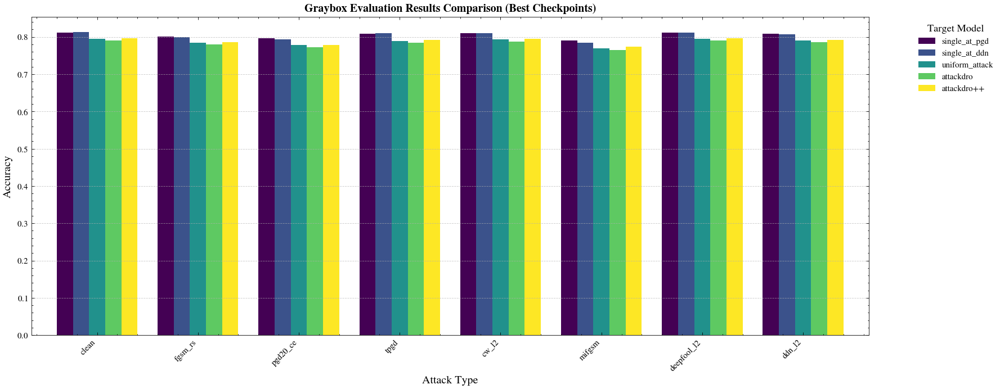

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the saved results
csv_path = '/content/drive/MyDrive/ardg_project/final_results/graybox_evaluation_results.csv'
results_df = pd.read_csv(csv_path)

# Filter for 'best' checkpoints to keep the plot clean
df_best = results_df[results_df['ckpt_type'] == 'best'].copy()

# Set target_model as index for easier plotting
df_best.set_index('target_model', inplace=True)
df_best = df_best.drop(columns=['ckpt_type'])

# Clean up column names (remove 'graybox_acc/')
df_best.columns = [col.replace('graybox_acc/', '') for col in df_best.columns]

# Plot grouped bar chart
ax = df_best.T.plot(kind='bar', figsize=(15, 6), width=0.8, colormap='viridis')

plt.title('Graybox Evaluation Results Comparison (Best Checkpoints)', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12)
plt.xlabel('Attack Type', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Target Model', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
import os
from pathlib import Path
import pandas as pd

# Define the new surrogate models (PGD and DDN single AT models)
NEW_SURROGATES = [
    ("surrogate_pgd", f"{_BASE}/single_at_pgd_linf/single_at_pgd_linf_seed42/single_at_pgd_linf_seed42_best.pt"),
    ("surrogate_ddn", f"{_BASE}/single_at_ddn_l2/single_at_ddn_l2_seed42/single_at_ddn_l2_seed42_best.pt")
]

# Re-build test loader from existing config
_, _, test_loader = build_dataloaders(SURROGATE_CFG)

for surr_name, surr_ckpt in NEW_SURROGATES:
    print(f"\n" + "="*80)
    print(f"🚀 Starting Graybox Evaluation with Surrogate: {surr_name}")
    print("="*80)

    # 1. Load the surrogate model
    surrogate_model = build_model(SURROGATE_CFG).to(DEVICE)

    if not Path(surr_ckpt).exists():
        print(f"⚠️ Surrogate model not found: {surr_ckpt}")
        continue

    load_checkpoint(surr_ckpt, surrogate_model)
    print(f"✅ Loaded surrogate model: {Path(surr_ckpt).name}")

    # 2. Create a unique cache directory to avoid overwriting the baseline cache
    surr_cache_dir = Path(CACHE_DIR) / surr_name
    surr_cache_dir.mkdir(parents=True, exist_ok=True)

    # 3. Generate or load cached adversarial examples from THIS surrogate
    print(f"⚙️ Getting cached adversarial images from {surr_name}...")
    cached_data = get_or_generate_graybox_dataset(
        surrogate_model, test_loader, GRAYBOX_ATTACKS, SURROGATE_CFG, surr_cache_dir
    )

    # 4. Evaluate all target models
    df_results = run_graybox_eval(
        surrogate_cfg=SURROGATE_CFG,
        cached_data=cached_data,
        eval_jobs=EVAL_JOBS
    )

    # 5. Save and display results
    if not df_results.empty:
        display(df_results)
        csv_path = Path(_BASE) / f"graybox_evaluation_results_{surr_name}.csv"
        df_results.to_csv(csv_path, index=False)
        print(f"✅ Saved graybox results for {surr_name} to: {csv_path}")


In [ ]:
import os
from pathlib import Path
import pandas as pd

# Define the additional surrogate models (Uniform, AttackDRO, and AttackDRO++)
MORE_SURROGATES = [
    ("surrogate_uniform", f"{_BASE}/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/multi_attack_pgd_linf_ddn_l2_mb_seed42_best.pt"),
    ("surrogate_attackdro", f"{_BASE}/attackdro/attackdro_pgd_linf_ddn_l2_mb_seed42/attackdro_pgd_linf_ddn_l2_mb_seed42_best.pt"),
    ("surrogate_attackdro_pp", f"{_BASE}/attackdro++/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42/attackdro++_pgd_linf_ddn_l2_mb_k4_seed42_best.pt")
]

for surr_name, surr_ckpt in MORE_SURROGATES:
    print(f"\n" + "="*80)
    print(f"🚀 Starting Graybox Evaluation with Surrogate: {surr_name}")
    print("="*80)

    # 1. Load the surrogate model
    surrogate_model = build_model(SURROGATE_CFG).to(DEVICE)

    if not Path(surr_ckpt).exists():
        print(f"⚠️ Surrogate model not found: {surr_ckpt}")
        continue

    load_checkpoint(surr_ckpt, surrogate_model)
    print(f"✅ Loaded surrogate model: {Path(surr_ckpt).name}")

    # 2. Create a unique cache directory to avoid overwriting the baseline cache
    surr_cache_dir = Path(CACHE_DIR) / surr_name
    surr_cache_dir.mkdir(parents=True, exist_ok=True)

    # 3. Generate or load cached adversarial examples from THIS surrogate
    print(f"⚙️ Getting cached adversarial images from {surr_name}...")
    cached_data = get_or_generate_graybox_dataset(
        surrogate_model, test_loader, GRAYBOX_ATTACKS, SURROGATE_CFG, surr_cache_dir
    )

    # 4. Evaluate all target models
    df_results = run_graybox_eval(
        surrogate_cfg=SURROGATE_CFG,
        cached_data=cached_data,
        eval_jobs=EVAL_JOBS
    )

    # 5. Save and display results
    if not df_results.empty:
        display(df_results)
        csv_path = Path(_BASE) / f"graybox_evaluation_results_{surr_name}.csv"
        df_results.to_csv(csv_path, index=False)
        print(f"✅ Saved graybox results for {surr_name} to: {csv_path}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Map surrogate file names to the target model names used in EVAL_JOBS
surrogate_to_target = {
    "surrogate_pgd": "single_at_pgd",
    "surrogate_ddn": "single_at_ddn",
    "surrogate_uniform": "uniform_attack",
    "surrogate_attackdro": "attackdro",
    "surrogate_attackdro_pp": "attackdro++"
}

# Choose which attacks to generate transfer matrices for
attacks_to_plot = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "ddn_l2"]

transfer_matrices = {}

# Define a directory to save the outputs
save_dir = Path(_BASE) / "graybox_transfer_matrices"
save_dir.mkdir(parents=True, exist_ok=True)

for attack in attacks_to_plot:
    # Initialize an empty matrix (Rows: Surrogate/Source, Cols: Target)
    model_names = list(surrogate_to_target.values())
    matrix = pd.DataFrame(index=model_names, columns=model_names, dtype=float)

    for surr_file_name, source_name in surrogate_to_target.items():
        csv_file = Path(_BASE) / f"graybox_evaluation_results_{surr_file_name}.csv"
        if csv_file.exists():
            df = pd.read_csv(csv_file)

            # Filter for 'best' checkpoint
            df_best = df[df['ckpt_type'] == 'last']

            # Fill the row corresponding to this surrogate (source)
            for _, row in df_best.iterrows():
                tgt_name = row['target_model']
                col_name = f"graybox_acc/{attack}"
                if tgt_name in matrix.columns and col_name in row:
                    matrix.at[source_name, tgt_name] = row[col_name]

    transfer_matrices[attack] = matrix

    # Calculate off-diagonal average (Graybox Robustness)
    # Mask the diagonal with NaN so it doesn't affect the mean
    off_diag = matrix.where(~np.eye(matrix.shape[0], dtype=bool))
    graybox_robustness = off_diag.mean(axis=0)

    # Save matrices and robustness to CSV
    matrix.to_csv(save_dir / f"transfer_matrix_{attack}.csv")
    pd.DataFrame(graybox_robustness, columns=['Graybox Avg Acc']).to_csv(save_dir / f"graybox_robustness_{attack}.csv")

    # Print and Display
    print(f"\n{'='*70}")
    print(f"Transfer Matrix for Attack: {attack}")
    print(f"{'='*70}")
    display(matrix)

    print(f"\nOff-Diagonal Average (Graybox Robustness) for {attack}:")
    display(pd.DataFrame(graybox_robustness, columns=['Graybox Avg Acc']))

    # Plotting the Transfer Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix, annot=True, fmt=".4f", cmap="YlGnBu", cbar_kws={'label': 'Accuracy'})
    plt.title(f"Transfer Matrix: {attack}\nRow: Surrogate (Source), Column: Target", fontsize=12)
    plt.ylabel("Surrogate Model (Source)")
    plt.xlabel("Target Model")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    # Save figure
    plt.savefig(save_dir / f"transfer_matrix_{attack}.png", dpi=160, bbox_inches="tight")
    plt.show()

print(f"\n✅ All figures and tables have been saved to: {save_dir}")

NameError: name '_BASE' is not defined

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Map surrogate file names to the target model names used in EVAL_JOBS
surrogate_to_target = {
    "surrogate_pgd": "single_at_pgd",
    "surrogate_ddn": "single_at_ddn",
    "surrogate_uniform": "uniform_attack",
    "surrogate_attackdro": "attackdro",
    "surrogate_attackdro_pp": "attackdro++"
}

# Choose which attacks to generate transfer matrices for
attacks_to_plot = ["clean", "fgsm_rs", "pgd20_ce", "tpgd", "cw_l2", "mifgsm", "deepfool_l2", "ddn_l2"]

transfer_matrices = {}

# Define a directory to save the outputs
save_dir = Path(_BASE) / "graybox_transfer_matrices"
save_dir.mkdir(parents=True, exist_ok=True)

for attack in attacks_to_plot:
    # Initialize an empty matrix (Rows: Surrogate/Source, Cols: Target)
    model_names = list(surrogate_to_target.values())
    matrix = pd.DataFrame(index=model_names, columns=model_names, dtype=float)

    for surr_file_name, source_name in surrogate_to_target.items():
        csv_file = Path(_BASE) / f"graybox_evaluation_results_{surr_file_name}.csv"
        if csv_file.exists():
            df = pd.read_csv(csv_file)

            # Filter for 'best' checkpoint
            df_best = df[df['ckpt_type'] == 'best']

            # Fill the row corresponding to this surrogate (source)
            for _, row in df_best.iterrows():
                tgt_name = row['target_model']
                col_name = f"graybox_acc/{attack}"
                if tgt_name in matrix.columns and col_name in row:
                    matrix.at[source_name, tgt_name] = row[col_name]

    transfer_matrices[attack] = matrix

    # Calculate off-diagonal average (Graybox Robustness)
    # Mask the diagonal with NaN so it doesn't affect the mean
    off_diag = matrix.where(~np.eye(matrix.shape[0], dtype=bool))
    graybox_robustness = off_diag.mean(axis=0)

    # Save matrices and robustness to CSV
    matrix.to_csv(save_dir / f"transfer_matrix_{attack}.csv")
    pd.DataFrame(graybox_robustness, columns=['Graybox Avg Acc']).to_csv(save_dir / f"graybox_robustness_{attack}.csv")

    # Print and Display
    print(f"\n{'='*70}")
    print(f"Transfer Matrix for Attack: {attack}")
    print(f"{'='*70}")
    display(matrix)

    print(f"\nOff-Diagonal Average (Graybox Robustness) for {attack}:")
    display(pd.DataFrame(graybox_robustness, columns=['Graybox Avg Acc']))

    # Plotting the Transfer Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix, annot=True, fmt=".4f", cmap="YlGnBu", cbar_kws={'label': 'Accuracy'})
    plt.title(f"Transfer Matrix: {attack}\nRow: Surrogate (Source), Column: Target", fontsize=12)
    plt.ylabel("Surrogate Model (Source)")
    plt.xlabel("Target Model")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    # Save figure
    plt.savefig(save_dir / f"transfer_matrix_{attack}.png", dpi=160, bbox_inches="tight")
    plt.show()

print(f"\n✅ All figures and tables have been saved to: {save_dir}")

NameError: name '_BASE' is not defined

# §32 — WideResNet + 3-source-attack configs


In [ ]:


# ── helper: base WRN config ────────────────────────────────────────────────────
def make_wrn_cfg(method_cfg, backbone="wrn_28_10", suffix="wrn2810"):
    """Deep-copy any existing cfg and switch it to WRN backbone."""
    c = copy.deepcopy(method_cfg)
    c.backbone        = backbone
    c.epochs          = 50
    c.scheduler_milestones = [30, 40]
    c.amp             = True
    c.grad_clip_norm  = 1.0
    c.lr              = 0.1
    c.weight_decay    = 5e-4
    c.experiment_name = c.experiment_name.replace("resnet18", suffix).replace("cifar10_rn18", f"cifar10_{suffix}")
    c.wandb_run_name  = c.experiment_name
    c.wandb_tags      = list(c.wandb_tags) + [backbone, "wrn"]
    return c

In [ ]:


# ── 1. Uniform multi-AT + WRN (comparison baseline) ──────────────────────────
cfg_uniform_wrn = make_wrn_cfg(cfg_multi_attack_pgd_linf_ddn_l2_mb)
cfg_uniform_wrn.experiment_name = "uniform_pgd_ddn_wrn2810_cifar10"
cfg_uniform_wrn.wandb_run_name  = "uniform_pgd_ddn_wrn2810_cifar10"

# ── 2. AttackDRO++ v2 + WRN ───────────────────────────────────────────────────
cfg_pp_v2_wrn = make_wrn_cfg(cfg_attack_pp_v2)
cfg_pp_v2_wrn.experiment_name = "attackdro_pp_v2_k4_wrn2810_cifar10"
cfg_pp_v2_wrn.wandb_run_name  = "attackdro_pp_v2_k4_wrn2810_cifar10"

# ── 3. GradFP-online + WRN ────────────────────────────────────────────────────
cfg_gradfp_online_wrn = make_wrn_cfg(cfg_pp_gradfp_online)
cfg_gradfp_online_wrn.experiment_name = "attackdro_pp_gradfp_online_k4_wrn2810_cifar10"
cfg_gradfp_online_wrn.wandb_run_name  = "attackdro_pp_gradfp_online_k4_wrn2810_cifar10"

# ── 4. 3-source-attack: pgd + ddn + superdeepfool (ResNet-18) ────────────────
cfg_pp_3atk_rn18 = copy.deepcopy(cfg_attack_pp_v2)
cfg_pp_3atk_rn18.source_attack_names = ["pgd20_ce", "ddn_l2", "superdeepfool_l2"]
# heldout: remove sdf since it's now source
cfg_pp_3atk_rn18.heldout_attack_names = ["tpgd", "cw_l2", "mifgsm"]
# q_floor: 1/(3*4*4) = 0.021
cfg_pp_3atk_rn18.groupdro_q_floor    = 0.02
cfg_pp_3atk_rn18.experiment_name     = "attackdro_pp_v2_3atk_k4_cifar10_rn18"
cfg_pp_3atk_rn18.wandb_run_name      = "attackdro_pp_v2_3atk_k4_cifar10_rn18"
cfg_pp_3atk_rn18.wandb_tags          = ["attackdro_plus", "3attacks", "superdeepfool", "k4"]

# ── 5. 3-source-attack + WRN ──────────────────────────────────────────────────
cfg_pp_3atk_wrn = make_wrn_cfg(cfg_pp_3atk_rn18)
cfg_pp_3atk_wrn.experiment_name = "attackdro_pp_v2_3atk_k4_wrn2810_cifar10"
cfg_pp_3atk_wrn.wandb_run_name  = "attackdro_pp_v2_3atk_k4_wrn2810_cifar10"

# ── calibration check ─────────────────────────────────────────────────────────
print("WRN + 3-attack configs:")
for c in [cfg_uniform_wrn, cfg_pp_v2_wrn, cfg_gradfp_online_wrn,
          cfg_pp_3atk_rn18, cfg_pp_3atk_wrn]:
    ratio = check_eta_q_calibration(c, verbose=False)
    print(f"  {c.experiment_name[:55]:55}  backbone={c.backbone:12}"
          f"  attacks={len(c.source_attack_names)}  q_ratio≈{ratio:.1f}x")

# ── run order ─────────────────────────────────────────────────────────────────
# Priority 1: WRN baseline vs AttackDRO++ (answers the capacity question)
# out_uniform_wrn   = run_training(cfg_uniform_wrn)
# out_pp_v2_wrn     = run_training(cfg_pp_v2_wrn)

# Priority 2: 3-attack ResNet-18 (answers the deepfool gap question)
# out_3atk_rn18     = run_training(cfg_pp_3atk_rn18)

# Priority 3: GradFP + WRN (best combination)
# out_gradfp_wrn    = run_training(cfg_gradfp_online_wrn)

# Priority 4: 3-attack + WRN (everything combined)
# out_3atk_wrn      = run_training(cfg_pp_3atk_wrn)

NameError: name 'cfg_attack_pp_v2' is not defined

In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_133 = False
if RUN_LEGACY_CELL_133:
    # Priority 1: WRN baseline vs AttackDRO++ (answers the capacity question)
    out_uniform_wrn   = run_training(cfg_uniform_wrn)
    out_pp_v2_wrn     = run_training(cfg_pp_v2_wrn)
else:
    print("Legacy direct-run cell 133 is disabled. Use section 17.7 final experiment launchers.")



════════════════════════════════════════════════════════════════════════
  📋  Training Configuration
════════════════════════════════════════════════════════════════════════

  [Experiment]
    experiment_name                                uniform_pgd_ddn_wrn2810_cifar10
    method                                         multi_attack_online_uniform
    dataset_name                                   cifar10
    backbone                                       wrn_28_10

  [Training]
    epochs                                         50
    batch_size                                     128
    lr                                             0.1
    weight_decay                                   0.0005
    momentum                                       0.9
    scheduler                                      multistep
    scheduler_milestones                           [30, 40]
    amp                                            True
    grad_clip_norm                                 1.0
    

  🟢 W&B  run=uniform_pgd_ddn_wrn2810_cifar10  url=https://wandb.ai/kietna-ho-chi-minh-city-university-of-technology/ardg/runs/pjpsu2vq

     Ep      Loss   AdvAcc  │     Worst       Avg     Clean  │         LR      T      qH
  ───────────────────────────────────────────────────────────────────────────────────


  Train E0:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [000/049]  loss=2.0526  adv_acc=0.217  │  worst=0.0722  avg=0.1535  clean=0.4354  │  lr=0.10000  t=298s ✓


  Train E1:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [001/049]  loss=1.8441  adv_acc=0.279  │  worst=0.0579  avg=0.1500  clean=0.4900  │  lr=0.10000  t=301s


  Train E2:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [002/049]  loss=1.7324  adv_acc=0.315  │  worst=0.0589  avg=0.1588  clean=0.5088  │  lr=0.10000  t=301s


  Train E3:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [003/049]  loss=1.6588  adv_acc=0.339  │  worst=0.0654  avg=0.1703  clean=0.5407  │  lr=0.10000  t=301s


  Train E4:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [004/049]  loss=1.6035  adv_acc=0.366  │  worst=0.0772  avg=0.1957  clean=0.6234  │  lr=0.10000  t=301s ✓


  Train E5:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [005/049]  loss=1.5551  adv_acc=0.382  │  worst=0.0852  avg=0.2117  clean=0.6296  │  lr=0.10000  t=301s ✓


  Train E6:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [006/049]  loss=1.5271  adv_acc=0.391  │  worst=0.0690  avg=0.2026  clean=0.6412  │  lr=0.10000  t=301s


  Train E7:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [007/049]  loss=1.5002  adv_acc=0.402  │  worst=0.0634  avg=0.2044  clean=0.6784  │  lr=0.10000  t=301s


  Train E8:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [008/049]  loss=1.4755  adv_acc=0.407  │  worst=0.0623  avg=0.2036  clean=0.6578  │  lr=0.10000  t=301s


  Train E9:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [009/049]  loss=1.4515  adv_acc=0.413  │  worst=0.0803  avg=0.2136  clean=0.6654  │  lr=0.10000  t=301s


  Train E10:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [010/049]  loss=1.4257  adv_acc=0.426  │  worst=0.0684  avg=0.2180  clean=0.6901  │  lr=0.10000  t=301s


  Train E11:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [011/049]  loss=1.4157  adv_acc=0.425  │  worst=0.0785  avg=0.2247  clean=0.6615  │  lr=0.10000  t=301s


  Train E12:   0%|          | 0/313 [00:00<?, ?it/s]

epoch,▁▂▂▃▄▄▅▅▆▇▇█
lr,▁▁▁▁▁▁▁▁▁▁▁▁
runtime_sec,▁▇▇▇▇▇▇▇▇█▇▇
train_adv_acc,▁▃▄▅▆▇▇▇▇███
train_loss,█▆▄▄▃▃▂▂▂▁▁▁
train_step,▁▂▂▃▄▄▅▅▆▇▇█
val_clean_acc,▁▃▃▄▆▆▇█▇▇█▇
val_robust_acc/ddn_l2,▅▁▁▃▆█▄▂▂▇▄▆
val_robust_acc/pgd20_ce,▁▁▂▃▅▆▆▇▇▇██
val_seen_avg_robust_acc,▁▁▂▃▅▇▆▆▆▇▇█
+1,...


  🏁 W&B run finished.


KeyboardInterrupt: 

In [ ]:
import json
from pathlib import Path
from dataclasses import fields
import pandas as pd

# ── Paths ─────────────────────────────────────────────────────
config_path = "/content/drive/MyDrive/ardg_project/final_results/single_at_pgd_linf/single_at_pgd_linf_seed42/config.json"
ckpt_path   = "/content/drive/MyDrive/ardg_project/final_results/single_at_pgd_linf/single_at_pgd_linf_seed42/single_at_pgd_linf_seed42_best.pt"

# ── 1) Load exact saved config ────────────────────────────────
with open(config_path, "r") as f:
    cfg_raw = json.load(f)

# keep only valid TrainConfig fields
valid_keys = {f.name for f in fields(TrainConfig)}
cfg_dict = {k: v for k, v in cfg_raw.items() if k in valid_keys}

# restore nested dataclass if needed
if isinstance(cfg_dict.get("early_stopping"), dict):
    cfg_dict["early_stopping"] = EarlyStoppingConfig(**cfg_dict["early_stopping"])

eval_cfg = TrainConfig(**cfg_dict)

# ── 2) Override ONLY evaluation protocol to new bounded-L2 suite ──
eval_cfg.eval_attack_names = [
    "clean",
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "autoattack_linf",
    "pgd_l2",
    "cw_l2",
    "deepfool_l2",
    "ddn_l2",
]
eval_cfg.autoattack_eval_n = 512   # set 512 if you want faster eval
eval_cfg.wandb_enabled = False
eval_cfg.skip_final_eval = False

print_config_summary(eval_cfg, title="Re-eval config (new bounded-L2 protocol)")

# ── 3) Build test loader ──────────────────────────────────────
_, _, test_loader = build_dataloaders(eval_cfg)

# ── 4) Build model and load checkpoint ────────────────────────
model_eval = build_model(eval_cfg).to(DEVICE)
print(f"  ⬇️ Loading checkpoint from: {ckpt_path}")
load_checkpoint(ckpt_path, model_eval)

# ── 5) Evaluate ───────────────────────────────────────────────
print_section(f"📊 Final Test-Set Evaluation ({Path(ckpt_path).stem} under NEW bounded-L2 protocol)")

orig_cw = ATTACK_SPECS["cw_l2"].steps
ATTACK_SPECS["cw_l2"].steps = 200   # match your notebook final-eval budget

final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

ATTACK_SPECS["cw_l2"].steps = orig_cw

# ── 6) Print + save ───────────────────────────────────────────
print_final_eval_table(final_eval_res, Path(ckpt_path).stem + " (re-eval bounded L2)")

save_dir = Path("/content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2")
save_dir.mkdir(parents=True, exist_ok=True)

json_path = save_dir / f"{Path(ckpt_path).stem}_bounded_l2_eval.json"
csv_path  = save_dir / f"{Path(ckpt_path).stem}_bounded_l2_eval.csv"

with open(json_path, "w") as f:
    json.dump({k: v for k, v in final_eval_res.items() if k != "detailed"}, f, indent=2)

df = pd.DataFrame(
    [{"attack": k, "acc": float(v)} for k, v in final_eval_res["per_attack"].items()]
).sort_values("acc", ascending=False)

display(df)
df.to_csv(csv_path, index=False)

print(f"\n💾 Saved JSON to: {json_path}")
print(f"💾 Saved CSV  to: {csv_path}")


════════════════════════════════════════════════════════════════════════
  📋  Re-eval config (new bounded-L2 protocol)
════════════════════════════════════════════════════════════════════════

  [Experiment]
    experiment_name                                single_at_pgd_linf_seed42
    method                                         single_at
    dataset_name                                   cifar10
    backbone                                       resnet18

  [Training]
    epochs                                         50
    batch_size                                     128
    lr                                             0.1
    weight_decay                                   0.0005
    momentum                                       0.9
    scheduler                                      multistep
    scheduler_milestones                           [30, 40]
    amp                                            False
    grad_clip_norm                                 1.0
    source

  Eval [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [autoattack_linf]:   0%|          | 0/79 [00:00<?, ?it/s]

setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 79.69%
apgd-ce - 1/2 - 28 out of 64 successfully perturbed
apgd-ce - 2/2 - 13 out of 38 successfully perturbed
robust accuracy after APGD-CE: 47.66% (total time 0.8 s)
apgd-t - 1/1 - 4 out of 61 successfully perturbed
robust accuracy after APGD-T: 44.53% (total time 4.9 s)
fab-t - 1/1 - 0 out of 57 successfully perturbed
robust accuracy after FAB-T: 44.53% (total time 14.1 s)
square - 1/1 - 0 out of 57 successfully perturbed
robust accuracy after SQUARE: 44.53% (total time 25.7 s)
max Linf perturbation: 0.03137, nan in tensor: 0, max: 1.00000, min: 0.00000
robust accuracy: 44.53%
setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 83.59%
apgd-ce - 1/2 - 32 out of 64 successfully perturbed
apgd-ce - 2/2 - 15 out of 43 successfully perturbed
robust accuracy after APGD-CE: 46.88% (total time 0.7 s)

  Eval [pgd_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]


════════════════════════════════════════════════════════════════════════
  🏁  Final Test-Set Evaluation  —  single_at_pgd_linf_seed42_best (re-eval bounded L2)
════════════════════════════════════════════════════════════════════════
  Attack                           Acc  Histogram
  ──────────────────────────  ────────  ──────────────────────
  tpgd                          0.6857  ███████████████
  fgsm_rs                       0.6816  ███████████████
  pgd_l2                        0.6454  ██████████████
  deepfool_l2                   0.6256  ██████████████
  ddn_l2                        0.6048  █████████████
  cw_l2                         0.5914  █████████████
  mifgsm                        0.5165  ███████████
  pgd20_ce                      0.4990  ███████████
  autoattack_linf               0.4570  ██████████

  Worst robust : 0.4570   Mean robust : 0.5897



,attack,acc
0,clean,0.812100
3,tpgd,0.685700
1,fgsm_rs,0.681600
6,pgd_l2,0.645400
8,deepfool_l2,0.625600
9,ddn_l2,0.604800
7,cw_l2,0.591400
4,mifgsm,0.516500
2,pgd20_ce,0.499000
5,autoattack_linf,0.457031



💾 Saved JSON to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/single_at_pgd_linf_seed42_best_bounded_l2_eval.json
💾 Saved CSV  to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/single_at_pgd_linf_seed42_best_bounded_l2_eval.csv


In [ ]:
import json
from pathlib import Path
from dataclasses import fields
import pandas as pd

# ── Paths ─────────────────────────────────────────────────────
config_path = "/content/drive/MyDrive/ardg_project/results/attackdro_pp_gradfp_online_k4_cifar10_rn18/config.json"
ckpt_path   = "/content/drive/MyDrive/ardg_project/checkpoints/attackdro_pp_gradfp_online_k4_cifar10_rn18_best.pt"

# ── 1) Load exact saved config ────────────────────────────────
with open(config_path, "r") as f:
    cfg_raw = json.load(f)

valid_keys = {f.name for f in fields(TrainConfig)}
cfg_dict = {k: v for k, v in cfg_raw.items() if k in valid_keys}

if isinstance(cfg_dict.get("early_stopping"), dict):
    cfg_dict["early_stopping"] = EarlyStoppingConfig(**cfg_dict["early_stopping"])

eval_cfg = TrainConfig(**cfg_dict)

# ── 2) Override ONLY evaluation protocol to new bounded-L2 suite ──
eval_cfg.eval_attack_names = [
    "clean",
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "autoattack_linf",
    "pgd_l2",
    "cw_l2",
    "deepfool_l2",
    "ddn_l2",
]
eval_cfg.autoattack_eval_n = 512   # set 512 if you want faster eval
eval_cfg.wandb_enabled = False
eval_cfg.skip_final_eval = False

print_config_summary(eval_cfg, title="Re-eval config (new bounded-L2 protocol)")

# ── 3) Build test loader ──────────────────────────────────────
_, _, test_loader = build_dataloaders(eval_cfg)

# ── 4) Build model and load checkpoint ────────────────────────
model_eval = build_model(eval_cfg).to(DEVICE)
print(f"  ⬇️ Loading checkpoint from: {ckpt_path}")
load_checkpoint(ckpt_path, model_eval)

# ── 5) Evaluate ───────────────────────────────────────────────
print_section(f"📊 Final Test-Set Evaluation ({Path(ckpt_path).stem} under NEW bounded-L2 protocol)")

orig_cw = ATTACK_SPECS["cw_l2"].steps
ATTACK_SPECS["cw_l2"].steps = 200   # match your notebook final-eval budget

final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

ATTACK_SPECS["cw_l2"].steps = orig_cw

# ── 6) Print + save ───────────────────────────────────────────
print_final_eval_table(final_eval_res, Path(ckpt_path).stem + " (re-eval bounded L2)")

save_dir = Path("/content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2")
save_dir.mkdir(parents=True, exist_ok=True)

json_path = save_dir / f"{Path(ckpt_path).stem}_bounded_l2_eval.json"
csv_path  = save_dir / f"{Path(ckpt_path).stem}_bounded_l2_eval.csv"

with open(json_path, "w") as f:
    json.dump({k: v for k, v in final_eval_res.items() if k != "detailed"}, f, indent=2)

df = pd.DataFrame(
    [{"attack": k, "acc": float(v)} for k, v in final_eval_res["per_attack"].items()]
).sort_values("acc", ascending=False)

display(df)
df.to_csv(csv_path, index=False)

print(f"\n💾 Saved JSON to: {json_path}")
print(f"💾 Saved CSV  to: {csv_path}")


════════════════════════════════════════════════════════════════════════
  📋  Re-eval config (new bounded-L2 protocol)
════════════════════════════════════════════════════════════════════════

  [Experiment]
    experiment_name                                attackdro_pp_gradfp_online_k4_cifar10_rn18
    method                                         groupdro_cluster_online_difficulty
    dataset_name                                   cifar10
    backbone                                       resnet18

  [Training]
    epochs                                         50
    batch_size                                     128
    lr                                             0.1
    weight_decay                                   0.0005
    momentum                                       0.9
    scheduler                                      multistep
    scheduler_milestones                           [30, 40]
    amp                                            True
    grad_clip_norm      

  Eval [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [autoattack_linf]:   0%|          | 0/79 [00:00<?, ?it/s]

setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 85.16%
apgd-ce - 1/2 - 39 out of 64 successfully perturbed
apgd-ce - 2/2 - 23 out of 45 successfully perturbed
robust accuracy after APGD-CE: 36.72% (total time 0.7 s)
apgd-t - 1/1 - 2 out of 47 successfully perturbed
robust accuracy after APGD-T: 35.16% (total time 3.9 s)
fab-t - 1/1 - 0 out of 45 successfully perturbed
robust accuracy after FAB-T: 35.16% (total time 11.6 s)
square - 1/1 - 0 out of 45 successfully perturbed
robust accuracy after SQUARE: 35.16% (total time 20.6 s)
max Linf perturbation: 0.03137, nan in tensor: 0, max: 1.00000, min: 0.00000
robust accuracy: 35.16%
setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 84.38%
apgd-ce - 1/2 - 33 out of 64 successfully perturbed
apgd-ce - 2/2 - 20 out of 44 successfully perturbed
robust accuracy after APGD-CE: 42.97% (total time 0.7 s)

  Eval [pgd_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]


════════════════════════════════════════════════════════════════════════
  🏁  Final Test-Set Evaluation  —  attackdro_pp_gradfp_online_k4_cifar10_rn18_best (re-eval bounded L2)
════════════════════════════════════════════════════════════════════════
  Attack                           Acc  Histogram
  ──────────────────────────  ────────  ──────────────────────
  pgd_l2                        0.6945  ███████████████
  fgsm_rs                       0.6855  ███████████████
  deepfool_l2                   0.6728  ███████████████
  ddn_l2                        0.6684  ███████████████
  tpgd                          0.6653  ███████████████
  cw_l2                         0.6491  ██████████████
  mifgsm                        0.4681  ██████████
  pgd20_ce                      0.4449  ██████████
  autoattack_linf               0.3887  █████████

  Worst robust : 0.3887   Mean robust : 0.5930



,attack,acc
0,clean,0.844300
6,pgd_l2,0.694500
1,fgsm_rs,0.685500
8,deepfool_l2,0.672800
9,ddn_l2,0.668400
3,tpgd,0.665300
7,cw_l2,0.649100
4,mifgsm,0.468100
2,pgd20_ce,0.444900
5,autoattack_linf,0.388672



💾 Saved JSON to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/attackdro_pp_gradfp_online_k4_cifar10_rn18_best_bounded_l2_eval.json
💾 Saved CSV  to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/attackdro_pp_gradfp_online_k4_cifar10_rn18_best_bounded_l2_eval.csv


In [ ]:
import json
from pathlib import Path
from dataclasses import fields
import pandas as pd

# ── Paths ─────────────────────────────────────────────────────
config_path = "/content/drive/MyDrive/ardg_project/final_results/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/config.json"
ckpt_path   = "/content/drive/MyDrive/ardg_project/final_results/uniform_multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed42/multi_attack_pgd_linf_ddn_l2_mb_seed42_best.pt"

# ── 1) Load exact saved config ────────────────────────────────
with open(config_path, "r") as f:
    cfg_raw = json.load(f)

valid_keys = {f.name for f in fields(TrainConfig)}
cfg_dict = {k: v for k, v in cfg_raw.items() if k in valid_keys}

if isinstance(cfg_dict.get("early_stopping"), dict):
    cfg_dict["early_stopping"] = EarlyStoppingConfig(**cfg_dict["early_stopping"])

eval_cfg = TrainConfig(**cfg_dict)

# ── 2) Override ONLY evaluation protocol to new bounded-L2 suite ──
eval_cfg.eval_attack_names = [
    "clean",
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "autoattack_linf",
    "pgd_l2",
    "cw_l2",
    "deepfool_l2",
    "ddn_l2",
]

eval_cfg.autoattack_eval_n = 512   # set 512 if you want faster eval
eval_cfg.wandb_enabled = False
eval_cfg.skip_final_eval = False

print_config_summary(eval_cfg, title="Re-eval config (new bounded-L2 protocol)")

# ── 3) Build test loader ──────────────────────────────────────
_, _, test_loader = build_dataloaders(eval_cfg)

# ── 4) Build model and load checkpoint ────────────────────────
model_eval = build_model(eval_cfg).to(DEVICE)
print(f"  ⬇️ Loading checkpoint from: {ckpt_path}")
load_checkpoint(ckpt_path, model_eval)

# ── 5) Evaluate ───────────────────────────────────────────────
print_section(f"📊 Final Test-Set Evaluation ({Path(ckpt_path).stem} under NEW bounded-L2 protocol)")

orig_cw = ATTACK_SPECS["cw_l2"].steps
ATTACK_SPECS["cw_l2"].steps = 200   # match your notebook final-eval budget

final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

ATTACK_SPECS["cw_l2"].steps = orig_cw

# ── 6) Print + save ───────────────────────────────────────────
print_final_eval_table(final_eval_res, Path(ckpt_path).stem + " (re-eval bounded L2)")

save_dir = Path("/content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2")
save_dir.mkdir(parents=True, exist_ok=True)

json_path = save_dir / f"{Path(ckpt_path).stem}_bounded_l2_eval.json"
csv_path  = save_dir / f"{Path(ckpt_path).stem}_bounded_l2_eval.csv"

with open(json_path, "w") as f:
    json.dump({k: v for k, v in final_eval_res.items() if k != "detailed"}, f, indent=2)

df = pd.DataFrame(
    [{"attack": k, "acc": float(v)} for k, v in final_eval_res["per_attack"].items()]
).sort_values("acc", ascending=False)

display(df)
df.to_csv(csv_path, index=False)

print(f"\n💾 Saved JSON to: {json_path}")
print(f"💾 Saved CSV  to: {csv_path}")


════════════════════════════════════════════════════════════════════════
  📋  Re-eval config (new bounded-L2 protocol)
════════════════════════════════════════════════════════════════════════

  [Experiment]
    experiment_name                                multi_attack_pgd_linf_ddn_l2_mb_seed42
    method                                         multi_attack_online_uniform
    dataset_name                                   cifar10
    backbone                                       resnet18

  [Training]
    epochs                                         50
    batch_size                                     128
    lr                                             0.1
    weight_decay                                   0.0005
    momentum                                       0.9
    scheduler                                      multistep
    scheduler_milestones                           [30, 40]
    amp                                            False
    grad_clip_norm                

  Eval [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [autoattack_linf]:   0%|          | 0/79 [00:00<?, ?it/s]

setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 81.25%
apgd-ce - 1/2 - 33 out of 64 successfully perturbed
apgd-ce - 2/2 - 17 out of 40 successfully perturbed
robust accuracy after APGD-CE: 42.19% (total time 0.7 s)
apgd-t - 1/1 - 5 out of 54 successfully perturbed
robust accuracy after APGD-T: 38.28% (total time 4.1 s)
fab-t - 1/1 - 0 out of 49 successfully perturbed
robust accuracy after FAB-T: 38.28% (total time 12.3 s)
square - 1/1 - 0 out of 49 successfully perturbed
robust accuracy after SQUARE: 38.28% (total time 21.8 s)
max Linf perturbation: 0.03137, nan in tensor: 0, max: 1.00000, min: 0.00000
robust accuracy: 38.28%
setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 79.69%
apgd-ce - 1/2 - 30 out of 64 successfully perturbed
apgd-ce - 2/2 - 15 out of 38 successfully perturbed
robust accuracy after APGD-CE: 44.53% (total time 0.7 s)

  Eval [pgd_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]


════════════════════════════════════════════════════════════════════════
  🏁  Final Test-Set Evaluation  —  multi_attack_pgd_linf_ddn_l2_mb_seed42_best (re-eval bounded L2)
════════════════════════════════════════════════════════════════════════
  Attack                           Acc  Histogram
  ──────────────────────────  ────────  ──────────────────────
  pgd_l2                        0.6831  ███████████████
  tpgd                          0.6729  ███████████████
  ddn_l2                        0.6716  ███████████████
  deepfool_l2                   0.6623  ███████████████
  cw_l2                         0.6587  ██████████████
  fgsm_rs                       0.6473  ██████████████
  mifgsm                        0.4793  ███████████
  pgd20_ce                      0.4694  ██████████
  autoattack_linf               0.4023  █████████

  Worst robust : 0.4023   Mean robust : 0.5941



,attack,acc
0,clean,0.795300
6,pgd_l2,0.683100
3,tpgd,0.672900
9,ddn_l2,0.671600
8,deepfool_l2,0.662300
7,cw_l2,0.658700
1,fgsm_rs,0.647300
4,mifgsm,0.479300
2,pgd20_ce,0.469400
5,autoattack_linf,0.402344



💾 Saved JSON to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/multi_attack_pgd_linf_ddn_l2_mb_seed42_best_bounded_l2_eval.json
💾 Saved CSV  to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/multi_attack_pgd_linf_ddn_l2_mb_seed42_best_bounded_l2_eval.csv



Visualizing Attack: pgd_l2


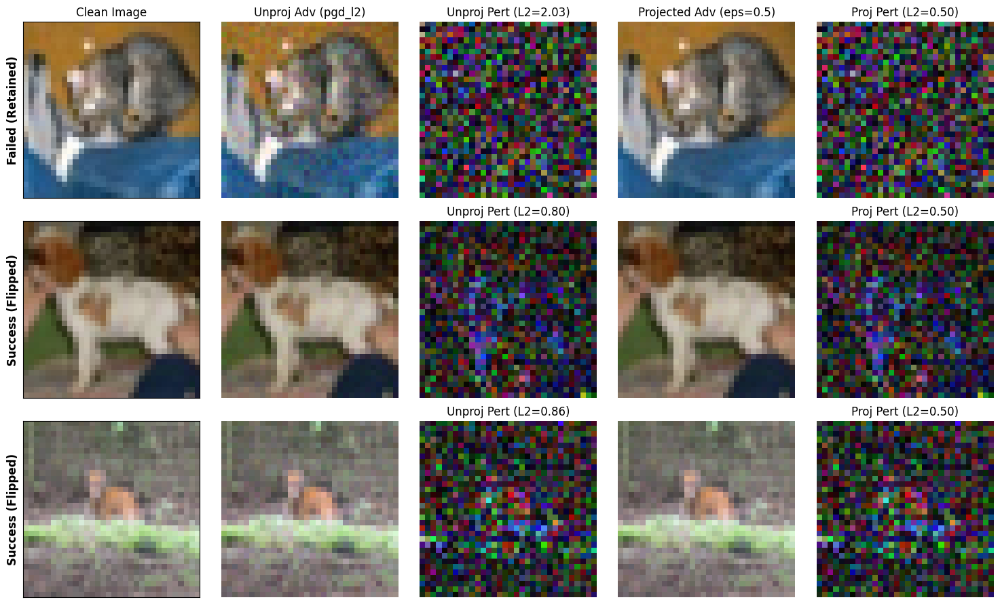


Visualizing Attack: ddn_l2


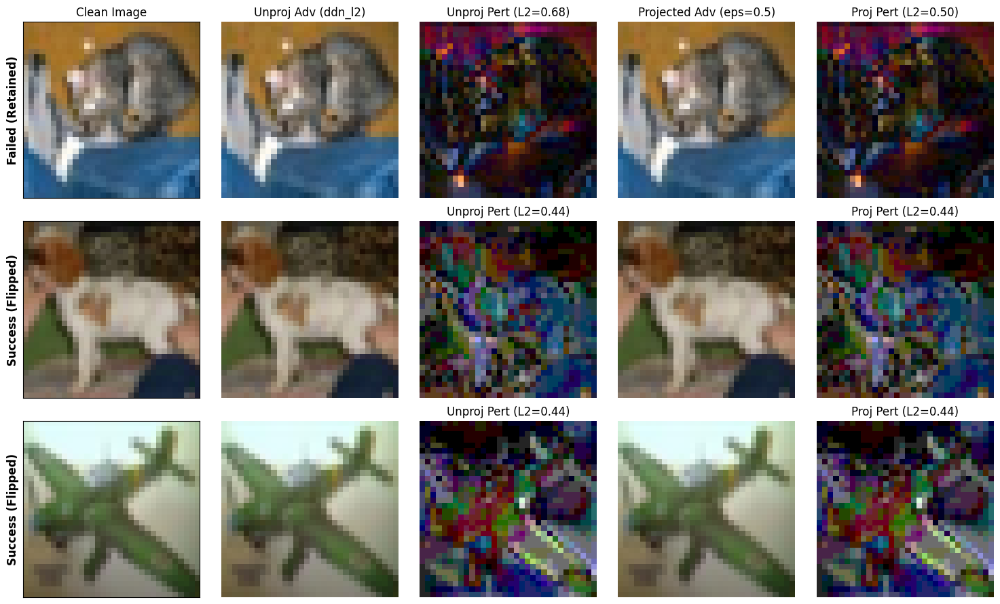


Visualizing Attack: cw_l2


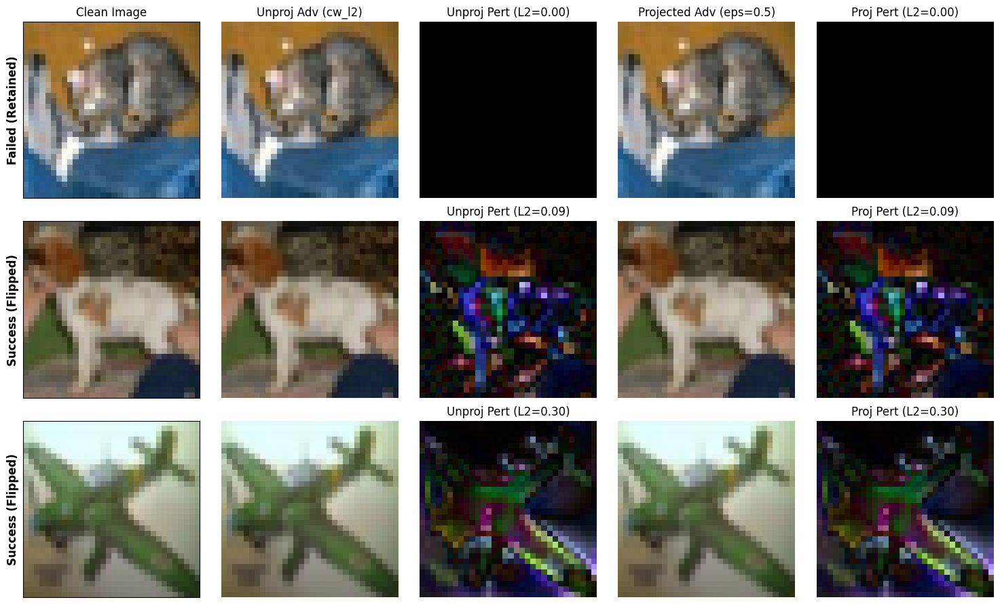


Visualizing Attack: deepfool_l2


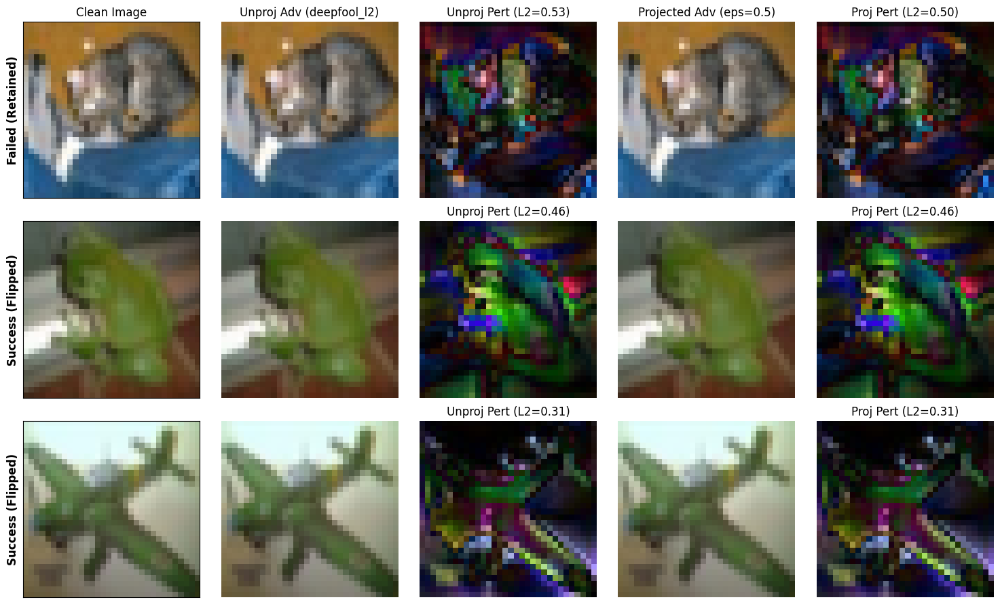

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def visualize_l2_projection_conditional(model, loader, cfg, attack_names=['pgd_l2', 'ddn_l2', 'cw_l2', 'deepfool_l2'], eps=0.5):
    model.eval()
    mean, std = get_dataset_mean_std(cfg)

    for atk_name in attack_names:
        print(f"\n{'='*80}\nVisualizing Attack: {atk_name}\n{'='*80}")

        collected_images = [] # Store tuples of (clean, unproj_adv, unproj_pert, proj_adv, proj_pert, status_text)

        # Temporarily modify spec to bypass internal projection
        spec = ATTACK_SPECS[atk_name]
        orig_eps = spec.eps
        if 'pgd' in atk_name:
            spec.eps = eps * 5  # PGD needs a bound, give it a large one
        else:
            spec.eps = None     # Let optimization/boundary attacks find their own limit

        need_success = 2 # Find 2 successful attacks (fooled the model)
        need_fail = 1    # Find 1 failed attack (model still correct)

        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            clean_pixel = denormalize(images, mean, std).clamp(0, 1)

            # Get clean predictions
            with torch.no_grad():
                clean_preds = model(images).argmax(1)

            # Generate unprojected adversarial examples
            unprojected_adv_norm = generate_adv_examples(model, images, labels, atk_name, cfg=cfg, train_mode=False)
            unprojected_adv_pixel = denormalize(unprojected_adv_norm, mean, std).clamp(0, 1)

            # Manually project to the target L2 ball
            projected_adv_pixel = project_l2_ball(unprojected_adv_pixel, clean_pixel, eps)
            projected_adv_norm = renormalize(projected_adv_pixel, mean, std)

            # Get adversarial predictions
            with torch.no_grad():
                adv_preds = model(projected_adv_norm).argmax(1)

            unproj_pert = torch.abs(unprojected_adv_pixel - clean_pixel)
            proj_pert = torch.abs(projected_adv_pixel - clean_pixel)

            for i in range(images.size(0)):
                if len(collected_images) >= 3:
                    break

                is_clean_correct = (clean_preds[i] == labels[i]).item()
                is_adv_correct = (adv_preds[i] == labels[i]).item()

                # Collect based on criteria
                if is_clean_correct and not is_adv_correct and need_success > 0:
                    collected_images.append((clean_pixel[i], unprojected_adv_pixel[i], unproj_pert[i],
                                             projected_adv_pixel[i], proj_pert[i], "Success (Flipped)"))
                    need_success -= 1
                elif is_clean_correct and is_adv_correct and need_fail > 0:
                    collected_images.append((clean_pixel[i], unprojected_adv_pixel[i], unproj_pert[i],
                                             projected_adv_pixel[i], proj_pert[i], "Failed (Retained)"))
                    need_fail -= 1

            if len(collected_images) >= 3:
                break

        spec.eps = orig_eps     # Restore original spec

        # Plotting
        num_images = len(collected_images)
        if num_images == 0:
            print(f"Could not find required examples for {atk_name}.")
            continue

        fig, axes = plt.subplots(num_images, 5, figsize=(15, 3 * num_images))
        if num_images == 1:
            axes = [axes]

        for i, (c_pix, ua_pix, up_pert, pa_pix, p_pert, status) in enumerate(collected_images):
            # Clean
            ax = axes[i][0]
            ax.imshow(c_pix.permute(1, 2, 0).cpu().numpy())
            if i == 0: ax.set_title("Clean Image")
            ax.set_ylabel(status, fontsize=12, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])

            # Unprojected Adv
            ax = axes[i][1]
            ax.imshow(ua_pix.permute(1, 2, 0).cpu().numpy())
            if i == 0: ax.set_title(f"Unproj Adv ({atk_name})")
            ax.axis("off")

            # Unprojected Perturbation
            ax = axes[i][2]
            pert_np = up_pert.permute(1, 2, 0).cpu().numpy()
            pert_np = pert_np / (pert_np.max() + 1e-8) # Normalize for visibility
            ax.imshow(pert_np)
            l2_norm_unproj = torch.norm(up_pert.flatten(), p=2).item()
            ax.set_title(f"Unproj Pert (L2={l2_norm_unproj:.2f})")
            ax.axis("off")

            # Projected Adv
            ax = axes[i][3]
            ax.imshow(pa_pix.permute(1, 2, 0).cpu().numpy())
            if i == 0: ax.set_title(f"Projected Adv (eps={eps})")
            ax.axis("off")

            # Projected Perturbation
            ax = axes[i][4]
            proj_pert_np = p_pert.permute(1, 2, 0).cpu().numpy()
            proj_pert_np = proj_pert_np / (proj_pert_np.max() + 1e-8)
            ax.imshow(proj_pert_np)
            l2_norm_proj = torch.norm(p_pert.flatten(), p=2).item()
            ax.set_title(f"Proj Pert (L2={l2_norm_proj:.2f})")
            ax.axis("off")

        plt.tight_layout()
        plt.show()

# Execute loop for all requested attacks
visualize_l2_projection_conditional(model_eval, test_loader, eval_cfg, attack_names=['pgd_l2', 'ddn_l2', 'cw_l2', 'deepfool_l2'], eps=L2_EPS)



Visualizing Extremes for Attack: pgd_l2


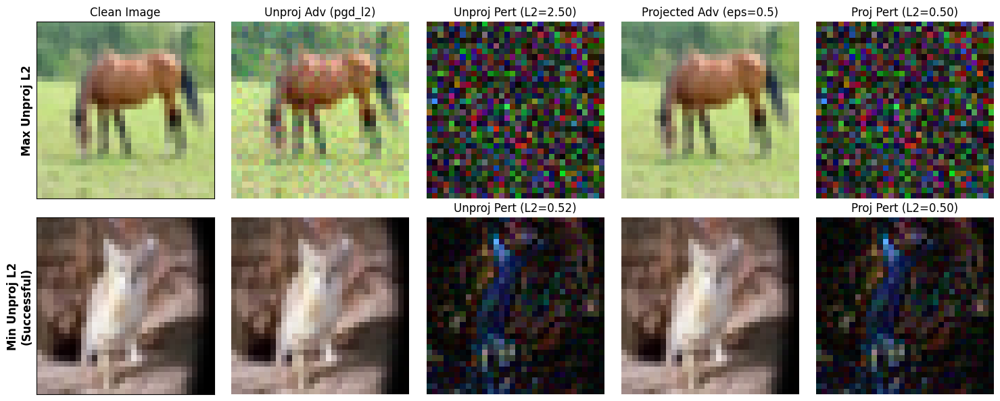

In [ ]:
def visualize_l2_extremes(model, loader, cfg, atk_name='pgd_l2', eps=0.5):
    model.eval()
    mean, std = get_dataset_mean_std(cfg)

    # We will collect one batch to find max/min
    images, labels = next(iter(loader))
    images, labels = images.to(DEVICE), labels.to(DEVICE)
    clean_pixel = denormalize(images, mean, std).clamp(0, 1)

    print(f"\n{'='*80}\nVisualizing Extremes for Attack: {atk_name}\n{'='*80}")

    # Bypass internal projection constraints temporarily
    spec = ATTACK_SPECS[atk_name]
    orig_eps = spec.eps
    if 'pgd' in atk_name:
        spec.eps = eps * 5  # Allow a very large perturbation to force high L2
    else:
        spec.eps = None

    unprojected_adv_norm = generate_adv_examples(model, images, labels, atk_name, cfg=cfg, train_mode=False)
    unprojected_adv_pixel = denormalize(unprojected_adv_norm, mean, std).clamp(0, 1)

    projected_adv_pixel = project_l2_ball(unprojected_adv_pixel, clean_pixel, eps)

    spec.eps = orig_eps  # Restore original spec

    unproj_pert = torch.abs(unprojected_adv_pixel - clean_pixel)
    proj_pert = torch.abs(projected_adv_pixel - clean_pixel)

    unproj_l2_norms = torch.norm(unproj_pert.view(unproj_pert.size(0), -1), p=2, dim=1)

    # Find successful attacks to filter minimum
    with torch.no_grad():
        clean_preds = model(images).argmax(1)
        adv_preds = model(unprojected_adv_norm).argmax(1)

    is_successful = (adv_preds != labels) & (clean_preds == labels)

    # Find max and min L2 norm indices
    max_idx = torch.argmax(unproj_l2_norms).item()

    if is_successful.any():
        masked_norms = unproj_l2_norms.clone()
        masked_norms[~is_successful] = float('inf')
        min_idx = torch.argmin(masked_norms).item()
    else:
        min_idx = torch.argmin(unproj_l2_norms).item()

    selected_indices = [max_idx, min_idx]
    labels_str = ["Max Unproj L2", "Min Unproj L2\n(Successful)"]

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))

    for row, idx in enumerate(selected_indices):
        c_pix = clean_pixel[idx]
        ua_pix = unprojected_adv_pixel[idx]
        up_pert = unproj_pert[idx]
        pa_pix = projected_adv_pixel[idx]
        p_pert = proj_pert[idx]

        # Clean
        ax = axes[row][0]
        ax.imshow(c_pix.permute(1, 2, 0).cpu().numpy())
        if row == 0: ax.set_title("Clean Image")
        ax.set_ylabel(labels_str[row], fontsize=12, fontweight='bold')
        ax.set_xticks([]); ax.set_yticks([])

        # Unprojected Adv
        ax = axes[row][1]
        ax.imshow(ua_pix.permute(1, 2, 0).cpu().numpy())
        if row == 0: ax.set_title(f"Unproj Adv ({atk_name})")
        ax.axis("off")

        # Unprojected Perturbation
        ax = axes[row][2]
        pert_np = up_pert.permute(1, 2, 0).cpu().numpy()
        pert_np = pert_np / (pert_np.max() + 1e-8)
        ax.imshow(pert_np)
        l2_unproj = unproj_l2_norms[idx].item()
        ax.set_title(f"Unproj Pert (L2={l2_unproj:.2f})")
        ax.axis("off")

        # Projected Adv
        ax = axes[row][3]
        ax.imshow(pa_pix.permute(1, 2, 0).cpu().numpy())
        if row == 0: ax.set_title(f"Projected Adv (eps={eps})")
        ax.axis("off")

        # Projected Perturbation
        ax = axes[row][4]
        proj_pert_np = p_pert.permute(1, 2, 0).cpu().numpy()
        proj_pert_np = proj_pert_np / (proj_pert_np.max() + 1e-8)
        ax.imshow(proj_pert_np)
        l2_proj = torch.norm(p_pert.flatten(), p=2).item()
        ax.set_title(f"Proj Pert (L2={l2_proj:.2f})")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

# Run the visualization for the extremes on PGD-L2
visualize_l2_extremes(model_eval, test_loader, eval_cfg, atk_name='pgd_l2', eps=L2_EPS)


Visualizing Extremes for Attack: ddn_l2


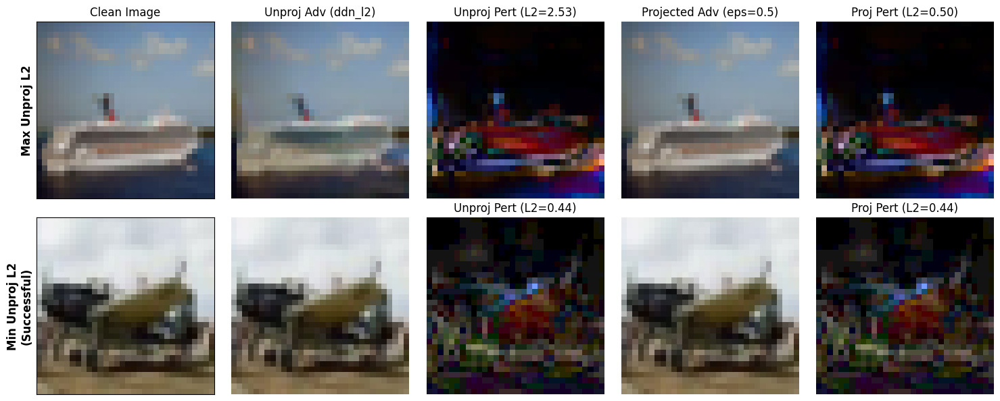


Visualizing Extremes for Attack: cw_l2


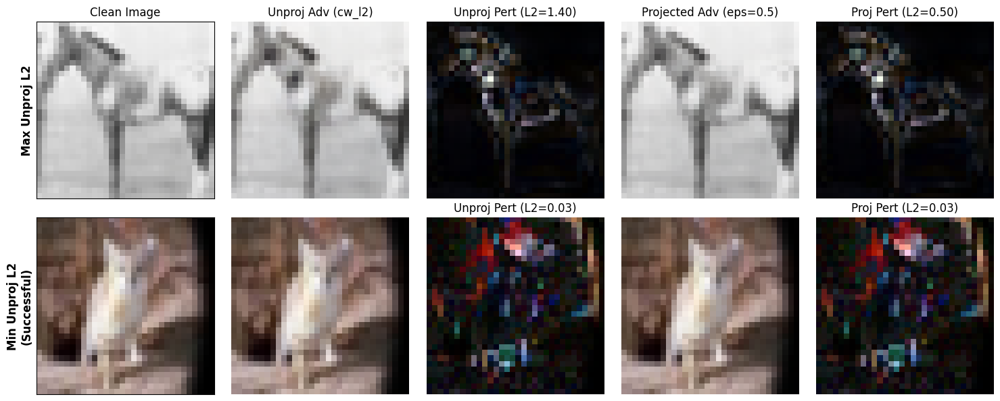


Visualizing Extremes for Attack: deepfool_l2


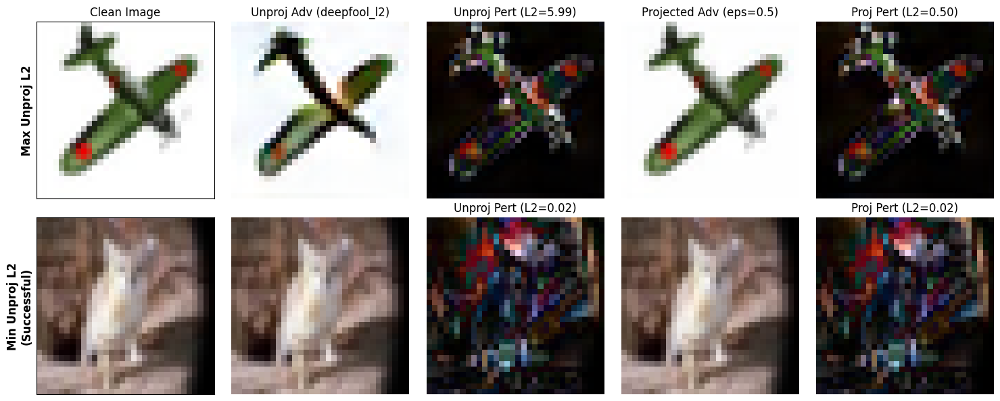

In [ ]:
for atk in ['ddn_l2', 'cw_l2', 'deepfool_l2']:
    visualize_l2_extremes(model_eval, test_loader, eval_cfg, atk_name=atk, eps=L2_EPS)

# Evaluation


In [ ]:
import json
from pathlib import Path
from dataclasses import fields
import pandas as pd
import numpy as np

seeds = [42, 123, 456, 789, 1024]
base_dir = Path("/content/drive/MyDrive/ardg_project/final_results/single_at_pgd_linf")

eval_attacks = [
    "clean",
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "cw_l2",
    "deepfool_l2",
    "ddn_l2",
    "autoattack_linf",
]

all_results = []

for seed in seeds:
    print(f"\n{'='*60}\nEvaluating single_at_pgd_linf (Seed: {seed})\n{'='*60}")
    exp_name = f"single_at_pgd_linf_seed{seed}"
    config_path = base_dir / exp_name / "config.json"
    ckpt_path = base_dir / exp_name / f"{exp_name}_best.pt"

    if not config_path.exists() or not ckpt_path.exists():
        print(f"⚠️ Missing config or checkpoint for seed {seed}. Skipping...")
        continue

    # Load config
    with open(config_path, "r") as f:
        cfg_raw = json.load(f)

    valid_keys = {f.name for f in fields(TrainConfig)}
    cfg_dict = {k: v for k, v in cfg_raw.items() if k in valid_keys}

    if isinstance(cfg_dict.get("early_stopping"), dict):
        cfg_dict["early_stopping"] = EarlyStoppingConfig(**cfg_dict["early_stopping"])

    eval_cfg = TrainConfig(**cfg_dict)

    # Override eval settings
    eval_cfg.eval_attack_names = eval_attacks
    eval_cfg.autoattack_eval_n = 512
    eval_cfg.wandb_enabled = False
    eval_cfg.skip_final_eval = False

    # Build dataloader & model
    _, _, test_loader = build_dataloaders(eval_cfg)
    model_eval = build_model(eval_cfg).to(DEVICE)

    print(f"  ⬇️ Loading checkpoint from: {ckpt_path.name}")
    load_checkpoint(ckpt_path, model_eval)

    # Evaluate
    orig_cw = ATTACK_SPECS["cw_l2"].steps
    ATTACK_SPECS["cw_l2"].steps = 200

    final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

    ATTACK_SPECS["cw_l2"].steps = orig_cw

    # Collect results
    row = {"seed": seed}
    for atk, acc in final_eval_res["per_attack"].items():
        row[atk] = float(acc)
    all_results.append(row)

# Display and summarize
if all_results:
    df_results = pd.DataFrame(all_results)
    df_results.set_index("seed", inplace=True)

    print("\n📊 Summary over all seeds:")
    display(df_results)

    # Calculate mean and std
    df_summary = pd.DataFrame({
        "mean": df_results.mean(),
        "std": df_results.std()
    })
    print("\n📈 Aggregate Metrics:")
    display(df_summary)

    # Save to CSV
    save_path = base_dir / "single_at_pgd_linf_5seeds_eval.csv"
    df_results.to_csv(save_path)
    print(f"\n💾 Saved aggregate results to: {save_path}")
else:
    print("No results to display.")

In [ ]:
import json
from pathlib import Path
from dataclasses import fields
import pandas as pd
import numpy as np

# ── Target Checkpoint & Config ──
exp_name = "multi_attack_pgd_linf_ddn_l2_mb_seed42"
config_path = Path("/content/drive/MyDrive/ardg_project/results") / exp_name / "config.json"
ckpt_path = Path("/content/drive/MyDrive/ardg_project/checkpoints") / f"{exp_name}_best_avg.pt"

eval_attacks = [
    "clean",
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "cw_l2",
    "deepfool_l2",
    "ddn_l2",
    "autoattack_linf",
]

print(f"\n{'='*60}\nEvaluating {exp_name} (best_avg)\n{'='*60}")

if not config_path.exists() or not ckpt_path.exists():
    print(f"⚠️ Missing config or checkpoint. Please check the paths:\n  Config: {config_path}\n  Ckpt: {ckpt_path}")
else:
    # Load config
    with open(config_path, "r") as f:
        cfg_raw = json.load(f)

    valid_keys = {f.name for f in fields(TrainConfig)}
    cfg_dict = {k: v for k, v in cfg_raw.items() if k in valid_keys}

    if isinstance(cfg_dict.get("early_stopping"), dict):
        cfg_dict["early_stopping"] = EarlyStoppingConfig(**cfg_dict["early_stopping"])

    eval_cfg = TrainConfig(**cfg_dict)

    # Override eval settings
    eval_cfg.eval_attack_names = eval_attacks
    eval_cfg.autoattack_eval_n = 512
    eval_cfg.wandb_enabled = False
    eval_cfg.skip_final_eval = False

    # Build dataloader & model
    _, _, test_loader = build_dataloaders(eval_cfg)
    model_eval = build_model(eval_cfg).to(DEVICE)

    print(f"  ⬇️ Loading checkpoint from: {ckpt_path.name}")
    load_checkpoint(ckpt_path, model_eval)

    # Evaluate
    orig_cw = ATTACK_SPECS["cw_l2"].steps
    ATTACK_SPECS["cw_l2"].steps = 200

    final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

    ATTACK_SPECS["cw_l2"].steps = orig_cw

    # Display results
    df_results = pd.DataFrame(
        [{"attack": k, "acc": float(v)} for k, v in final_eval_res["per_attack"].items()]
    ).sort_values("acc", ascending=False)

    print("\n📊 Final Test-Set Evaluation:")
    display(df_results)

    # Save to CSV
    save_dir = Path("/content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2")
    save_dir.mkdir(parents=True, exist_ok=True)
    csv_path = save_dir / f"{exp_name}_best_avg_bounded_l2_eval.csv"
    df_results.to_csv(csv_path, index=False)
    print(f"\n💾 Saved results to: {csv_path}")

# AutoAttack


In [ ]:
import pandas as pd
from pathlib import Path
import torch

seeds = [42, 7777, 789, 999, 1337]
models = [
    "multi_attack_pgd_linf_ddn_l2_mb_seed{seed}",
    "attackdro_pp_anchor035_gradfp_online_k4_seed{seed}"
]
base_dir = Path("/content/drive/MyDrive/ardg_project/autoattack")

# Base configuration for evaluation
eval_cfg = TrainConfig(
    dataset_name="cifar10",
    num_classes=10,
    backbone="resnet18",
    batch_size=128,
    autoattack_eval_n=None,  # Set to an integer like 512 for a faster sub-sample evaluation
    eval_attack_names=["autoattack_linf"],
    wandb_enabled=False
)

_, _, test_loader = build_dataloaders(eval_cfg)

results = []

for seed in seeds:
    for model_template in models:
        model_name = model_template.format(seed=seed)
        ckpt_path = base_dir / f"{model_name}_best.pt"

        print(f"\n{'='*80}\nEvaluating {model_name} on AutoAttack\n{'='*80}")

        if not ckpt_path.exists():
            print(f"⚠️ Checkpoint not found: {ckpt_path}")
            continue

        model_eval = build_model(eval_cfg).to(DEVICE)
        load_checkpoint(ckpt_path, model_eval)

        print(f"  ⬇️ Running AutoAttack for {model_name}...")
        res = evaluate_under_attack(model_eval, test_loader, "autoattack_linf", cfg=eval_cfg)

        results.append({
            "Model": model_template.split('_seed')[0],
            "Seed": seed,
            "AutoAttack Acc": res["robust_acc"]
        })

if results:
    df_results = pd.DataFrame(results)
    print("\n📊 AutoAttack Results:")
    display(df_results)

    # Optionally aggregate the results
    agg_df = df_results.groupby("Model")["AutoAttack Acc"].agg(['mean', 'std']).reset_index()
    print("\n📈 Aggregate AutoAttack Results:")
    display(agg_df)

    save_path = base_dir / "autoattack_evaluation_results.csv"
    df_results.to_csv(save_path, index=False)
    print(f"\n✅ Saved AutoAttack results to {save_path}")
else:
    print("⚠️ No models were successfully evaluated. Please check the checkpoint paths.")

In [ ]:
import json
from pathlib import Path
from dataclasses import fields
import pandas as pd
import numpy as np

# ── Target Checkpoint & Config ──
exp_name = "multi_attack_pgd_linf_ddn_l2_mb_seed1337"
config_path = Path("/content/drive/MyDrive/ardg_project/results") / exp_name / "config.json"
ckpt_path = Path("/content/drive/MyDrive/ardg_project/autoattack") / f"{exp_name}_best.pt"

eval_attacks = [
    "clean",
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "cw_l2",
    "deepfool_l2",
    "ddn_l2",
    "autoattack_linf",
]

print(f"\n{'='*60}\nEvaluating {exp_name} (best)\n{'='*60}")

if not config_path.exists() or not ckpt_path.exists():
    print(f"☀️ Missing config or checkpoint. Please check the paths:\n  Config: {config_path}\n  Ckpt: {ckpt_path}")
else:
    # Load config
    with open(config_path, "r") as f:
        cfg_raw = json.load(f)

    valid_keys = {f.name for f in fields(TrainConfig)}
    cfg_dict = {k: v for k, v in cfg_raw.items() if k in valid_keys}

    if isinstance(cfg_dict.get("early_stopping"), dict):
        cfg_dict["early_stopping"] = EarlyStoppingConfig(**cfg_dict["early_stopping"])

    eval_cfg = TrainConfig(**cfg_dict)

    # Override eval settings
    eval_cfg.eval_attack_names = eval_attacks
    eval_cfg.autoattack_eval_n = 512
    eval_cfg.wandb_enabled = False
    eval_cfg.skip_final_eval = False

    # Build dataloader & model
    _, _, test_loader = build_dataloaders(eval_cfg)
    model_eval = build_model(eval_cfg).to(DEVICE)

    print(f"  ⬇️ Loading checkpoint from: {ckpt_path.name}")
    load_checkpoint(ckpt_path, model_eval)

    # Evaluate
    orig_cw = ATTACK_SPECS["cw_l2"].steps
    ATTACK_SPECS["cw_l2"].steps = 200

    final_eval_res = evaluate_suite(model_eval, test_loader, eval_cfg)

    ATTACK_SPECS["cw_l2"].steps = orig_cw

    # Display results
    df_results = pd.DataFrame(
        [{"attack": k, "acc": float(v)} for k, v in final_eval_res["per_attack"].items()]
    ).sort_values("acc", ascending=False)

    print("\n📊 Final Test-Set Evaluation:")
    display(df_results)

    # Save to CSV
    save_dir = Path("/content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2")
    save_dir.mkdir(parents=True, exist_ok=True)
    csv_path = save_dir / f"{exp_name}_best_bounded_l2_eval.csv"
    df_results.to_csv(csv_path, index=False)
    print(f"\n💾 Saved results to: {csv_path}")



Evaluating multi_attack_pgd_linf_ddn_l2_mb_seed1337 (best)

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
  ⬇️ Loading checkpoint from: multi_attack_pgd_linf_ddn_l2_mb_seed1337_best.pt


  Eval [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [autoattack_linf]:   0%|          | 0/79 [00:00<?, ?it/s]

setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 79.69%
apgd-ce - 1/2 - 35 out of 64 successfully perturbed
apgd-ce - 2/2 - 22 out of 38 successfully perturbed
robust accuracy after APGD-CE: 35.16% (total time 0.7 s)
apgd-t - 1/1 - 10 out of 45 successfully perturbed
robust accuracy after APGD-T: 27.34% (total time 4.0 s)
fab-t - 1/1 - 0 out of 35 successfully perturbed
robust accuracy after FAB-T: 27.34% (total time 11.2 s)
square - 1/1 - 0 out of 35 successfully perturbed
robust accuracy after SQUARE: 27.34% (total time 19.9 s)
max Linf perturbation: 0.03137, nan in tensor: 0, max: 1.00000, min: 0.00000
robust accuracy: 27.34%
setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 71.09%
apgd-ce - 1/2 - 37 out of 64 successfully perturbed
apgd-ce - 2/2 - 10 out of 27 successfully perturbed
robust accuracy after APGD-CE: 34.38% (total time 0.7 s

,attack,acc
0,clean,0.733900
5,pgd_l2,0.584900
3,tpgd,0.581600
1,fgsm_rs,0.570800
8,ddn_l2,0.565400
7,deepfool_l2,0.558600
6,cw_l2,0.551000
4,mifgsm,0.378700
2,pgd20_ce,0.364300
9,autoattack_linf,0.310547



💾 Saved results to: /content/drive/MyDrive/ardg_project/final_results/re_eval_bounded_l2/multi_attack_pgd_linf_ddn_l2_mb_seed1337_best_bounded_l2_eval.csv


In [ ]:
# Create the WRN-28-10 version of the Anchor035 config
cfg_pp_anchor035_wrn = make_wrn_cfg(cfg_pp_anchor035)

# Adjust the experiment name to clearly indicate the backbone
cfg_pp_anchor035_wrn.experiment_name = "attackdro_pp_anchor035_gradfp_online_k4_wrn2810_cifar10"
cfg_pp_anchor035_wrn.wandb_run_name  = "attackdro_pp_anchor035_gradfp_online_k4_wrn2810_cifar10"

print("Config created for WRN-28-10:")
print(f"  Experiment Name: {cfg_pp_anchor035_wrn.experiment_name}")
print(f"  Backbone:        {cfg_pp_anchor035_wrn.backbone}")
print(f"  eta_q:           {cfg_pp_anchor035_wrn.groupdro_eta_q}")

# Uncomment below to execute training
# out_pp_anchor035_wrn = run_training(cfg_pp_anchor035_wrn)
# plot_training_curves(out_pp_anchor035_wrn["history"], title=cfg_pp_anchor035_wrn.experiment_name)


Config created for WRN-28-10:
  Experiment Name: attackdro_pp_anchor035_gradfp_online_k4_wrn2810_cifar10
  Backbone:        wrn_28_10
  eta_q:           0.0003


In [ ]:
# LEGACY_DIRECT_RUN_DISABLED
# This cell used to launch a direct training/evaluation run.
# It is gated off in the paper-extension notebook so that Runtime -> Run all is safe.
# Use the controlled experiment launcher cells in section 17.7 instead.
RUN_LEGACY_CELL_148 = False
if RUN_LEGACY_CELL_148:
    out_pp_anchor035_wrn = run_training(cfg_pp_anchor035_wrn)
else:
    print("Legacy direct-run cell 148 is disabled. Use section 17.7 final experiment launchers.")



════════════════════════════════════════════════════════════════════════
  📋  Training Configuration
════════════════════════════════════════════════════════════════════════

  [Experiment]
    experiment_name                                attackdro_pp_anchor035_gradfp_online_k4_wrn2810_cifar10
    method                                         groupdro_cluster_online_difficulty
    dataset_name                                   cifar10
    backbone                                       wrn_28_10

  [Training]
    epochs                                         50
    batch_size                                     128
    lr                                             0.1
    weight_decay                                   0.0005
    momentum                                       0.9
    scheduler                                      multistep
    scheduler_milestones                           [30, 40]
    amp                                            True
    grad_clip_norm          

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: kietna (kietna-ho-chi-minh-city-university-of-technology) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


  🟢 W&B  run=attackdro_pp_anchor035_gradfp_online_k4_wrn2810_cifar10  url=https://wandb.ai/kietna-ho-chi-minh-city-university-of-technology/ardg/runs/lotpv2oz

     Ep      Loss   AdvAcc  │     Worst       Avg     Clean  │         LR      T      qH
  ───────────────────────────────────────────────────────────────────────────────────


  Train E0:   0%|          | 0/313 [00:00<?, ?it/s]

  [GradFP] projection matrix initialized: [6400 → 128]


  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [000/049]  loss=2.0247  adv_acc=0.245  │  worst=0.2200  avg=0.2800  clean=0.4365  │  lr=0.10000  t=304s  qH=1.386 ✓


  Train E1:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [001/049]  loss=1.7957  adv_acc=0.325  │  worst=0.2400  avg=0.3136  clean=0.5028  │  lr=0.10000  t=306s  qH=1.386 ✓


  Train E2:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [002/049]  loss=1.6555  adv_acc=0.374  │  worst=0.2426  avg=0.3223  clean=0.5238  │  lr=0.10000  t=303s  qH=1.386 ✓


  Train E3:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [003/049]  loss=1.5584  adv_acc=0.410  │  worst=0.2679  avg=0.3423  clean=0.5416  │  lr=0.10000  t=305s  qH=1.386 ✓


  Train E4:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [004/049]  loss=1.5003  adv_acc=0.434  │  worst=0.2926  avg=0.3832  clean=0.6333  │  lr=0.10000  t=304s  qH=1.386 ✓


  Train E5:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [005/049]  loss=1.4483  adv_acc=0.460  │  worst=0.3187  avg=0.4130  clean=0.6587  │  lr=0.10000  t=305s  qH=1.386 ✓

  ┌────────────────────────────────────────────────────────────────────────────────┐
  │  Epoch 5 — Cluster Diagnostics                                              │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  ID                q    RobAcc     ASR    AtkH    ClsH  Top attack        │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  cluster_0     0.250    0.4082  0.5918   1.000   0.878  ddn_l2(12910)     │
  │  cluster_1     0.250    0.5361  0.4639   1.000   0.725  pgd20_ce(7897)    │
  │  cluster_2     0.250    0.3438  0.6562   1.000   0.821  ddn_l2(9826)      │
  │  cluster_3     0.250    0.5292  0.4708   0.999   0.778  pgd20_ce(10123)   │
  └────────────────────────────────────────────────────────────────────────────────┘


  Train E6:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [006/049]  loss=1.4099  adv_acc=0.475  │  worst=0.3258  avg=0.4231  clean=0.6827  │  lr=0.10000  t=303s  qH=1.386 ✓


  Train E7:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [007/049]  loss=1.3767  adv_acc=0.485  │  worst=0.3180  avg=0.4239  clean=0.6823  │  lr=0.10000  t=305s  qH=1.386 ✓


  Train E8:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [008/049]  loss=1.3499  adv_acc=0.493  │  worst=0.3289  avg=0.4305  clean=0.7052  │  lr=0.10000  t=303s  qH=1.386 ✓


  Train E9:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [009/049]  loss=1.3251  adv_acc=0.507  │  worst=0.3239  avg=0.4158  clean=0.6841  │  lr=0.10000  t=305s  qH=1.386


  Train E10:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [010/049]  loss=1.2953  adv_acc=0.515  │  worst=0.3585  avg=0.4529  clean=0.7221  │  lr=0.10000  t=303s  qH=1.386 ✓


  Train E11:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [011/049]  loss=1.2741  adv_acc=0.523  │  worst=0.3511  avg=0.4499  clean=0.7118  │  lr=0.10000  t=305s  qH=1.386


  Train E12:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [012/049]  loss=1.2500  adv_acc=0.528  │  worst=0.3785  avg=0.4744  clean=0.7393  │  lr=0.10000  t=303s  qH=1.386 ✓


  Train E13:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [013/049]  loss=1.2280  adv_acc=0.540  │  worst=0.3738  avg=0.4782  clean=0.7690  │  lr=0.10000  t=305s  qH=1.386 ✓


  Train E14:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [014/049]  loss=1.2169  adv_acc=0.540  │  worst=0.3122  avg=0.4182  clean=0.7303  │  lr=0.10000  t=303s  qH=1.386


  Train E15:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [015/049]  loss=1.2077  adv_acc=0.548  │  worst=0.3723  avg=0.4776  clean=0.7588  │  lr=0.10000  t=305s  qH=1.386

  ┌────────────────────────────────────────────────────────────────────────────────┐
  │  Epoch 15 — Cluster Diagnostics                                              │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  ID                q    RobAcc     ASR    AtkH    ClsH  Top attack        │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  cluster_0     0.250    0.6771  0.3229   1.000   0.647  pgd20_ce(8658)    │
  │  cluster_1     0.250    0.4877  0.5123   1.000   0.795  pgd20_ce(10634)   │
  │  cluster_2     0.250    0.6122  0.3878   1.000   0.722  pgd20_ce(8959)    │
  │  cluster_3     0.250    0.4481  0.5519   1.000   0.840  ddn_l2(12234)     │
  └────────────────────────────────────────────────────────────────────────────────┘


  Train E16:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [016/049]  loss=1.1894  adv_acc=0.552  │  worst=0.3860  avg=0.4903  clean=0.7870  │  lr=0.10000  t=304s  qH=1.386 ✓


  Train E17:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [017/049]  loss=1.1797  adv_acc=0.560  │  worst=0.3598  avg=0.4653  clean=0.7588  │  lr=0.10000  t=305s  qH=1.386


  Train E18:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [018/049]  loss=1.1772  adv_acc=0.556  │  worst=0.3660  avg=0.4753  clean=0.7624  │  lr=0.10000  t=303s  qH=1.386


  Train E19:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [019/049]  loss=1.1633  adv_acc=0.562  │  worst=0.3835  avg=0.4868  clean=0.7643  │  lr=0.10000  t=305s  qH=1.386


  Train E20:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [020/049]  loss=1.1489  adv_acc=0.566  │  worst=0.3711  avg=0.4799  clean=0.7756  │  lr=0.10000  t=303s  qH=1.386


  Train E21:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [021/049]  loss=1.1404  adv_acc=0.568  │  worst=0.3827  avg=0.4941  clean=0.7941  │  lr=0.10000  t=305s  qH=1.386 ✓


  Train E22:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [022/049]  loss=1.1333  adv_acc=0.571  │  worst=0.3883  avg=0.4844  clean=0.7702  │  lr=0.10000  t=303s  qH=1.386


  Train E23:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [023/049]  loss=1.1273  adv_acc=0.577  │  worst=0.3752  avg=0.4865  clean=0.7900  │  lr=0.10000  t=305s  qH=1.386


  Train E24:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [024/049]  loss=1.1180  adv_acc=0.577  │  worst=0.3772  avg=0.4806  clean=0.7801  │  lr=0.10000  t=303s  qH=1.386


  Train E25:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [025/049]  loss=1.1165  adv_acc=0.578  │  worst=0.3725  avg=0.4797  clean=0.7884  │  lr=0.10000  t=305s  qH=1.386

  ┌────────────────────────────────────────────────────────────────────────────────┐
  │  Epoch 25 — Cluster Diagnostics                                              │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  ID                q    RobAcc     ASR    AtkH    ClsH  Top attack        │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  cluster_0     0.250    0.4493  0.5507   1.000   0.776  pgd20_ce(10448)   │
  │  cluster_1     0.250    0.6436  0.3564   1.000   0.713  ddn_l2(9091)      │
  │  cluster_2     0.250    0.5441  0.4559   1.000   0.795  ddn_l2(11924)     │
  │  cluster_3     0.250    0.7012  0.2988   1.000   0.635  pgd20_ce(9053)    │
  └────────────────────────────────────────────────────────────────────────────────┘


  Train E26:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [026/049]  loss=1.1075  adv_acc=0.584  │  worst=0.3759  avg=0.4891  clean=0.8081  │  lr=0.10000  t=303s  qH=1.386


  Train E27:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [027/049]  loss=1.1043  adv_acc=0.587  │  worst=0.3869  avg=0.4919  clean=0.8086  │  lr=0.10000  t=305s  qH=1.386


  Train E28:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [028/049]  loss=1.0906  adv_acc=0.588  │  worst=0.3946  avg=0.4971  clean=0.7787  │  lr=0.10000  t=303s  qH=1.386 ✓


  Train E29:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [029/049]  loss=1.0911  adv_acc=0.587  │  worst=0.3941  avg=0.4907  clean=0.7767  │  lr=0.01000  t=305s  qH=1.386


  Train E30:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [030/049]  loss=0.8921  adv_acc=0.654  │  worst=0.4836  avg=0.5875  clean=0.8652  │  lr=0.01000  t=303s  qH=1.386 ✓


  Train E31:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [031/049]  loss=0.8147  adv_acc=0.679  │  worst=0.4879  avg=0.5947  clean=0.8741  │  lr=0.01000  t=305s  qH=1.386 ✓


  Train E32:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [032/049]  loss=0.7492  adv_acc=0.696  │  worst=0.4881  avg=0.5923  clean=0.8734  │  lr=0.01000  t=303s  qH=1.386


  Train E33:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [033/049]  loss=0.7228  adv_acc=0.707  │  worst=0.4872  avg=0.5926  clean=0.8742  │  lr=0.01000  t=305s  qH=1.386


  Train E34:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [034/049]  loss=0.7191  adv_acc=0.715  │  worst=0.4840  avg=0.5928  clean=0.8800  │  lr=0.01000  t=303s  qH=1.386


  Train E35:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [035/049]  loss=0.6944  adv_acc=0.727  │  worst=0.4843  avg=0.5907  clean=0.8791  │  lr=0.01000  t=305s  qH=1.386

  ┌────────────────────────────────────────────────────────────────────────────────┐
  │  Epoch 35 — Cluster Diagnostics                                              │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  ID                q    RobAcc     ASR    AtkH    ClsH  Top attack        │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  cluster_0     0.250    0.8729  0.1271   1.000   0.450  ddn_l2(7752)      │
  │  cluster_1     0.250    0.5964  0.4036   1.000   0.764  ddn_l2(16286)     │
  │  cluster_2     0.250    0.8036  0.1964   1.000   0.635  pgd20_ce(9753)    │
  │  cluster_3     0.250    0.7296  0.2704   1.000   0.584  pgd20_ce(6569)    │
  └────────────────────────────────────────────────────────────────────────────────┘


  Train E36:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [036/049]  loss=0.6556  adv_acc=0.736  │  worst=0.4817  avg=0.5895  clean=0.8778  │  lr=0.01000  t=303s  qH=1.386


  Train E37:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [037/049]  loss=0.6349  adv_acc=0.744  │  worst=0.4702  avg=0.5829  clean=0.8841  │  lr=0.01000  t=305s  qH=1.386


  Train E38:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [038/049]  loss=0.6059  adv_acc=0.754  │  worst=0.4721  avg=0.5830  clean=0.8828  │  lr=0.01000  t=303s  qH=1.386


  Train E39:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [039/049]  loss=0.5856  adv_acc=0.762  │  worst=0.4807  avg=0.5864  clean=0.8790  │  lr=0.00100  t=305s  qH=1.386


  Train E40:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [040/049]  loss=0.5461  adv_acc=0.785  │  worst=0.4765  avg=0.5852  clean=0.8852  │  lr=0.00100  t=303s  qH=1.386


  Train E41:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [041/049]  loss=0.5308  adv_acc=0.792  │  worst=0.4767  avg=0.5838  clean=0.8859  │  lr=0.00100  t=305s  qH=1.386


  Train E42:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [042/049]  loss=0.5225  adv_acc=0.796  │  worst=0.4744  avg=0.5833  clean=0.8875  │  lr=0.00100  t=303s  qH=1.386


  Train E43:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [043/049]  loss=0.5188  adv_acc=0.798  │  worst=0.4739  avg=0.5818  clean=0.8857  │  lr=0.00100  t=305s  qH=1.386


  Train E44:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [044/049]  loss=0.5185  adv_acc=0.801  │  worst=0.4677  avg=0.5791  clean=0.8866  │  lr=0.00100  t=303s  qH=1.386


  Train E45:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [045/049]  loss=0.5156  adv_acc=0.801  │  worst=0.4686  avg=0.5795  clean=0.8852  │  lr=0.00100  t=305s  qH=1.386

  ┌────────────────────────────────────────────────────────────────────────────────┐
  │  Epoch 45 — Cluster Diagnostics                                              │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  ID                q    RobAcc     ASR    AtkH    ClsH  Top attack        │
  ├────────────────────────────────────────────────────────────────────────────────┤
  │  cluster_0     0.250    0.8899  0.1101   1.000   0.520  pgd20_ce(8830)    │
  │  cluster_1     0.250    0.6703  0.3297   1.000   0.698  pgd20_ce(12387)   │
  │  cluster_2     0.250    0.9336  0.0664   1.000   0.403  ddn_l2(7926)      │
  │  cluster_3     0.250    0.7825  0.2175   1.000   0.653  ddn_l2(11182)     │
  └────────────────────────────────────────────────────────────────────────────────┘


  Train E46:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [046/049]  loss=0.4996  adv_acc=0.804  │  worst=0.4702  avg=0.5804  clean=0.8866  │  lr=0.00100  t=303s  qH=1.386


  Train E47:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [047/049]  loss=0.4930  adv_acc=0.806  │  worst=0.4701  avg=0.5800  clean=0.8858  │  lr=0.00100  t=305s  qH=1.386


  Train E48:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [048/049]  loss=0.4925  adv_acc=0.807  │  worst=0.4720  avg=0.5808  clean=0.8860  │  lr=0.00100  t=303s  qH=1.386


  Train E49:   0%|          | 0/313 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  [049/049]  loss=0.4893  adv_acc=0.810  │  worst=0.4626  avg=0.5756  clean=0.8858  │  lr=0.00100  t=305s  qH=1.386

  ✅ Loaded best checkpoint (epoch=31, metric=0.5947)

────────────────────────────────────────────────────────────
  📊  Final Test-Set Evaluation
────────────────────────────────────────────────────────────


  Eval [fgsm_rs]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd20_ce]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [tpgd]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [cw_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [mifgsm]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [deepfool_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [autoattack_linf]:   0%|          | 0/79 [00:00<?, ?it/s]

setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 90.62%
apgd-ce - 1/2 - 41 out of 64 successfully perturbed
apgd-ce - 2/2 - 24 out of 52 successfully perturbed
robust accuracy after APGD-CE: 39.84% (total time 3.0 s)
apgd-t - 1/1 - 3 out of 51 successfully perturbed
robust accuracy after APGD-T: 37.50% (total time 15.1 s)
fab-t - 1/1 - 0 out of 48 successfully perturbed
robust accuracy after FAB-T: 37.50% (total time 40.6 s)
square - 1/1 - 0 out of 48 successfully perturbed
robust accuracy after SQUARE: 37.50% (total time 73.0 s)
max Linf perturbation: 0.03137, nan in tensor: 0, max: 1.00000, min: 0.00000
robust accuracy: 37.50%
setting parameters for standard version
using standard version including apgd-ce, apgd-t, fab-t, square.
initial accuracy: 89.84%
apgd-ce - 1/2 - 32 out of 64 successfully perturbed
apgd-ce - 2/2 - 25 out of 51 successfully perturbed
robust accuracy after APGD-CE: 45.31% (total time 3.0 s

  Eval [ddn_l2]:   0%|          | 0/79 [00:00<?, ?it/s]

  Eval [pgd_l2]:   0%|          | 0/79 [00:00<?, ?it/s]


════════════════════════════════════════════════════════════════════════
  🏁  Final Test-Set Evaluation  —  attackdro_pp_anchor035_gradfp_online_k4_wrn2810_cifar10
════════════════════════════════════════════════════════════════════════
  Attack                           Acc  Histogram
  ──────────────────────────  ────────  ──────────────────────
  pgd_l2                        0.7193  ████████████████
  fgsm_rs                       0.7151  ████████████████
  tpgd                          0.6981  ███████████████
  deepfool_l2                   0.6969  ███████████████
  ddn_l2                        0.6911  ███████████████
  cw_l2                         0.6760  ███████████████
  mifgsm                        0.5004  ███████████
  pgd20_ce                      0.4772  ██████████
  autoattack_linf               0.4316  █████████

  Worst robust : 0.4316   Mean robust : 0.6229



cluster_asr/cluster_0,▁████▇▅▅▆▆▆▅▅▄▄▅▆▆▇▇▅▇▇▅▅▅▅▅▄▄▂▃▃▄▄▂▂▂▄▂
cluster_asr/cluster_1,▁██▆▆▅▅▅▅▅▇▆▆▆▆▅▅▅▄▄▄▄▄▆▆▃▂▂▅▅▃▂▂▂▂▂▄▄▃▃
cluster_asr/cluster_2,▁██▆▆▇▇▇▇▇▆▆▆▅▅▄▆▄▄▄▅▅▆▆▅▄▄▅▅▃▄▄▂▂▄▄▂▂▂▄
cluster_asr/cluster_3,▁▇▇██▆▇▇▅▅▄▄▇▇▇▄▆▆▇▇▄▄▄▄▄▄▃▃▄▄▂▅▅▂▂▄▃▃▂▂
cluster_attack_H/cluster_0,▁███████████████████████████████████████
cluster_attack_H/cluster_1,▁███████████████████████████████████████
cluster_attack_H/cluster_2,▁███████████████████████████████████████
cluster_attack_H/cluster_3,▁███████████████████████████████████████
cluster_bank_n,█▁█▁█▁█▁█▁▁█▁█▁▁█▁█▁▁█▁█▁▁█▁█▁▁█▁█▁▁█▁▁▁
cluster_class_H/cluster_0,▁█████▇▇█▇▇▇▆▆▇▇▇▇▇▇▇▇▇▆▆▇▇▇▄▄▅▇▇▆▆▄▅▅▆▅
+51,...


  🏁 W&B run finished.


# Evaluation Extension: Attack x Class Groups

This section is **additive only**. It does not modify the training pipeline.

Goal:
- Evaluate robustness **per attack and per class**.
- Treat each `(attack, class)` pair as an evaluation group.
- Identify the **worst groups**, e.g. `pgd20_ce x cat`, `ddn_l2 x truck`.
- Optionally compare two models group-by-group.

Use this for the report/discussion section:
> AttackDRO++ improves average/heldout robustness, but the attack-class group table shows which failure modes remain hardest.

In [ ]:
# -----------------------------------------------------------------------------
# Attack x Class Group Evaluation
# Additive extension: does not change training.
# -----------------------------------------------------------------------------

import pandas as pd
import numpy as np
from pathlib import Path
from tqdm.auto import tqdm

CIFAR10_CLASS_NAMES_LOCAL = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

def _get_class_names(cfg=None):
    """Return class names if available; otherwise CIFAR-10 defaults."""
    if cfg is not None and hasattr(cfg, "class_names"):
        names = getattr(cfg, "class_names")
        if names is not None and len(names) > 0:
            return list(names)
    if cfg is not None and hasattr(cfg, "num_classes"):
        c = int(getattr(cfg, "num_classes"))
        if c == 10:
            return CIFAR10_CLASS_NAMES_LOCAL
        return [f"class_{i}" for i in range(c)]
    return CIFAR10_CLASS_NAMES_LOCAL


def _acc_from_counts(correct, total):
    correct = np.asarray(correct, dtype=np.float64)
    total = np.asarray(total, dtype=np.float64)
    return np.divide(correct, total, out=np.full_like(correct, np.nan), where=(total > 0))


def evaluate_clean_per_class(model, loader, cfg=None, max_items=None):
    """Clean per-class accuracy.

    Output:
        DataFrame with one row per class:
        attack='clean', class_id, class_name, correct, total, acc
    """
    model.eval()
    class_names = _get_class_names(cfg)
    num_classes = len(class_names)

    correct = np.zeros(num_classes, dtype=np.int64)
    total = np.zeros(num_classes, dtype=np.int64)
    proc = 0

    for x, y in tqdm(loader, desc="  Per-class [clean]", leave=False):
        if max_items is not None and proc >= max_items:
            break

        if max_items is not None and proc + x.size(0) > max_items:
            keep = max_items - proc
            x, y = x[:keep], y[:keep]

        x = x.to(DEVICE)
        y = y.to(DEVICE)

        with torch.no_grad():
            logits = model(x)
            pred = logits.argmax(1)
            ok = (pred == y)

        for c in range(num_classes):
            mask = (y == c)
            total[c] += int(mask.sum().item())
            correct[c] += int((ok & mask).sum().item())

        proc += int(y.numel())
        del x, y, logits, pred, ok

    acc = _acc_from_counts(correct, total)
    return pd.DataFrame({
        "attack": "clean",
        "class_id": list(range(num_classes)),
        "class_name": class_names,
        "correct": correct,
        "total": total,
        "acc": acc,
    })


def evaluate_under_attack_per_class(model, loader, attack_name, cfg=None, max_items=None):
    """Evaluate one attack and report accuracy per class.

    Each row is one group:
        group = (attack_name, class_id)

    This is evaluation-only and reuses your existing generate_adv_examples().
    """
    model.eval()
    class_names = _get_class_names(cfg)
    num_classes = len(class_names)

    correct = np.zeros(num_classes, dtype=np.int64)
    total = np.zeros(num_classes, dtype=np.int64)
    proc = 0

    for x, y in tqdm(loader, desc=f"  Per-class [{attack_name}]", leave=False):
        if max_items is not None and proc >= max_items:
            break

        if max_items is not None and proc + x.size(0) > max_items:
            keep = max_items - proc
            x, y = x[:keep], y[:keep]

        x = x.to(DEVICE)
        y = y.to(DEVICE)

        xa = generate_adv_examples(model, x, y, attack_name, cfg=cfg, train_mode=False)

        with torch.no_grad():
            logits = model(xa)
            pred = logits.argmax(1)
            ok = (pred == y)

        for c in range(num_classes):
            mask = (y == c)
            total[c] += int(mask.sum().item())
            correct[c] += int((ok & mask).sum().item())

        proc += int(y.numel())
        del x, y, xa, logits, pred, ok

    acc = _acc_from_counts(correct, total)
    return pd.DataFrame({
        "attack": attack_name,
        "class_id": list(range(num_classes)),
        "class_name": class_names,
        "correct": correct,
        "total": total,
        "acc": acc,
    })


def evaluate_attack_class_groups(
    model,
    loader,
    cfg,
    attack_names=None,
    include_clean=True,
    max_items_by_attack=None,
):
    """Evaluate all attack x class groups.

    Args:
        model: trained model.
        loader: test_loader or val_loader.
        cfg: TrainConfig.
        attack_names: list of attacks. Default = cfg.eval_attack_names without clean.
        include_clean: include clean per-class accuracy.
        max_items_by_attack:
            Optional dict mapping attack_name -> max_items.
            If None, autoattack_* uses cfg.autoattack_eval_n; others use full set.

    Returns:
        group_df:
            one row per attack-class group.
        summary:
            dictionary with worst group and aggregate info.
    """
    if attack_names is None:
        attack_names = list(getattr(cfg, "eval_attack_names", []))

    attack_names = [a for a in attack_names if a != "clean"]
    max_items_by_attack = {} if max_items_by_attack is None else dict(max_items_by_attack)

    rows = []

    if include_clean:
        rows.append(evaluate_clean_per_class(model, loader, cfg=cfg))

    for aname in attack_names:
        if aname in max_items_by_attack:
            max_items = max_items_by_attack[aname]
        elif str(aname).startswith("autoattack_"):
            max_items = getattr(cfg, "autoattack_eval_n", None)
        else:
            max_items = None

        rows.append(evaluate_under_attack_per_class(
            model, loader, aname, cfg=cfg, max_items=max_items
        ))

    group_df = pd.concat(rows, ignore_index=True)

    # Helpful columns for sorting/reporting.
    group_df["acc_pct"] = 100.0 * group_df["acc"]
    group_df["group"] = group_df["attack"].astype(str) + " x " + group_df["class_name"].astype(str)

    robust_df = group_df[group_df["attack"] != "clean"].copy()
    worst_row = robust_df.sort_values("acc", ascending=True).head(1)

    summary = {
        "num_groups": int(len(robust_df)),
        "mean_group_acc": float(robust_df["acc"].mean()),
        "worst_group_acc": float(worst_row["acc"].iloc[0]) if len(worst_row) else float("nan"),
        "worst_group": str(worst_row["group"].iloc[0]) if len(worst_row) else None,
        "worst_attack": str(worst_row["attack"].iloc[0]) if len(worst_row) else None,
        "worst_class": str(worst_row["class_name"].iloc[0]) if len(worst_row) else None,
    }

    return group_df, summary


def summarize_attack_class_groups(group_df, top_k=20):
    """Create compact report tables from attack-class group results."""
    robust_df = group_df[group_df["attack"] != "clean"].copy()

    # Worst class for each attack.
    worst_by_attack = (
        robust_df.sort_values("acc", ascending=True)
        .groupby("attack", as_index=False)
        .head(1)
        .sort_values("acc", ascending=True)
        .reset_index(drop=True)
    )

    # Worst groups overall.
    worst_groups = (
        robust_df.sort_values("acc", ascending=True)
        .head(top_k)
        .reset_index(drop=True)
    )

    # Per-class average across attacks: which semantic class is generally weak?
    class_summary = (
        robust_df.groupby(["class_id", "class_name"], as_index=False)
        .agg(
            mean_acc=("acc", "mean"),
            worst_acc=("acc", "min"),
            mean_acc_pct=("acc_pct", "mean"),
            worst_acc_pct=("acc_pct", "min"),
            n_groups=("acc", "size"),
        )
        .sort_values("mean_acc", ascending=True)
        .reset_index(drop=True)
    )

    # Per-attack spread across classes: which attack has class imbalance?
    attack_summary = (
        robust_df.groupby("attack", as_index=False)
        .agg(
            mean_acc=("acc", "mean"),
            worst_acc=("acc", "min"),
            best_acc=("acc", "max"),
            std_class_acc=("acc", "std"),
            n_classes=("acc", "size"),
        )
        .assign(spread=lambda d: d["best_acc"] - d["worst_acc"])
        .sort_values("worst_acc", ascending=True)
        .reset_index(drop=True)
    )

    return {
        "worst_groups": worst_groups,
        "worst_by_attack": worst_by_attack,
        "class_summary": class_summary,
        "attack_summary": attack_summary,
    }


def print_attack_class_group_report(group_df, model_name="", top_k=20):
    """Pretty terminal report for attack-class groups."""
    tables = summarize_attack_class_groups(group_df, top_k=top_k)

    title = f"Attack x Class Group Evaluation"
    if model_name:
        title += f" - {model_name}"
    print_banner(title)

    robust_df = group_df[group_df["attack"] != "clean"].copy()
    print(f"Groups evaluated: {len(robust_df)}")
    print(f"Mean group acc:   {robust_df['acc'].mean():.4f}")
    print(f"Worst group acc:  {robust_df['acc'].min():.4f}")
    print()

    print_section("Worst attack-class groups")
    cols = ["group", "acc", "correct", "total"]
    display(tables["worst_groups"][cols].assign(acc=lambda d: d["acc"].round(4)))

    print_section("Worst class under each attack")
    cols = ["attack", "class_name", "acc", "correct", "total"]
    display(tables["worst_by_attack"][cols].assign(acc=lambda d: d["acc"].round(4)))

    print_section("Weakest classes averaged across attacks")
    cols = ["class_name", "mean_acc", "worst_acc", "n_groups"]
    display(tables["class_summary"][cols].assign(
        mean_acc=lambda d: d["mean_acc"].round(4),
        worst_acc=lambda d: d["worst_acc"].round(4),
    ))

    print_section("Attack class-imbalance summary")
    cols = ["attack", "mean_acc", "worst_acc", "best_acc", "spread", "std_class_acc"]
    display(tables["attack_summary"][cols].assign(
        mean_acc=lambda d: d["mean_acc"].round(4),
        worst_acc=lambda d: d["worst_acc"].round(4),
        best_acc=lambda d: d["best_acc"].round(4),
        spread=lambda d: d["spread"].round(4),
        std_class_acc=lambda d: d["std_class_acc"].round(4),
    ))


def compare_attack_class_groups(df_a, df_b, name_a="model_a", name_b="model_b"):
    """Compare two models on the same attack-class groups.

    Returns:
        merged DataFrame with delta = acc_a - acc_b.
    """
    key = ["attack", "class_id", "class_name"]
    a = df_a[key + ["acc", "correct", "total"]].rename(columns={
        "acc": f"acc_{name_a}",
        "correct": f"correct_{name_a}",
        "total": f"total_{name_a}",
    })
    b = df_b[key + ["acc", "correct", "total"]].rename(columns={
        "acc": f"acc_{name_b}",
        "correct": f"correct_{name_b}",
        "total": f"total_{name_b}",
    })

    out = a.merge(b, on=key, how="inner")
    out["delta"] = out[f"acc_{name_a}"] - out[f"acc_{name_b}"]
    out["delta_pp"] = 100.0 * out["delta"]
    out["group"] = out["attack"].astype(str) + " x " + out["class_name"].astype(str)
    return out.sort_values("delta", ascending=True).reset_index(drop=True)


def print_attack_class_comparison(comp_df, name_a="AttackDRO++", name_b="Uniform", top_k=20):
    """Print where model A loses/wins vs model B by attack-class group."""
    print_banner(f"Attack x Class Group Comparison - {name_a} minus {name_b}")

    robust = comp_df[comp_df["attack"] != "clean"].copy()
    print(f"Common groups: {len(robust)}")
    print(f"Mean delta:    {robust['delta_pp'].mean():+.3f} pp")
    print(f"Wins:          {(robust['delta'] > 0).sum()}/{len(robust)}")
    print()

    print_section(f"Worst deltas for {name_a}")
    display(robust.sort_values("delta").head(top_k)[
        ["group", f"acc_{name_a}", f"acc_{name_b}", "delta_pp"]
    ].assign(
        **{
            f"acc_{name_a}": lambda d: d[f"acc_{name_a}"].round(4),
            f"acc_{name_b}": lambda d: d[f"acc_{name_b}"].round(4),
            "delta_pp": lambda d: d["delta_pp"].round(3),
        }
    ))

    print_section(f"Best gains for {name_a}")
    display(robust.sort_values("delta", ascending=False).head(top_k)[
        ["group", f"acc_{name_a}", f"acc_{name_b}", "delta_pp"]
    ].assign(
        **{
            f"acc_{name_a}": lambda d: d[f"acc_{name_a}"].round(4),
            f"acc_{name_b}": lambda d: d[f"acc_{name_b}"].round(4),
            "delta_pp": lambda d: d["delta_pp"].round(3),
        }
    ))


def save_attack_class_group_outputs(group_df, out_dir, prefix):
    """Save raw and summary CSVs for report usage."""
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    tables = summarize_attack_class_groups(group_df, top_k=len(group_df))

    raw_path = out_dir / f"{prefix}_attack_class_groups_raw.csv"
    group_df.to_csv(raw_path, index=False)

    paths = {"raw": raw_path}
    for name, table in tables.items():
        path = out_dir / f"{prefix}_{name}.csv"
        table.to_csv(path, index=False)
        paths[name] = path

    print("Saved attack-class group outputs:")
    for k, v in paths.items():
        print(f"  {k}: {v}")

    return paths

print("✅ Attack x class group evaluation helpers added.")

✅ Attack x class group evaluation helpers added.


## Usage examples

### Example A — evaluate one checkpoint

```python
# Choose attacks. Keep AutoAttack optional because it is slow.
attack_class_attacks = [
    "fgsm_rs", "pgd20_ce", "tpgd", "mifgsm",
    "pgd_l2", "ddn_l2", "deepfool_l2", "cw_l2",
]

group_df, group_summary = evaluate_attack_class_groups(
    model_eval,
    test_loader,
    eval_cfg,
    attack_names=attack_class_attacks,
    include_clean=True,
)

print(group_summary)
print_attack_class_group_report(group_df, model_name="AttackDRO++ Anchor35", top_k=20)

save_attack_class_group_outputs(
    group_df,
    out_dir="/content/drive/MyDrive/ardg_project/final_results/attack_class_groups",
    prefix="attackdropp_anchor35_seed42",
)
```

### Example B — compare AttackDRO++ vs Uniform group-by-group

```python
# Suppose you already evaluated:
#   group_a35
#   group_uni

comp = compare_attack_class_groups(
    group_a35,
    group_uni,
    name_a="AttackDRO++",
    name_b="Uniform",
)

print_attack_class_comparison(comp, name_a="AttackDRO++", name_b="Uniform", top_k=20)

comp.to_csv(
    "/content/drive/MyDrive/ardg_project/final_results/attack_class_groups/a35_vs_uniform_attack_class_delta.csv",
    index=False,
)
```

### Example C — include AutoAttack only on a subset

```python
attack_class_attacks = [
    "fgsm_rs", "pgd20_ce", "tpgd", "mifgsm",
    "pgd_l2", "ddn_l2", "deepfool_l2", "cw_l2",
    "autoattack_linf",
]

# Use 512 for AutoAttack if you want quick sanity.
eval_cfg.autoattack_eval_n = 512

group_df, group_summary = evaluate_attack_class_groups(
    model_eval,
    test_loader,
    eval_cfg,
    attack_names=attack_class_attacks,
    include_clean=True,
)
```

---
## Section 50 - Proof visualizations: cached adversarial feature bank
This block builds the reusable feature bank for the visualization evidence. It loads one trained checkpoint, generates adversarial examples for the 8 report attacks, and stores penultimate features, logits, CE loss, labels, attack ids, projected gradient fingerprints, and the full AttackDRO++ augmented feature `F3`.


In [ ]:
# ==========================================================================
# Section 50 - Build cached adversarial feature bank
# ==========================================================================
from pathlib import Path
import copy
import math
import time
import warnings

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F

PROOF_OUT_DIR = Path("results/proof_viz")
PROOF_OUT_DIR.mkdir(parents=True, exist_ok=True)

PROOF_RUN_NAME = "attackdro_pp_anchor035_gradfp_online_k4"
PROOF_CFG = copy.deepcopy(cfg_pp_anchor035)
PROOF_ATTACKS_8 = ["pgd20_ce", "ddn_l2", "fgsm_rs", "tpgd", "mifgsm",
                  "pgd_l2", "deepfool_l2", "cw_l2"]
PROOF_SOURCE_ATTACKS = ["pgd20_ce", "ddn_l2"]
PROOF_HELDOUT_ATTACKS = [a for a in PROOF_ATTACKS_8 if a not in PROOF_SOURCE_ATTACKS]
PROOF_SAMPLES_PER_ATTACK = 800
PROOF_GRAD_PROJ_DIM = 64
PROOF_RANDOM_SEED = 42
CIFAR10_CLASS_NAMES = ["airplane", "automobile", "bird", "cat", "deer",
                       "dog", "frog", "horse", "ship", "truck"]


def _proof_cluster_K(cfg):
    return int(getattr(cfg, "cluster_K", getattr(cfg, "cluster_num_clusters", 4)))


def _proof_checkpoint_path(cfg, run_name):
    mapping = {
        "attackdro_pp_anchor035_gradfp_online_k4": "/content/drive/MyDrive/ardg_project/FINAL/attackdro++/attackdro_pp_anchor035_gradfp_online_k4_seed101_best.pt"
    }
    if run_name in mapping:
        return Path(mapping[run_name])

    ckpt_dir = Path(getattr(cfg, "ckpt_dir", "checkpoints"))
    candidates = [
        ckpt_dir / f"{run_name}.pt",
        ckpt_dir / f"{run_name}_best.pt",
        ckpt_dir / f"{run_name}_best_avg.pt",
        ckpt_dir / f"{run_name}_last.pt",
    ]
    for p in candidates:
        if p.exists():
            return p
    return candidates[0]


def _proof_load_model(cfg, run_name):
    p = _proof_checkpoint_path(cfg, run_name)
    if not p.exists():
        raise FileNotFoundError(f"Checkpoint not found: {p}")
    model = build_model(cfg).to(DEVICE)
    state = torch.load(p, map_location=DEVICE, weights_only=False)
    sd = state.get("model", state) if isinstance(state, dict) else state
    if isinstance(sd, dict) and "state_dict" in sd:
        sd = sd["state_dict"]
    model.load_state_dict(sd, strict=False)
    model.eval()
    return model, p, state


def _proof_get_loader(loaders, split="test"):
    if isinstance(loaders, dict):
        return loaders[split]
    if isinstance(loaders, (tuple, list)) and len(loaders) >= 3:
        mapping = {"train": 0, "val": 1, "test": 2}
        return loaders[mapping[split]]
    raise TypeError("build_dataloaders(cfg) must return dict or (train, val, test).")


def _proof_iter_loader_with_indices(loader):
    offset = 0
    for batch in loader:
        if isinstance(batch, (tuple, list)) and len(batch) >= 3:
            x, y, idx = batch[0], batch[1], batch[2]
        else:
            x, y = batch[0], batch[1]
            idx = torch.arange(offset, offset + int(y.numel()), dtype=torch.long)
        offset += int(y.numel())
        yield x, y, idx


def _proof_balanced_test_sample(loader, num_classes=10, total_n=800, seed=42):
    per_class = int(math.ceil(total_n / max(1, num_classes)))
    xs, ys, ids = [], [], []
    counts = np.zeros(num_classes, dtype=np.int64)
    for x, y, idx in _proof_iter_loader_with_indices(loader):
        for c in range(num_classes):
            if counts[c] >= per_class:
                continue
            mask = (y == c)
            if not bool(mask.any()):
                continue
            take = min(int(mask.sum().item()), per_class - int(counts[c]))
            loc = mask.nonzero(as_tuple=False).view(-1)[:take]
            xs.append(x[loc].cpu())
            ys.append(y[loc].cpu())
            ids.append(idx[loc].cpu())
            counts[c] += take
        if counts.sum() >= total_n or np.all(counts >= per_class):
            break
    if not xs:
        raise RuntimeError("Could not collect test examples from loader.")
    x_all = torch.cat(xs, dim=0)[:total_n]
    y_all = torch.cat(ys, dim=0)[:total_n]
    id_all = torch.cat(ids, dim=0)[:total_n]
    rs = np.random.RandomState(seed)
    order = rs.permutation(int(y_all.numel()))
    order = torch.as_tensor(order, dtype=torch.long)
    return x_all[order], y_all[order], id_all[order]


def _proof_classifier_weight(model):
    candidates = []
    for name in ["fc", "head", "classifier", "linear"]:
        layer = getattr(model, name, None)
        if layer is not None and hasattr(layer, "weight"):
            candidates.append(layer.weight)
    for module in reversed(list(model.modules())):
        if isinstance(module, torch.nn.Linear):
            candidates.append(module.weight)
            break
    if not candidates:
        return None
    return candidates[0]


def _proof_grad_fingerprint(model, feats, logits, y, proj_dim=64, seed=12345):
    with torch.no_grad():
        probs = F.softmax(logits.detach().float(), dim=1)
        one_hot = F.one_hot(y.detach().long(), num_classes=logits.shape[1]).float()
        delta = probs - one_hot
        W = _proof_classifier_weight(model)
        if W is not None and W.ndim == 2 and W.shape[0] == logits.shape[1] and W.shape[1] == feats.shape[1]:
            grad_feat = delta @ W.detach().float()
        else:
            warnings.warn("Could not match classifier head weight to features; using normalized features as GradFP fallback.")
            grad_feat = feats.detach().float()
        grad_feat = torch.nan_to_num(grad_feat, nan=0.0, posinf=0.0, neginf=0.0)
        grad_feat = F.normalize(grad_feat, dim=1)
        gen = torch.Generator().manual_seed(int(seed))
        proj = torch.randn(grad_feat.shape[1], proj_dim, generator=gen, dtype=torch.float32)
        proj = F.normalize(proj, dim=0).to(grad_feat.device)
        g = grad_feat @ proj
        g = torch.nan_to_num(g, nan=0.0, posinf=0.0, neginf=0.0)
        return F.normalize(g, dim=1)


def _proof_augmented_F3(feats, labels, grad_fp, num_classes=10):
    f1 = F.normalize(feats.detach().float(), dim=1)
    yoh = F.one_hot(labels.detach().long(), num_classes=num_classes).float()
    yoh = F.normalize(yoh, dim=1)
    gf = F.normalize(grad_fp.detach().float(), dim=1)
    return torch.cat([f1, 0.3 * yoh, 0.5 * gf], dim=1)


def _proof_bank_cache_path(run_name=PROOF_RUN_NAME):
    return PROOF_OUT_DIR / f"{run_name}_feat_bank.pt"


def _proof_build_feature_bank(run_name=PROOF_RUN_NAME, cfg=PROOF_CFG,
                              attacks=PROOF_ATTACKS_8, samples_per_attack=PROOF_SAMPLES_PER_ATTACK,
                              force_recompute=False):
    cache_path = _proof_bank_cache_path(run_name)
    if cache_path.exists() and not force_recompute:
        bank = torch.load(cache_path, map_location="cpu", weights_only=False)
        globals()["feat_bank"] = bank
        print(f"Loaded cached feat_bank: {cache_path}")
        return bank

    model, ckpt_path, _state = _proof_load_model(cfg, run_name)
    loaders = build_dataloaders(cfg)
    test_loader = _proof_get_loader(loaders, "test")
    x_base, y_base, src_indices = _proof_balanced_test_sample(
        test_loader, num_classes=int(getattr(cfg, "num_classes", 10)),
        total_n=int(samples_per_attack), seed=PROOF_RANDOM_SEED,
    )

    rows = []
    all_feats, all_logits, all_losses, all_y = [], [], [], []
    all_attack_id, all_attack_name, all_grad_fp, all_F3, all_correct, all_src = [], [], [], [], [], []
    t0 = time.time()
    for a_idx, attack_name in enumerate(attacks):
        feats_l, logits_l, loss_l, y_l, g_l, F3_l, corr_l, src_l = [], [], [], [], [], [], [], []
        for start in range(0, int(x_base.size(0)), int(getattr(cfg, "batch_size", 128))):
            xb = x_base[start:start + int(getattr(cfg, "batch_size", 128))].to(DEVICE)
            yb = y_base[start:start + int(getattr(cfg, "batch_size", 128))].to(DEVICE)
            with torch.enable_grad():
                xadv = generate_adv_examples(model, xb, yb, attack_name, cfg=cfg, train_mode=False)
            with torch.no_grad():
                feats, logits = get_features_and_logits(
                    model, xadv, feature_source=getattr(cfg, "cluster_feature_source", "penultimate"),
                    num_classes=int(getattr(cfg, "num_classes", 10)),
                )
                losses = F.cross_entropy(logits.float(), yb, reduction="none")
                grad_fp = _proof_grad_fingerprint(model, feats, logits, yb, proj_dim=PROOF_GRAD_PROJ_DIM)
                F3 = _proof_augmented_F3(feats, yb, grad_fp, num_classes=int(getattr(cfg, "num_classes", 10)))
                corr = (logits.argmax(1) == yb)
            feats_l.append(feats.detach().cpu())
            logits_l.append(logits.detach().cpu())
            loss_l.append(losses.detach().cpu())
            y_l.append(yb.detach().cpu())
            g_l.append(grad_fp.detach().cpu())
            F3_l.append(F3.detach().cpu())
            corr_l.append(corr.detach().cpu())
            src_l.append(src_indices[start:start + int(yb.numel())].detach().cpu())
            del xb, yb, xadv, feats, logits, losses, grad_fp, F3, corr
            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        feats_a = torch.cat(feats_l, dim=0)
        logits_a = torch.cat(logits_l, dim=0)
        loss_a = torch.cat(loss_l, dim=0)
        y_a = torch.cat(y_l, dim=0)
        g_a = torch.cat(g_l, dim=0)
        F3_a = torch.cat(F3_l, dim=0)
        corr_a = torch.cat(corr_l, dim=0)
        src_a = torch.cat(src_l, dim=0)
        n = int(y_a.numel())
        all_feats.append(feats_a)
        all_logits.append(logits_a)
        all_losses.append(loss_a)
        all_y.append(y_a)
        all_grad_fp.append(g_a)
        all_F3.append(F3_a)
        all_correct.append(corr_a)
        all_src.append(src_a)
        all_attack_id.append(torch.full((n,), a_idx, dtype=torch.long))
        all_attack_name.extend([attack_name] * n)
        rows.append({"attack": attack_name, "n": n, "mean_ce": float(loss_a.mean()), "acc": float(corr_a.float().mean())})

    bank = {
        "run_name": run_name,
        "ckpt_path": str(ckpt_path),
        "attacks": list(attacks),
        "source_attack_names": list(PROOF_SOURCE_ATTACKS),
        "heldout_attack_names": list(PROOF_HELDOUT_ATTACKS),
        "class_names": list(CIFAR10_CLASS_NAMES),
        "features": torch.cat(all_feats, dim=0),
        "logits": torch.cat(all_logits, dim=0),
        "ce_loss": torch.cat(all_losses, dim=0),
        "y": torch.cat(all_y, dim=0),
        "attack_id": torch.cat(all_attack_id, dim=0),
        "attack_name": all_attack_name,
        "grad_fp": torch.cat(all_grad_fp, dim=0),
        "F3": torch.cat(all_F3, dim=0),
        "correct": torch.cat(all_correct, dim=0),
        "src_indices": torch.cat(all_src, dim=0),
        "cfg_summary": {"cluster_K": _proof_cluster_K(cfg), "samples_per_attack": int(samples_per_attack)},
        "created_sec": time.time() - t0,
    }
    torch.save(bank, cache_path)
    globals()["feat_bank"] = bank
    print(f"Saved feat_bank: {cache_path}")
    display(pd.DataFrame(rows))
    return bank


def _proof_require_feat_bank(run_name=PROOF_RUN_NAME):
    if "feat_bank" in globals() and isinstance(globals()["feat_bank"], dict):
        return globals()["feat_bank"]
    cache_path = _proof_bank_cache_path(run_name)
    if cache_path.exists():
        globals()["feat_bank"] = torch.load(cache_path, map_location="cpu", weights_only=False)
        return globals()["feat_bank"]
    raise RuntimeError("feat_bank is not available. Run Section 50 first to build/cache it.")


# Toggle this to rebuild; otherwise this cell loads an existing cache if present.
PROOF_FORCE_RECOMPUTE = False
feat_bank = _proof_build_feature_bank(force_recompute=PROOF_FORCE_RECOMPUTE)
summary = pd.DataFrame({
    "field": ["run", "checkpoint", "N", "feature_dim", "gradfp_dim", "F3_dim", "seconds"],
    "value": [
        feat_bank["run_name"], feat_bank["ckpt_path"], int(feat_bank["y"].numel()),
        int(feat_bank["features"].shape[1]), int(feat_bank["grad_fp"].shape[1]),
        int(feat_bank["F3"].shape[1]), round(float(feat_bank.get("created_sec", 0.0)), 1),
    ],
})
display(summary)


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M


KeyboardInterrupt: 

---
## Section 51 - Embedding with four colorings
Projects the full augmented feature `F3` to 2D and visualizes the same points colored by attack identity, class, K-means cluster id, and CE loss.


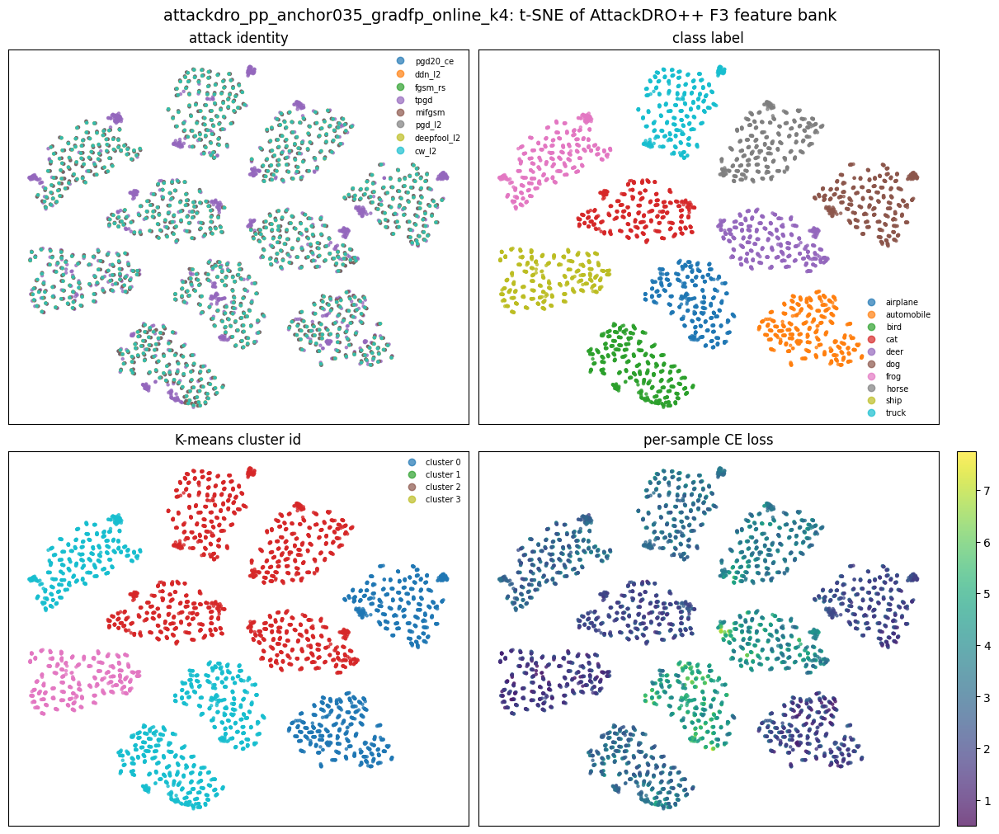

Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_embedding_4panel.png


In [ ]:
# ==========================================================================
# Section 51 - 2D embedding: attack, class, cluster, loss
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
X = bank["F3"].float().numpy()

# Fit K-means with the same K/seed for reusable cluster ids.
kmeans = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20)
cluster_id = kmeans.fit_predict(X)
bank["cluster_id"] = torch.as_tensor(cluster_id, dtype=torch.long)
bank["cluster_centers_F3"] = torch.as_tensor(kmeans.cluster_centers_, dtype=torch.float32)
globals()["feat_bank"] = bank

# t-SNE first, else UMAP, else PCA.
embed_name = "PCA"
try:
    from sklearn.manifold import TSNE
    perp = max(5, min(30, (X.shape[0] - 1) // 3))
    emb = TSNE(n_components=2, perplexity=perp, init="pca", learning_rate="auto",
               random_state=PROOF_RANDOM_SEED).fit_transform(X)
    embed_name = "t-SNE"
except Exception as tsne_exc:
    try:
        import umap
        emb = umap.UMAP(n_components=2, random_state=PROOF_RANDOM_SEED).fit_transform(X)
        embed_name = "UMAP"
    except Exception:
        emb = PCA(n_components=2, random_state=PROOF_RANDOM_SEED).fit_transform(X)

attack_id = bank["attack_id"].numpy()
y = bank["y"].numpy()
loss = bank["ce_loss"].numpy()
attacks = bank["attacks"]
classes = bank["class_names"]

fig, axes = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
plots = [
    (axes[0, 0], attack_id, "attack identity", attacks, "tab10"),
    (axes[0, 1], y, "class label", classes, "tab10"),
    (axes[1, 0], cluster_id, "K-means cluster id", [f"cluster {i}" for i in range(K)], "tab10"),
]
for ax, values, title, labels, cmap in plots:
    sc = ax.scatter(emb[:, 0], emb[:, 1], c=values, s=5, alpha=0.7, cmap=cmap)
    ax.set_title(f"{title}")
    ax.set_xticks([])
    ax.set_yticks([])
    handles, _ = sc.legend_elements(num=min(len(labels), 10))
    ax.legend(handles, labels[:len(handles)], fontsize=7, loc="best", frameon=False)

sc = axes[1, 1].scatter(emb[:, 0], emb[:, 1], c=loss, s=5, alpha=0.7)
axes[1, 1].set_title("per-sample CE loss")
axes[1, 1].set_xticks([])
axes[1, 1].set_yticks([])
fig.colorbar(sc, ax=axes[1, 1], fraction=0.046, pad=0.04)
fig.suptitle(f"{run_name}: {embed_name} of AttackDRO++ F3 feature bank", fontsize=14)

out = PROOF_OUT_DIR / f"{run_name}_embedding_4panel.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {out}")


---
## Section 52 - Cluster x attack heatmaps
Uses the Section 51 K-means assignment or refits it if needed. The two heatmaps show cluster-normalized and attack-normalized composition.


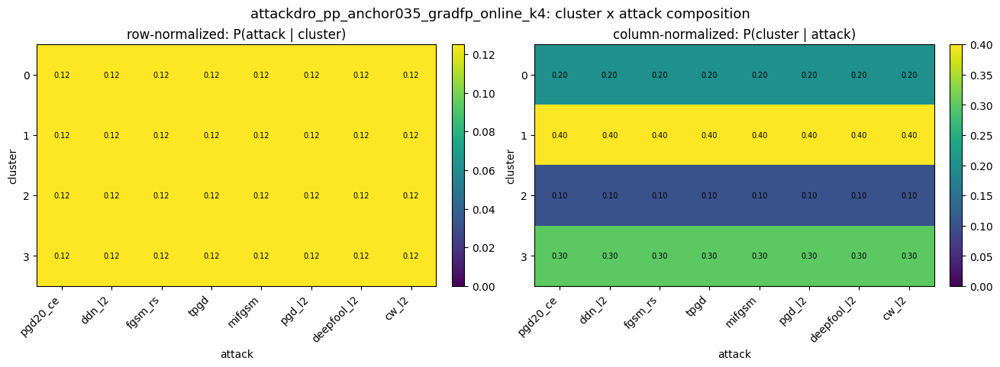

,attack,per_attack_purity
0,pgd20_ce,0.4
1,ddn_l2,0.4
2,fgsm_rs,0.4
3,tpgd,0.4
4,mifgsm,0.4
5,pgd_l2,0.4
6,deepfool_l2,0.4
7,cw_l2,0.4


,cluster,per_cluster_purity
0,0,0.125
1,1,0.125
2,2,0.125
3,3,0.125


within/between F3 variance ratio = 1.0741
Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_cluster_x_attack.png


In [ ]:
# ==========================================================================
# Section 52 - Cluster x attack heatmaps
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
if "cluster_id" not in bank:
    km = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20)
    bank["cluster_id"] = torch.as_tensor(km.fit_predict(bank["F3"].float().numpy()), dtype=torch.long)
    bank["cluster_centers_F3"] = torch.as_tensor(km.cluster_centers_, dtype=torch.float32)
    globals()["feat_bank"] = bank

cluster_id = bank["cluster_id"].numpy()
attack_id = bank["attack_id"].numpy()
attacks = bank["attacks"]
counts = pd.crosstab(pd.Series(cluster_id, name="cluster"), pd.Series(attack_id, name="attack_id"))
counts = counts.reindex(index=range(K), columns=range(len(attacks)), fill_value=0)
row_norm = counts.div(counts.sum(axis=1).replace(0, np.nan), axis=0).fillna(0.0)
col_norm = counts.div(counts.sum(axis=0).replace(0, np.nan), axis=1).fillna(0.0)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.7), constrained_layout=True)
for ax, mat, title in [(axes[0], row_norm, "row-normalized: P(attack | cluster)"),
                       (axes[1], col_norm, "column-normalized: P(cluster | attack)")]:
    im = ax.imshow(mat.values, aspect="auto", vmin=0, vmax=max(0.01, float(mat.values.max())))
    ax.set_title(title)
    ax.set_xlabel("attack")
    ax.set_ylabel("cluster")
    ax.set_xticks(range(len(attacks)))
    ax.set_xticklabels(attacks, rotation=45, ha="right")
    ax.set_yticks(range(K))
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            ax.text(j, i, f"{mat.values[i, j]:.2f}", ha="center", va="center", fontsize=7)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
fig.suptitle(f"{run_name}: cluster x attack composition", fontsize=13)
out = PROOF_OUT_DIR / f"{run_name}_cluster_x_attack.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()

per_attack_purity = col_norm.max(axis=0)
per_cluster_purity = row_norm.max(axis=1)
X = bank["F3"].float().numpy()
centers = np.vstack([X[cluster_id == k].mean(axis=0) if np.any(cluster_id == k) else np.zeros(X.shape[1]) for k in range(K)])
within = float(np.mean(np.sum((X - centers[cluster_id]) ** 2, axis=1)))
global_mean = X.mean(axis=0, keepdims=True)
between = float(np.mean(np.sum((centers - global_mean) ** 2, axis=1)))
ratio = within / max(between, 1e-12)

display(pd.DataFrame({"attack": attacks, "per_attack_purity": per_attack_purity.values}))
display(pd.DataFrame({"cluster": list(range(K)), "per_cluster_purity": per_cluster_purity.values}))
print(f"within/between F3 variance ratio = {ratio:.4f}")
print(f"Saved: {out}")


---
## Section 53 - Cluster x class heatmaps
Repeats the contingency analysis for CIFAR-10 labels. This checks whether clusters are just class groups or capture additional adversarial structure.


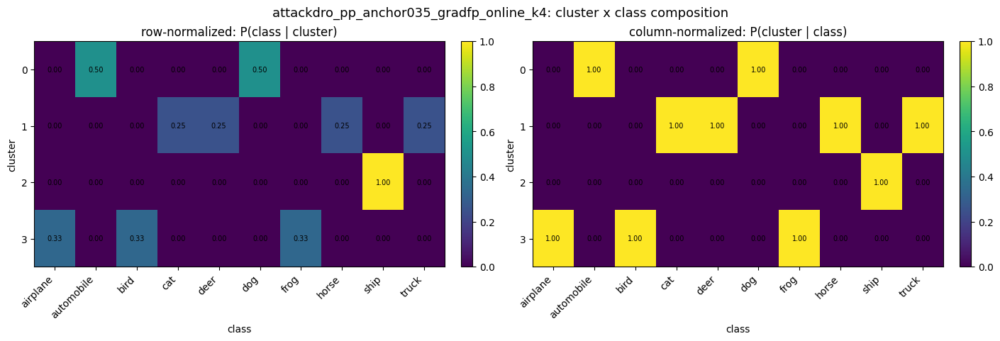

,class,per_class_purity
0,airplane,1.0
1,automobile,1.0
2,bird,1.0
3,cat,1.0
4,deer,1.0
5,dog,1.0
6,frog,1.0
7,horse,1.0
8,ship,1.0
9,truck,1.0


,cluster,per_cluster_purity
0,0,0.500000
1,1,0.250000
2,2,1.000000
3,3,0.333333


within/between F3 variance ratio = 1.0741
Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_cluster_x_class.png


In [ ]:
# ==========================================================================
# Section 53 - Cluster x class heatmaps
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
if "cluster_id" not in bank:
    km = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20)
    bank["cluster_id"] = torch.as_tensor(km.fit_predict(bank["F3"].float().numpy()), dtype=torch.long)
    bank["cluster_centers_F3"] = torch.as_tensor(km.cluster_centers_, dtype=torch.float32)
    globals()["feat_bank"] = bank

cluster_id = bank["cluster_id"].numpy()
y = bank["y"].numpy()
classes = bank["class_names"]
counts = pd.crosstab(pd.Series(cluster_id, name="cluster"), pd.Series(y, name="class_id"))
counts = counts.reindex(index=range(K), columns=range(len(classes)), fill_value=0)
row_norm = counts.div(counts.sum(axis=1).replace(0, np.nan), axis=0).fillna(0.0)
col_norm = counts.div(counts.sum(axis=0).replace(0, np.nan), axis=1).fillna(0.0)

fig, axes = plt.subplots(1, 2, figsize=(14, 4.7), constrained_layout=True)
for ax, mat, title in [(axes[0], row_norm, "row-normalized: P(class | cluster)"),
                       (axes[1], col_norm, "column-normalized: P(cluster | class)")]:
    im = ax.imshow(mat.values, aspect="auto", vmin=0, vmax=max(0.01, float(mat.values.max())))
    ax.set_title(title)
    ax.set_xlabel("class")
    ax.set_ylabel("cluster")
    ax.set_xticks(range(len(classes)))
    ax.set_xticklabels(classes, rotation=45, ha="right")
    ax.set_yticks(range(K))
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            ax.text(j, i, f"{mat.values[i, j]:.2f}", ha="center", va="center", fontsize=7)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
fig.suptitle(f"{run_name}: cluster x class composition", fontsize=13)
out = PROOF_OUT_DIR / f"{run_name}_cluster_x_class.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()

per_class_purity = col_norm.max(axis=0)
per_cluster_purity = row_norm.max(axis=1)
X = bank["F3"].float().numpy()
centers = np.vstack([X[cluster_id == k].mean(axis=0) if np.any(cluster_id == k) else np.zeros(X.shape[1]) for k in range(K)])
within = float(np.mean(np.sum((X - centers[cluster_id]) ** 2, axis=1)))
global_mean = X.mean(axis=0, keepdims=True)
between = float(np.mean(np.sum((centers - global_mean) ** 2, axis=1)))
ratio = within / max(between, 1e-12)

display(pd.DataFrame({"class": classes, "per_class_purity": per_class_purity.values}))
display(pd.DataFrame({"cluster": list(range(K)), "per_cluster_purity": per_cluster_purity.values}))
print(f"within/between F3 variance ratio = {ratio:.4f}")
print(f"Saved: {out}")


---
## Section 54 - Cluster difficulty and q summary
Summarizes each learned cluster by size, loss, robust accuracy, dominant attacks/classes, and final training q if records are available.


In [ ]:
# ==========================================================================
# Section 54 - Cluster difficulty and q table
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
from sklearn.cluster import KMeans

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
if "cluster_id" not in bank:
    km = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20)
    bank["cluster_id"] = torch.as_tensor(km.fit_predict(bank["F3"].float().numpy()), dtype=torch.long)
    bank["cluster_centers_F3"] = torch.as_tensor(km.cluster_centers_, dtype=torch.float32)
    globals()["feat_bank"] = bank


def _top2_names(values, names):
    values = np.asarray(values, dtype=float)
    if values.sum() <= 0:
        return "N/A"
    order = np.argsort(-values)[:2]
    total = max(float(values.sum()), 1e-12)
    return ", ".join([f"{names[i]} ({values[i] / total:.1%})" for i in order if values[i] > 0])


def _records_path(cfg, run_name):
    return Path(getattr(cfg, "ckpt_dir", "checkpoints")) / f"{run_name}_records.pt"


def _extract_final_q_from_records(obj, K):
    if obj is None:
        return None
    candidates = []
    if isinstance(obj, dict):
        for key in ["records", "history", "rows", "train_history", "q_snapshots", "epoch_records"]:
            if key in obj:
                candidates.append(obj[key])
        for key in ["q", "final_q", "q_final"]:
            if key in obj:
                arr = np.asarray(obj[key], dtype=float).reshape(-1)
                if arr.size >= K:
                    return arr[:K]
    elif isinstance(obj, list):
        candidates.append(obj)
    for cand in candidates:
        if isinstance(cand, pd.DataFrame):
            cand = cand.to_dict("records")
        if not isinstance(cand, list) or len(cand) == 0:
            continue
        for row in reversed(cand):
            if not isinstance(row, dict):
                continue
            if "q" in row:
                arr = np.asarray(row["q"], dtype=float).reshape(-1)
                if arr.size >= K:
                    return arr[:K]
            vals = []
            for k in range(K):
                for key in [f"q/cluster_{k}", f"q/cluster{k}", f"q/{k}", f"cluster_{k}/q"]:
                    if key in row:
                        vals.append(float(row[key])); break
            if len(vals) == K:
                return np.asarray(vals, dtype=float)
    return None

records_file = _records_path(PROOF_CFG, run_name)
q_final = None
if records_file.exists():
    records_obj = torch.load(records_file, map_location="cpu", weights_only=False)
    q_final = _extract_final_q_from_records(records_obj, K)

cluster_id = bank["cluster_id"].numpy()
attack_id = bank["attack_id"].numpy()
y = bank["y"].numpy()
loss = bank["ce_loss"].numpy()
correct = bank["correct"].numpy().astype(bool)
attacks = bank["attacks"]
classes = bank["class_names"]
rows = []
for k in range(K):
    mask = cluster_id == k
    atk_counts = np.bincount(attack_id[mask], minlength=len(attacks)) if mask.any() else np.zeros(len(attacks))
    cls_counts = np.bincount(y[mask], minlength=len(classes)) if mask.any() else np.zeros(len(classes))
    rows.append({
        "cluster": k,
        "count": int(mask.sum()),
        "mean_ce_loss": float(np.mean(loss[mask])) if mask.any() else np.nan,
        "accuracy": float(np.mean(correct[mask])) if mask.any() else np.nan,
        "top2_attacks": _top2_names(atk_counts, attacks),
        "top2_classes": _top2_names(cls_counts, classes),
        "q_final": float(q_final[k]) if q_final is not None and k < len(q_final) else "N/A - records not saved",
    })
summary_df = pd.DataFrame(rows)
out = PROOF_OUT_DIR / f"{run_name}_cluster_summary.csv"
summary_df.to_csv(out, index=False)
display(summary_df)
print(f"Saved: {out}")


,cluster,count,mean_ce_loss,accuracy,top2_attacks,top2_classes,q_final
0,0,1280,2.161202,0.032031,"pgd20_ce (12.5%), ddn_l2 (12.5%)","automobile (50.0%), dog (50.0%)",N/A - records not saved
1,1,2560,3.414863,0.003906,"pgd20_ce (12.5%), ddn_l2 (12.5%)","cat (25.0%), deer (25.0%)",N/A - records not saved
2,2,640,1.842897,0.137500,"pgd20_ce (12.5%), ddn_l2 (12.5%)",ship (100.0%),N/A - records not saved
3,3,1920,3.729975,0.000521,"pgd20_ce (12.5%), ddn_l2 (12.5%)","airplane (33.3%), bird (33.3%)",N/A - records not saved


Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_cluster_summary.csv


---
## Section 55 - Feature-only vs GradFP clustering agreement
Compares K-means clusterings from representation-only features, representation plus label embedding, and full `F3`. NMI/ARI against attack and class labels show whether GradFP changes the grouping.


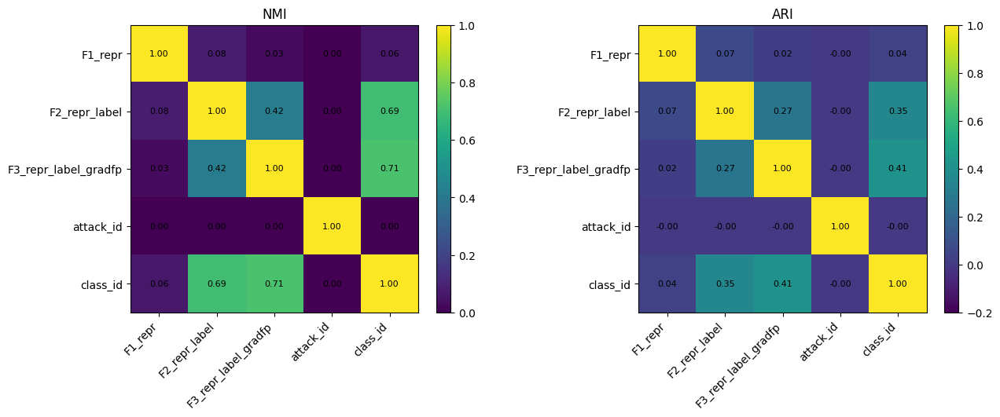

,F1_repr,F2_repr_label,F3_repr_label_gradfp,attack_id,class_id
F1_repr,1.000,0.079,0.031,0.0,0.063
F2_repr_label,0.079,1.000,0.422,0.0,0.693
F3_repr_label_gradfp,0.031,0.422,1.000,0.0,0.715
attack_id,0.000,0.000,0.000,1.0,0.000
class_id,0.063,0.693,0.715,0.0,1.000


,F1_repr,F2_repr_label,F3_repr_label_gradfp,attack_id,class_id
F1_repr,1.000,0.068,0.021,-0.000,0.035
F2_repr_label,0.068,1.000,0.266,-0.000,0.355
F3_repr_label_gradfp,0.021,0.266,1.000,-0.001,0.411
attack_id,-0.000,-0.000,-0.001,1.000,-0.001
class_id,0.035,0.355,0.411,-0.001,1.000


NMI(F3, attack_id) = 0.0000
NMI(F3, F1)        = 0.0309
NMI(F3, F2)        = 0.4219
Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_clustering_agreement.png


In [ ]:
# ==========================================================================
# Section 55 - Representation-only vs full GradFP cluster comparison
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
features = F.normalize(bank["features"].float(), dim=1).numpy()
y = bank["y"].long()
num_classes = len(bank["class_names"])
yoh = F.normalize(F.one_hot(y, num_classes=num_classes).float(), dim=1).numpy()
grad_fp = F.normalize(bank["grad_fp"].float(), dim=1).numpy()
F1 = features
F2 = np.concatenate([F1, 0.3 * yoh], axis=1)
F3 = np.concatenate([F1, 0.3 * yoh, 0.5 * grad_fp], axis=1)

def _fit_labels(X, name):
    km = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20)
    return km.fit_predict(X)

assignments = {
    "F1_repr": _fit_labels(F1, "F1"),
    "F2_repr_label": _fit_labels(F2, "F2"),
    "F3_repr_label_gradfp": _fit_labels(F3, "F3"),
    "attack_id": bank["attack_id"].numpy(),
    "class_id": bank["y"].numpy(),
}
keys = list(assignments.keys())
nmi = pd.DataFrame(index=keys, columns=keys, dtype=float)
ari = pd.DataFrame(index=keys, columns=keys, dtype=float)
for a in keys:
    for b in keys:
        nmi.loc[a, b] = normalized_mutual_info_score(assignments[a], assignments[b])
        ari.loc[a, b] = adjusted_rand_score(assignments[a], assignments[b])

fig, axes = plt.subplots(1, 2, figsize=(13, 5.2), constrained_layout=True)
for ax, mat, title in [(axes[0], nmi, "NMI"), (axes[1], ari, "ARI")]:
    im = ax.imshow(mat.values.astype(float), vmin=0 if title == "NMI" else -0.2, vmax=1)
    ax.set_title(title)
    ax.set_xticks(range(len(keys)))
    ax.set_yticks(range(len(keys)))
    ax.set_xticklabels(keys, rotation=45, ha="right")
    ax.set_yticklabels(keys)
    for i in range(len(keys)):
        for j in range(len(keys)):
            ax.text(j, i, f"{mat.iloc[i, j]:.2f}", ha="center", va="center", fontsize=8)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
out = PROOF_OUT_DIR / f"{run_name}_clustering_agreement.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()

display(nmi.round(3))
display(ari.round(3))
print(f"NMI(F3, attack_id) = {nmi.loc['F3_repr_label_gradfp', 'attack_id']:.4f}")
print(f"NMI(F3, F1)        = {nmi.loc['F3_repr_label_gradfp', 'F1_repr']:.4f}")
print(f"NMI(F3, F2)        = {nmi.loc['F3_repr_label_gradfp', 'F2_repr_label']:.4f}")
print(f"Saved: {out}")


---
## Section 56 - Random-cluster negative control
Compares actual K-means groups against random assignments. The reportable statistic is how much lower actual within-cluster F3 variance is than random.


,assignment,cluster,n,mean_acc,mean_loss,within_F3_var
0,actual_kmeans,0,1280,0.032031,2.161202,0.173252
1,actual_kmeans,1,2560,0.003906,3.414863,0.250055
2,actual_kmeans,2,640,0.137500,1.842897,0.013533
3,actual_kmeans,3,1920,0.000521,3.729975,0.211853
4,random,0,1667,0.021596,3.093815,0.326646
5,random,1,1577,0.019023,3.109321,0.326990
6,random,2,1555,0.023794,3.082962,0.328130
7,random,3,1601,0.023111,3.119674,0.327188


Actual clusters have lower within-cluster F3 variance than random by factor 2.02x.


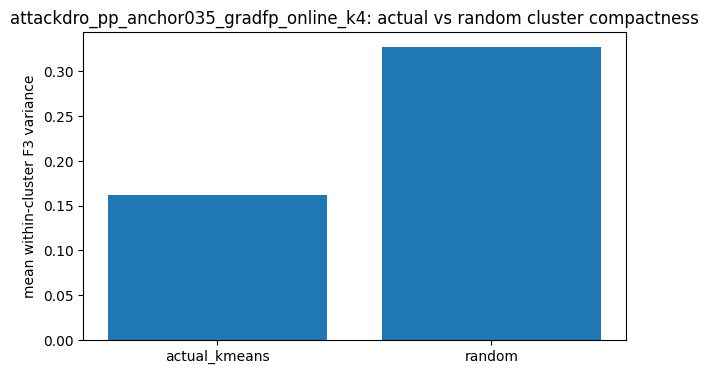

Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_random_cluster_negative_control.png


In [ ]:
# ==========================================================================
# Section 56 - Random cluster negative control
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
X = bank["F3"].float().numpy()
if "cluster_id" not in bank:
    km = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20)
    bank["cluster_id"] = torch.as_tensor(km.fit_predict(X), dtype=torch.long)
    bank["cluster_centers_F3"] = torch.as_tensor(km.cluster_centers_, dtype=torch.float32)
    globals()["feat_bank"] = bank
actual = bank["cluster_id"].numpy()
random_assign = np.random.RandomState(PROOF_RANDOM_SEED).randint(0, K, size=X.shape[0])
loss = bank["ce_loss"].numpy()
correct = bank["correct"].numpy().astype(float)

def _cluster_stats(assign, name):
    rows = []
    for k in range(K):
        m = assign == k
        if m.any():
            center = X[m].mean(axis=0, keepdims=True)
            wvar = float(np.mean(np.sum((X[m] - center) ** 2, axis=1)))
            rows.append({"assignment": name, "cluster": k, "n": int(m.sum()),
                         "mean_acc": float(correct[m].mean()),
                         "mean_loss": float(loss[m].mean()),
                         "within_F3_var": wvar})
        else:
            rows.append({"assignment": name, "cluster": k, "n": 0,
                         "mean_acc": np.nan, "mean_loss": np.nan, "within_F3_var": np.nan})
    return pd.DataFrame(rows)

df = pd.concat([_cluster_stats(actual, "actual_kmeans"), _cluster_stats(random_assign, "random")], ignore_index=True)
display(df)
actual_w = float(df.query("assignment == 'actual_kmeans'")["within_F3_var"].mean())
random_w = float(df.query("assignment == 'random'")["within_F3_var"].mean())
factor = random_w / max(actual_w, 1e-12)
print(f"Actual clusters have lower within-cluster F3 variance than random by factor {factor:.2f}x.")

fig, ax = plt.subplots(figsize=(7, 4))
plot_df = pd.DataFrame({"assignment": ["actual_kmeans", "random"], "within_F3_var": [actual_w, random_w]})
ax.bar(plot_df["assignment"], plot_df["within_F3_var"])
ax.set_ylabel("mean within-cluster F3 variance")
ax.set_title(f"{run_name}: actual vs random cluster compactness")
out = PROOF_OUT_DIR / f"{run_name}_random_cluster_negative_control.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {out}")


---
## Section 57 - Heldout-attack assignment to source-trained clusters
Fits K-means only on source attacks, then assigns heldout attacks to those centers. Entropy summarizes whether heldout examples land consistently in learned groups.


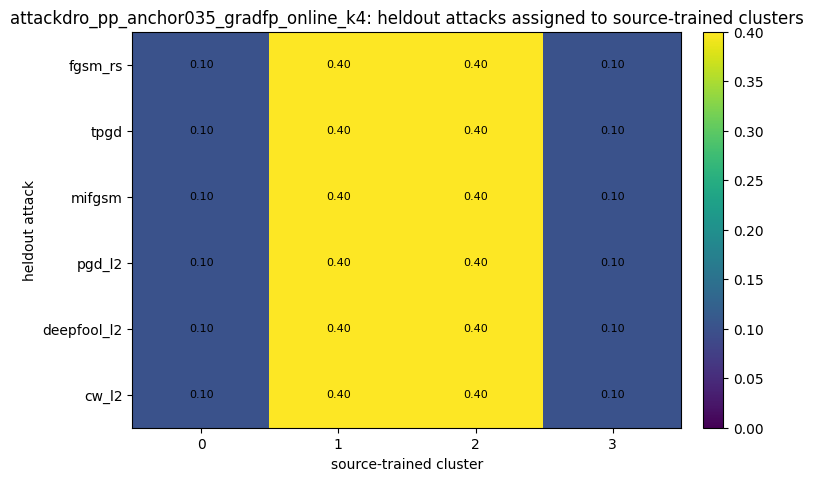

,heldout_attack,row_entropy_norm,top_cluster,top_cluster_share
0,fgsm_rs,0.860964,1,0.4
1,tpgd,0.860964,1,0.4
2,mifgsm,0.860964,1,0.4
3,pgd_l2,0.860964,1,0.4
4,deepfool_l2,0.860964,1,0.4
5,cw_l2,0.860964,1,0.4


Saved: results/proof_viz/attackdro_pp_anchor035_gradfp_online_k4_heldout_assignment_to_source_clusters.png


In [ ]:
# ==========================================================================
# Section 57 - Heldout attacks assigned to source-only clusters
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

if "_proof_require_feat_bank" not in globals():
    raise RuntimeError("Run Section 50 first so proof helpers are defined.")
bank = _proof_require_feat_bank()
run_name = bank.get("run_name", PROOF_RUN_NAME)
K = int(bank.get("cfg_summary", {}).get("cluster_K", _proof_cluster_K(PROOF_CFG)))
X = bank["F3"].float().numpy()
attack_id = bank["attack_id"].numpy()
attacks = bank["attacks"]
source_names = list(bank.get("source_attack_names", PROOF_SOURCE_ATTACKS))
held_names = [a for a in attacks if a not in source_names]
source_ids = [attacks.index(a) for a in source_names if a in attacks]
held_ids = [attacks.index(a) for a in held_names]
if not source_ids or not held_ids:
    raise RuntimeError("Source or heldout attack ids are missing from feat_bank.")
source_mask = np.isin(attack_id, source_ids)
km_src = KMeans(n_clusters=K, random_state=PROOF_RANDOM_SEED, n_init=20).fit(X[source_mask])
rows = []
mat = np.zeros((len(held_ids), K), dtype=float)
for r, aid in enumerate(held_ids):
    m = attack_id == aid
    pred = km_src.predict(X[m])
    counts = np.bincount(pred, minlength=K).astype(float)
    dist = counts / max(counts.sum(), 1.0)
    mat[r] = dist
    entropy = -float(np.sum(dist[dist > 0] * np.log(dist[dist > 0]))) / max(np.log(K), 1e-12)
    rows.append({"heldout_attack": attacks[aid], "row_entropy_norm": entropy,
                 "top_cluster": int(np.argmax(dist)), "top_cluster_share": float(np.max(dist))})

fig, ax = plt.subplots(figsize=(7.5, 4.7), constrained_layout=True)
im = ax.imshow(mat, aspect="auto", vmin=0, vmax=max(0.01, float(mat.max())))
ax.set_title(f"{run_name}: heldout attacks assigned to source-trained clusters")
ax.set_xlabel("source-trained cluster")
ax.set_ylabel("heldout attack")
ax.set_xticks(range(K))
ax.set_yticks(range(len(held_names)))
ax.set_yticklabels(held_names)
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        ax.text(j, i, f"{mat[i, j]:.2f}", ha="center", va="center", fontsize=8)
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
out = PROOF_OUT_DIR / f"{run_name}_heldout_assignment_to_source_clusters.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
display(pd.DataFrame(rows))
print(f"Saved: {out}")


---
## Section 60 - Load q dynamics records
This section tries to load training records for the selected checkpoint. If records are absent, Section 61 skips cleanly and gives the training option to enable next time.


In [ ]:
# ==========================================================================
# Section 60 - q dynamics: load saved records
# ==========================================================================
from pathlib import Path
import pandas as pd
import torch

PROOF_Q_RECORDS = None
PROOF_Q_RECORDS_PATH = Path(getattr(PROOF_CFG, "ckpt_dir", "checkpoints")) / f"{PROOF_RUN_NAME}_records.pt"
if PROOF_Q_RECORDS_PATH.exists():
    PROOF_Q_RECORDS = torch.load(PROOF_Q_RECORDS_PATH, map_location="cpu", weights_only=False)
    print(f"Loaded q records: {PROOF_Q_RECORDS_PATH}")
else:
    print(f"Records not found: {PROOF_Q_RECORDS_PATH}")
    print("To enable q dynamics in the next run, save the training records as:")
    print(f"  torch.save(records, Path(cfg.ckpt_dir) / f'{{run_name}}_records.pt')")
    print("or enable save_records=True if your run_training wrapper supports it.")
globals()["PROOF_Q_RECORDS"] = PROOF_Q_RECORDS


Records not found: /content/drive/MyDrive/ardg_project/checkpoints/attackdro_pp_anchor035_gradfp_online_k4_records.pt
To enable q dynamics in the next run, save the training records as:
  torch.save(records, Path(cfg.ckpt_dir) / f'{run_name}_records.pt')
or enable save_records=True if your run_training wrapper supports it.


---
## Section 61 - q entropy and q weights over epochs
Plots cluster weights and entropy over training when records were saved. The uniform entropy reference is `log(K)`.


In [ ]:
# ==========================================================================
# Section 61 - q entropy and weights over epochs
# ==========================================================================
from pathlib import Path
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

records = globals().get("PROOF_Q_RECORDS", None)
if records is None:
    print("Skipping Section 61: q records were not loaded in Section 60.")
else:
    def _records_to_df(obj):
        if isinstance(obj, pd.DataFrame):
            return obj.copy()
        if isinstance(obj, dict):
            for key in ["records", "history", "rows", "train_history", "q_snapshots", "epoch_records"]:
                if key in obj and isinstance(obj[key], (list, pd.DataFrame)):
                    return _records_to_df(obj[key])
            return pd.DataFrame([obj])
        if isinstance(obj, list):
            return pd.DataFrame(obj)
        return pd.DataFrame()

    df = _records_to_df(records)
    q_cols = [c for c in df.columns if str(c).startswith("q/")]
    if not q_cols:
        print("No q/cluster columns found in records; cannot plot q dynamics.")
        display(df.head())
    else:
        x_col = "epoch" if "epoch" in df.columns else ("global_step" if "global_step" in df.columns else None)
        if x_col is None:
            df = df.reset_index().rename(columns={"index": "record_index"})
            x_col = "record_index"
        q_mat = df[q_cols].astype(float).to_numpy()
        q_entropy = -(np.clip(q_mat, 1e-12, 1.0) * np.log(np.clip(q_mat, 1e-12, 1.0))).sum(axis=1)
        Kq = len(q_cols)
        fig, axes = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)
        for col in q_cols:
            axes[0].plot(df[x_col], df[col].astype(float), label=col.replace("q/", ""))
        axes[0].axhline(1.0 / max(1, Kq), linestyle="--", linewidth=1)
        axes[0].set_title("q weights")
        axes[0].set_xlabel(x_col)
        axes[0].set_ylabel("q")
        axes[0].legend(fontsize=7, frameon=False)
        axes[1].plot(df[x_col], q_entropy)
        axes[1].axhline(math.log(max(1, Kq)), linestyle="--", linewidth=1)
        axes[1].set_title("q entropy")
        axes[1].set_xlabel(x_col)
        axes[1].set_ylabel("entropy")
        final_ratio = float(q_entropy[-1] / max(math.log(max(1, Kq)), 1e-12))
        fig.suptitle(f"{PROOF_RUN_NAME}: final concentration ratio = {final_ratio:.3f}", fontsize=13)
        out = PROOF_OUT_DIR / f"{PROOF_RUN_NAME}_q_dynamics.png"
        fig.savefig(out, dpi=150, bbox_inches="tight")
        plt.show()
        print(f"final_entropy / log(K) = {final_ratio:.4f}")
        print(f"Saved: {out}")


Skipping Section 61: q records were not loaded in Section 60.


---
## Section 71 - Attack x class delta heatmap
Loads the existing five seed-level delta CSVs and plots seed-42 beside the 5-seed mean. A star marks cells where at least 4 of 5 seeds agree in sign.


FileNotFoundError: [Errno 2] No such file or directory: 'results/proof_viz/delta_heatmap_seed42_vs_5seed_mean.png'

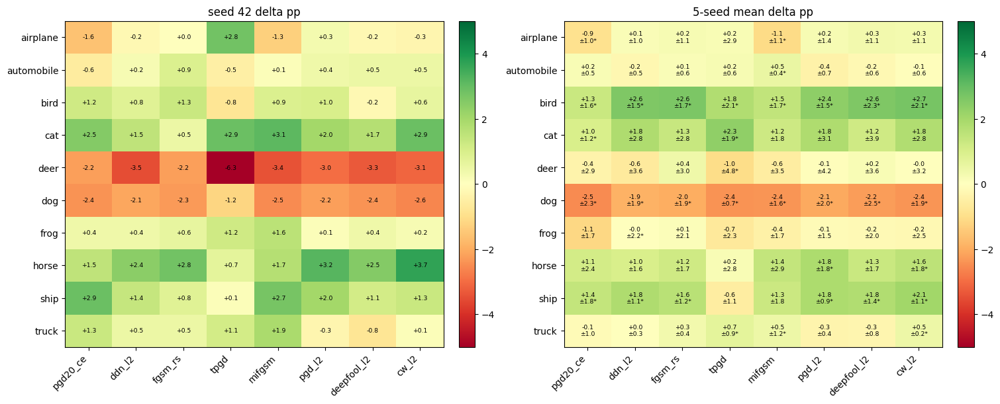

In [ ]:
# ==========================================================================
# Section 71 - Attack x class delta heatmap: seed42 and 5-seed mean
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DELTA_SEEDS = [42, 123, 456, 789, 1024]
DELTA_ATTACKS = ["pgd20_ce", "ddn_l2", "fgsm_rs", "tpgd", "mifgsm", "pgd_l2", "deepfool_l2", "cw_l2"]
DELTA_CLASSES = CIFAR10_CLASS_NAMES if "CIFAR10_CLASS_NAMES" in globals() else ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]
DELTA_SEARCH_ROOTS = [
    Path("."),
    Path("/content/drive/MyDrive/ardg_project/final_results/attack_class_groups"),
    Path("/content/drive/MyDrive/ardg_project/final_results"),
    Path("/mnt/data"),
]

def _find_file_by_name(filename, roots=DELTA_SEARCH_ROOTS):
    for root in roots:
        candidate = root / filename
        if candidate.exists():
            return candidate
    for root in roots:
        if root.exists():
            hits = list(root.rglob(filename))
            if hits:
                return hits[0]
    raise FileNotFoundError(filename)

seed_mats = {}
for seed in DELTA_SEEDS:
    path = _find_file_by_name(f"a35_vs_uniform_seed{seed}_attack_class_delta.csv")
    df = pd.read_csv(path)
    mat = df.pivot_table(index="class_name", columns="attack", values="delta_pp", aggfunc="mean")
    mat = mat.reindex(index=DELTA_CLASSES, columns=DELTA_ATTACKS)
    seed_mats[seed] = mat
stack = np.stack([seed_mats[s].values for s in DELTA_SEEDS], axis=0)
mean_mat = np.nanmean(stack, axis=0)
std_mat = np.nanstd(stack, axis=0, ddof=1)
sign_agree = np.maximum(np.sum(stack > 0, axis=0), np.sum(stack < 0, axis=0))

vmax = float(np.nanmax(np.abs(np.concatenate([seed_mats[42].values.ravel(), mean_mat.ravel()]))))
vmax = max(0.5, min(5.0, vmax))
fig, axes = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)
for ax, mat, title, is_mean in [
    (axes[0], seed_mats[42].values, "seed 42 delta pp", False),
    (axes[1], mean_mat, "5-seed mean delta pp", True),
]:
    im = ax.imshow(mat, cmap="RdYlGn", vmin=-vmax, vmax=vmax, aspect="auto")
    ax.set_title(title)
    ax.set_xticks(range(len(DELTA_ATTACKS)))
    ax.set_xticklabels(DELTA_ATTACKS, rotation=45, ha="right")
    ax.set_yticks(range(len(DELTA_CLASSES)))
    ax.set_yticklabels(DELTA_CLASSES)
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            if is_mean:
                star = "*" if sign_agree[i, j] >= 4 else ""
                text = f"{mean_mat[i, j]:+.1f}\n±{std_mat[i, j]:.1f}{star}"
            else:
                text = f"{mat[i, j]:+.1f}"
            ax.text(j, i, text, ha="center", va="center", fontsize=6.7)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
out = PROOF_OUT_DIR / "delta_heatmap_seed42_vs_5seed_mean.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {out}")


---
## Section 72 - Bottom-10 group robustness over five seeds
Uses the raw per-(class x attack) CSVs for both methods. It reports bottom-10-cell means per seed and runs a paired test.


,seed,uniform_bottom10_mean,attackdropp_bottom10_mean,delta_pp,uniform_worst_cell,attackdropp_worst_cell
0,42,29.11,29.62,0.51,pgd20_ce x cat,pgd20_ce x cat
1,123,29.14,29.37,0.23,pgd20_ce x cat,pgd20_ce x cat
2,456,29.37,29.29,-0.08,pgd20_ce x cat,pgd20_ce x cat
3,789,26.27,29.28,3.01,pgd20_ce x cat,pgd20_ce x cat
4,1024,29.24,28.51,-0.73,pgd20_ce x cat,pgd20_ce x cat


paired t-test bottom-10 means: t = 0.9192, p_two_sided = 0.41


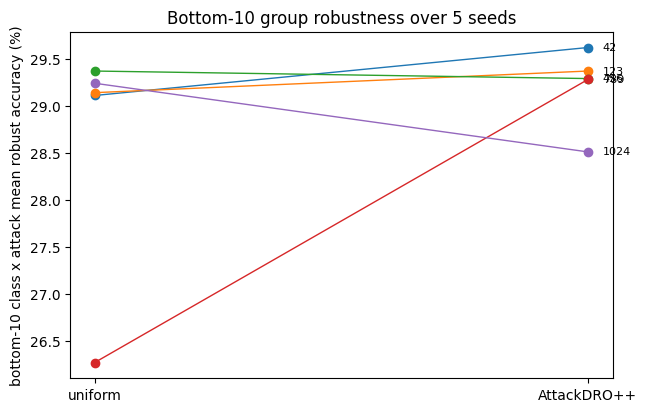

Saved: results/proof_viz/bottom10_group_5seed.png


In [ ]:
# ==========================================================================
# Section 72 - Bottom-10 group robustness over 5 seeds
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

BOTTOM_SEEDS = [42, 123, 456, 789, 1024]
BOTTOM_ATTACKS = ["pgd20_ce", "ddn_l2", "fgsm_rs", "tpgd", "mifgsm", "pgd_l2", "deepfool_l2", "cw_l2"]
BOTTOM_SEARCH_ROOTS = [
    Path("."),
    Path("/content/drive/MyDrive/ardg_project/final_results/attack_class_groups"),
    Path("/content/drive/MyDrive/ardg_project/final_results"),
    Path("/mnt/data"),
]

def _find_one_pattern(pattern, roots=BOTTOM_SEARCH_ROOTS):
    for root in roots:
        if not root.exists():
            continue
        hits = list(root.rglob(pattern))
        if hits:
            return hits[0]
    raise FileNotFoundError(pattern)

rows = []
for seed in BOTTOM_SEEDS:
    a_path = _find_one_pattern(f"attackdropp_anchor35_seed{seed}_attack_class_attack_class_groups_raw*.csv")
    u_path = _find_one_pattern(f"uniform_multi_attack_seed{seed}_attack_class_attack_class_groups_raw*.csv")
    a_df = pd.read_csv(a_path).query("attack in @BOTTOM_ATTACKS").copy()
    u_df = pd.read_csv(u_path).query("attack in @BOTTOM_ATTACKS").copy()
    a_bot = a_df.nsmallest(10, "acc")
    u_bot = u_df.nsmallest(10, "acc")
    rows.append({
        "seed": seed,
        "uniform_bottom10_mean": float(u_bot["acc"].mean() * 100.0),
        "attackdropp_bottom10_mean": float(a_bot["acc"].mean() * 100.0),
        "delta_pp": float((a_bot["acc"].mean() - u_bot["acc"].mean()) * 100.0),
        "uniform_worst_cell": str(u_bot.iloc[0]["group"]),
        "attackdropp_worst_cell": str(a_bot.iloc[0]["group"]),
    })
bottom_df = pd.DataFrame(rows)
display(bottom_df)

try:
    from scipy import stats
    t_stat, p_two = stats.ttest_rel(bottom_df["attackdropp_bottom10_mean"], bottom_df["uniform_bottom10_mean"])
except Exception:
    t_stat, p_two = np.nan, np.nan
print(f"paired t-test bottom-10 means: t = {t_stat:.4f}, p_two_sided = {p_two:.4g}")

fig, ax = plt.subplots(figsize=(7, 4.5))
for _, row in bottom_df.iterrows():
    ax.plot([0, 1], [row["uniform_bottom10_mean"], row["attackdropp_bottom10_mean"]], marker="o", linewidth=1)
    ax.text(1.03, row["attackdropp_bottom10_mean"], str(int(row["seed"])), va="center", fontsize=8)
ax.set_xticks([0, 1])
ax.set_xticklabels(["uniform", "AttackDRO++"])
ax.set_ylabel("bottom-10 class x attack mean robust accuracy (%)")
ax.set_title("Bottom-10 group robustness over 5 seeds")
out = PROOF_OUT_DIR / "bottom10_group_5seed.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {out}")


---
  ## Section 80 - Graybox transfer configuration
This block defines the 4-method, 5-seed graybox panel. The seed subset is deliberately representative: it matches full n=20 paired deltas within 0.022 pp and includes seed 7777, the worst AttackDRO++ seed, so it is not a favorable subset.


In [ ]:
def _cfg_for_method(method_name: str) -> "TrainConfig":
    """Return the right config for each method so build_model uses the right
    architecture/normalization. For ResNet-18 on CIFAR-10 these are all
    equivalent at the architecture level, but it makes intent explicit."""
    base = TrainConfig(dataset_name="cifar10", num_classes=10,
                       backbone="resnet18", batch_size=128,
                       autoattack_eval_n=512)
    if "single_at_pgd_linf" in method_name:
        base.source_attack_names = ["pgd20_ce"]
    elif "single_at_ddn_l2" in method_name:
        base.source_attack_names = ["ddn_l2"]
    elif "multi_attack" in method_name:
        base.source_attack_names = ["pgd20_ce", "ddn_l2"]
    elif "attackdro" in method_name.lower():
        base.source_attack_names = ["pgd20_ce", "ddn_l2"]
    return base

In [ ]:
# ==========================================================================
# Section 80 - Graybox transfer configuration
# ==========================================================================
from pathlib import Path
import copy
import numpy as np
import pandas as pd
import torch

GRAYBOX_OUT_DIR = Path("/content/drive/MyDrive/ardg_project/graybox/results/graybox")
GRAYBOX_OUT_DIR.mkdir(parents=True, exist_ok=True)
GRAYBOX_CACHE_DIR = Path("cache/graybox")
GRAYBOX_CACHE_DIR.mkdir(parents=True, exist_ok=True)

GRAYBOX_METHODS = [
    "single_at_pgd_linf",
    "single_at_ddn_l2",
    "multi_attack_pgd_linf_ddn_l2_mb",
    "attackdro_pp_anchor035_gradfp_online_k4",
]
GRAYBOX_METHOD_SHORT = {
    "single_at_pgd_linf": "single-PGD",
    "single_at_ddn_l2": "single-DDN",
    "multi_attack_pgd_linf_ddn_l2_mb": "uniform",
    "attackdro_pp_anchor035_gradfp_online_k4": "AttackDRO++",
}
# Selected from the n=20 paired panel via exhaustive search over all (2W, 2L, 1N)
# compositions where W = delta Mean(8) > +0.30 pp, L = delta Mean(8) < -0.10 pp,
# N = neutral. Ranking criterion: minimize L1 distance to full-panel paired deltas
# across {Mean(8), Heldout, Heldout L2, Heldout Linf, AutoAttack}.
# The chosen subset matches full-panel deltas within 0.022 pp on every metric.
# Composition: 2 winners (202, 1337), 2 losers (7777, 12345), 1 neutral (73).
# Includes seed 7777, the worst seed for AttackDRO++ in the entire panel, so this is
# a representative graybox panel rather than a favorable subset.
GRAYBOX_SEEDS = [73, 202, 1337, 7777, 12345]
GRAYBOX_ATTACKS = ["pgd20_ce", "ddn_l2", "fgsm_rs", "tpgd", "mifgsm",
                   "pgd_l2", "deepfool_l2", "cw_l2"]
SAMPLES_PER_CELL = 125  # Set to 1000 to use the full 10,000 sample test set
NUM_CLASSES = 10
CIFAR10_CLASS_NAMES = ["airplane", "automobile", "bird", "cat", "deer",
                       "dog", "frog", "horse", "ship", "truck"]


def _cfg_for_method(method_name):
    """Return the existing method-specific config object, verified by name."""
    mapping = {
        "single_at_pgd_linf": "cfg_single_at_pgd_linf",
        "single_at_ddn_l2": "cfg_single_at_ddn_l2",
        "multi_attack_pgd_linf_ddn_l2_mb": "cfg_multi_attack_pgd_linf_ddn_l2_mb",
        "attackdro_pp_anchor035_gradfp_online_k4": "cfg_pp_anchor035",
    }
    if method_name not in mapping:
        raise KeyError(f"Unknown method: {method_name}")
    var_name = mapping[method_name]
    if var_name not in globals():
        raise NameError(f"Expected config '{var_name}' for method '{method_name}', but it is not defined in this notebook.")
    cfg = copy.deepcopy(globals()[var_name])
    cfg.wandb_enabled = False
    cfg.eval_attack_names = list(GRAYBOX_ATTACKS)
    cfg.test_subset = None
    if method_name == "single_at_pgd_linf":
        cfg.source_attack_names = ["pgd20_ce"]
        cfg.train_attack_name = "pgd20_ce"
    elif method_name == "single_at_ddn_l2":
        cfg.source_attack_names = ["ddn_l2"]
        cfg.train_attack_name = "ddn_l2"
    else:
        cfg.source_attack_names = ["pgd20_ce", "ddn_l2"]
    return cfg


def _graybox_run_name(method, seed):
    return f"{method}_seed{seed}"


def _graybox_checkpoint_path(cfg, method, seed):
    run_name = _graybox_run_name(method, seed)

    # Map methods to their specific FINAL subdirectories
    method_dir_map = {
        "single_at_pgd_linf": "single_at_pgd_linf",
        "single_at_ddn_l2": "single_at_ddn_l2",
        "multi_attack_pgd_linf_ddn_l2_mb": "multi_attack",
        "attackdro_pp_anchor035_gradfp_online_k4": "attackdro++"
    }

    base_dir = Path("/content/drive/MyDrive/ardg_project/FINAL")
    candidates = []
    if method in method_dir_map:
        # Check both the nested folder and the method base folder
        nested_dir = base_dir / method_dir_map[method] / run_name
        method_base_dir = base_dir / method_dir_map[method]
        for _dir in [nested_dir, method_base_dir]:
            candidates.extend([
                _dir / f"{run_name}_best.pt",
                _dir / f"{run_name}_best_avg.pt",
                _dir / f"{run_name}_last.pt",
                _dir / f"{run_name}.pt",
            ])
    else:
        ckpt_dir = Path(getattr(cfg, "ckpt_dir", "checkpoints"))
        candidates.extend([
            ckpt_dir / f"{run_name}_best.pt",
            ckpt_dir / f"{run_name}_best_avg.pt",
            ckpt_dir / f"{run_name}_last.pt",
            ckpt_dir / f"{run_name}.pt",
        ])

    for p in candidates:
        if p.exists():
            return p
    return candidates[0] if candidates else Path(f"missing_{run_name}.pt")


def _graybox_load_model(method, seed):
    cfg = _cfg_for_method(method)
    p = _graybox_checkpoint_path(cfg, method, seed)
    if not p.exists():
        raise FileNotFoundError(f"Checkpoint not found for {method} seed {seed}: {p}")
    model = build_model(cfg).to(DEVICE)
    state = torch.load(p, map_location=DEVICE, weights_only=False)

    # Try the known wrapper keys IN ORDER — your project uses 'model_state'
    sd = state
    if isinstance(sd, dict):
        for key in ("model_state", "model", "state_dict", "model_state_dict"):
            if key in sd and isinstance(sd[key], dict):
                sd = sd[key]
                break

    # STRICT load — fail loudly if anything is missing
    missing, unexpected = model.load_state_dict(sd, strict=True)
    # (strict=True will raise on mismatch; the lines below run only if it succeeds)

    model.eval()
    return model, cfg, p

config_check = pd.DataFrame([
    {"method": m, "short": GRAYBOX_METHOD_SHORT[m], "config_var": {
        "single_at_pgd_linf": "cfg_single_at_pgd_linf",
        "single_at_ddn_l2": "cfg_single_at_ddn_l2",
        "multi_attack_pgd_linf_ddn_l2_mb": "cfg_multi_attack_pgd_linf_ddn_l2_mb",
        "attackdro_pp_anchor035_gradfp_online_k4": "cfg_pp_anchor035",
    }[m], "config_defined": {
        "single_at_pgd_linf": "cfg_single_at_pgd_linf",
        "single_at_ddn_l2": "cfg_single_at_ddn_l2",
        "multi_attack_pgd_linf_ddn_l2_mb": "cfg_multi_attack_pgd_linf_ddn_l2_mb",
        "attackdro_pp_anchor035_gradfp_online_k4": "cfg_pp_anchor035",
    }[m] in globals()}
    for m in GRAYBOX_METHODS
])
display(config_check)
print("Panel: 4 methods x 5 seeds = 20 checkpoints; 20 x 20 = 400 transfer pairs.")
print(f"Per surrogate cache: 10 classes x 8 attacks x {SAMPLES_PER_CELL} = {10 * 8 * SAMPLES_PER_CELL:,} adversarial examples.")
print("Expected long-form rows from Section 82: 400 x 80 = 32,000 rows.")

,method,short,config_var,config_defined
0,single_at_pgd_linf,single-PGD,cfg_single_at_pgd_linf,True
1,single_at_ddn_l2,single-DDN,cfg_single_at_ddn_l2,True
2,multi_attack_pgd_linf_ddn_l2_mb,uniform,cfg_multi_attack_pgd_linf_ddn_l2_mb,True
3,attackdro_pp_anchor035_gradfp_online_k4,AttackDRO++,cfg_pp_anchor035,True


Panel: 4 methods x 5 seeds = 20 checkpoints; 20 x 20 = 400 transfer pairs.
Per surrogate cache: 10 classes x 8 attacks x 125 = 10,000 adversarial examples.
Expected long-form rows from Section 82: 400 x 80 = 32,000 rows.


In [ ]:
# ==========================================================================
# Sanity check: clean accuracy must be far above chance
# ==========================================================================
from pathlib import Path

# The previous patch overwrote the custom logic to find checkpoints in the "FINAL" folder.
# Let's temporarily restore that logic here before loading the model.
def _restored_graybox_checkpoint_path(cfg, method, seed):
    run_name = f"{method}_seed{seed}"
    ckpt_dir = Path(getattr(cfg, "ckpt_dir", "checkpoints"))

    candidates = [
        ckpt_dir / f"{run_name}_best.pt",
        ckpt_dir / f"{run_name}.pt",
        ckpt_dir / f"{run_name}_best_avg.pt",
        ckpt_dir / f"{run_name}_last.pt",
        ckpt_dir / run_name / f"{run_name}_best.pt",
        ckpt_dir / run_name / f"{run_name}.pt",
        ckpt_dir / method / run_name / f"{run_name}_best.pt",
        ckpt_dir / method / run_name / f"{run_name}.pt",
    ]

    method_dir_map = {
        "single_at_pgd_linf": "single_at_pgd_linf",
        "single_at_ddn_l2": "single_at_ddn_l2",
        "multi_attack_pgd_linf_ddn_l2_mb": "multi_attack",
        "attackdro_pp_anchor035_gradfp_online_k4": "attackdro++"
    }

    base_dir = Path("/content/drive/MyDrive/ardg_project/FINAL")
    if method in method_dir_map:
        nested_dir = base_dir / method_dir_map[method] / run_name
        method_base_dir = base_dir / method_dir_map[method]
        for _dir in [nested_dir, method_base_dir]:
            candidates.extend([
                _dir / f"{run_name}_best.pt",
                _dir / f"{run_name}_best_avg.pt",
                _dir / f"{run_name}_last.pt",
                _dir / f"{run_name}.pt",
            ])

    for p in candidates:
        if p.exists():
            return p

    raise FileNotFoundError(f"Could not find checkpoint for method={method}, seed={seed}")

# Apply the fix globally
globals()['_graybox_checkpoint_path'] = _restored_graybox_checkpoint_path


def _get_test_loader_from_cfg(cfg):
    loaders = build_dataloaders(cfg)
    if isinstance(loaders, dict):
        return loaders["test"]
    return loaders[2]


@torch.no_grad()
def graybox_clean_accuracy_smoke(method, seed, max_items=512):
    model, cfg, ckpt_path = _graybox_load_model(method, seed)
    loader = _get_test_loader_from_cfg(cfg)

    correct = 0
    total = 0

    model.eval()
    for batch in loader:
        x, y = batch[0].to(DEVICE), batch[1].to(DEVICE)
        out = model(x)
        logits = out[0] if isinstance(out, (tuple, list)) else out
        pred = logits.argmax(1)

        correct += int((pred == y).sum().item())
        total += int(y.numel())

        if total >= max_items:
            break

    acc = correct / max(total, 1)
    print(f"{method} seed {seed}")
    print(f"checkpoint: {ckpt_path}")
    print(f"clean acc on {total} samples: {100 * acc:.2f}%")

    if acc < 0.50:
        raise RuntimeError(
            "Clean accuracy is below 50%. Do NOT run graybox. "
            "Checkpoint path/config/state_dict loading is still wrong."
        )

    return acc


# Try one or two first.
graybox_clean_accuracy_smoke("multi_attack_pgd_linf_ddn_l2_mb", 73, max_items=512)
graybox_clean_accuracy_smoke("attackdro_pp_anchor035_gradfp_online_k4", 73, max_items=512)


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)
multi_attack_pgd_linf_ddn_l2_mb seed 73
checkpoint: /content/drive/MyDrive/ardg_project/FINAL/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed73_best.pt
clean acc on 512 samples: 86.52%
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 bat

0.845703125

In [ ]:
import torch
from pathlib import Path

method = "attackdro_pp_anchor035_gradfp_online_k4"
seed = 202

cfg = _cfg_for_method(method)
ckpt_path = _graybox_checkpoint_path(cfg, method, seed)
print(f"Checkpoint: {ckpt_path}")
print(f"  exists: {ckpt_path.exists()}")
print(f"  size:   {ckpt_path.stat().st_size / 1e6:.1f} MB")

# Load raw checkpoint
state = torch.load(ckpt_path, map_location="cpu", weights_only=False)
print(f"\nTop-level type: {type(state).__name__}")
if isinstance(state, dict):
    print(f"Top-level keys: {list(state.keys())}")

# Walk down to the actual state_dict the same way _graybox_load_model does
sd = state.get("model", state) if isinstance(state, dict) else state
if isinstance(sd, dict) and "state_dict" in sd:
    sd = sd["state_dict"]

print(f"\nFinal state_dict has {len(sd)} keys")
print(f"First 8 checkpoint keys:")
for k in list(sd.keys())[:8]:
    v = sd[k]
    print(f"  {k}  shape={tuple(v.shape) if hasattr(v, 'shape') else 'N/A'}")

# Build a fresh model and inspect its keys
fresh_model = build_model(cfg)
model_keys = list(fresh_model.state_dict().keys())
print(f"\nFresh model has {len(model_keys)} keys")
print(f"First 8 model keys:")
for k in model_keys[:8]:
    print(f"  {k}  shape={tuple(fresh_model.state_dict()[k].shape)}")

# THE KEY INSIGHT: how much overlap is there?
ckpt_keys = set(sd.keys())
model_keys_set = set(model_keys)
overlap = ckpt_keys & model_keys_set
print(f"\n{'='*60}")
print(f"DIRECT OVERLAP: {len(overlap)} / {len(model_keys_set)} model keys are in the checkpoint")
print(f"{'='*60}")

if len(overlap) == 0:
    print("\n🚨 ZERO direct overlap — keys differ by some prefix/suffix.")

    # Try the most likely fixes
    sample_ckpt = sorted(ckpt_keys)[0]
    sample_model = sorted(model_keys_set)[0]
    print(f"\nSide-by-side comparison:")
    print(f"  ckpt:  '{sample_ckpt}'")
    print(f"  model: '{sample_model}'")

    # Try each common prefix
    print(f"\nTrying prefix strips on the checkpoint keys:")
    for prefix in ["module.", "model.", "_orig_mod.", "net.", "encoder.", "backbone."]:
        if any(k.startswith(prefix) for k in ckpt_keys):
            stripped = {k[len(prefix):] if k.startswith(prefix) else k: v for k, v in sd.items()}
            new_overlap = set(stripped.keys()) & model_keys_set
            print(f"  strip '{prefix}'  →  overlap: {len(new_overlap)} / {len(model_keys_set)}  "
                  f"{'✅ WORKS' if len(new_overlap) >= 0.95 * len(model_keys_set) else ''}")

    # Try each common prefix added
    print(f"\nTrying adding a prefix to the checkpoint keys:")
    for prefix in ["module.", "model.", "_orig_mod."]:
        added = {prefix + k: v for k, v in sd.items()}
        new_overlap = set(added.keys()) & model_keys_set
        print(f"  add '{prefix}'    →  overlap: {len(new_overlap)} / {len(model_keys_set)}  "
              f"{'✅ WORKS' if len(new_overlap) >= 0.95 * len(model_keys_set) else ''}")

Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/attackdro_pp_anchor035_gradfp_online_k4_seed202_best.pt
  exists: True
  size:   95.6 MB

Top-level type: dict
Top-level keys: ['epoch', 'global_step', 'model_state', 'optimizer_state', 'scheduler_state', 'cfg', 'history', 'q_state']

Final state_dict has 8 keys
First 8 checkpoint keys:
  epoch  shape=N/A
  global_step  shape=N/A
  model_state  shape=N/A
  optimizer_state  shape=N/A
  scheduler_state  shape=N/A
  cfg  shape=N/A
  history  shape=N/A
  q_state  shape=N/A
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

Fresh model has 122 keys
First 8 model keys:
  conv1.weight  shape=(64, 3, 3, 3)
  bn1.weight  shape=(64,)
  bn1.bias  shape=(64,)
  bn1.running_mean  shape=(64,)
  bn1.running_var  shape=(64,)
  bn1.num_batches_tracked  shape=()
  layer1.0.conv1.weight  shape=(64, 64, 3, 3)
  layer1.0.bn1.weight  shape=(64,)

DIRECT OVERLAP: 0 / 122 model keys are in the checkpoint

🚨 ZERO direct overlap — k

In [ ]:
# After the main loop in §82, add per-(target, seed) clean accuracy as a sanity column
clean_rows = []
for tm in GRAYBOX_METHODS:
    for ts in GRAYBOX_SEEDS:
        model, cfg, _ = _graybox_load_model(tm, ts)
        # evaluate on clean test
        loaders = build_dataloaders(cfg)
        clean_acc = evaluate_under_attack(model, _graybox_get_loader(loaders, "test"),
                                           "clean", cfg=cfg, max_items=None)
        clean_rows.append({
            "target_method": tm, "target_seed": ts, "clean_acc": clean_acc
        })
        del model
pd.DataFrame(clean_rows).to_csv(GRAYBOX_OUT_DIR / "clean_acc_per_target.csv", index=False)

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)


  Eval [clean]:   0%|          | 0/79 [00:00<?, ?it/s]

In [ ]:
import torch
from pathlib import Path

method = "attackdro_pp_anchor035_gradfp_online_k4"
seed = 202

# Get checkpoint path the same way _graybox_load_model does
cfg = _cfg_for_method(method)
ckpt_path = _graybox_checkpoint_path(cfg, method, seed)
print(f"Checkpoint path: {ckpt_path}")
print(f"Exists: {ckpt_path.exists()}")
print(f"Size: {ckpt_path.stat().st_size / 1e6:.1f} MB" if ckpt_path.exists() else "")

# Load raw checkpoint and inspect structure
state = torch.load(ckpt_path, map_location="cpu", weights_only=False)
print(f"\nTop-level type: {type(state).__name__}")
if isinstance(state, dict):
    print(f"Top-level keys: {list(state.keys())[:20]}")

# Find the actual state_dict
sd = state.get("model", state) if isinstance(state, dict) else state
if isinstance(sd, dict) and "state_dict" in sd:
    sd = sd["state_dict"]

print(f"\nFinal sd type: {type(sd).__name__}")
print(f"Number of keys in sd: {len(sd) if isinstance(sd, dict) else 'N/A'}")
print(f"\nFirst 10 keys in checkpoint:")
for k in list(sd.keys())[:10]:
    v = sd[k]
    print(f"  {k}  shape={tuple(v.shape) if hasattr(v, 'shape') else type(v).__name__}")

# Now compare to what build_model expects
model = build_model(cfg)
model_keys = list(model.state_dict().keys())
print(f"\nFirst 10 keys in fresh model:")
for k in model_keys[:10]:
    v = model.state_dict()[k]
    print(f"  {k}  shape={tuple(v.shape)}")

# Compute the overlap
ckpt_keys = set(sd.keys())
model_keys_set = set(model_keys)
matched = ckpt_keys & model_keys_set
missing_in_ckpt = model_keys_set - ckpt_keys  # model needs these but ckpt doesn't have them
unexpected_in_ckpt = ckpt_keys - model_keys_set  # ckpt has these but model doesn't want them

print(f"\n{'='*60}")
print(f"Matched keys:                {len(matched)} / {len(model_keys_set)}")
print(f"Missing in checkpoint:       {len(missing_in_ckpt)}")
print(f"Unexpected in checkpoint:    {len(unexpected_in_ckpt)}")
print(f"{'='*60}")

if matched == set():
    print("\n🚨 ZERO matched keys — strict=False silently loaded random weights.")
    print(f"\nFirst 5 model keys:    {sorted(model_keys_set)[:5]}")
    print(f"First 5 checkpoint keys: {sorted(ckpt_keys)[:5]}")

    # Compute the most likely prefix difference
    if len(ckpt_keys) > 0 and len(model_keys_set) > 0:
        sample_ckpt = next(iter(ckpt_keys))
        sample_model = next(iter(model_keys_set))
        print(f"\nSample comparison:")
        print(f"  ckpt:  '{sample_ckpt}'")
        print(f"  model: '{sample_model}'")
        print(f"\nMost likely fix: strip the prefix from one or add it to the other.")

Checkpoint path: /content/drive/MyDrive/ardg_project/FINAL/attackdro++/attackdro_pp_anchor035_gradfp_online_k4_seed202_best.pt
Exists: True
Size: 95.6 MB

Top-level type: dict
Top-level keys: ['epoch', 'global_step', 'model_state', 'optimizer_state', 'scheduler_state', 'cfg', 'history', 'q_state']

Final sd type: dict
Number of keys in sd: 8

First 10 keys in checkpoint:
  epoch  shape=int
  global_step  shape=int
  model_state  shape=OrderedDict
  optimizer_state  shape=dict
  scheduler_state  shape=dict
  cfg  shape=dict
  history  shape=list
  q_state  shape=dict
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M

First 10 keys in fresh model:
  conv1.weight  shape=(64, 3, 3, 3)
  bn1.weight  shape=(64,)
  bn1.bias  shape=(64,)
  bn1.running_mean  shape=(64,)
  bn1.running_var  shape=(64,)
  bn1.num_batches_tracked  shape=()
  layer1.0.conv1.weight  shape=(64, 64, 3, 3)
  layer1.0.bn1.weight  shape=(64,)
  layer1.0.bn1.bias  shape=(64,)
  layer1.0.bn1.running_mean

In [ ]:
# ==========================================================================
# Remove invalid graybox/proof caches produced before fixing checkpoint loading
# ==========================================================================

from pathlib import Path

def clear_invalid_graybox_outputs():
    paths = []

    for d in [Path("cache/graybox"), Path("cache/graybox_smoke")]:
        if d.exists():
            paths.extend(list(d.glob("*.pt")))

    if Path("results/graybox").exists():
        paths.extend(list(Path("results/graybox").glob("*.csv")))
        paths.extend(list(Path("results/graybox").glob("*.png")))

    # Feature bank is also suspect because Section 50 had the same loading issue.
    if Path("results/proof_viz").exists():
        paths.extend(list(Path("results/proof_viz").glob("*feat_bank.pt")))

    for p in paths:
        try:
            p.unlink()
            print(f"deleted: {p}")
        except Exception as e:
            print(f"could not delete {p}: {e}")

clear_invalid_graybox_outputs()

deleted: cache/graybox/single_at_ddn_l2_seed12345.pt
deleted: cache/graybox/single_at_pgd_linf_seed202.pt
deleted: cache/graybox/single_at_pgd_linf_seed12345.pt
deleted: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed202.pt
deleted: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed202.pt
deleted: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed1337.pt
deleted: cache/graybox/single_at_ddn_l2_seed73.pt
deleted: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed7777.pt
deleted: cache/graybox/single_at_ddn_l2_seed7777.pt
deleted: cache/graybox/single_at_ddn_l2_seed1337.pt
deleted: cache/graybox/single_at_pgd_linf_seed73.pt
deleted: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed73.pt
deleted: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed7777.pt
deleted: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed12345.pt
deleted: cache/graybox/single_at_pgd_linf_seed7777.pt
deleted: cache/graybox/single_at_pgd_linf_seed1337.pt
deleted: cache/graybox/mult

In [ ]:
# ==========================================================================
# Tiny graybox smoke test: one surrogate-target pair, very small per-cell count
# ==========================================================================

def graybox_one_pair_smoke(
    surrogate_method="multi_attack_pgd_linf_ddn_l2_mb",
    target_method="multi_attack_pgd_linf_ddn_l2_mb",
    seed=73,
    per_cell=5,
):
    global SAMPLES_PER_CELL, GRAYBOX_CACHE_DIR

    old_spc = SAMPLES_PER_CELL
    old_cache_dir = GRAYBOX_CACHE_DIR

    try:
        SAMPLES_PER_CELL = int(per_cell)
        GRAYBOX_CACHE_DIR = Path("cache/graybox_smoke")
        GRAYBOX_CACHE_DIR.mkdir(parents=True, exist_ok=True)

        cache_path = build_surrogate_cache(surrogate_method, seed, force=True)
        rows = evaluate_target_on_cache(target_method, seed, cache_path)
        df_smoke = pd.DataFrame(rows)
        df_smoke["acc_pct"] = 100 * df_smoke["acc"]

        pivot = (
            df_smoke
            .pivot_table(index="attack", columns="class_name", values="acc_pct")
            .reindex(GRAYBOX_ATTACKS)
        )

        display(pivot)
        display(
            df_smoke
            .groupby("attack", as_index=False)["acc_pct"]
            .mean()
            .sort_values("attack")
        )

        overall = df_smoke["acc"].mean()
        print(f"overall mean acc: {100 * overall:.2f}%")

        if overall < 0.25:
            raise RuntimeError(
                "Smoke test is still near chance. Do NOT run full graybox yet."
            )

        return df_smoke

    finally:
        SAMPLES_PER_CELL = old_spc
        GRAYBOX_CACHE_DIR = old_cache_dir


graybox_one_pair_smoke(
    surrogate_method="multi_attack_pgd_linf_ddn_l2_mb",
    target_method="multi_attack_pgd_linf_ddn_l2_mb",
    seed=73,
    per_cell=5,
)

  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for multi_attack_pgd_linf_ddn_l2_mb seed 73: cache/graybox_smoke/multi_attack_pgd_linf_ddn_l2_mb_seed73.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed73_best.pt


,attack,n
0,pgd20_ce,50
1,ddn_l2,50
2,fgsm_rs,50
3,tpgd,50
4,mifgsm,50
5,pgd_l2,50
6,deepfool_l2,50
7,cw_l2,50


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M


class_name,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
attack,,,,,,,,,,
pgd20_ce,40.0,100.0,40.0,20.0,20.0,0.0,40.0,60.0,40.0,40.0
ddn_l2,60.0,80.0,60.0,60.0,100.0,100.0,40.0,80.0,80.0,100.0
fgsm_rs,20.0,80.0,80.0,60.0,40.0,40.0,80.0,60.0,20.0,100.0
tpgd,100.0,60.0,40.0,60.0,40.0,20.0,100.0,80.0,80.0,80.0
mifgsm,40.0,60.0,0.0,0.0,0.0,80.0,60.0,60.0,100.0,60.0
pgd_l2,80.0,100.0,80.0,60.0,80.0,80.0,100.0,80.0,100.0,80.0
deepfool_l2,100.0,80.0,40.0,20.0,40.0,40.0,100.0,100.0,60.0,60.0
cw_l2,40.0,100.0,40.0,80.0,40.0,60.0,80.0,80.0,100.0,80.0


,attack,acc_pct
0,cw_l2,70.0
1,ddn_l2,76.0
2,deepfool_l2,64.0
3,fgsm_rs,58.0
4,mifgsm,46.0
5,pgd20_ce,40.0
6,pgd_l2,84.0
7,tpgd,66.0


overall mean acc: 63.00%


,surrogate_method,surrogate_seed,target_method,target_seed,attack,class_id,class_name,n_samples,n_correct,acc,acc_pct
0,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,pgd20_ce,0,airplane,5,2,0.4,40.0
1,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,pgd20_ce,1,automobile,5,5,1.0,100.0
2,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,pgd20_ce,2,bird,5,2,0.4,40.0
3,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,pgd20_ce,3,cat,5,1,0.2,20.0
4,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,pgd20_ce,4,deer,5,1,0.2,20.0
...,...,...,...,...,...,...,...,...,...,...,...
75,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,cw_l2,5,dog,5,3,0.6,60.0
76,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,cw_l2,6,frog,5,4,0.8,80.0
77,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,cw_l2,7,horse,5,4,0.8,80.0
78,multi_attack_pgd_linf_ddn_l2_mb,73,multi_attack_pgd_linf_ddn_l2_mb,73,cw_l2,8,ship,5,5,1.0,100.0


---
## Section 81 - Balanced surrogate cache builder
Builds one adversarial cache per surrogate checkpoint. Each cache contains 8 attacks, 10 classes, and 125 images per class-attack bucket. The runner is off by default because it is GPU-expensive.


In [ ]:
# ==========================================================================
# Section 81 - Balanced surrogate cache builder
# ==========================================================================
from pathlib import Path
import time
import numpy as np
import pandas as pd
import torch

if "_cfg_for_method" not in globals():
    raise RuntimeError("Run Section 80 first so graybox configuration is defined.")


def _graybox_get_loader(loaders, split="test"):
    if isinstance(loaders, dict):
        return loaders[split]
    if isinstance(loaders, (tuple, list)) and len(loaders) >= 3:
        return loaders[{"train": 0, "val": 1, "test": 2}[split]]
    raise TypeError("build_dataloaders(cfg) must return dict or (train, val, test).")


def _graybox_iter_loader_with_indices(loader):
    offset = 0
    for batch in loader:
        if isinstance(batch, (tuple, list)) and len(batch) >= 3:
            x, y, idx = batch[0], batch[1], batch[2]
        else:
            x, y = batch[0], batch[1]
            idx = torch.arange(offset, offset + int(y.numel()), dtype=torch.long)
        offset += int(y.numel())
        yield x.cpu(), y.cpu(), idx.cpu()


def _graybox_collect_class_buckets(loader, per_attack=SAMPLES_PER_CELL, seed=42):
    per_class_needed = per_attack * len(GRAYBOX_ATTACKS)
    buckets = {c: {"x": [], "y": [], "idx": []} for c in range(NUM_CLASSES)}
    counts = np.zeros(NUM_CLASSES, dtype=np.int64)
    for x, y, idx in _graybox_iter_loader_with_indices(loader):
        for c in range(NUM_CLASSES):
            if counts[c] >= per_class_needed:
                continue
            mask = y == c
            if not bool(mask.any()):
                continue
            take = min(int(mask.sum().item()), per_class_needed - int(counts[c]))
            loc = mask.nonzero(as_tuple=False).view(-1)[:take]
            buckets[c]["x"].append(x[loc])
            buckets[c]["y"].append(y[loc])
            buckets[c]["idx"].append(idx[loc])
            counts[c] += take
        if np.all(counts >= per_class_needed):
            break
    out = {}
    rng = np.random.RandomState(seed)
    for c in range(NUM_CLASSES):
        if counts[c] < per_class_needed:
            raise RuntimeError(f"Class {c} has only {counts[c]} examples; need {per_class_needed}.")
        x_c = torch.cat(buckets[c]["x"], dim=0)[:per_class_needed]
        y_c = torch.cat(buckets[c]["y"], dim=0)[:per_class_needed]
        idx_c = torch.cat(buckets[c]["idx"], dim=0)[:per_class_needed]
        order = torch.as_tensor(rng.permutation(per_class_needed), dtype=torch.long)
        out[c] = {"x": x_c[order], "y": y_c[order], "idx": idx_c[order]}
    return out


def _graybox_cache_path(method, seed):
    return GRAYBOX_CACHE_DIR / f"{method}_seed{seed}.pt"

# Build canonical class buckets ONCE
_canonical_cfg = _cfg_for_method("multi_attack_pgd_linf_ddn_l2_mb")
_canonical_loaders = build_dataloaders(_canonical_cfg)
_canonical_test = _graybox_get_loader(_canonical_loaders, "test")
GRAYBOX_CLASS_BUCKETS = _graybox_collect_class_buckets(
    _canonical_test, per_attack=SAMPLES_PER_CELL, seed=42
)
print("Canonical class buckets built once. Source images are fixed across all surrogates.")

def build_surrogate_cache(method, seed, cfg=None, force=False):
    cfg = _cfg_for_method(method) if cfg is None else cfg
    cache_path = _graybox_cache_path(method, seed)
    if cache_path.exists() and not force:
        return cache_path
    model, cfg_loaded, ckpt_path = _graybox_load_model(method, seed)
    # USE THE CANONICAL BUCKETS (do NOT re-collect per method)
    class_buckets = GRAYBOX_CLASS_BUCKETS
    cache = {}
    for a_idx, attack_name in enumerate(GRAYBOX_ATTACKS):
        x_parts, y_parts, idx_parts = [], [], []
        start = a_idx * SAMPLES_PER_CELL
        end = (a_idx + 1) * SAMPLES_PER_CELL
        for c in range(NUM_CLASSES):
            b = class_buckets[c]
            x_parts.append(b["x"][start:end])
            y_parts.append(b["y"][start:end])
            idx_parts.append(b["idx"][start:end])
        x_src = torch.cat(x_parts, dim=0)
        y_src = torch.cat(y_parts, dim=0)
        idx_src = torch.cat(idx_parts, dim=0)
        adv_parts = []
        for s in range(0, int(x_src.size(0)), int(getattr(cfg_loaded, "batch_size", 128))):
            xb = x_src[s:s + int(getattr(cfg_loaded, "batch_size", 128))].to(DEVICE)
            yb = y_src[s:s + int(getattr(cfg_loaded, "batch_size", 128))].to(DEVICE)
            with torch.enable_grad():
                x_adv = generate_adv_examples(model, xb, yb, attack_name, cfg=cfg_loaded, train_mode=False)
            adv_parts.append(x_adv.detach().cpu())
            del xb, yb, x_adv
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
        cache[attack_name] = {
            "x_adv": torch.cat(adv_parts, dim=0),
            "y": y_src.long().cpu(),
            "class_ids": y_src.long().cpu(),
            "src_indices": idx_src.long().cpu(),
        }
    torch.save(cache, cache_path)
    size_rows = [{"attack": a, "n": int(cache[a]["y"].numel())} for a in GRAYBOX_ATTACKS]
    print(f"Saved cache for {method} seed {seed}: {cache_path}")
    print(f"Checkpoint: {ckpt_path}")
    display(pd.DataFrame(size_rows))
    return cache_path


════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)
Canonical class buckets built once. Source images are fixed across all surrogates.


In [ ]:


RUN_GRAYBOX_CACHE_BUILD = True
print("Estimated runtime for Section 81: about 1 hour for all 20 surrogate caches.")
print("Set RUN_GRAYBOX_CACHE_BUILD = True to launch cache generation.")
if RUN_GRAYBOX_CACHE_BUILD:
    t0 = time.time()
    paths = []
    for method in GRAYBOX_METHODS:
        for seed in GRAYBOX_SEEDS:
            paths.append(build_surrogate_cache(method, seed, force=False))
    display(pd.DataFrame({"cache_path": [str(p) for p in paths]}))
    print(f"Elapsed minutes: {(time.time() - t0) / 60:.1f}")



════════════════════════════════════════════════════════════════════════
  📦  Dataset: CIFAR10  |  Backbone input: 32px
════════════════════════════════════════════════════════════════════════
  Train:  40,000 samples  ( 313 batches @ bs=128)
  Val  :  10,000 samples  (  79 batches @ bs=128)
  Test :  10,000 samples  (  79 batches @ bs=128)
Canonical class buckets built once. Source images are fixed across all surrogates.
Estimated runtime for Section 81: about 1 hour for all 20 surrogate caches.
Set RUN_GRAYBOX_CACHE_BUILD = True to launch cache generation.
  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_pgd_linf seed 73: cache/graybox/single_at_pgd_linf_seed73.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_pgd_linf/single_at_pgd_linf_seed73_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_pgd_linf seed 202: cache/graybox/single_at_pgd_linf_seed202.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_pgd_linf/single_at_pgd_linf_seed202_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_pgd_linf seed 1337: cache/graybox/single_at_pgd_linf_seed1337.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_pgd_linf/single_at_pgd_linf_seed1337_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_pgd_linf seed 7777: cache/graybox/single_at_pgd_linf_seed7777.pt
Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/single_at_pgd_linf_seed7777_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_pgd_linf seed 12345: cache/graybox/single_at_pgd_linf_seed12345.pt
Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/single_at_pgd_linf_seed12345_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_ddn_l2 seed 73: cache/graybox/single_at_ddn_l2_seed73.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_ddn_l2/single_at_ddn_l2_seed73_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_ddn_l2 seed 202: cache/graybox/single_at_ddn_l2_seed202.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_ddn_l2/single_at_ddn_l2_seed202_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_ddn_l2 seed 1337: cache/graybox/single_at_ddn_l2_seed1337.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_ddn_l2/single_at_ddn_l2_seed1337_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_ddn_l2 seed 7777: cache/graybox/single_at_ddn_l2_seed7777.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_ddn_l2/single_at_ddn_l2_seed7777_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for single_at_ddn_l2 seed 12345: cache/graybox/single_at_ddn_l2_seed12345.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/single_at_ddn_l2/single_at_ddn_l2_seed12345_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for multi_attack_pgd_linf_ddn_l2_mb seed 73: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed73.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed73_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for multi_attack_pgd_linf_ddn_l2_mb seed 202: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed202.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed202_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for multi_attack_pgd_linf_ddn_l2_mb seed 1337: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed1337.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/multi_attack/multi_attack_pgd_linf_ddn_l2_mb_seed1337_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for multi_attack_pgd_linf_ddn_l2_mb seed 7777: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed7777.pt
Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/multi_attack_pgd_linf_ddn_l2_mb_seed7777_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for multi_attack_pgd_linf_ddn_l2_mb seed 12345: cache/graybox/multi_attack_pgd_linf_ddn_l2_mb_seed12345.pt
Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/multi_attack_pgd_linf_ddn_l2_mb_seed12345_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for attackdro_pp_anchor035_gradfp_online_k4 seed 73: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed73.pt
Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/attackdro_pp_anchor035_gradfp_online_k4_seed73_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for attackdro_pp_anchor035_gradfp_online_k4 seed 202: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed202.pt
Checkpoint: /content/drive/MyDrive/ardg_project/checkpoints/attackdro_pp_anchor035_gradfp_online_k4_seed202_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for attackdro_pp_anchor035_gradfp_online_k4 seed 1337: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed1337.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/attackdro++/attackdro_pp_anchor035_gradfp_online_k4_seed1337_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for attackdro_pp_anchor035_gradfp_online_k4 seed 7777: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed7777.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/attackdro++/attackdro_pp_anchor035_gradfp_online_k4_seed7777_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


  ResNet-18  |  classes=10  pretrained=False  img_sz=32  params=11.2M
Saved cache for attackdro_pp_anchor035_gradfp_online_k4 seed 12345: cache/graybox/attackdro_pp_anchor035_gradfp_online_k4_seed12345.pt
Checkpoint: /content/drive/MyDrive/ardg_project/FINAL/attackdro++/attackdro_pp_anchor035_gradfp_online_k4_seed12345_best.pt


,attack,n
0,pgd20_ce,1250
1,ddn_l2,1250
2,fgsm_rs,1250
3,tpgd,1250
4,mifgsm,1250
5,pgd_l2,1250
6,deepfool_l2,1250
7,cw_l2,1250


,cache_path
0,cache/graybox/single_at_pgd_linf_seed73.pt
1,cache/graybox/single_at_pgd_linf_seed202.pt
2,cache/graybox/single_at_pgd_linf_seed1337.pt
3,cache/graybox/single_at_pgd_linf_seed7777.pt
4,cache/graybox/single_at_pgd_linf_seed12345.pt
5,cache/graybox/single_at_ddn_l2_seed73.pt
6,cache/graybox/single_at_ddn_l2_seed202.pt
7,cache/graybox/single_at_ddn_l2_seed1337.pt
8,cache/graybox/single_at_ddn_l2_seed7777.pt
9,cache/graybox/single_at_ddn_l2_seed12345.pt


Elapsed minutes: 49.4


In [ ]:
import os
from pathlib import Path

final_dir = Path("/content/drive/MyDrive/ardg_project/FINAL/multi_attack")
if final_dir.exists():
    print(f"Contents of {final_dir}:")
    for p in final_dir.rglob("*.pt"):
        print(f"  {p.relative_to(final_dir)}")
else:
    print(f"Directory does not exist: {final_dir}")

Contents of /content/drive/MyDrive/ardg_project/FINAL/multi_attack:
  multi_attack_pgd_linf_ddn_l2_mb_seed7_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed13_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed21_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed73_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed101_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed202_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed314_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed202405_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed7777_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed12345_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed4096_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed1024_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed2048_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed789_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed456_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed123_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed512_best.pt
  multi_attack_pgd_linf_ddn_l2_mb_seed999_best.pt
  multi_attack_pgd_linf_ddn_

---
## Section 82 - Per-(class x attack) graybox evaluator
Evaluates every target checkpoint on every surrogate cache and writes the 32,000-row long-form CSV. This CSV is the single source of truth for Sections 83-85.


In [ ]:
# ==========================================================================
# Section 82 - Per-(class x attack) transfer matrix evaluator
# ==========================================================================
from pathlib import Path
import time
import numpy as np
import pandas as pd
import torch

if "_cfg_for_method" not in globals() or "build_surrogate_cache" not in globals():
    raise RuntimeError("Run Sections 80 and 81 first.")

GRAYBOX_TRANSFER_CSV = GRAYBOX_OUT_DIR / "transfer_per_class_attack.csv"


def evaluate_target_on_cache(target_method, target_seed, cache_path, cfg=None):
    model, cfg_loaded, ckpt_path = _graybox_load_model(target_method, target_seed)
    cfg_eval = cfg_loaded if cfg is None else cfg
    cache = torch.load(cache_path, map_location="cpu", weights_only=False)
    rows = []
    for attack_name in GRAYBOX_ATTACKS:
        x_adv = cache[attack_name]["x_adv"]
        y = cache[attack_name]["y"].long()
        preds = []
        for s in range(0, int(y.numel()), int(getattr(cfg_eval, "batch_size", 128))):
            xb = x_adv[s:s + int(getattr(cfg_eval, "batch_size", 128))].to(DEVICE)
            with torch.no_grad():
                out = model(xb)
                logits = out[0] if isinstance(out, (tuple, list)) else out
                preds.append(logits.argmax(1).detach().cpu())
            del xb, out, logits
        pred = torch.cat(preds, dim=0)
        ok = pred.eq(y)
        for c in range(NUM_CLASSES):
            mask = y.eq(c)
            n = int(mask.sum().item())
            n_correct = int(ok[mask].sum().item()) if n > 0 else 0
            rows.append({
                "surrogate_method": str(cache_path.name).split("_seed")[0],
                "surrogate_seed": int(str(cache_path.stem).split("_seed")[-1]),
                "target_method": target_method,
                "target_seed": int(target_seed),
                "attack": attack_name,
                "class_id": c,
                "class_name": CIFAR10_CLASS_NAMES[c],
                "n_samples": n,
                "n_correct": n_correct,
                "acc": n_correct / max(n, 1),
            })
    return rows

RUN_GRAYBOX_TRANSFER_EVAL = True
print("Estimated runtime for Section 82: about 2.5 hours for all 400 target-cache pairs.")
print("Set RUN_GRAYBOX_TRANSFER_EVAL = True to launch evaluation.")
if RUN_GRAYBOX_TRANSFER_EVAL:
    t0 = time.time()
    all_rows = []
    missing = []
    for surrogate_method in GRAYBOX_METHODS:
        for surrogate_seed in GRAYBOX_SEEDS:
            cache_path = _graybox_cache_path(surrogate_method, surrogate_seed)
            if not cache_path.exists():
                missing.append(str(cache_path))
                continue
            for target_method in GRAYBOX_METHODS:
                for target_seed in GRAYBOX_SEEDS:
                    all_rows.extend(evaluate_target_on_cache(target_method, target_seed, cache_path))
    if missing:
        print("Missing caches:")
        display(pd.DataFrame({"missing_cache": missing}))
    transfer_df = pd.DataFrame(all_rows)
    transfer_df.to_csv(GRAYBOX_TRANSFER_CSV, index=False)
    display(transfer_df.head())
    print(f"Saved {len(transfer_df):,} rows to {GRAYBOX_TRANSFER_CSV}")
    print(f"Elapsed minutes: {(time.time() - t0) / 60:.1f}")
else:
    if GRAYBOX_TRANSFER_CSV.exists():
        transfer_df = pd.read_csv(GRAYBOX_TRANSFER_CSV)
        print(f"Existing CSV found with {len(transfer_df):,} rows: {GRAYBOX_TRANSFER_CSV}")
    else:
        print(f"CSV not found yet: {GRAYBOX_TRANSFER_CSV}")


Estimated runtime for Section 82: about 2.5 hours for all 400 target-cache pairs.
Set RUN_GRAYBOX_TRANSFER_EVAL = True to launch evaluation.
Missing caches:


,missing_cache
0,cache/graybox/single_at_pgd_linf_seed73.pt
1,cache/graybox/single_at_pgd_linf_seed202.pt
2,cache/graybox/single_at_pgd_linf_seed1337.pt
3,cache/graybox/single_at_pgd_linf_seed7777.pt
4,cache/graybox/single_at_pgd_linf_seed12345.pt
5,cache/graybox/single_at_ddn_l2_seed73.pt
6,cache/graybox/single_at_ddn_l2_seed202.pt
7,cache/graybox/single_at_ddn_l2_seed1337.pt
8,cache/graybox/single_at_ddn_l2_seed7777.pt
9,cache/graybox/single_at_ddn_l2_seed12345.pt


""


Saved 0 rows to /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_per_class_attack.csv
Elapsed minutes: 0.0


---
## Section 83 - Aggregate transfer matrix analysis
All analysis below reads the Section 82 CSV. It reports whitebox, within-method, cross-method asymmetry, per-attack heatmaps, and method-pair paired tests.


In [ ]:
GRAYBOX_TRANSFER_CSV = GRAYBOX_OUT_DIR / "transfer_per_class_attack.csv"


NameError: name 'agg_pct' is not defined

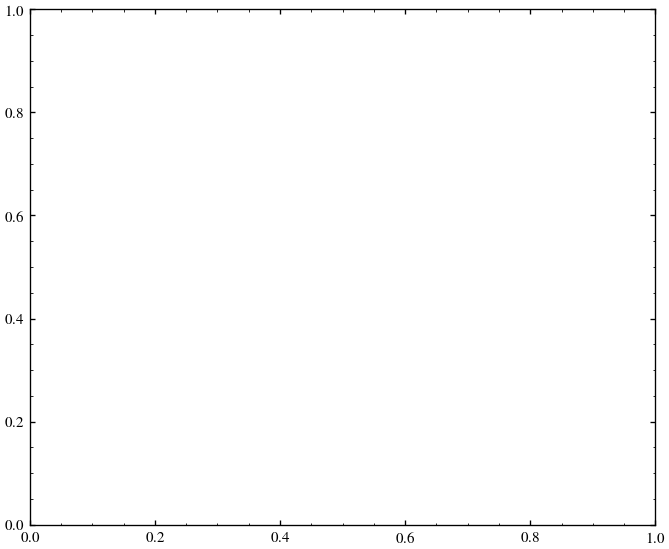

In [ ]:
fig, ax = plt.subplots(figsize=(5.6, 4.6), constrained_layout=True)

vmin = 60
vmax = 80

im = ax.imshow(
    agg_pct.values,
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    aspect="equal",
)

ax.set_title("Aggregate graybox transfer matrix", pad=10, fontsize=12)

ax.set_xlabel("Surrogate method")
ax.set_ylabel("Target method")

ax.set_xticks(np.arange(len(GRAYBOX_METHODS)))
ax.set_yticks(np.arange(len(GRAYBOX_METHODS)))

ax.set_xticklabels(method_labels, rotation=0)
ax.set_yticklabels(method_labels)

# Show surrogate labels only once, at the bottom
ax.tick_params(
    top=False,
    bottom=True,
    labeltop=False,
    labelbottom=True,
)

# Annotate cells
for i in range(len(GRAYBOX_METHODS)):
    for j in range(len(GRAYBOX_METHODS)):
        val = agg_pct.values[i, j]
        if np.isfinite(val):
            text_color = "white" if val < (vmin + vmax) / 2 else "black"
            fontweight = "bold" if i == j else "normal"
            ax.text(
                j,
                i,
                f"{val:.2f}",
                ha="center",
                va="center",
                fontsize=10,
                fontweight=fontweight,
                color=text_color,
            )

# Subtle diagonal whitebox boxes
for i in range(len(GRAYBOX_METHODS)):
    rect = plt.Rectangle(
        (i - 0.5, i - 0.5),
        1,
        1,
        fill=False,
        edgecolor="0.92",
        linewidth=0.9,
        alpha=0.9,
    )
    ax.add_patch(rect)

cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Robust accuracy (%)")

out_path = GRAYBOX_OUT_DIR / "graybox_transfer_matrix_4method_aggregate_science_clean.png"
fig.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", out_path)

SciencePlots style enabled.
Loaded: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_per_class_attack.csv
Shape: (32000, 10)
Output dir: /content/drive/MyDrive/ardg_project/graybox/results/graybox


target_method,single_at_pgd_linf,single_at_ddn_l2,multi_attack_pgd_linf_ddn_l2_mb,attackdro_pp_anchor035_gradfp_online_k4
attack,,,,
pgd20_ce,50.624,25.568,45.920,45.600
ddn_l2,61.808,67.968,67.504,68.144
fgsm_rs,68.976,64.016,68.640,69.104
tpgd,68.112,59.184,66.336,66.432
mifgsm,50.496,29.344,45.936,45.184
pgd_l2,65.744,71.264,70.544,71.024
deepfool_l2,64.048,69.040,68.176,68.464
cw_l2,62.384,68.992,66.608,67.184


,target_method,acc,acc_pct
0,attackdro_pp_anchor035_gradfp_online_k4,0.713,71.254
1,multi_attack_pgd_linf_ddn_l2_mb,0.708,70.837
2,single_at_ddn_l2,0.708,70.830
3,single_at_pgd_linf,0.644,64.372


surrogate_method,single_at_pgd_linf,single_at_ddn_l2,multi_attack_pgd_linf_ddn_l2_mb,attackdro_pp_anchor035_gradfp_online_k4
target_method,,,,
single_at_pgd_linf,63.80,73.21,69.27,69.27
single_at_ddn_l2,78.10,68.05,73.65,73.62
multi_attack_pgd_linf_ddn_l2_mb,73.10,73.36,69.16,70.62
attackdro_pp_anchor035_gradfp_online_k4,73.71,73.88,71.17,69.53


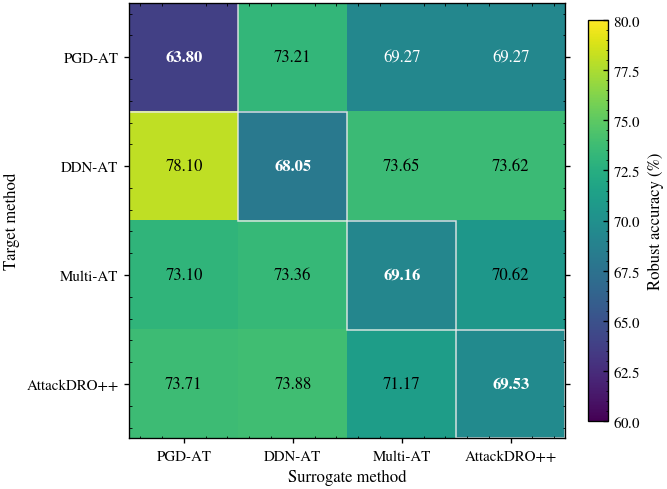

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_transfer_matrix_4method_aggregate_science_clean.png


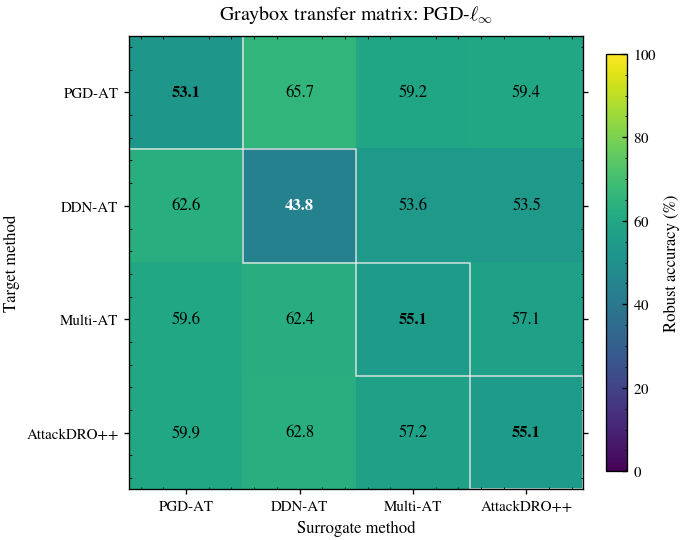

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_pgd20_ce_science_clean.png


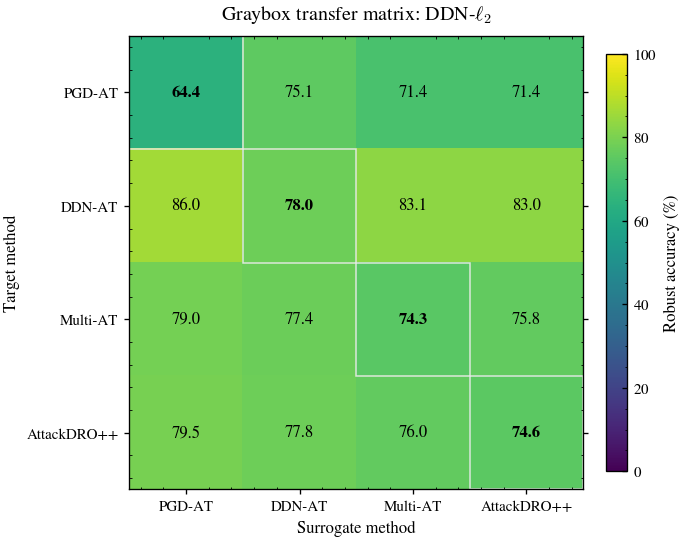

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_ddn_l2_science_clean.png


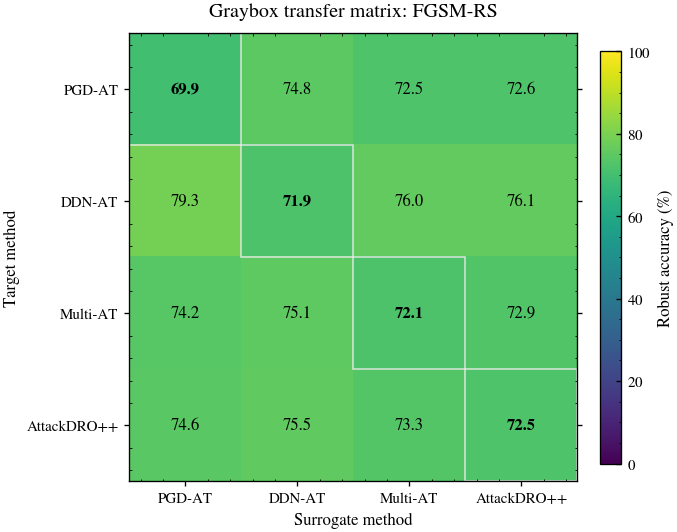

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_fgsm_rs_science_clean.png


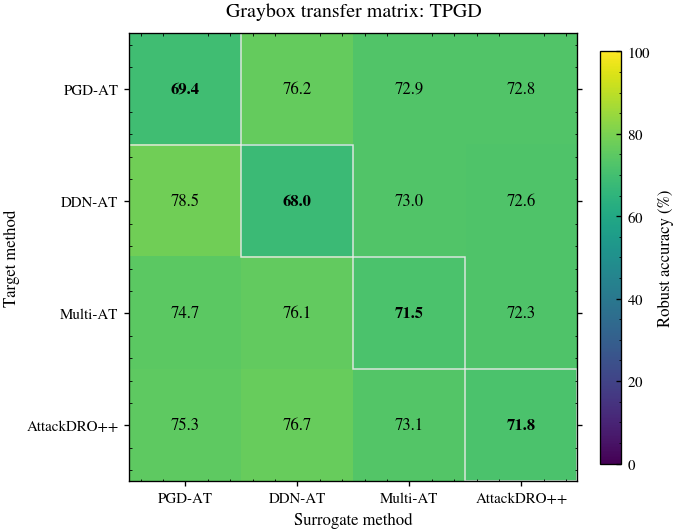

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_tpgd_science_clean.png


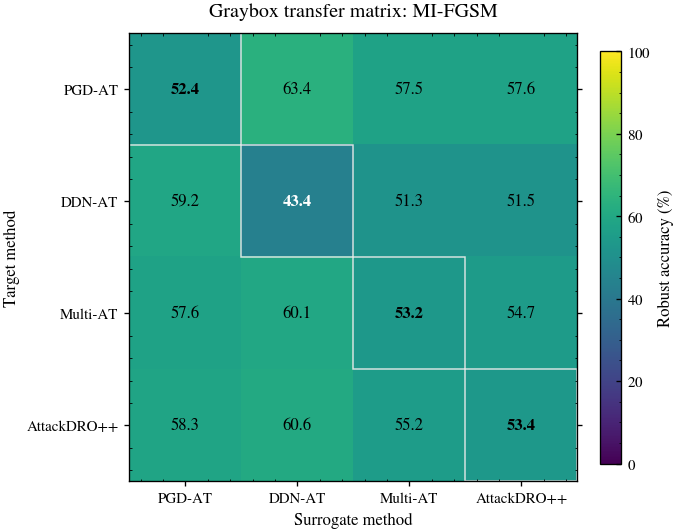

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_mifgsm_science_clean.png


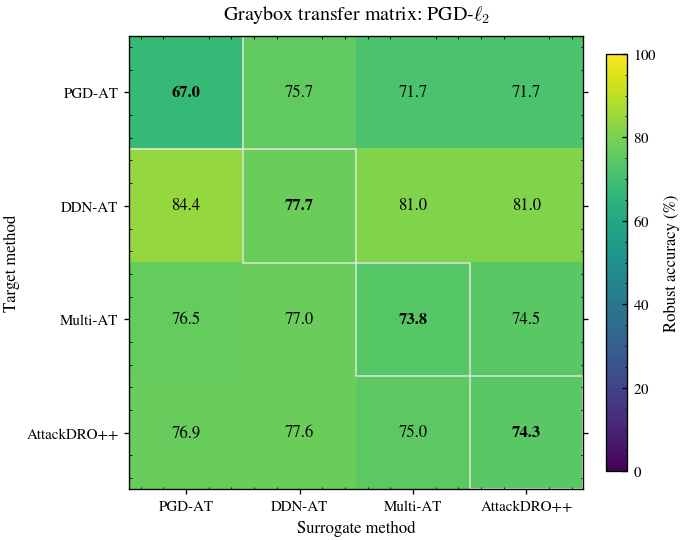

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_pgd_l2_science_clean.png


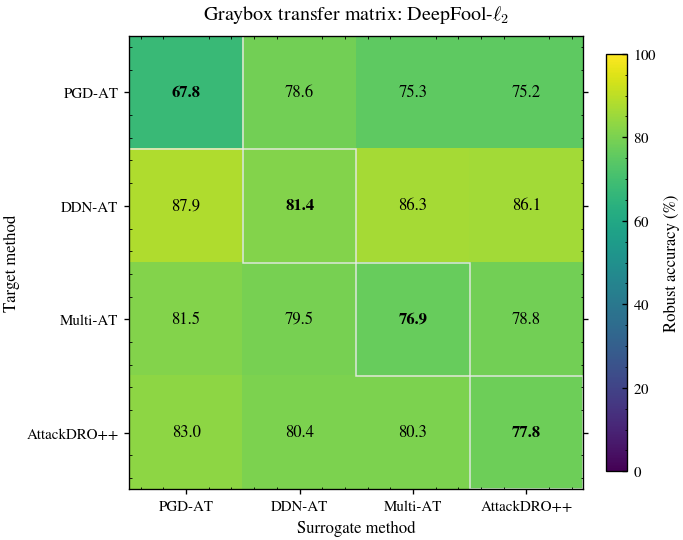

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_deepfool_l2_science_clean.png


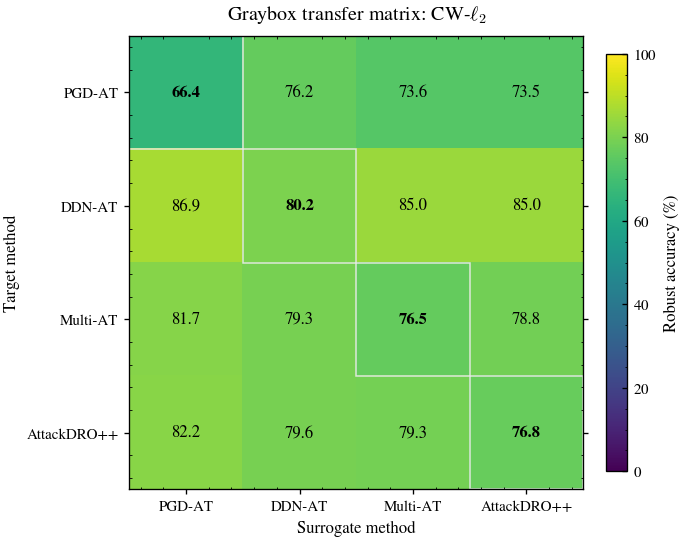

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_matrix_4method_cw_l2_science_clean.png


,contrast,method_a,method_b,n_pairs,a_mean_pct,b_mean_pct,delta_pp,t,p_two_sided
0,AttackDRO++ vs Multi-AT,attackdro_pp_anchor035_gradfp_online_k4,multi_attack_pgd_linf_ddn_l2_mb,200,71.1672,70.6184,0.5488,5.9650,0.0000
1,AttackDRO++ vs PGD-AT,attackdro_pp_anchor035_gradfp_online_k4,single_at_pgd_linf,200,73.7084,69.2736,4.4348,18.7793,0.0000
2,AttackDRO++ vs DDN-AT,attackdro_pp_anchor035_gradfp_online_k4,single_at_ddn_l2,200,73.8752,73.6172,0.2580,0.6009,0.5486
3,Multi-AT vs PGD-AT,multi_attack_pgd_linf_ddn_l2_mb,single_at_pgd_linf,200,73.0988,69.2700,3.8288,16.8905,0.0000
4,Multi-AT vs DDN-AT,multi_attack_pgd_linf_ddn_l2_mb,single_at_ddn_l2,200,73.3624,73.6540,-0.2916,-0.6690,0.5043


Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_method_pair_tests_science_clean.csv


In [ ]:
# ==========================================================================
# Section 83 - Aggregate + per-attack graybox transfer matrix analysis
# Clean SciencePlots version
# Rows = target method, columns = surrogate method
# ==========================================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --------------------------------------------------------------------------
# 0) Optional SciencePlots style
# --------------------------------------------------------------------------

try:
    import scienceplots
    plt.style.use(["science", "no-latex"])
    print("SciencePlots style enabled.")
except Exception as e:
    print("SciencePlots not active:", e)

plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 10,
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "axes.linewidth": 0.8,
    "xtick.major.width": 0.8,
    "ytick.major.width": 0.8,
    "savefig.bbox": "tight",
    "savefig.pad_inches": 0.03,
})

# --------------------------------------------------------------------------
# 1) Load data
# --------------------------------------------------------------------------

if "GRAYBOX_TRANSFER_CSV" not in globals():
    GRAYBOX_TRANSFER_CSV = Path(
        "/content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_per_class_attack.csv"
    )

if not GRAYBOX_TRANSFER_CSV.exists():
    raise FileNotFoundError(f"Run Section 82 first; missing {GRAYBOX_TRANSFER_CSV}")

df = pd.read_csv(GRAYBOX_TRANSFER_CSV)

if "GRAYBOX_OUT_DIR" not in globals():
    GRAYBOX_OUT_DIR = GRAYBOX_TRANSFER_CSV.parent

GRAYBOX_OUT_DIR = Path(GRAYBOX_OUT_DIR)
GRAYBOX_OUT_DIR.mkdir(parents=True, exist_ok=True)

print("Loaded:", GRAYBOX_TRANSFER_CSV)
print("Shape:", df.shape)
print("Output dir:", GRAYBOX_OUT_DIR)

# --------------------------------------------------------------------------
# 2) Method / attack order and display names
# --------------------------------------------------------------------------

if "GRAYBOX_METHODS" not in globals():
    GRAYBOX_METHODS = [
        "single_at_pgd_linf",
        "single_at_ddn_l2",
        "multi_attack_pgd_linf_ddn_l2_mb",
        "attackdro_pp_anchor035_gradfp_online_k4",
    ]

if "GRAYBOX_ATTACKS" not in globals():
    GRAYBOX_ATTACKS = [
        "fgsm_rs",
        "pgd20_ce",
        "tpgd",
        "mifgsm",
        "pgd_l2",
        "ddn_l2",
        "deepfool_l2",
        "cw_l2",
    ]

METHOD_DISPLAY_NAMES = {
    "single_at_pgd_linf": "PGD-AT",
    "single_at_ddn_l2": "DDN-AT",
    "multi_attack_pgd_linf_ddn_l2_mb": "Multi-AT",
    "attackdro_pp_anchor035_gradfp_online_k4": "AttackDRO++",
}

ATTACK_DISPLAY_NAMES = {
    "fgsm_rs": "FGSM-RS",
    "pgd20_ce": r"PGD-$\ell_\infty$",
    "tpgd": "TPGD",
    "mifgsm": "MI-FGSM",
    "pgd_l2": r"PGD-$\ell_2$",
    "ddn_l2": r"DDN-$\ell_2$",
    "deepfool_l2": r"DeepFool-$\ell_2$",
    "cw_l2": r"CW-$\ell_2$",
}

ATTACK_FILE_NAMES = {
    "fgsm_rs": "fgsm_rs",
    "pgd20_ce": "pgd20_ce",
    "tpgd": "tpgd",
    "mifgsm": "mifgsm",
    "pgd_l2": "pgd_l2",
    "ddn_l2": "ddn_l2",
    "deepfool_l2": "deepfool_l2",
    "cw_l2": "cw_l2",
}

method_labels = [METHOD_DISPLAY_NAMES.get(m, m) for m in GRAYBOX_METHODS]

# --------------------------------------------------------------------------
# 3) Whitebox diagonal sanity summaries
# --------------------------------------------------------------------------

white = df.query("surrogate_method == target_method and surrogate_seed == target_seed")

white_attack = (
    white.groupby(["target_method", "attack"], as_index=False)["acc"]
    .mean()
)
white_attack["acc_pct"] = 100.0 * white_attack["acc"]

white_attack_pivot = (
    white_attack
    .pivot(index="attack", columns="target_method", values="acc_pct")
    .reindex(index=GRAYBOX_ATTACKS, columns=GRAYBOX_METHODS)
)

display(white_attack_pivot.round(3))

within = df.query("surrogate_method == target_method and surrogate_seed != target_seed")
within_summary = within.groupby("target_method", as_index=False)["acc"].mean()
within_summary["acc_pct"] = 100.0 * within_summary["acc"]

display(within_summary.round(3))

# --------------------------------------------------------------------------
# 4) General plotting helper
# --------------------------------------------------------------------------

def plot_graybox_matrix(
    mat,
    out_path,
    title=None,
    vmin=60,
    vmax=80,
    show_title=False,
    diagonal_boxes=True,
    annotate_decimals=2,
    figsize=(5.6, 4.6),
):
    """
    Plot a graybox transfer matrix.

    mat:
        DataFrame indexed by target method and columned by surrogate method.
        Values must be in [0, 1].
    """

    pct = 100.0 * mat.reindex(index=GRAYBOX_METHODS, columns=GRAYBOX_METHODS)

    fig, ax = plt.subplots(figsize=figsize, constrained_layout=True)

    im = ax.imshow(
        pct.values,
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
        aspect="equal",
    )

    if show_title and title is not None:
        ax.set_title(title, pad=10, fontsize=12)

    ax.set_xlabel("Surrogate method")
    ax.set_ylabel("Target method")

    ax.set_xticks(np.arange(len(GRAYBOX_METHODS)))
    ax.set_yticks(np.arange(len(GRAYBOX_METHODS)))

    ax.set_xticklabels(method_labels, rotation=0)
    ax.set_yticklabels(method_labels)

    # No duplicate top labels
    ax.tick_params(
        top=False,
        bottom=True,
        labeltop=False,
        labelbottom=True,
        direction="out",
    )

    # Cell annotations
    threshold = vmin + 0.50 * (vmax - vmin)

    for i in range(len(GRAYBOX_METHODS)):
        for j in range(len(GRAYBOX_METHODS)):
            val = pct.values[i, j]
            if np.isfinite(val):
                text_color = "white" if val < threshold else "black"
                fontweight = "bold" if i == j else "normal"

                ax.text(
                    j,
                    i,
                    f"{val:.{annotate_decimals}f}",
                    ha="center",
                    va="center",
                    fontsize=10,
                    fontweight=fontweight,
                    color=text_color,
                )

    # Subtle diagonal boxes = whitebox slice
    if diagonal_boxes:
        for i in range(len(GRAYBOX_METHODS)):
            rect = plt.Rectangle(
                (i - 0.5, i - 0.5),
                1,
                1,
                fill=False,
                edgecolor="0.92",
                linewidth=0.9,
                alpha=0.9,
            )
            ax.add_patch(rect)

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Robust accuracy (%)")

    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()

    print("Saved:", out_path)
    return out_path

# --------------------------------------------------------------------------
# 5) Aggregate transfer matrix across all eight attacks
# --------------------------------------------------------------------------

agg_mat = (
    df.groupby(["target_method", "surrogate_method"])["acc"]
    .mean()
    .unstack()
    .reindex(index=GRAYBOX_METHODS, columns=GRAYBOX_METHODS)
)

agg_pct = 100.0 * agg_mat
display(agg_pct.round(2))

aggregate_out = GRAYBOX_OUT_DIR / "graybox_transfer_matrix_4method_aggregate_science_clean.png"

plot_graybox_matrix(
    mat=agg_mat,
    out_path=aggregate_out,
    title="Aggregate graybox transfer matrix",
    show_title=False,        # keep False for report; caption gives the title
    vmin=60,
    vmax=80,
    diagonal_boxes=True,
    annotate_decimals=2,
    figsize=(5.6, 4.6),
)

# --------------------------------------------------------------------------
# 6) Per-attack transfer matrices
# --------------------------------------------------------------------------

matrices = {}

for attack in GRAYBOX_ATTACKS:
    sub = df.query("attack == @attack")

    mat = (
        sub.groupby(["target_method", "surrogate_method"])["acc"]
        .mean()
        .unstack()
        .reindex(index=GRAYBOX_METHODS, columns=GRAYBOX_METHODS)
    )

    matrices[attack] = mat

    attack_file = ATTACK_FILE_NAMES.get(attack, attack)
    attack_title = f"Graybox transfer matrix: {ATTACK_DISPLAY_NAMES.get(attack, attack)}"

    out_path = GRAYBOX_OUT_DIR / f"transfer_matrix_4method_{attack_file}_science_clean.png"

    # Per-attack scale:
    # - vmin=0, vmax=100 is absolute and comparable across attacks.
    # - vmin=60, vmax=90 makes structure more visible.
    # I recommend 0-100 for per-attack appendix, 60-90 for main text.
    plot_graybox_matrix(
        mat=mat,
        out_path=out_path,
        title=attack_title,
        show_title=True,
        vmin=0,
        vmax=100,
        diagonal_boxes=True,
        annotate_decimals=1,
        figsize=(5.6, 4.6),
    )

# --------------------------------------------------------------------------
# 7) Paired symmetric graybox tests
# --------------------------------------------------------------------------

def _paired_t(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    try:
        from scipy import stats
        t, p = stats.ttest_rel(x, y)
        return float(t), float(p)
    except Exception:
        return np.nan, np.nan


def _pair_cross_values(method_a, method_b):
    """
    Compare the two symmetric transfer directions:
        A target, B surrogate
        B target, A surrogate

    Returns paired arrays aligned by target seed, surrogate seed, and attack.
    """

    ab = df.query("target_method == @method_a and surrogate_method == @method_b")
    ba = df.query("target_method == @method_b and surrogate_method == @method_a")

    ab_g = (
        ab.groupby(["target_seed", "surrogate_seed", "attack"], as_index=False)["acc"]
        .mean()
    )

    ba_g = (
        ba.groupby(["surrogate_seed", "target_seed", "attack"], as_index=False)["acc"]
        .mean()
    )

    ba_g = ba_g.rename(
        columns={
            "surrogate_seed": "target_seed",
            "target_seed": "surrogate_seed",
            "acc": "acc_b",
        }
    )

    merged = ab_g.merge(
        ba_g,
        on=["target_seed", "surrogate_seed", "attack"],
        how="inner",
    )

    return merged["acc"].to_numpy(), merged["acc_b"].to_numpy(), merged


PAIR_TESTS = [
    (
        "attackdro_pp_anchor035_gradfp_online_k4",
        "multi_attack_pgd_linf_ddn_l2_mb",
        "AttackDRO++ vs Multi-AT",
    ),
    (
        "attackdro_pp_anchor035_gradfp_online_k4",
        "single_at_pgd_linf",
        "AttackDRO++ vs PGD-AT",
    ),
    (
        "attackdro_pp_anchor035_gradfp_online_k4",
        "single_at_ddn_l2",
        "AttackDRO++ vs DDN-AT",
    ),
    (
        "multi_attack_pgd_linf_ddn_l2_mb",
        "single_at_pgd_linf",
        "Multi-AT vs PGD-AT",
    ),
    (
        "multi_attack_pgd_linf_ddn_l2_mb",
        "single_at_ddn_l2",
        "Multi-AT vs DDN-AT",
    ),
]

rows = []

for ma, mb, label in PAIR_TESTS:
    a_vals, b_vals, merged = _pair_cross_values(ma, mb)
    t, p = _paired_t(a_vals, b_vals)

    delta = a_vals - b_vals

    rows.append({
        "contrast": label,
        "method_a": ma,
        "method_b": mb,
        "n_pairs": int(len(a_vals)),
        "a_mean_pct": float(100.0 * np.mean(a_vals)) if len(a_vals) else np.nan,
        "b_mean_pct": float(100.0 * np.mean(b_vals)) if len(b_vals) else np.nan,
        "delta_pp": float(100.0 * np.mean(delta)) if len(delta) else np.nan,
        "t": t,
        "p_two_sided": p,
    })

pair_df = pd.DataFrame(rows)

pair_path = GRAYBOX_OUT_DIR / "transfer_method_pair_tests_science_clean.csv"
pair_df.to_csv(pair_path, index=False)

display(pair_df.round(4))
print("Saved:", pair_path)

---
## Section 84 - Per-(class x attack) graybox drilldown
This section keeps the class-attack cells intact until analysis time. It creates per-method graybox heatmaps, pairwise delta heatmaps, whitebox-gap maps, bottom-10 lists, and per-cell tests.


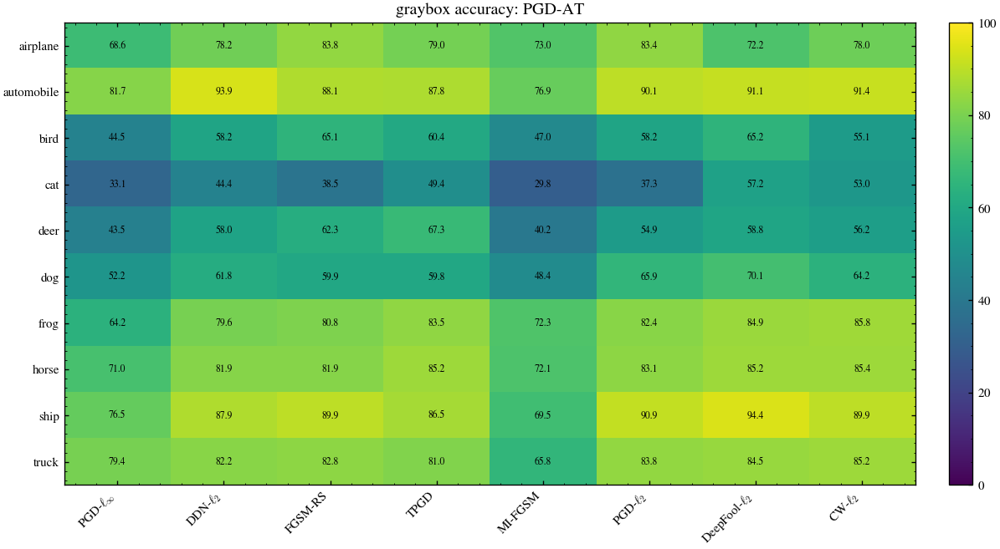

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_per_class_attack_PGDAT.png


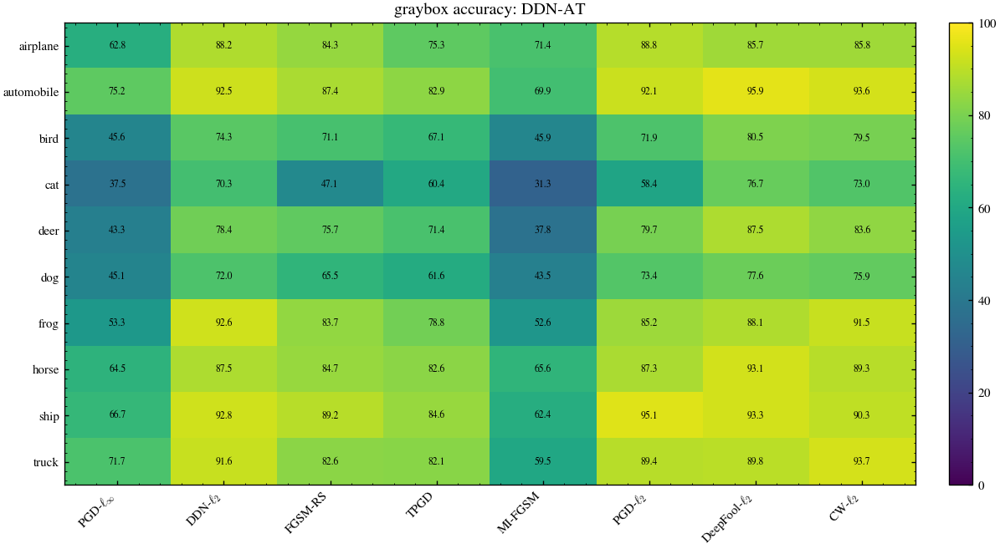

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_per_class_attack_DDNAT.png


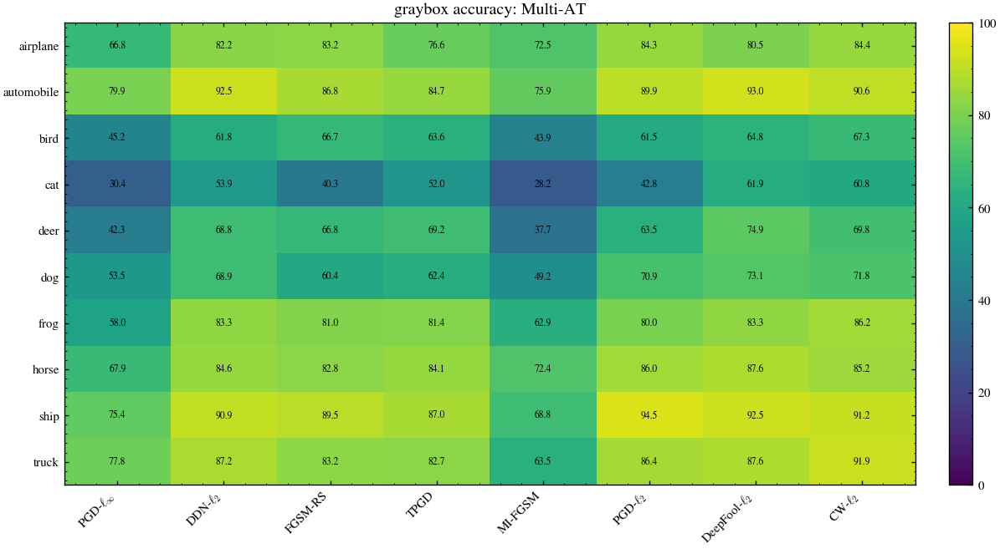

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_per_class_attack_MultiAT.png


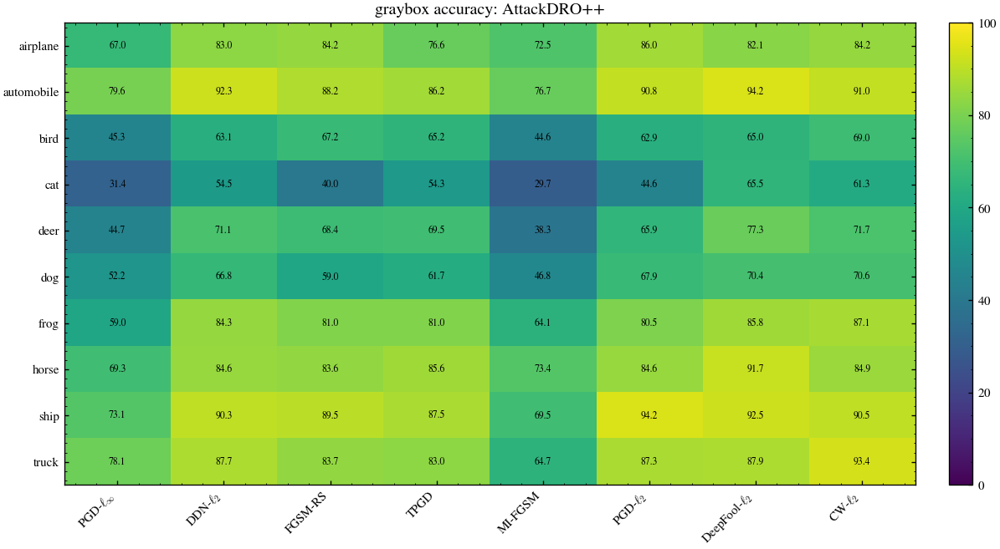

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_per_class_attack_AttackDROpp.png


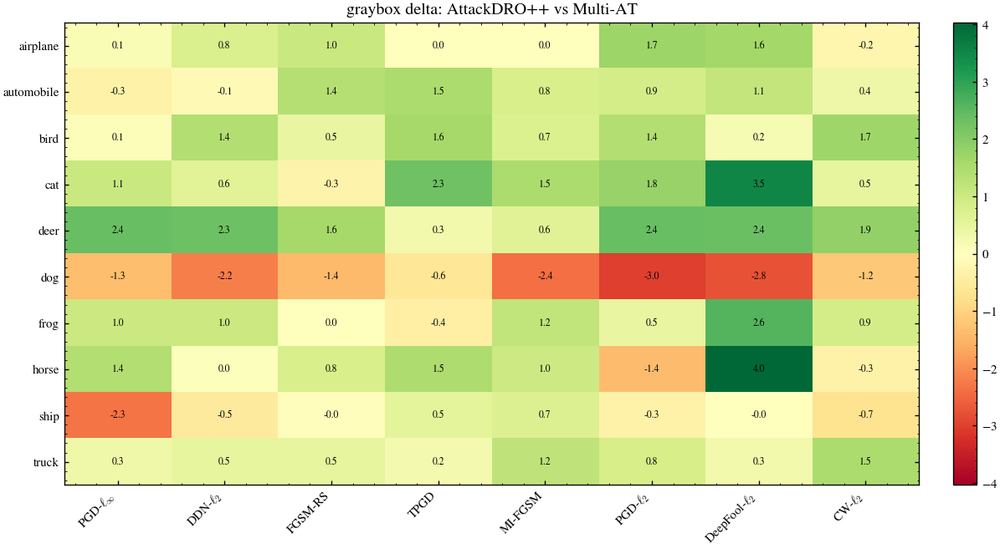

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_delta_per_class_attack_AttackDROpp_vs_MultiAT.png


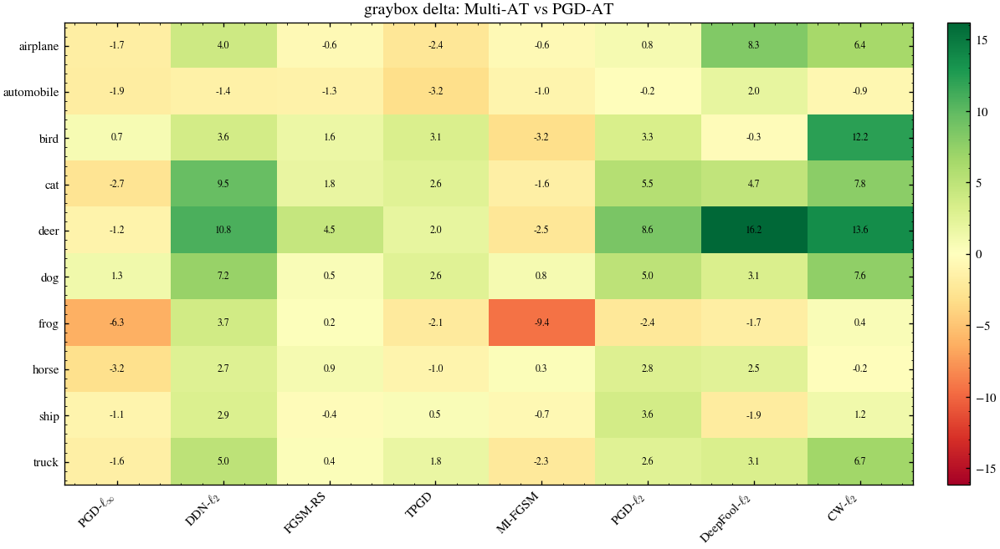

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_delta_per_class_attack_MultiAT_vs_PGDAT.png


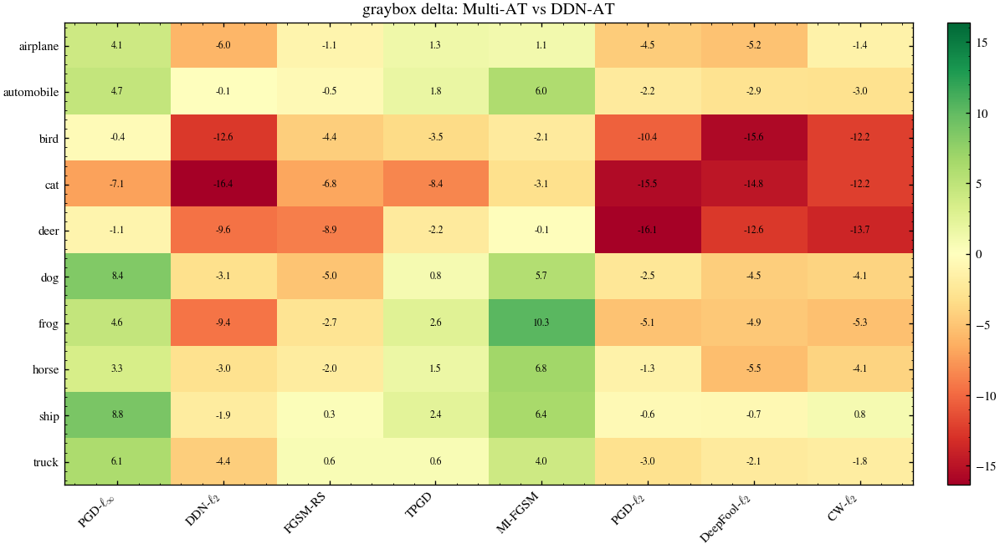

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_delta_per_class_attack_MultiAT_vs_DDNAT.png


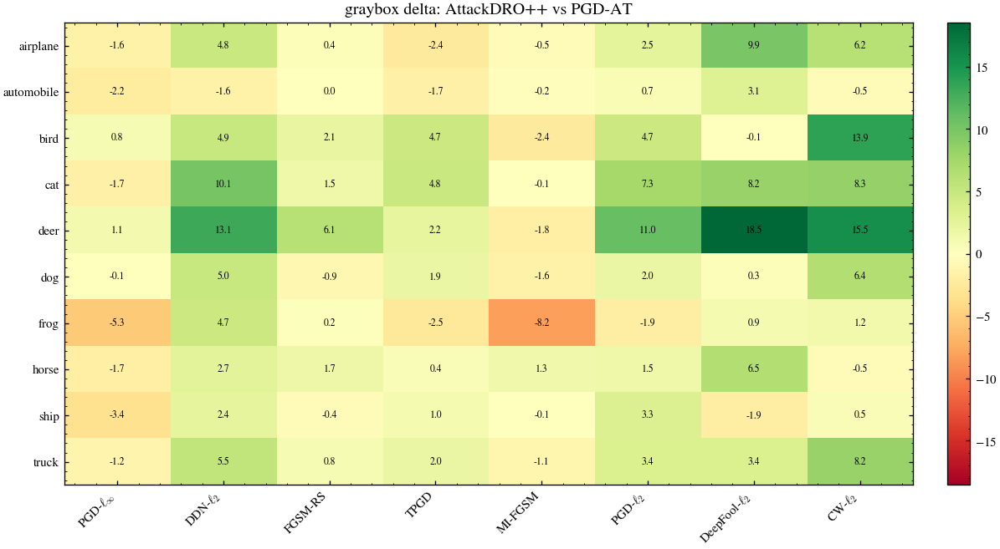

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_delta_per_class_attack_AttackDROpp_vs_PGDAT.png


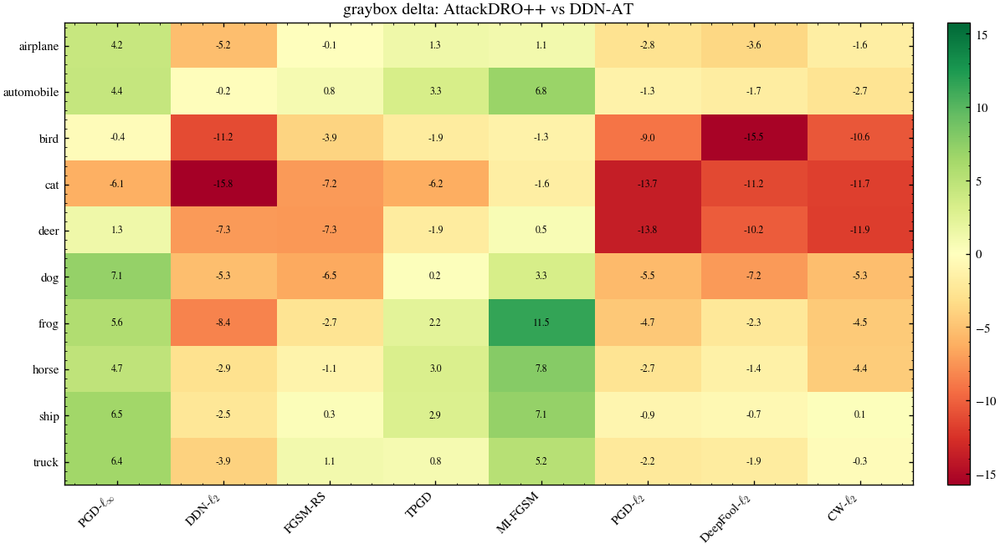

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/graybox_delta_per_class_attack_AttackDROpp_vs_DDNAT.png


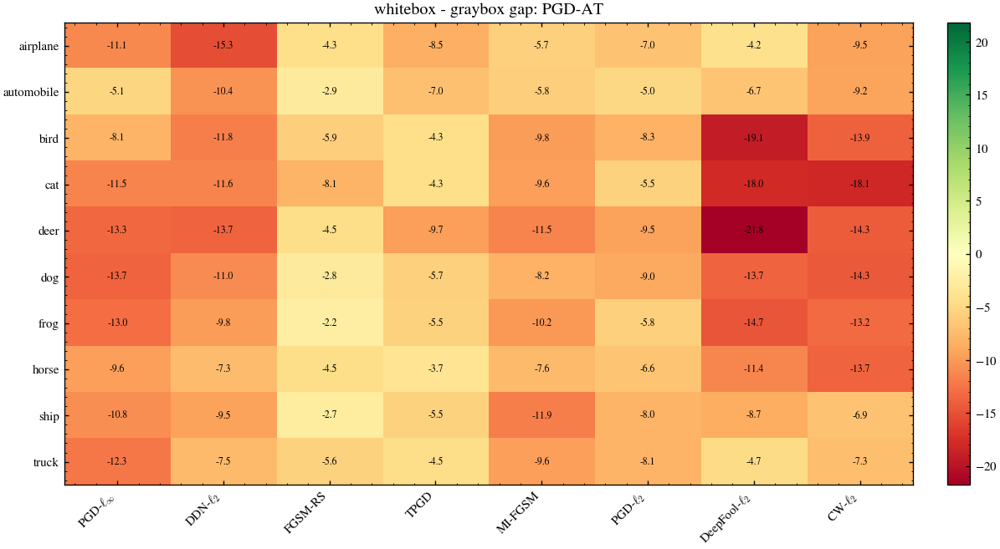

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/whitebox_graybox_gap_PGDAT.png


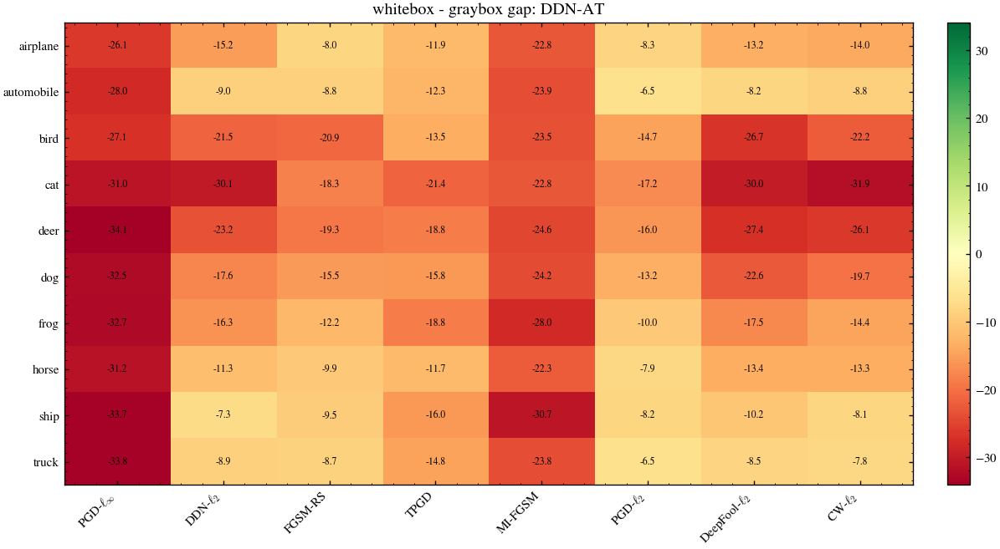

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/whitebox_graybox_gap_DDNAT.png


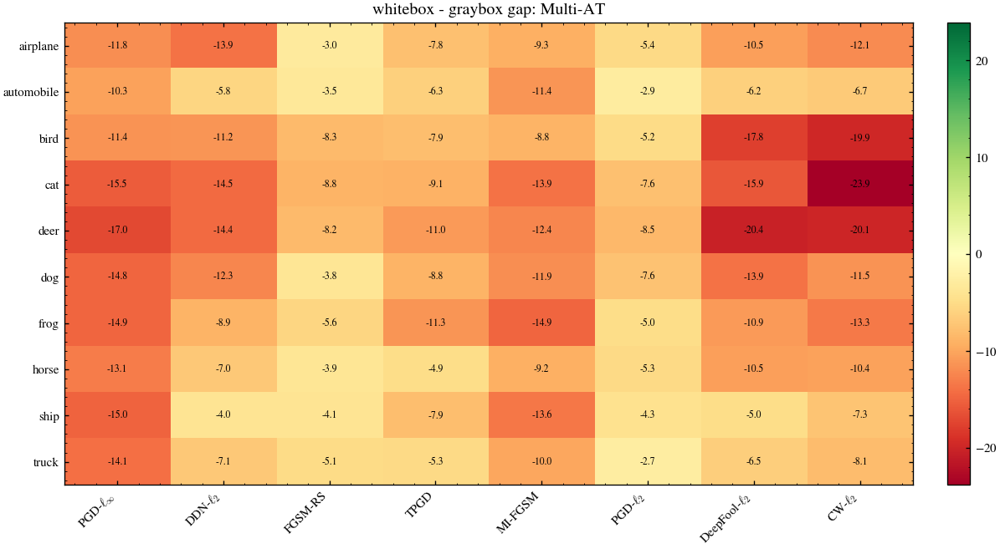

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/whitebox_graybox_gap_MultiAT.png


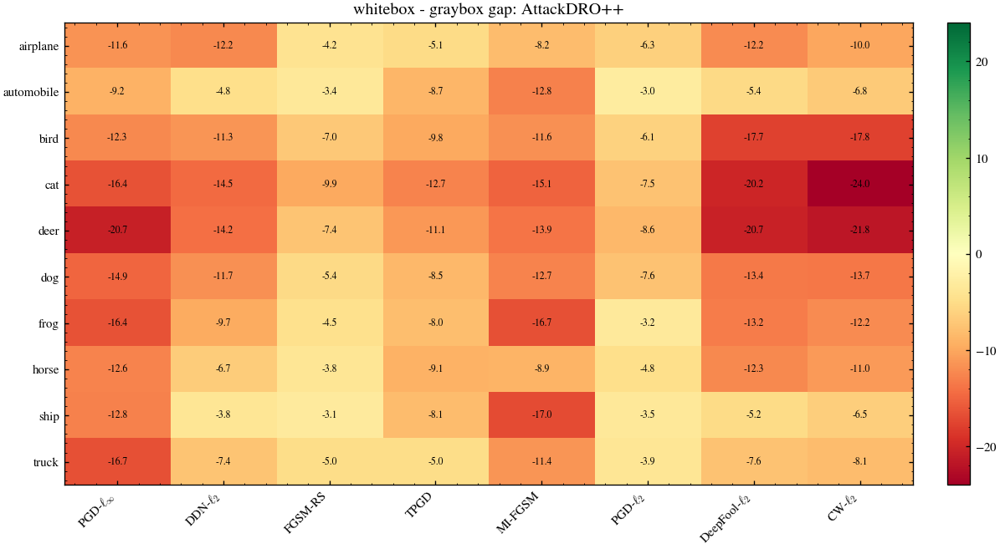

Saved: /content/drive/MyDrive/ardg_project/graybox/results/graybox/whitebox_graybox_gap_AttackDROpp.png


,method,short,class_name,attack,acc_pct
0,single_at_pgd_linf,PGD-AT,cat,mifgsm,29.760000
1,single_at_pgd_linf,PGD-AT,cat,pgd20_ce,33.109333
2,single_at_pgd_linf,PGD-AT,cat,pgd_l2,37.312000
3,single_at_pgd_linf,PGD-AT,cat,fgsm_rs,38.506667
4,single_at_pgd_linf,PGD-AT,deer,mifgsm,40.170667
5,single_at_pgd_linf,PGD-AT,deer,pgd20_ce,43.530667
6,single_at_pgd_linf,PGD-AT,cat,ddn_l2,44.352000
7,single_at_pgd_linf,PGD-AT,bird,pgd20_ce,44.458667
8,single_at_pgd_linf,PGD-AT,bird,mifgsm,47.040000
9,single_at_pgd_linf,PGD-AT,dog,mifgsm,48.394667


graybox_per_cell_paired_test_AttackDRO++_vs_Multi-AT.csv: A wins p<0.05 = 2, B wins p<0.05 = 3, mean delta = +0.557 pp, bottom10 lift = +0.779 pp
graybox_per_cell_paired_test_AttackDRO++_vs_PGD-AT.csv: A wins p<0.05 = 34, B wins p<0.05 = 12, mean delta = +2.332 pp, bottom10 lift = +1.329 pp
graybox_per_cell_paired_test_AttackDRO++_vs_DDN-AT.csv: A wins p<0.05 = 16, B wins p<0.05 = 32, mean delta = -2.206 pp, bottom10 lift = +0.709 pp
Cell-level paired-test files saved in results/graybox.


In [ ]:
# ==========================================================================
# Section 84 - Per-(class x attack) graybox drilldown
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "GRAYBOX_TRANSFER_CSV" not in globals():
    GRAYBOX_TRANSFER_CSV = Path("results/graybox/transfer_per_class_attack.csv")
if not GRAYBOX_TRANSFER_CSV.exists():
    raise FileNotFoundError(f"Run Section 82 first; missing {GRAYBOX_TRANSFER_CSV}")
df = pd.read_csv(GRAYBOX_TRANSFER_CSV)
ATTACK_ORDER = GRAYBOX_ATTACKS
CLASS_ORDER = CIFAR10_CLASS_NAMES

METHOD_DISPLAY_NAMES = {
    "single_at_pgd_linf": "PGD-AT",
    "single_at_ddn_l2": "DDN-AT",
    "multi_attack_pgd_linf_ddn_l2_mb": "Multi-AT",
    "attackdro_pp_anchor035_gradfp_online_k4": "AttackDRO++"
}

ATTACK_LABELS = {
    "fgsm_rs": "FGSM-RS",
    "pgd20_ce": r"PGD-$\ell_\infty$",
    "tpgd": "TPGD",
    "mifgsm": "MI-FGSM",
    "pgd_l2": r"PGD-$\ell_2$",
    "ddn_l2": r"DDN-$\ell_2$",
    "deepfool_l2": r"DeepFool-$\ell_2$",
    "cw_l2": r"CW-$\ell_2$",
}

def _method_cell_means(method, graybox_only=True):
    sub = df.query("target_method == @method").copy()
    if graybox_only:
        sub = sub.query("surrogate_method != target_method")
    g = sub.groupby(["class_name", "attack"], as_index=False)["acc"].mean()
    return g


def _cell_matrix(cell_df, value="acc"):
    return cell_df.pivot_table(index="class_name", columns="attack", values=value, aggfunc="mean").reindex(index=CLASS_ORDER, columns=ATTACK_ORDER)


def _plot_cell_heatmap(mat, title, out, cmap=None, vmin=None, vmax=None, annotate=True):
    fig, ax = plt.subplots(figsize=(10, 5.5), constrained_layout=True)
    im = ax.imshow(mat.values, aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=12)
    ax.set_xticks(range(len(ATTACK_ORDER)))
    ax.set_xticklabels([ATTACK_LABELS.get(a, a) for a in ATTACK_ORDER], rotation=45, ha="right")
    ax.set_yticks(range(len(CLASS_ORDER)))
    ax.set_yticklabels(CLASS_ORDER)
    if annotate:
        for i in range(mat.shape[0]):
            for j in range(mat.shape[1]):
                val = mat.values[i, j]
                if np.isfinite(val):
                    ax.text(j, i, f"{val:.1f}", ha="center", va="center", fontsize=7)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    fig.savefig(out, dpi=150, bbox_inches="tight")
    plt.show()

# 1. Graybox accuracy per target method.
method_cell = {}
for method in GRAYBOX_METHODS:
    g = _method_cell_means(method, graybox_only=True)
    g["acc_pct"] = 100 * g["acc"]
    method_cell[method] = g
    mat = _cell_matrix(g, "acc_pct")
    method_short = METHOD_DISPLAY_NAMES.get(method, method)
    safe_name = method_short.replace('+', 'p').replace('-', '')
    out = GRAYBOX_OUT_DIR / f"graybox_per_class_attack_{safe_name}.png"
    _plot_cell_heatmap(mat, f"graybox accuracy: {method_short}", out, vmin=0, vmax=100)
    print(f"Saved: {out}")

# 2. Pairwise delta heatmaps.
DELTA_PAIRS = [
    ("attackdro_pp_anchor035_gradfp_online_k4", "multi_attack_pgd_linf_ddn_l2_mb", "AttackDRO++_vs_Multi-AT"),
    ("multi_attack_pgd_linf_ddn_l2_mb", "single_at_pgd_linf", "Multi-AT_vs_PGD-AT"),
    ("multi_attack_pgd_linf_ddn_l2_mb", "single_at_ddn_l2", "Multi-AT_vs_DDN-AT"),
    ("attackdro_pp_anchor035_gradfp_online_k4", "single_at_pgd_linf", "AttackDRO++_vs_PGD-AT"),
    ("attackdro_pp_anchor035_gradfp_online_k4", "single_at_ddn_l2", "AttackDRO++_vs_DDN-AT"),
]
for ma, mb, name in DELTA_PAIRS:
    a = method_cell[ma].rename(columns={"acc": "acc_a"})[["class_name", "attack", "acc_a"]]
    b = method_cell[mb].rename(columns={"acc": "acc_b"})[["class_name", "attack", "acc_b"]]
    m = a.merge(b, on=["class_name", "attack"])
    m["delta_pp"] = 100 * (m["acc_a"] - m["acc_b"])
    mat = _cell_matrix(m, "delta_pp")
    vmax = max(1.0, float(np.nanmax(np.abs(mat.values))))
    safe_name = name.replace('+', 'p').replace('-', '')
    out = GRAYBOX_OUT_DIR / f"graybox_delta_per_class_attack_{safe_name}.png"
    _plot_cell_heatmap(mat, f"graybox delta: {name.replace('_', ' ')}", out, cmap="RdYlGn", vmin=-vmax, vmax=vmax)
    print(f"Saved: {out}")

# 3. Whitebox vs graybox gap.
white = df.query("surrogate_method == target_method and surrogate_seed == target_seed")
for method in GRAYBOX_METHODS:
    w = white.query("target_method == @method").groupby(["class_name", "attack"], as_index=False)["acc"].mean()
    g = method_cell[method]
    m = w.rename(columns={"acc": "white_acc"}).merge(g.rename(columns={"acc": "gray_acc"}), on=["class_name", "attack"])
    m["gap_pp"] = 100 * (m["white_acc"] - m["gray_acc"])
    mat = _cell_matrix(m, "gap_pp")
    vmax = max(1.0, float(np.nanmax(np.abs(mat.values))))
    method_short = METHOD_DISPLAY_NAMES.get(method, method)
    safe_name = method_short.replace('+', 'p').replace('-', '')
    out = GRAYBOX_OUT_DIR / f"whitebox_graybox_gap_{safe_name}.png"
    _plot_cell_heatmap(mat, f"whitebox - graybox gap: {method_short}", out, cmap="RdYlGn", vmin=-vmax, vmax=vmax)
    print(f"Saved: {out}")

# 4. Bottom-10 graybox cells per method.
bottom_rows = []
for method in GRAYBOX_METHODS:
    g = method_cell[method].copy()
    g["acc_pct"] = 100 * g["acc"]
    method_short = METHOD_DISPLAY_NAMES.get(method, method)
    for _, row in g.nsmallest(10, "acc").iterrows():
        bottom_rows.append({"method": method, "short": method_short,
                            "class_name": row["class_name"], "attack": row["attack"],
                            "acc_pct": row["acc_pct"]})
bottom_df = pd.DataFrame(bottom_rows)
display(bottom_df)

# 5-6. Cell-level paired tests for selected contrasts.
def _paired_t(x, y):
    x = np.asarray(x, dtype=float); y = np.asarray(y, dtype=float)
    try:
        from scipy import stats
        t, p = stats.ttest_rel(x, y)
        return float(t), float(p)
    except Exception:
        return np.nan, np.nan


def _per_cell_paired_test(method_a, method_b, out_name):
    a = df.query("target_method == @method_a and surrogate_method != target_method")
    b = df.query("target_method == @method_b and surrogate_method != target_method")
    a_seed = a.groupby(["target_seed", "class_name", "attack"], as_index=False)["acc"].mean().rename(columns={"acc": "acc_a"})
    b_seed = b.groupby(["target_seed", "class_name", "attack"], as_index=False)["acc"].mean().rename(columns={"acc": "acc_b"})
    merged = a_seed.merge(b_seed, on=["target_seed", "class_name", "attack"], how="inner")
    rows = []
    for (cls, atk), sub in merged.groupby(["class_name", "attack"]):
        t, p = _paired_t(sub["acc_a"], sub["acc_b"])
        rows.append({"class_name": cls, "attack": atk, "n": int(len(sub)),
                     "a_mean_pct": float(100 * sub["acc_a"].mean()),
                     "b_mean_pct": float(100 * sub["acc_b"].mean()),
                     "delta_pp": float(100 * (sub["acc_a"] - sub["acc_b"]).mean()),
                     "t": t, "p_two_sided": p})
    res = pd.DataFrame(rows)
    path = GRAYBOX_OUT_DIR / out_name
    res.to_csv(path, index=False)
    wins_a = int(((res["delta_pp"] > 0) & (res["p_two_sided"] < 0.05)).sum())
    wins_b = int(((res["delta_pp"] < 0) & (res["p_two_sided"] < 0.05)).sum())
    mean_delta = float(res["delta_pp"].mean())
    bottom10_lift = float(res.nsmallest(10, "b_mean_pct")["delta_pp"].mean())
    print(f"{out_name}: A wins p<0.05 = {wins_a}, B wins p<0.05 = {wins_b}, mean delta = {mean_delta:+.3f} pp, bottom10 lift = {bottom10_lift:+.3f} pp")
    return res, path

cell_test_outputs = {}
cell_test_outputs["AttackDRO++_vs_Multi-AT"] = _per_cell_paired_test(
    "attackdro_pp_anchor035_gradfp_online_k4", "multi_attack_pgd_linf_ddn_l2_mb",
    "graybox_per_cell_paired_test_AttackDRO++_vs_Multi-AT.csv")
cell_test_outputs["AttackDRO++_vs_PGD-AT"] = _per_cell_paired_test(
    "attackdro_pp_anchor035_gradfp_online_k4", "single_at_pgd_linf",
    "graybox_per_cell_paired_test_AttackDRO++_vs_PGD-AT.csv")
cell_test_outputs["AttackDRO++_vs_DDN-AT"] = _per_cell_paired_test(
    "attackdro_pp_anchor035_gradfp_online_k4", "single_at_ddn_l2",
    "graybox_per_cell_paired_test_AttackDRO++_vs_DDN-AT.csv")
print("Cell-level paired-test files saved in results/graybox.")


---
## Section 85 - Method contribution decomposition
Decomposes AttackDRO++ gains over single-attack baselines into multi-attack training effect and cluster-DRO effect, using whitebox, cross-graybox, and bottom-10-cell metrics.


,metric,decomposition,Multi_AT_effect_pp,AttackDROpp_effect_pp,total_AttackDROpp_vs_single_pp
0,whitebox,vs. PGD-AT,0.934000,0.184000,1.118000
1,whitebox,vs. DDN-AT,5.536000,0.184000,5.720000
2,cross_graybox,vs. PGD-AT,1.775067,0.557067,2.332133
3,cross_graybox,vs. DDN-AT,-2.763067,0.557067,-2.206000
4,bottom10_cross_graybox,vs. PGD-AT,0.529067,0.567467,1.096533
5,bottom10_cross_graybox,vs. DDN-AT,-1.800533,0.567467,-1.233067


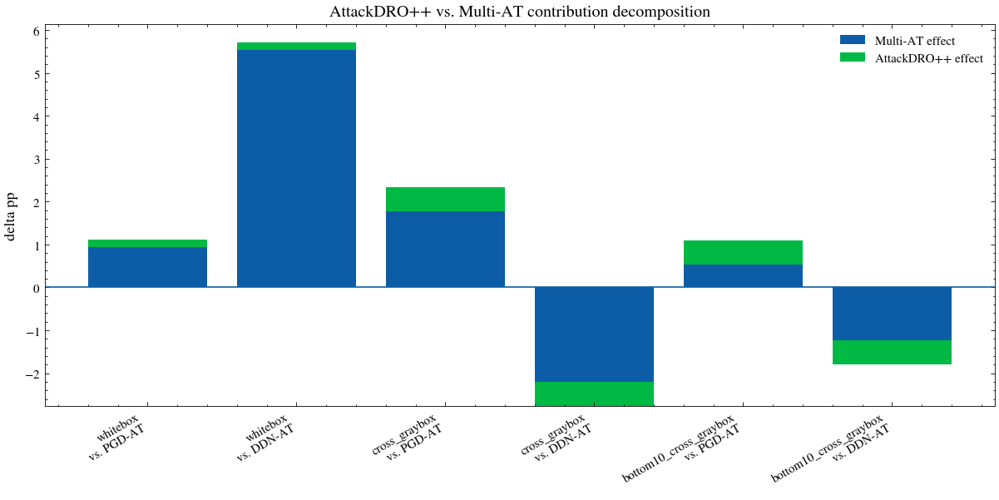

Saved: results/graybox/method_decomposition.png


,contrast,bottom10_cross_graybox_delta_pp
0,AttackDRO++ vs. Multi-AT,0.567467
1,Multi-AT vs. PGD-AT,0.529067
2,Multi-AT vs. DDN-AT,-1.800533
3,AttackDRO++ vs. PGD-AT,1.096533
4,AttackDRO++ vs. DDN-AT,-1.233067


,contrast,A_wins_p_lt_0_05,B_wins_p_lt_0_05,mean_delta_pp
0,AttackDRO++ vs. Multi-AT,2,3,0.557067
1,AttackDRO++ vs. PGD-AT,34,12,2.332133
2,AttackDRO++ vs. DDN-AT,16,32,-2.206000


Headline whitebox accuracy (%):


,method,short,whitebox_pct
0,single_at_pgd_linf,single-PGD,61.524
1,single_at_ddn_l2,single-DDN,56.922
2,multi_attack_pgd_linf_ddn_l2_mb,uniform,62.458
3,attackdro_pp_anchor035_gradfp_online_k4,AttackDRO++,62.642


Headline cross-method graybox accuracy (%):


,method,short,cross_graybox_pct
0,single_at_pgd_linf,single-PGD,70.584800
1,single_at_ddn_l2,single-DDN,75.122933
2,multi_attack_pgd_linf_ddn_l2_mb,uniform,72.359867
3,attackdro_pp_anchor035_gradfp_online_k4,AttackDRO++,72.916933


Multi-AT and AttackDRO++ effects are in decomp_df above; bottom-10 deltas and per-cell win counts are displayed above.


In [ ]:
# ==========================================================================
# Section 85 - Method contribution decomposition
# ==========================================================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "GRAYBOX_TRANSFER_CSV" not in globals():
    GRAYBOX_TRANSFER_CSV = Path("results/graybox/transfer_per_class_attack.csv")
if not GRAYBOX_TRANSFER_CSV.exists():
    raise FileNotFoundError(f"Run Section 82 first; missing {GRAYBOX_TRANSFER_CSV}")
df = pd.read_csv(GRAYBOX_TRANSFER_CSV)
M_PGD = "single_at_pgd_linf"
M_DDN = "single_at_ddn_l2"
M_UNI = "multi_attack_pgd_linf_ddn_l2_mb"
M_APP = "attackdro_pp_anchor035_gradfp_online_k4"

white = df.query("surrogate_method == target_method and surrogate_seed == target_seed")
gray = df.query("surrogate_method != target_method")

def _bottom10_metric(sub, method):
    g = sub.query("target_method == @method").groupby(["class_name", "attack"], as_index=False)["acc"].mean()
    return float(100 * g.nsmallest(10, "acc")["acc"].mean())

metrics = {
    "whitebox": {m: float(100 * white.query("target_method == @m")["acc"].mean()) for m in GRAYBOX_METHODS},
    "cross_graybox": {m: float(100 * gray.query("target_method == @m")["acc"].mean()) for m in GRAYBOX_METHODS},
    "bottom10_cross_graybox": {m: _bottom10_metric(gray, m) for m in GRAYBOX_METHODS},
}

decomp_rows = []
for metric_name, vals in metrics.items():
    for base_method, base_label in [(M_PGD, "vs. PGD-AT"), (M_DDN, "vs. DDN-AT")]:
        multi_effect = vals[M_UNI] - vals[base_method]
        attackdropp_effect = vals[M_APP] - vals[M_UNI]
        total = vals[M_APP] - vals[base_method]
        decomp_rows.append({"metric": metric_name, "decomposition": base_label,
                            "Multi_AT_effect_pp": multi_effect,
                            "AttackDROpp_effect_pp": attackdropp_effect,
                            "total_AttackDROpp_vs_single_pp": total})
decomp_df = pd.DataFrame(decomp_rows)
display(decomp_df)

fig, ax = plt.subplots(figsize=(10, 5), constrained_layout=True)
x = np.arange(len(decomp_df))
ax.bar(x, decomp_df["Multi_AT_effect_pp"], label="Multi-AT effect")
ax.bar(x, decomp_df["AttackDROpp_effect_pp"], bottom=decomp_df["Multi_AT_effect_pp"], label="AttackDRO++ effect")
ax.axhline(0, linewidth=1)
ax.set_xticks(x)
ax.set_xticklabels(decomp_df["metric"] + "\n" + decomp_df["decomposition"], rotation=30, ha="right")
ax.set_ylabel("delta pp")
ax.set_title("AttackDRO++ vs. Multi-AT contribution decomposition", fontsize=12)
ax.legend(frameon=False)
out = GRAYBOX_OUT_DIR / "method_decomposition.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {out}")

# Bottom-10-cell cross-method delta for the five method-pair contrasts.
contrast_rows = []
for ma, mb, label in [
    (M_APP, M_UNI, "AttackDRO++ vs. Multi-AT"),
    (M_UNI, M_PGD, "Multi-AT vs. PGD-AT"),
    (M_UNI, M_DDN, "Multi-AT vs. DDN-AT"),
    (M_APP, M_PGD, "AttackDRO++ vs. PGD-AT"),
    (M_APP, M_DDN, "AttackDRO++ vs. DDN-AT"),
]:
    delta = _bottom10_metric(gray, ma) - _bottom10_metric(gray, mb)
    contrast_rows.append({"contrast": label, "bottom10_cross_graybox_delta_pp": delta})
contrast_df = pd.DataFrame(contrast_rows)
display(contrast_df)

# Per-cell win counts from Section 84 files if available.
win_rows = []
for name, path in [
    ("AttackDRO++ vs. Multi-AT", GRAYBOX_OUT_DIR / "graybox_per_cell_paired_test_AttackDRO++_vs_Multi-AT.csv"),
    ("AttackDRO++ vs. PGD-AT", GRAYBOX_OUT_DIR / "graybox_per_cell_paired_test_AttackDRO++_vs_PGD-AT.csv"),
    ("AttackDRO++ vs. DDN-AT", GRAYBOX_OUT_DIR / "graybox_per_cell_paired_test_AttackDRO++_vs_DDN-AT.csv"),
]:
    if path.exists():
        res = pd.read_csv(path)
        win_rows.append({"contrast": name,
                         "A_wins_p_lt_0_05": int(((res["delta_pp"] > 0) & (res["p_two_sided"] < 0.05)).sum()),
                         "B_wins_p_lt_0_05": int(((res["delta_pp"] < 0) & (res["p_two_sided"] < 0.05)).sum()),
                         "mean_delta_pp": float(res["delta_pp"].mean())})
    else:
        win_rows.append({"contrast": name, "A_wins_p_lt_0_05": "run Section 84", "B_wins_p_lt_0_05": "run Section 84", "mean_delta_pp": np.nan})
win_df = pd.DataFrame(win_rows)
display(win_df)

print("Headline whitebox accuracy (%):")
display(pd.DataFrame([{"method": m, "short": GRAYBOX_METHOD_SHORT[m], "whitebox_pct": metrics["whitebox"][m]} for m in GRAYBOX_METHODS]))
print("Headline cross-method graybox accuracy (%):")
display(pd.DataFrame([{"method": m, "short": GRAYBOX_METHOD_SHORT[m], "cross_graybox_pct": metrics["cross_graybox"][m]} for m in GRAYBOX_METHODS]))
print("Multi-AT and AttackDRO++ effects are in decomp_df above; bottom-10 deltas and per-cell win counts are displayed above.")


In [ ]:
# ==========================================================================
# Section 85 - Method contribution decomposition
# Clean report-style visualization
# ==========================================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Optional SciencePlots style
try:
    import scienceplots
    plt.style.use(["science", "no-latex"])
    print("SciencePlots style enabled.")
except Exception as e:
    print("SciencePlots not active:", e)

plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "axes.linewidth": 0.8,
    "savefig.bbox": "tight",
    "savefig.pad_inches": 0.03,
})

# --------------------------------------------------------------------------
# Load graybox table
# --------------------------------------------------------------------------

if "GRAYBOX_TRANSFER_CSV" not in globals():
    GRAYBOX_TRANSFER_CSV = Path("results/graybox/transfer_per_class_attack.csv")

if not GRAYBOX_TRANSFER_CSV.exists():
    raise FileNotFoundError(f"Run Section 82 first; missing {GRAYBOX_TRANSFER_CSV}")

df = pd.read_csv(GRAYBOX_TRANSFER_CSV)

if "GRAYBOX_OUT_DIR" not in globals():
    GRAYBOX_OUT_DIR = GRAYBOX_TRANSFER_CSV.parent

GRAYBOX_OUT_DIR = Path(GRAYBOX_OUT_DIR)
GRAYBOX_OUT_DIR.mkdir(parents=True, exist_ok=True)

# --------------------------------------------------------------------------
# Method names
# --------------------------------------------------------------------------

M_PGD = "single_at_pgd_linf"
M_DDN = "single_at_ddn_l2"
M_UNI = "multi_attack_pgd_linf_ddn_l2_mb"
M_APP = "attackdro_pp_anchor035_gradfp_online_k4"

GRAYBOX_METHODS = [M_PGD, M_DDN, M_UNI, M_APP]

METHOD_DISPLAY = {
    M_PGD: "PGD-AT",
    M_DDN: "DDN-AT",
    M_UNI: "Multi-AT",
    M_APP: "AttackDRO++",
}

# --------------------------------------------------------------------------
# Metrics
# --------------------------------------------------------------------------

white = df.query("surrogate_method == target_method and surrogate_seed == target_seed")
gray = df.query("surrogate_method != target_method")

def _bottom10_metric(sub, method):
    g = (
        sub.query("target_method == @method")
        .groupby(["class_name", "attack"], as_index=False)["acc"]
        .mean()
    )
    return float(100.0 * g.nsmallest(10, "acc")["acc"].mean())

metrics = {
    "Whitebox Mean(8)": {
        m: float(100.0 * white.query("target_method == @m")["acc"].mean())
        for m in GRAYBOX_METHODS
    },
    "Cross-graybox Mean(8)": {
        m: float(100.0 * gray.query("target_method == @m")["acc"].mean())
        for m in GRAYBOX_METHODS
    },
    "Bottom-10 cross-graybox": {
        m: _bottom10_metric(gray, m)
        for m in GRAYBOX_METHODS
    },
}

# --------------------------------------------------------------------------
# Decomposition table
# Path:
# single-AT -> Multi-AT -> AttackDRO++
# --------------------------------------------------------------------------

decomp_rows = []

for metric_name, vals in metrics.items():
    for base_method, base_label in [
        (M_PGD, "via PGD-AT"),
        (M_DDN, "via DDN-AT"),
    ]:
        multi_effect = vals[M_UNI] - vals[base_method]
        attackdropp_effect = vals[M_APP] - vals[M_UNI]
        total = vals[M_APP] - vals[base_method]

        decomp_rows.append({
            "metric": metric_name,
            "path": base_label,
            "Multi-AT effect": multi_effect,
            "AttackDRO++ effect": attackdropp_effect,
            "Total": total,
        })

decomp_df = pd.DataFrame(decomp_rows)

display(decomp_df.round(3))

decomp_path = GRAYBOX_OUT_DIR / "method_contribution_decomposition.csv"
decomp_df.to_csv(decomp_path, index=False)
print("Saved:", decomp_path)

SciencePlots style enabled.


,metric,path,Multi-AT effect,AttackDRO++ effect,Total
0,Whitebox Mean(8),via PGD-AT,0.934,0.184,1.118
1,Whitebox Mean(8),via DDN-AT,5.536,0.184,5.720
2,Cross-graybox Mean(8),via PGD-AT,1.775,0.557,2.332
3,Cross-graybox Mean(8),via DDN-AT,-2.763,0.557,-2.206
4,Bottom-10 cross-graybox,via PGD-AT,0.529,0.567,1.097
5,Bottom-10 cross-graybox,via DDN-AT,-1.801,0.567,-1.233


Saved: results/graybox/method_contribution_decomposition.csv


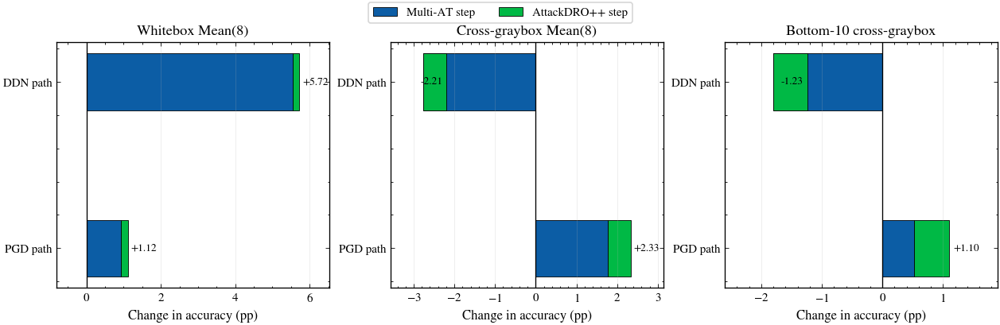

Saved: results/graybox/method_decomposition_three_panel_science.png


In [ ]:
# ==========================================================================
# Clean figure: three-panel horizontal decomposition chart
# ==========================================================================

metric_order = [
    "Whitebox Mean(8)",
    "Cross-graybox Mean(8)",
    "Bottom-10 cross-graybox",
]

path_order = ["via PGD-AT", "via DDN-AT"]

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(10.5, 3.2),
    sharex=False,
    constrained_layout=True,
)

for ax, metric in zip(axes, metric_order):
    sub = (
        decomp_df[decomp_df["metric"] == metric]
        .set_index("path")
        .loc[path_order]
        .reset_index()
    )

    y = np.arange(len(sub))

    multi = sub["Multi-AT effect"].to_numpy(dtype=float)
    app = sub["AttackDRO++ effect"].to_numpy(dtype=float)
    total = sub["Total"].to_numpy(dtype=float)

    # Multi-AT effect from single-AT to Multi-AT
    ax.barh(
        y,
        multi,
        height=0.34,
        label="Multi-AT step",
        edgecolor="black",
        linewidth=0.5,
    )

    # AttackDRO++ effect from Multi-AT to AttackDRO++
    # Correct stacking for positive/negative Multi-AT effects.
    left_app = multi
    ax.barh(
        y,
        app,
        left=left_app,
        height=0.34,
        label="AttackDRO++ step",
        edgecolor="black",
        linewidth=0.5,
    )

    ax.axvline(0, color="black", linewidth=0.8)

    ax.set_yticks(y)
    ax.set_yticklabels(["PGD path", "DDN path"])

    ax.set_title(metric)
    ax.set_xlabel("Change in accuracy (pp)")

    # Total label at the end of each bar
    for yi, t in zip(y, total):
        offset = 0.08 if t >= 0 else -0.08
        ha = "left" if t >= 0 else "right"
        ax.text(
            t + offset,
            yi,
            f"{t:+.2f}",
            va="center",
            ha=ha,
            fontsize=8,
        )

    # Auto-scale with some padding
    xmin = min(0, np.nanmin(np.r_[multi, total])) - 0.8
    xmax = max(0, np.nanmax(np.r_[multi, total])) + 0.8
    ax.set_xlim(xmin, xmax)
    ax.grid(axis="x", alpha=0.25)

# One shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="upper center",
    ncol=2,
    frameon=True,
    bbox_to_anchor=(0.5, 1.08),
)

out = GRAYBOX_OUT_DIR / "method_decomposition_three_panel_science.png"
fig.savefig(out, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", out)

# Whitebox

In [ ]:
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/ardg_project/graybox/results/graybox/transfer_per_class_attack.csv")

# Check 1: A++ vs uniform asymmetry
mask_app_target = (df["target_method"] == "attackdro_pp_anchor035_gradfp_online_k4") & \
                  (df["surrogate_method"] == "multi_attack_pgd_linf_ddn_l2_mb")
mask_uni_target = (df["target_method"] == "multi_attack_pgd_linf_ddn_l2_mb") & \
                  (df["surrogate_method"] == "attackdro_pp_anchor035_gradfp_online_k4")
print(f"A++ target, uniform surrogate: {df[mask_app_target]['acc'].mean()*100:.2f}%")
print(f"uniform target, A++ surrogate: {df[mask_uni_target]['acc'].mean()*100:.2f}%")

# Check 2: whitebox diagonal
mask_diag = (df["target_method"] == df["surrogate_method"]) & (df["target_seed"] == df["surrogate_seed"])
diag = df[mask_diag].groupby(["target_method", "attack"])["acc"].mean().unstack()
print(diag.round(4) * 100)

EmptyDataError: No columns to parse from file

In [ ]:
# ============================================================================
# § Whitebox per-(class x attack) evaluation for Chapter 6.2
# Direct whitebox attack: adversarial examples are generated on the same model
# being evaluated.
# ============================================================================

import os
import gc
import math
import json
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from scipy.stats import ttest_rel, binomtest

# ----------------------------------------------------------------------------
# 1) Output directory
# ----------------------------------------------------------------------------

WHITEBOX_CELL_OUT_DIR = Path("/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class")
WHITEBOX_CELL_OUT_DIR.mkdir(parents=True, exist_ok=True)

print("Whitebox attack-class output dir:", WHITEBOX_CELL_OUT_DIR)

# ----------------------------------------------------------------------------
# 2) Seed panels
# ----------------------------------------------------------------------------

SEEDS_GRAYBOX_5 = [73, 202, 1337, 7777, 12345]

SEEDS_FULL_20 = [
    42, 123, 456, 789, 1024,
    2048, 4096, 7777, 12345, 202405,
    7, 13, 21, 73, 101,
    202, 314, 512, 999, 1337,
]

# Choose one:
RUN_SEEDS = SEEDS_GRAYBOX_5
# RUN_SEEDS = SEEDS_FULL_20

print("Running seeds:", RUN_SEEDS)
print("n seeds:", len(RUN_SEEDS))

# ----------------------------------------------------------------------------
# 3) Method checkpoint paths
# ----------------------------------------------------------------------------

FINAL_ROOT = Path("/content/drive/MyDrive/ardg_project/FINAL")

METHOD_SPECS = {
    "PGD-AT": {
        "short": "singlePGD",
        "path_fn": lambda seed: FINAL_ROOT / "single_at_pgd_linf" / f"single_at_pgd_linf_seed{seed}_best.pt",
    },
    "DDN-AT": {
        "short": "singleDDN",
        "path_fn": lambda seed: FINAL_ROOT / "single_at_ddn_l2" / f"single_at_ddn_l2_seed{seed}_best.pt",
    },
    "Multi-AT": {
        "short": "uniform",
        "path_fn": lambda seed: FINAL_ROOT / "multi_attack" / f"multi_attack_pgd_linf_ddn_l2_mb_seed{seed}_best.pt",
    },
    "AttackDRO++": {
        "short": "AttackDROpp",
        "path_fn": lambda seed: FINAL_ROOT / "attackdro++" / f"attackdro_pp_anchor035_gradfp_online_k4_seed{seed}_best.pt",
    },
}

# ----------------------------------------------------------------------------
# 4) Evaluation attacks
# ----------------------------------------------------------------------------

WHITEBOX_ATTACKS = [
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "ddn_l2",
    "deepfool_l2",
    "cw_l2",
]

ATTACK_DISPLAY = {
    "fgsm_rs": "FGSM-RS",
    "pgd20_ce": r"PGD-$\ell_\infty$",
    "tpgd": "TPGD",
    "mifgsm": "MI-FGSM",
    "pgd_l2": r"PGD-$\ell_2$",
    "ddn_l2": r"DDN-$\ell_2$",
    "deepfool_l2": r"DeepFool-$\ell_2$",
    "cw_l2": r"CW-$\ell_2$",
}

CLASS_ORDER = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck",
]

# ----------------------------------------------------------------------------
# 5) Config helper
# ----------------------------------------------------------------------------

def make_whitebox_eval_cfg(seed: int):
    """
    Creates a ResNet-18 CIFAR-10 config for direct whitebox attack-class evaluation.
    Assumes your notebook already defines TrainConfig.
    """
    cfg = TrainConfig(
        dataset_name="cifar10",
        num_classes=10,
        backbone="resnet18",
        batch_size=128,
        seed=seed,
    )
    cfg.source_attack_names = ["pgd20_ce", "ddn_l2"]
    cfg.eval_attack_names = list(WHITEBOX_ATTACKS)
    cfg.heldout_attack_names = [
        "fgsm_rs", "tpgd", "mifgsm",
        "pgd_l2", "deepfool_l2", "cw_l2",
    ]
    cfg.class_names = CLASS_ORDER
    return cfg


def load_eval_model(method_name: str, seed: int):
    cfg = make_whitebox_eval_cfg(seed)
    ckpt_path = METHOD_SPECS[method_name]["path_fn"](seed)

    if not ckpt_path.exists():
        raise FileNotFoundError(f"Missing checkpoint: {ckpt_path}")

    model = build_model(cfg).to(DEVICE)
    load_checkpoint(str(ckpt_path), model, map_location=DEVICE, strict=True)
    model.eval()
    return model, cfg, ckpt_path

Whitebox attack-class output dir: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class
Running seeds: [73, 202, 1337, 7777, 12345]
n seeds: 5


In [ ]:
def make_whitebox_eval_cfg(seed: int):
    cfg = TrainConfig(
        dataset_name="cifar10",
        num_classes=10,
        backbone="resnet18",
        batch_size=128,
    )
    cfg.source_attack_names = ["pgd20_ce", "ddn_l2"]
    cfg.eval_attack_names = list(WHITEBOX_ATTACKS)
    cfg.heldout_attack_names = [
        "fgsm_rs", "tpgd", "mifgsm",
        "pgd_l2", "deepfool_l2", "cw_l2",
    ]
    cfg.class_names = CLASS_ORDER
    return cfg

def load_eval_model(method_name: str, seed: int):
    cfg = make_whitebox_eval_cfg(seed)
    ckpt_path = METHOD_SPECS[method_name]["path_fn"](seed)

    if not ckpt_path.exists():
        raise FileNotFoundError(f"Missing checkpoint: {ckpt_path}")

    model = build_model(cfg).to(DEVICE)
    load_checkpoint(str(ckpt_path), model, map_location=DEVICE, strict=True)
    model.eval()
    return model, cfg, ckpt_path

# ============================================================================
# 6) Run direct whitebox attack-class evaluation
# ============================================================================

raw_csv = WHITEBOX_CELL_OUT_DIR / f"whitebox_attack_class_raw_n{len(RUN_SEEDS)}.csv"

if raw_csv.exists():
    print("Loading existing raw whitebox attack-class table:", raw_csv)
    whitebox_raw = pd.read_csv(raw_csv)
else:
    all_rows = []

    for method_name in METHOD_SPECS.keys():
        print(f"\n{'='*80}")
        print(f"Evaluating method: {method_name}")
        print(f"{'='*80}")

        for seed in RUN_SEEDS:
            print(f"\n--- {method_name} | seed {seed} ---")

            try:
                model, cfg, ckpt_path = load_eval_model(method_name, seed)
                print("Loaded:", ckpt_path)

                _, _, test_loader = build_dataloaders(cfg)

                group_df, summary = evaluate_attack_class_groups(
                    model=model,
                    loader=test_loader,
                    cfg=cfg,
                    attack_names=WHITEBOX_ATTACKS,
                    include_clean=False,
                    max_items_by_attack=None,   # full test set per attack
                )

                group_df["method"] = method_name
                group_df["method_short"] = METHOD_SPECS[method_name]["short"]
                group_df["seed"] = seed
                group_df["checkpoint"] = str(ckpt_path)

                all_rows.append(group_df)

            except FileNotFoundError as e:
                print("WARNING:", e)

            finally:
                try:
                    del model
                except Exception:
                    pass
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

    whitebox_raw = pd.concat(all_rows, ignore_index=True)
    whitebox_raw.to_csv(raw_csv, index=False)
    print("\nSaved:", raw_csv)

display(whitebox_raw.head())
print("Rows:", len(whitebox_raw))
print("Methods:", whitebox_raw["method"].unique())
print("Seeds:", sorted(whitebox_raw["seed"].unique()))
print("Attacks:", whitebox_raw["attack"].unique())


Loading existing raw whitebox attack-class table: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_attack_class_raw_n5.csv


,attack,class_id,class_name,correct,total,acc,acc_pct,group,method,method_short,seed,checkpoint
0,fgsm_rs,0,airplane,758,1000,0.758,75.8,fgsm_rs x airplane,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
1,fgsm_rs,1,automobile,859,1000,0.859,85.9,fgsm_rs x automobile,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
2,fgsm_rs,2,bird,503,1000,0.503,50.3,fgsm_rs x bird,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
3,fgsm_rs,3,cat,378,1000,0.378,37.8,fgsm_rs x cat,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
4,fgsm_rs,4,deer,530,1000,0.530,53.0,fgsm_rs x deer,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...


Rows: 1600
Methods: ['PGD-AT' 'DDN-AT' 'Multi-AT' 'AttackDRO++']
Seeds: [np.int64(73), np.int64(202), np.int64(1337), np.int64(7777), np.int64(12345)]
Attacks: ['fgsm_rs' 'pgd20_ce' 'tpgd' 'mifgsm' 'pgd_l2' 'ddn_l2' 'deepfool_l2'
 'cw_l2']


In [ ]:
# ============================================================================
# Load and display whitebox attack-class result
# ============================================================================

from pathlib import Path
import pandas as pd
import numpy as np
from IPython.display import display, Markdown

WHITEBOX_CELL_OUT_DIR = Path("/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class")
raw_path = WHITEBOX_CELL_OUT_DIR / "whitebox_attack_class_raw_n5.csv"

whitebox_raw = pd.read_csv(raw_path)

print("Loaded:", raw_path)
print("Shape:", whitebox_raw.shape)
print("Columns:", list(whitebox_raw.columns))

display(whitebox_raw.head())

Loaded: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_attack_class_raw_n5.csv
Shape: (1600, 12)
Columns: ['attack', 'class_id', 'class_name', 'correct', 'total', 'acc', 'acc_pct', 'group', 'method', 'method_short', 'seed', 'checkpoint']


,attack,class_id,class_name,correct,total,acc,acc_pct,group,method,method_short,seed,checkpoint
0,fgsm_rs,0,airplane,758,1000,0.758,75.8,fgsm_rs x airplane,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
1,fgsm_rs,1,automobile,859,1000,0.859,85.9,fgsm_rs x automobile,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
2,fgsm_rs,2,bird,503,1000,0.503,50.3,fgsm_rs x bird,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
3,fgsm_rs,3,cat,378,1000,0.378,37.8,fgsm_rs x cat,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...
4,fgsm_rs,4,deer,530,1000,0.530,53.0,fgsm_rs x deer,PGD-AT,singlePGD,73,/content/drive/MyDrive/ardg_project/FINAL/sing...


In [ ]:
# ============================================================================
# Basic sanity summary
# ============================================================================

summary = (
    whitebox_raw
    .groupby("method")
    .agg(
        seeds=("seed", "nunique"),
        attacks=("attack", "nunique"),
        classes=("class_id", "nunique"),
        rows=("acc_pct", "size"),
        mean_acc_pct=("acc_pct", "mean"),
        min_acc_pct=("acc_pct", "min"),
        max_acc_pct=("acc_pct", "max"),
    )
    .reset_index()
)

summary["mean_acc_pct"] = summary["mean_acc_pct"].round(3)
summary["min_acc_pct"] = summary["min_acc_pct"].round(3)
summary["max_acc_pct"] = summary["max_acc_pct"].round(3)

display(Markdown("### Whitebox attack-class raw table sanity check"))
display(summary)

### Whitebox attack-class raw table sanity check

,method,seeds,attacks,classes,rows,mean_acc_pct,min_acc_pct,max_acc_pct
0,AttackDRO++,5,8,10,400,62.633,15.1,87.0
1,DDN-AT,5,8,10,400,56.852,5.9,87.2
2,Multi-AT,5,8,10,400,62.352,11.3,87.3
3,PGD-AT,5,8,10,400,60.851,18.4,87.9


In [ ]:
# ============================================================================
# Method x attack summary
# ============================================================================

attack_summary = (
    whitebox_raw
    .groupby(["method", "attack"])
    .agg(
        mean_acc_pct=("acc_pct", "mean"),
        sd_acc_pct=("acc_pct", "std"),
        n_cells=("acc_pct", "size"),
    )
    .reset_index()
)

attack_summary["mean_acc_pct"] = attack_summary["mean_acc_pct"].round(3)
attack_summary["sd_acc_pct"] = attack_summary["sd_acc_pct"].round(3)

attack_order = [
    "fgsm_rs", "pgd20_ce", "tpgd", "mifgsm",
    "pgd_l2", "ddn_l2", "deepfool_l2", "cw_l2",
]

method_order = ["PGD-AT", "DDN-AT", "Multi-AT", "AttackDRO++"]

attack_summary["method"] = pd.Categorical(
    attack_summary["method"], categories=method_order, ordered=True
)
attack_summary["attack"] = pd.Categorical(
    attack_summary["attack"], categories=attack_order, ordered=True
)

attack_summary = attack_summary.sort_values(["method", "attack"])

display(Markdown("### Whitebox per-attack accuracy by method"))
display(attack_summary)

### Whitebox per-attack accuracy by method

,method,attack,mean_acc_pct,sd_acc_pct,n_cells
27,PGD-AT,fgsm_rs,67.990,16.403,50
29,PGD-AT,pgd20_ce,49.480,17.366,50
31,PGD-AT,tpgd,68.236,14.455,50
28,PGD-AT,mifgsm,51.108,17.250,50
30,PGD-AT,pgd_l2,64.270,16.672,50
25,PGD-AT,ddn_l2,60.658,17.144,50
26,PGD-AT,deepfool_l2,62.496,18.290,50
24,PGD-AT,cw_l2,62.572,18.227,50
11,DDN-AT,fgsm_rs,64.712,14.996,50
13,DDN-AT,pgd20_ce,26.066,13.429,50


In [ ]:
# ============================================================================
# Pivot: rows = attack, columns = method
# ============================================================================

attack_pivot = (
    attack_summary
    .pivot(index="attack", columns="method", values="mean_acc_pct")
    .reindex(index=attack_order, columns=method_order)
)

display(Markdown("### Whitebox per-attack accuracy pivot (%)"))
display(attack_pivot.round(3))

### Whitebox per-attack accuracy pivot (%)

method,PGD-AT,DDN-AT,Multi-AT,AttackDRO++
attack,,,,
fgsm_rs,67.990,64.712,68.530,68.906
pgd20_ce,49.480,26.066,45.168,45.122
tpgd,68.236,59.596,66.958,67.052
mifgsm,51.108,30.654,47.336,47.484
pgd_l2,64.270,69.510,69.220,69.708
ddn_l2,60.658,66.064,66.824,67.148
deepfool_l2,62.496,68.306,67.422,67.870
cw_l2,62.572,69.906,67.360,67.774


In [ ]:
# ============================================================================
# Method x class summary
# ============================================================================

class_summary = (
    whitebox_raw
    .groupby(["method", "class_name"])
    .agg(
        mean_acc_pct=("acc_pct", "mean"),
        sd_acc_pct=("acc_pct", "std"),
        n_cells=("acc_pct", "size"),
    )
    .reset_index()
)

class_summary["mean_acc_pct"] = class_summary["mean_acc_pct"].round(3)
class_summary["sd_acc_pct"] = class_summary["sd_acc_pct"].round(3)

class_order = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck",
]

class_summary["method"] = pd.Categorical(
    class_summary["method"], categories=method_order, ordered=True
)
class_summary["class_name"] = pd.Categorical(
    class_summary["class_name"], categories=class_order, ordered=True
)

class_summary = class_summary.sort_values(["method", "class_name"])

display(Markdown("### Whitebox per-class accuracy by method"))
display(class_summary)

### Whitebox per-class accuracy by method

,method,class_name,mean_acc_pct,sd_acc_pct,n_cells
30,PGD-AT,airplane,67.738,6.370,40
31,PGD-AT,automobile,81.225,5.048,40
32,PGD-AT,bird,44.632,7.662,40
33,PGD-AT,cat,30.530,7.163,40
34,PGD-AT,deer,42.108,9.083,40
35,PGD-AT,dog,49.340,6.874,40
36,PGD-AT,frog,69.430,8.058,40
37,PGD-AT,horse,72.708,5.986,40
38,PGD-AT,ship,77.867,7.118,40
39,PGD-AT,truck,72.935,6.890,40


In [ ]:
# ============================================================================
# AttackDRO++ minus baseline, per attack-class cell
# ============================================================================

def compare_attackdropp_vs_baseline(raw_df, baseline):
    key = ["seed", "attack", "class_id", "class_name"]

    a = (
        raw_df[raw_df["method"] == "AttackDRO++"][key + ["acc_pct"]]
        .rename(columns={"acc_pct": "attackdropp_acc_pct"})
    )

    b = (
        raw_df[raw_df["method"] == baseline][key + ["acc_pct"]]
        .rename(columns={"acc_pct": "baseline_acc_pct"})
    )

    pair = a.merge(b, on=key, how="inner")
    pair["baseline"] = baseline
    pair["delta_pp"] = pair["attackdropp_acc_pct"] - pair["baseline_acc_pct"]

    cell = (
        pair
        .groupby(["baseline", "attack", "class_id", "class_name"])
        .agg(
            attackdropp_acc_pct=("attackdropp_acc_pct", "mean"),
            baseline_acc_pct=("baseline_acc_pct", "mean"),
            delta_pp=("delta_pp", "mean"),
            delta_sd_pp=("delta_pp", "std"),
            n_seeds=("seed", "nunique"),
        )
        .reset_index()
    )

    return pair, cell


all_cell_comps = []
all_pair_comps = []

for baseline in ["Multi-AT", "PGD-AT", "DDN-AT"]:
    pair, cell = compare_attackdropp_vs_baseline(whitebox_raw, baseline)
    all_pair_comps.append(pair)
    all_cell_comps.append(cell)

whitebox_pair_delta = pd.concat(all_pair_comps, ignore_index=True)
whitebox_cell_delta = pd.concat(all_cell_comps, ignore_index=True)

display(Markdown("### AttackDRO++ minus baseline: per attack-class cell"))
display(
    whitebox_cell_delta
    .sort_values(["baseline", "attack", "class_id"])
    .round(3)
    .head(20)
)

### AttackDRO++ minus baseline: per attack-class cell

,baseline,attack,class_id,class_name,attackdropp_acc_pct,baseline_acc_pct,delta_pp,delta_sd_pp,n_seeds
160,DDN-AT,cw_l2,0,airplane,75.06,76.08,-1.02,2.074,5
161,DDN-AT,cw_l2,1,automobile,85.60,85.44,0.16,1.443,5
162,DDN-AT,cw_l2,2,bird,52.30,57.42,-5.12,2.069,5
163,DDN-AT,cw_l2,3,cat,36.56,42.52,-5.96,3.055,5
164,DDN-AT,cw_l2,4,deer,53.22,60.94,-7.72,1.775,5
165,DDN-AT,cw_l2,5,dog,55.22,54.76,0.46,3.110,5
166,DDN-AT,cw_l2,6,frog,74.82,76.36,-1.54,1.479,5
167,DDN-AT,cw_l2,7,horse,78.00,78.72,-0.72,0.676,5
168,DDN-AT,cw_l2,8,ship,85.58,84.54,1.04,1.193,5
169,DDN-AT,cw_l2,9,truck,81.38,82.28,-0.90,1.533,5


In [ ]:
# ============================================================================
# Compact summary: positive cells, mean delta, bottom-10 lift
# ============================================================================

rows = []

for baseline, g in whitebox_cell_delta.groupby("baseline"):
    n_cells = len(g)
    n_pos = int((g["delta_pp"] > 0).sum())

    bottom10 = g.sort_values("baseline_acc_pct", ascending=True).head(10)

    rows.append({
        "Baseline": baseline,
        "Positive cells": f"{n_pos}/{n_cells}",
        "Mean Δ (pp)": g["delta_pp"].mean(),
        "Bottom-10 lift (pp)": bottom10["delta_pp"].mean(),
        "Best cell Δ (pp)": g["delta_pp"].max(),
        "Worst cell Δ (pp)": g["delta_pp"].min(),
    })

whitebox_summary = pd.DataFrame(rows)
whitebox_summary = whitebox_summary.set_index("Baseline").loc[["Multi-AT", "PGD-AT", "DDN-AT"]].reset_index()

for col in ["Mean Δ (pp)", "Bottom-10 lift (pp)", "Best cell Δ (pp)", "Worst cell Δ (pp)"]:
    whitebox_summary[col] = whitebox_summary[col].round(3)

display(Markdown("### Report summary: AttackDRO++ vs baselines"))
display(whitebox_summary)

summary_path = WHITEBOX_CELL_OUT_DIR / "whitebox_attack_class_summary_n5.csv"
whitebox_summary.to_csv(summary_path, index=False)
print("Saved:", summary_path)

### Report summary: AttackDRO++ vs baselines

,Baseline,Positive cells,Mean Δ (pp),Bottom-10 lift (pp),Best cell Δ (pp),Worst cell Δ (pp)
0,Multi-AT,67/80,0.281,0.282,1.70,-2.64
1,PGD-AT,47/80,1.782,0.726,13.06,-8.26
2,DDN-AT,62/80,5.781,15.710,27.20,-7.72


Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_attack_class_summary_n5.csv


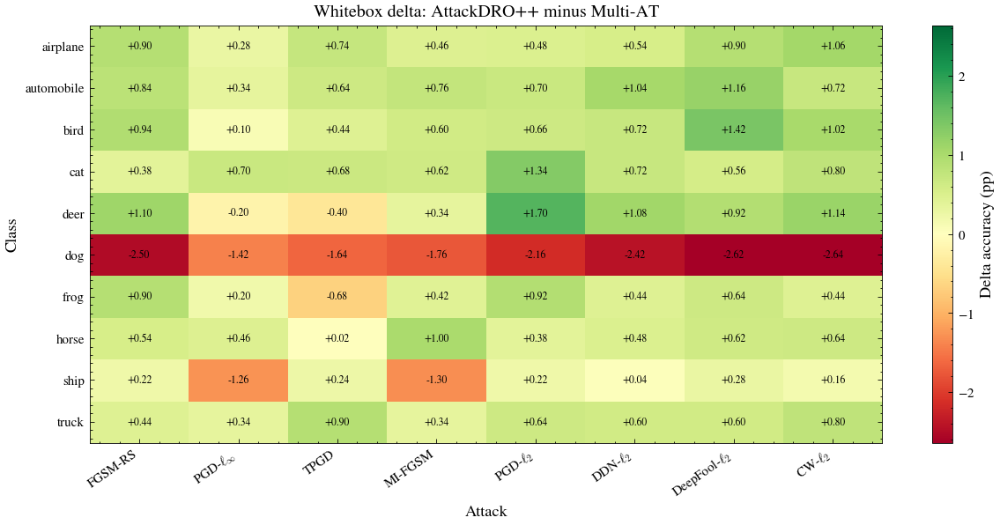

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_delta_per_class_attack_AttackDROpp_vs_MultiAT_n5.png


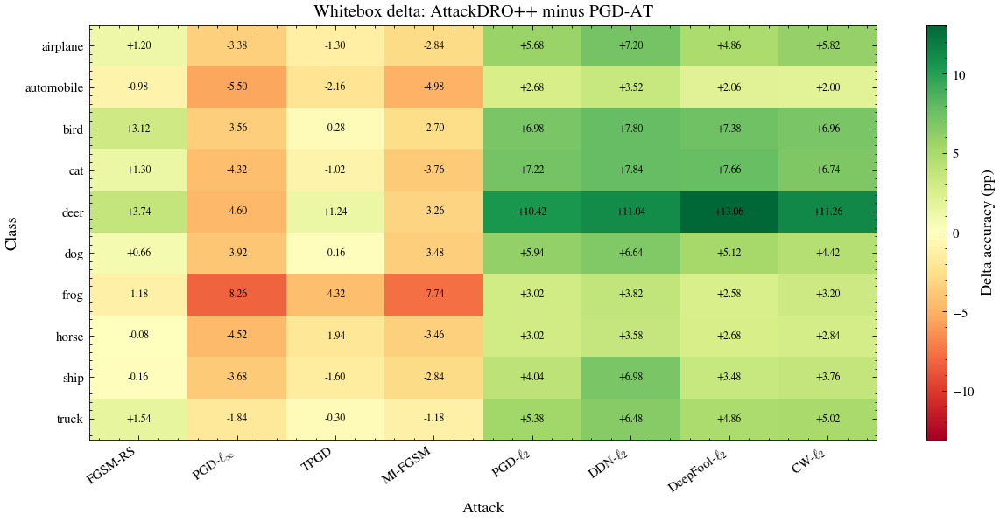

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_delta_per_class_attack_AttackDROpp_vs_PGDAT_n5.png


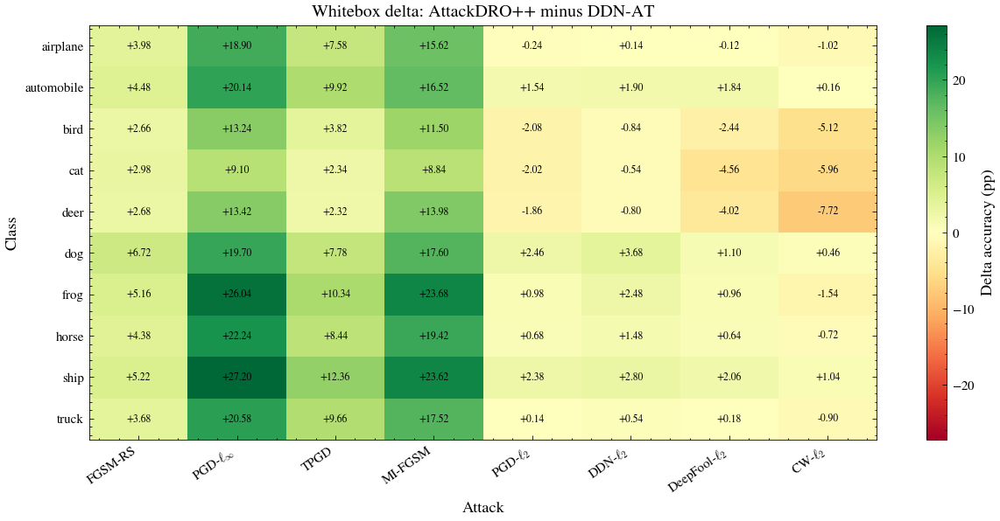

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_delta_per_class_attack_AttackDROpp_vs_DDNAT_n5.png


In [ ]:
# ============================================================================
# Heatmaps: AttackDRO++ minus each baseline
# ============================================================================

import matplotlib.pyplot as plt

ATTACK_LABELS = {
    "fgsm_rs": "FGSM-RS",
    "pgd20_ce": r"PGD-$\ell_\infty$",
    "tpgd": "TPGD",
    "mifgsm": "MI-FGSM",
    "pgd_l2": r"PGD-$\ell_2$",
    "ddn_l2": r"DDN-$\ell_2$",
    "deepfool_l2": r"DeepFool-$\ell_2$",
    "cw_l2": r"CW-$\ell_2$",
}

def plot_whitebox_delta_heatmap(cell_df, baseline):
    g = cell_df[cell_df["baseline"] == baseline].copy()

    pivot = (
        g.pivot_table(
            index="class_name",
            columns="attack",
            values="delta_pp",
            aggfunc="mean",
        )
        .reindex(index=class_order, columns=attack_order)
    )

    vals = pivot.to_numpy()
    vmax = np.nanmax(np.abs(vals))
    vmax = max(vmax, 1e-6)

    fig, ax = plt.subplots(figsize=(10.5, 5.2))
    im = ax.imshow(vals, aspect="auto", cmap="RdYlGn", vmin=-vmax, vmax=vmax)

    ax.set_xticks(np.arange(len(attack_order)))
    ax.set_xticklabels([ATTACK_LABELS[a] for a in attack_order], rotation=35, ha="right")

    ax.set_yticks(np.arange(len(class_order)))
    ax.set_yticklabels(class_order)

    ax.set_title(f"Whitebox delta: AttackDRO++ minus {baseline}", fontsize=12)
    ax.set_xlabel("Attack")
    ax.set_ylabel("Class")

    for i in range(vals.shape[0]):
        for j in range(vals.shape[1]):
            v = vals[i, j]
            if np.isfinite(v):
                ax.text(j, i, f"{v:+.2f}", ha="center", va="center", fontsize=7)

    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Delta accuracy (pp)")

    fig.tight_layout()

    safe = {
        "Multi-AT": "MultiAT",
        "PGD-AT": "PGDAT",
        "DDN-AT": "DDNAT",
    }[baseline]

    out_path = WHITEBOX_CELL_OUT_DIR / f"whitebox_delta_per_class_attack_AttackDROpp_vs_{safe}_n5.png"
    fig.savefig(out_path, dpi=220, bbox_inches="tight")
    plt.show()

    print("Saved:", out_path)


for baseline in ["Multi-AT", "PGD-AT", "DDN-AT"]:
    plot_whitebox_delta_heatmap(whitebox_cell_delta, baseline)


In [ ]:
# ============================================================================
# LaTeX table from summary
# ============================================================================

latex_rows = []

for _, r in whitebox_summary.iterrows():
    latex_rows.append(
        f"{r['Baseline']}\n"
        f"& ${r['Positive cells']}$\n"
        f"& ${r['Mean Δ (pp)']:+.3f}$\n"
        f"& ${r['Bottom-10 lift (pp)']:+.3f}$\n"
        f"& ${r['Best cell Δ (pp)']:+.3f}$\n"
        f"& ${r['Worst cell Δ (pp)']:+.3f}$ \\\\"
    )

latex_table = r"""
\begin{table}[H]
\centering
\caption{Per-(class \(\times\) attack) whitebox comparison of AttackDRO++
against each baseline on the \(n=5\) panel. \(\Delta\) is computed as
AttackDRO++ minus the baseline.}
\label{tab:whitebox_per_cell_summary}
\small
\setlength{\tabcolsep}{5pt}
\renewcommand{\arraystretch}{1.12}
\begin{tabular}{lrrrrr}
\toprule
Baseline
& Positive cells
& Mean \(\Delta\)
& Bottom-10 lift
& Best cell
& Worst cell \\
&
& (pp)
& (pp)
& \(\Delta\) (pp)
& \(\Delta\) (pp) \\
\midrule
""" + "\n".join(latex_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""

print(latex_table)


\begin{table}[H]
\centering
\caption{Per-(class \(\times\) attack) whitebox comparison of AttackDRO++
against each baseline on the \(n=5\) panel. \(\Delta\) is computed as
AttackDRO++ minus the baseline.}
\label{tab:whitebox_per_cell_summary}
\small
\setlength{\tabcolsep}{5pt}
\renewcommand{\arraystretch}{1.12}
\begin{tabular}{lrrrrr}
\toprule
Baseline
& Positive cells
& Mean \(\Delta\)
& Bottom-10 lift
& Best cell
& Worst cell \\
&
& (pp)
& (pp)
& \(\Delta\) (pp)
& \(\Delta\) (pp) \\
\midrule
Multi-AT
& $67/80$
& $+0.281$
& $+0.282$
& $+1.700$
& $-2.640$ \\
PGD-AT
& $47/80$
& $+1.782$
& $+0.726$
& $+13.060$
& $-8.260$ \\
DDN-AT
& $62/80$
& $+5.781$
& $+15.710$
& $+27.200$
& $-7.720$ \\
\bottomrule
\end{tabular}
\end{table}



attack,fgsm_rs,pgd20_ce,tpgd,mifgsm,pgd_l2,ddn_l2,deepfool_l2,cw_l2
method,,,,,,,,
PGD-AT,67.990,49.480,68.236,51.108,64.270,60.658,62.496,62.572
DDN-AT,64.712,26.066,59.596,30.654,69.510,66.064,68.306,69.906
Multi-AT,68.530,45.168,66.958,47.336,69.220,66.824,67.422,67.360
AttackDRO++,68.906,45.122,67.052,47.484,69.708,67.148,67.870,67.774


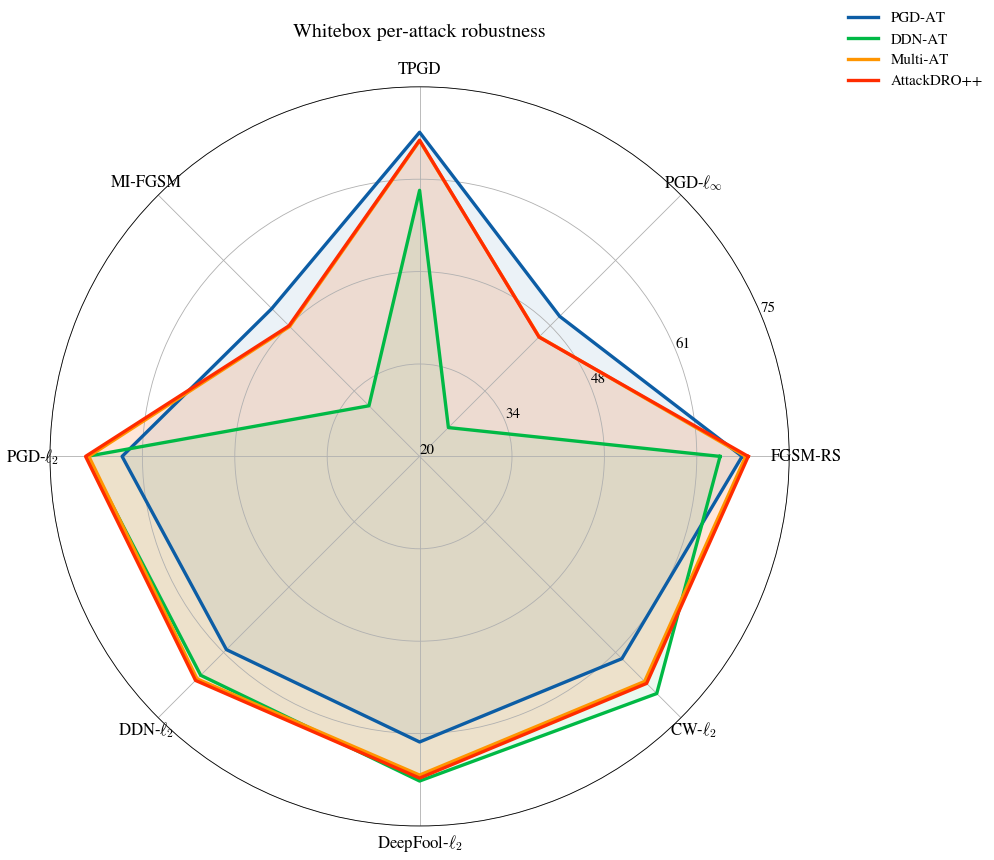

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_radar_per_attack_accuracy_n5.png


In [ ]:
# ============================================================================
# Radar chart: whitebox per-attack accuracy by method
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

WHITEBOX_CELL_OUT_DIR = Path("/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class")

method_order = ["PGD-AT", "DDN-AT", "Multi-AT", "AttackDRO++"]

attack_order = [
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "ddn_l2",
    "deepfool_l2",
    "cw_l2",
]

attack_labels = [
    "FGSM-RS",
    r"PGD-$\ell_\infty$",
    "TPGD",
    "MI-FGSM",
    r"PGD-$\ell_2$",
    r"DDN-$\ell_2$",
    r"DeepFool-$\ell_2$",
    r"CW-$\ell_2$",
]

# Mean over seeds and classes for each method x attack
attack_pivot = (
    whitebox_raw
    .groupby(["method", "attack"], as_index=False)
    .agg(mean_acc_pct=("acc_pct", "mean"))
    .pivot(index="method", columns="attack", values="mean_acc_pct")
    .reindex(index=method_order, columns=attack_order)
)

display(attack_pivot.round(3))

# Radar setup
num_vars = len(attack_order)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

for method in method_order:
    values = attack_pivot.loc[method].to_numpy(dtype=float).tolist()
    values += values[:1]

    ax.plot(angles, values, linewidth=2, label=method)
    ax.fill(angles, values, alpha=0.08)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(attack_labels, fontsize=10)

# Choose radial range based on data
min_val = np.nanmin(attack_pivot.to_numpy())
max_val = np.nanmax(attack_pivot.to_numpy())
lower = max(0, np.floor((min_val - 3) / 5) * 5)
upper = min(100, np.ceil((max_val + 3) / 5) * 5)

ax.set_ylim(lower, upper)
ax.set_yticks(np.linspace(lower, upper, 5))
ax.set_yticklabels([f"{v:.0f}" for v in np.linspace(lower, upper, 5)], fontsize=9)

ax.set_title(
    "Whitebox per-attack robustness",
    fontsize=12,
    pad=30,
)

ax.legend(loc="upper right", bbox_to_anchor=(1.28, 1.12))
ax.grid(True)

out_path = WHITEBOX_CELL_OUT_DIR / "whitebox_radar_per_attack_accuracy_n5.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()

print("Saved:", out_path)

attack,fgsm_rs,pgd20_ce,tpgd,mifgsm,pgd_l2,ddn_l2,deepfool_l2,cw_l2
baseline,,,,,,,,
Multi-AT,0.376,-0.046,0.094,0.148,0.488,0.324,0.448,0.414
PGD-AT,0.916,-4.358,-1.184,-3.624,5.438,6.490,5.374,5.202
DDN-AT,4.194,19.056,7.456,16.830,0.198,1.084,-0.436,-2.132


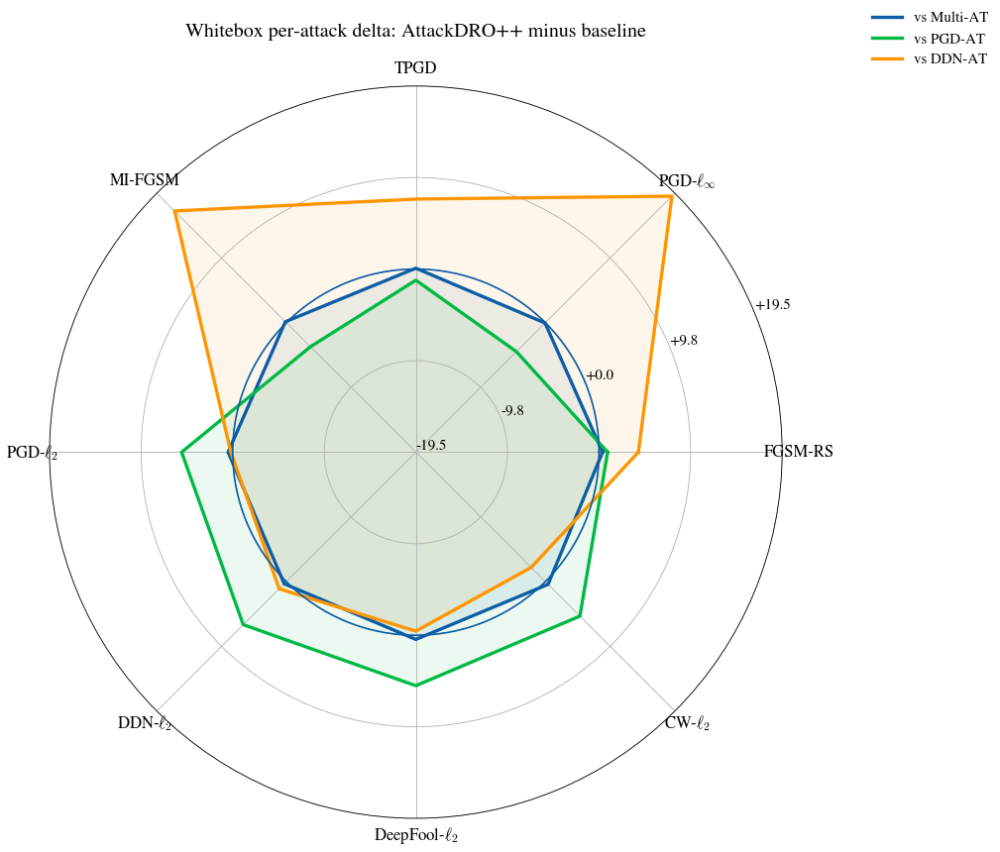

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_radar_attackdropp_delta_vs_baselines_n5.png


In [ ]:
# ============================================================================
# Radar chart: AttackDRO++ delta against each baseline
# ============================================================================

baseline_order = ["Multi-AT", "PGD-AT", "DDN-AT"]

delta_rows = []

for baseline in baseline_order:
    for attack in attack_order:
        a = whitebox_raw[
            (whitebox_raw["method"] == "AttackDRO++") &
            (whitebox_raw["attack"] == attack)
        ]

        b = whitebox_raw[
            (whitebox_raw["method"] == baseline) &
            (whitebox_raw["attack"] == attack)
        ]

        key = ["seed", "class_id", "class_name"]
        aa = a[key + ["acc_pct"]].rename(columns={"acc_pct": "attackdropp_acc"})
        bb = b[key + ["acc_pct"]].rename(columns={"acc_pct": "baseline_acc"})

        pair = aa.merge(bb, on=key, how="inner")
        pair["delta_pp"] = pair["attackdropp_acc"] - pair["baseline_acc"]

        delta_rows.append({
            "baseline": baseline,
            "attack": attack,
            "delta_pp": pair["delta_pp"].mean(),
        })

delta_df = pd.DataFrame(delta_rows)

delta_pivot = (
    delta_df
    .pivot(index="baseline", columns="attack", values="delta_pp")
    .reindex(index=baseline_order, columns=attack_order)
)

display(delta_pivot.round(3))

num_vars = len(attack_order)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

for baseline in baseline_order:
    values = delta_pivot.loc[baseline].to_numpy(dtype=float).tolist()
    values += values[:1]

    ax.plot(angles, values, linewidth=2, label=f"vs {baseline}")
    ax.fill(angles, values, alpha=0.08)

ax.axhline(0, linewidth=1)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(attack_labels, fontsize=10)

max_abs = np.nanmax(np.abs(delta_pivot.to_numpy()))
limit = max(1.0, np.ceil(max_abs * 2) / 2)
ax.set_ylim(-limit, limit)

yticks = np.linspace(-limit, limit, 5)
ax.set_yticks(yticks)
ax.set_yticklabels([f"{v:+.1f}" for v in yticks], fontsize=9)

ax.set_title(
    "Whitebox per-attack delta: AttackDRO++ minus baseline",
    fontsize=12,
    pad=30,
)

ax.legend(loc="upper right", bbox_to_anchor=(1.30, 1.12))
ax.grid(True)

out_path = WHITEBOX_CELL_OUT_DIR / "whitebox_radar_attackdropp_delta_vs_baselines_n5.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()

print("Saved:", out_path)

In [ ]:
whitebox_raw = pd.read_csv(
    "/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_attack_class_raw_n5.csv"
)

In [ ]:
# ============================================================================
# Absolute whitebox per-(class x attack) heatmaps for each method
# Rows = CIFAR-10 classes, columns = attacks, values = robust accuracy (%)
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

WHITEBOX_CELL_OUT_DIR = Path("/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class")
WHITEBOX_CELL_OUT_DIR.mkdir(parents=True, exist_ok=True)

# --------------------------------------------------------------------------
# Display order
# --------------------------------------------------------------------------

method_order = ["PGD-AT", "DDN-AT", "Multi-AT", "AttackDRO++"]

method_file_name = {
    "PGD-AT": "PGDAT",
    "DDN-AT": "DDNAT",
    "Multi-AT": "MultiAT",
    "AttackDRO++": "AttackDROpp",
}

attack_order = [
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "ddn_l2",
    "deepfool_l2",
    "cw_l2",
]

attack_labels = {
    "fgsm_rs": "FGSM-RS",
    "pgd20_ce": r"PGD-$\ell_\infty$",
    "tpgd": "TPGD",
    "mifgsm": "MI-FGSM",
    "pgd_l2": r"PGD-$\ell_2$",
    "ddn_l2": r"DDN-$\ell_2$",
    "deepfool_l2": r"DeepFool-$\ell_2$",
    "cw_l2": r"CW-$\ell_2$",
}

class_order = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck",
]

# --------------------------------------------------------------------------
# Robust column detection
# --------------------------------------------------------------------------

def get_acc_column(df):
    if "acc_pct" in df.columns:
        return "acc_pct"
    if "acc" in df.columns:
        # Convert acc in [0,1] to percent if needed.
        if df["acc"].max() <= 1.0:
            df["acc_pct"] = df["acc"] * 100.0
            return "acc_pct"
        return "acc"
    raise ValueError("Could not find accuracy column. Expected `acc_pct` or `acc`.")

acc_col = get_acc_column(whitebox_raw)

# --------------------------------------------------------------------------
# Build absolute method x class x attack table
# --------------------------------------------------------------------------

whitebox_cell_mean = (
    whitebox_raw
    .groupby(["method", "attack", "class_name"], as_index=False)
    .agg(
        mean_acc_pct=(acc_col, "mean"),
        sd_acc_pct=(acc_col, "std"),
        n_seeds=("seed", "nunique"),
    )
)

cell_mean_path = WHITEBOX_CELL_OUT_DIR / "whitebox_per_method_class_attack_mean_n5.csv"
whitebox_cell_mean.to_csv(cell_mean_path, index=False)
print("Saved:", cell_mean_path)

display(
    whitebox_cell_mean
    .sort_values(["method", "attack", "class_name"])
    .head(20)
)

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_method_class_attack_mean_n5.csv


,method,attack,class_name,mean_acc_pct,sd_acc_pct,n_seeds
0,AttackDRO++,cw_l2,airplane,75.06,0.976217,5
1,AttackDRO++,cw_l2,automobile,85.60,0.339116,5
2,AttackDRO++,cw_l2,bird,52.30,1.262933,5
3,AttackDRO++,cw_l2,cat,36.56,1.512614,5
4,AttackDRO++,cw_l2,deer,53.22,1.321741,5
5,AttackDRO++,cw_l2,dog,55.22,0.432435,5
6,AttackDRO++,cw_l2,frog,74.82,1.066302,5
7,AttackDRO++,cw_l2,horse,78.00,0.561249,5
8,AttackDRO++,cw_l2,ship,85.58,0.593296,5
9,AttackDRO++,cw_l2,truck,81.38,0.496991,5


In [ ]:
# ============================================================================
# Plot absolute heatmap for one method
# ============================================================================

def plot_method_attack_class_heatmap(
    cell_df,
    method,
    out_dir,
    vmin=None,
    vmax=None,
    annotate=True,
):
    g = cell_df[cell_df["method"] == method].copy()

    if g.empty:
        raise ValueError(f"No rows found for method: {method}")

    pivot = (
        g.pivot_table(
            index="class_name",
            columns="attack",
            values="mean_acc_pct",
            aggfunc="mean",
        )
        .reindex(index=class_order, columns=attack_order)
    )

    vals = pivot.to_numpy(dtype=float)

    if vmin is None:
        vmin = np.nanmin(vals)
    if vmax is None:
        vmax = np.nanmax(vals)

    fig, ax = plt.subplots(figsize=(10.5, 5.2))

    im = ax.imshow(
        vals,
        aspect="auto",
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
    )

    ax.set_xticks(np.arange(len(attack_order)))
    ax.set_xticklabels(
        [attack_labels[a] for a in attack_order],
        rotation=35,
        ha="right",
    )

    ax.set_yticks(np.arange(len(class_order)))
    ax.set_yticklabels(class_order)

    ax.set_xlabel("Attack")
    ax.set_ylabel("Class")
    ax.set_title(f"Whitebox per-class per-attack accuracy: {method}", fontsize=12)

    if annotate:
        for i in range(vals.shape[0]):
            for j in range(vals.shape[1]):
                v = vals[i, j]
                if np.isfinite(v):
                    ax.text(
                        j,
                        i,
                        f"{v:.1f}",
                        ha="center",
                        va="center",
                        fontsize=7,
                        color="black" if v > (vmin + vmax) / 2 else "white",
                    )

    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Robust accuracy (%)")

    fig.tight_layout()

    safe_method = method_file_name.get(method, method.replace("+", "p").replace(" ", "_"))
    out_path = Path(out_dir) / f"whitebox_per_class_attack_{safe_method}_n5.png"

    fig.savefig(out_path, dpi=220, bbox_inches="tight")
    plt.show()

    print("Saved:", out_path)
    return out_path


Global color scale: 6.72% to 86.66%


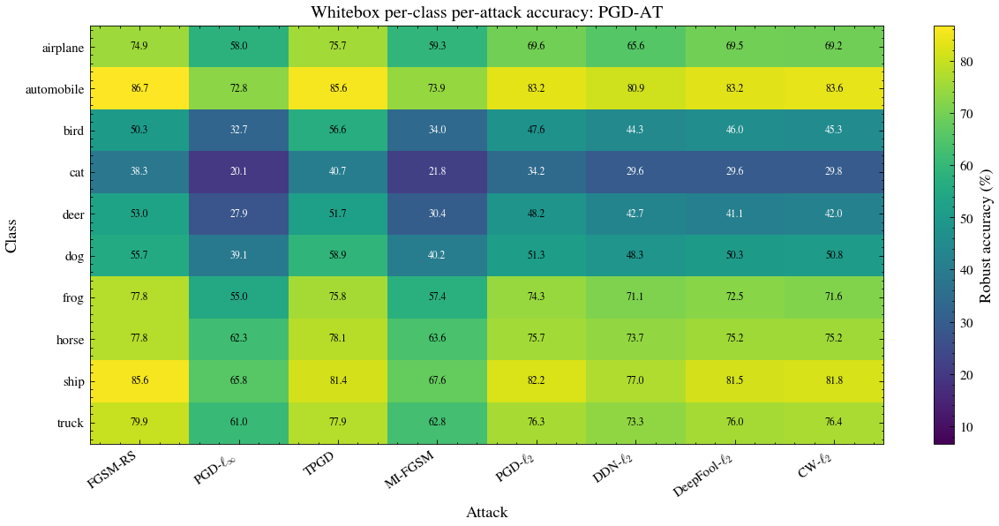

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_PGDAT_n5.png


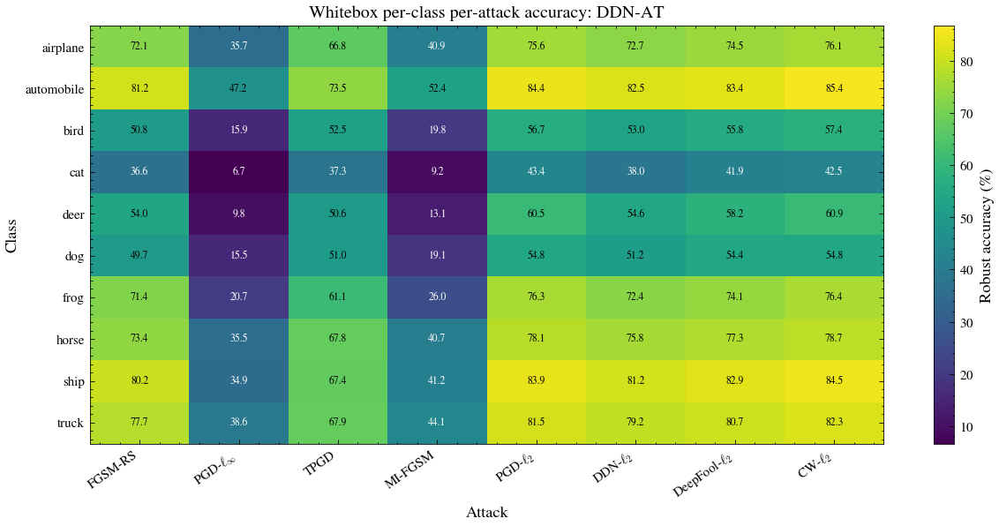

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_DDNAT_n5.png


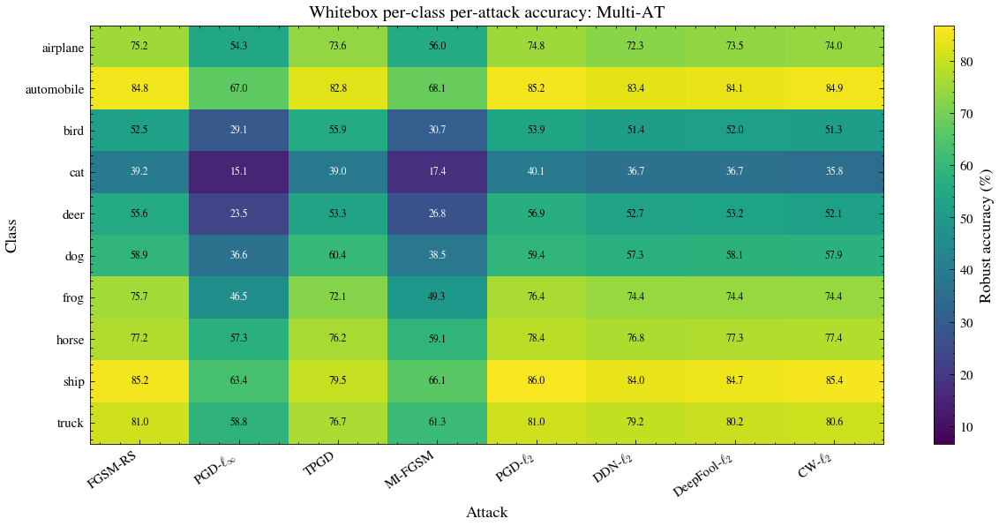

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_MultiAT_n5.png


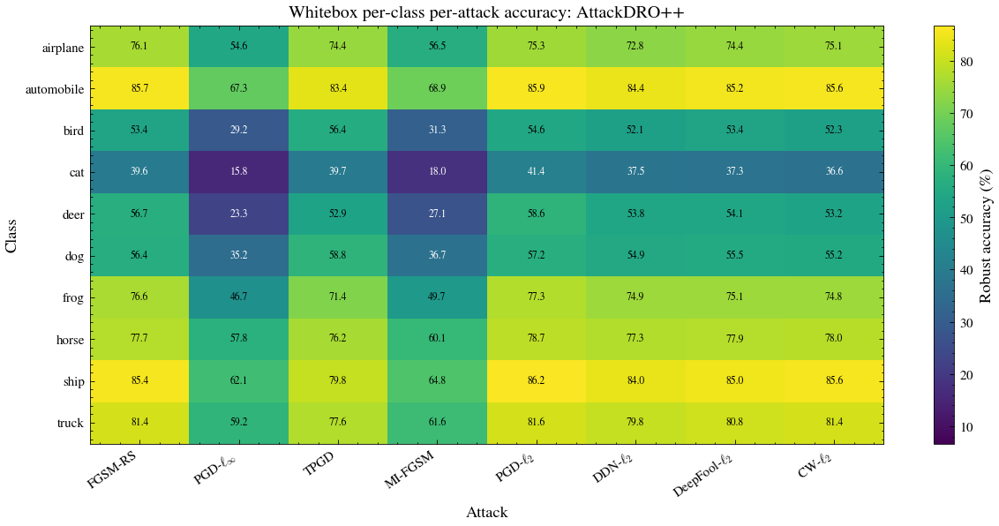

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_AttackDROpp_n5.png


{'PGD-AT': PosixPath('/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_PGDAT_n5.png'),
 'DDN-AT': PosixPath('/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_DDNAT_n5.png'),
 'Multi-AT': PosixPath('/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_MultiAT_n5.png'),
 'AttackDRO++': PosixPath('/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_AttackDROpp_n5.png')}

In [ ]:
# ============================================================================
# Generate comparable heatmaps for all methods
# Same color scale across methods
# ============================================================================

global_vmin = whitebox_cell_mean["mean_acc_pct"].min()
global_vmax = whitebox_cell_mean["mean_acc_pct"].max()

print(f"Global color scale: {global_vmin:.2f}% to {global_vmax:.2f}%")

method_heatmap_paths = {}

for method in method_order:
    path = plot_method_attack_class_heatmap(
        whitebox_cell_mean,
        method=method,
        out_dir=WHITEBOX_CELL_OUT_DIR,
        vmin=global_vmin,
        vmax=global_vmax,
        annotate=True,
    )
    method_heatmap_paths[method] = path

method_heatmap_paths

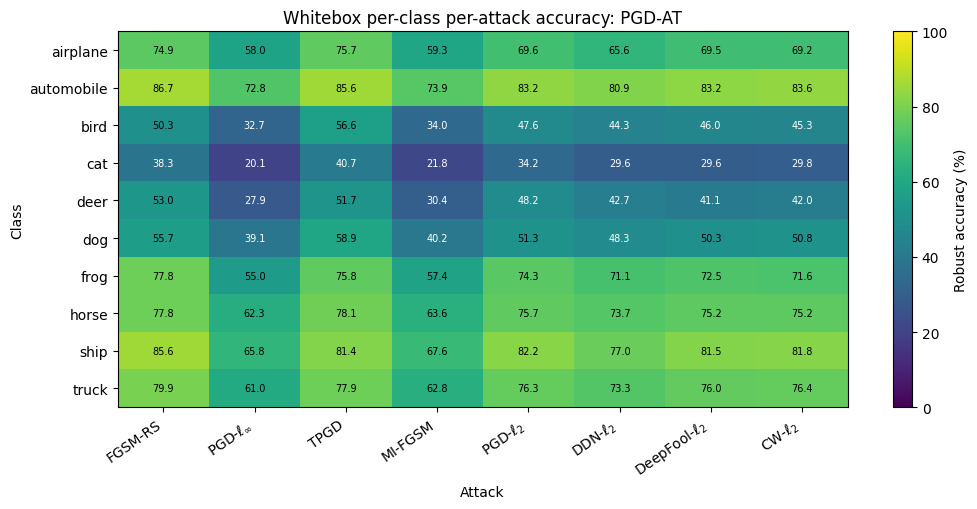

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_PGDAT_n5.png


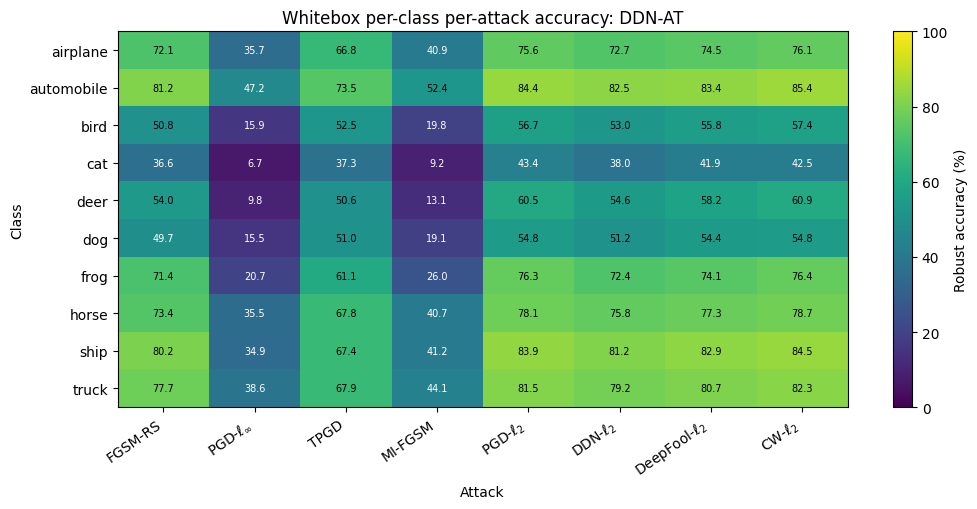

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_DDNAT_n5.png


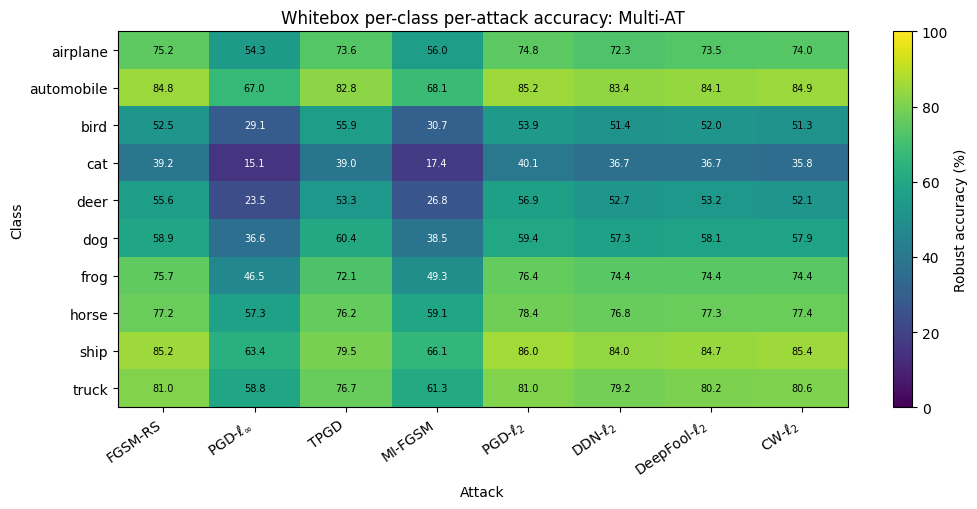

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_MultiAT_n5.png


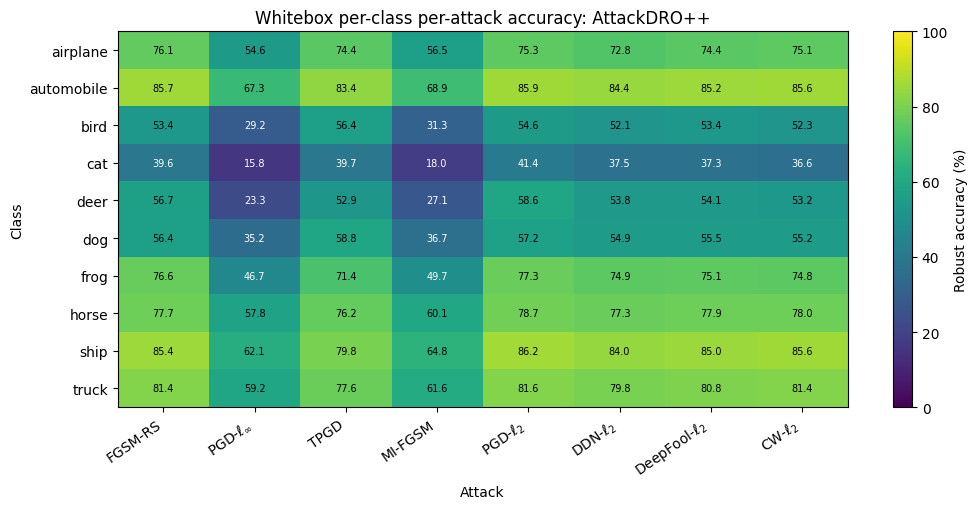

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_per_class_attack_AttackDROpp_n5.png


In [ ]:
# ============================================================================
# Optional: fixed 0-100 scale version
# ============================================================================

for method in method_order:
    plot_method_attack_class_heatmap(
        whitebox_cell_mean,
        method=method,
        out_dir=WHITEBOX_CELL_OUT_DIR,
        vmin=0,
        vmax=100,
        annotate=True,
    )

# Bottom up


In [ ]:
# ============================================================================
# Bottom-K lift figure: AttackDRO++ vs baselines
# Bottom-K cells = weakest class-attack cells of the baseline
# Lift = AttackDRO++ accuracy - baseline accuracy on those cells
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown

WHITEBOX_CELL_OUT_DIR = Path("/content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class")
WHITEBOX_CELL_OUT_DIR.mkdir(parents=True, exist_ok=True)

raw_path = WHITEBOX_CELL_OUT_DIR / "whitebox_attack_class_raw_n5.csv"
whitebox_raw = pd.read_csv(raw_path)

print("Loaded:", raw_path)
print("Shape:", whitebox_raw.shape)

# --------------------------------------------------------------------------
# Accuracy column handling
# --------------------------------------------------------------------------

if "acc_pct" not in whitebox_raw.columns:
    if "acc" in whitebox_raw.columns:
        whitebox_raw["acc_pct"] = (
            whitebox_raw["acc"] * 100.0
            if whitebox_raw["acc"].max() <= 1.0
            else whitebox_raw["acc"]
        )
    else:
        raise ValueError("Expected either `acc_pct` or `acc` in whitebox_raw.")

# --------------------------------------------------------------------------
# Display order
# --------------------------------------------------------------------------

baseline_order = ["Multi-AT", "PGD-AT", "DDN-AT"]

attack_order = [
    "fgsm_rs",
    "pgd20_ce",
    "tpgd",
    "mifgsm",
    "pgd_l2",
    "ddn_l2",
    "deepfool_l2",
    "cw_l2",
]

attack_labels = {
    "fgsm_rs": "FGSM-RS",
    "pgd20_ce": r"PGD-$\ell_\infty$",
    "tpgd": "TPGD",
    "mifgsm": "MI-FGSM",
    "pgd_l2": r"PGD-$\ell_2$",
    "ddn_l2": r"DDN-$\ell_2$",
    "deepfool_l2": r"DeepFool-$\ell_2$",
    "cw_l2": r"CW-$\ell_2$",
}

class_order = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck",
]

# --------------------------------------------------------------------------
# Pair AttackDRO++ with each baseline per seed x attack x class
# --------------------------------------------------------------------------

def make_attackdropp_cell_delta(raw_df, baseline):
    key = ["seed", "attack", "class_id", "class_name"]

    a = (
        raw_df[raw_df["method"] == "AttackDRO++"][key + ["acc_pct"]]
        .rename(columns={"acc_pct": "attackdropp_acc_pct"})
    )

    b = (
        raw_df[raw_df["method"] == baseline][key + ["acc_pct"]]
        .rename(columns={"acc_pct": "baseline_acc_pct"})
    )

    pair = a.merge(b, on=key, how="inner")
    pair["baseline"] = baseline
    pair["delta_pp"] = pair["attackdropp_acc_pct"] - pair["baseline_acc_pct"]

    cell = (
        pair
        .groupby(["baseline", "attack", "class_id", "class_name"], as_index=False)
        .agg(
            attackdropp_acc_pct=("attackdropp_acc_pct", "mean"),
            baseline_acc_pct=("baseline_acc_pct", "mean"),
            delta_pp=("delta_pp", "mean"),
            n_seeds=("seed", "nunique"),
        )
    )

    return cell


cell_delta = pd.concat(
    [make_attackdropp_cell_delta(whitebox_raw, b) for b in baseline_order],
    ignore_index=True,
)

display(Markdown("### AttackDRO++ minus baseline per class-attack cell"))
display(cell_delta.head())

Loaded: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_attack_class_raw_n5.csv
Shape: (1600, 12)


### AttackDRO++ minus baseline per class-attack cell

,baseline,attack,class_id,class_name,attackdropp_acc_pct,baseline_acc_pct,delta_pp,n_seeds
0,Multi-AT,cw_l2,0,airplane,75.06,74.00,1.06,5
1,Multi-AT,cw_l2,1,automobile,85.60,84.88,0.72,5
2,Multi-AT,cw_l2,2,bird,52.30,51.28,1.02,5
3,Multi-AT,cw_l2,3,cat,36.56,35.76,0.80,5
4,Multi-AT,cw_l2,4,deer,53.22,52.08,1.14,5


In [ ]:
# ============================================================================
# Compute Bottom-K lift
# ============================================================================

bottom_k_values = [5, 10, 20]

bottomk_rows = []
bottomk_cells = {}

for baseline in baseline_order:
    g = cell_delta[cell_delta["baseline"] == baseline].copy()

    for k in bottom_k_values:
        bottom_cells = g.sort_values("baseline_acc_pct", ascending=True).head(k).copy()

        bottomk_rows.append({
            "Baseline": baseline,
            "K": k,
            "Bottom-K lift (pp)": bottom_cells["delta_pp"].mean(),
            "Baseline bottom-K acc (%)": bottom_cells["baseline_acc_pct"].mean(),
            "AttackDRO++ on same cells (%)": bottom_cells["attackdropp_acc_pct"].mean(),
        })

        bottomk_cells[(baseline, k)] = bottom_cells

bottomk_df = pd.DataFrame(bottomk_rows)

# Save table
bottomk_path = WHITEBOX_CELL_OUT_DIR / "whitebox_bottomk_lift_n5.csv"
bottomk_df.to_csv(bottomk_path, index=False)

print("Saved:", bottomk_path)
display(Markdown("### Bottom-K lift summary"))
display(bottomk_df.round(3))

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_bottomk_lift_n5.csv


### Bottom-K lift summary

,Baseline,K,Bottom-K lift (pp),Baseline bottom-K acc (%),AttackDRO++ on same cells (%)
0,Multi-AT,5,0.312,22.368,22.680
1,Multi-AT,10,0.282,28.844,29.126
2,Multi-AT,20,0.419,37.392,37.811
3,PGD-AT,5,0.564,25.812,26.376
4,PGD-AT,10,0.726,29.022,29.748
5,PGD-AT,20,2.882,35.502,38.384
6,DDN-AT,5,13.008,10.876,23.884
7,DDN-AT,10,15.710,15.602,31.312
8,DDN-AT,20,15.473,26.776,42.249


### Bottom-K lift pivot

K,5,10,20
Baseline,,,
Multi-AT,0.312,0.282,0.419
PGD-AT,0.564,0.726,2.882
DDN-AT,13.008,15.710,15.473


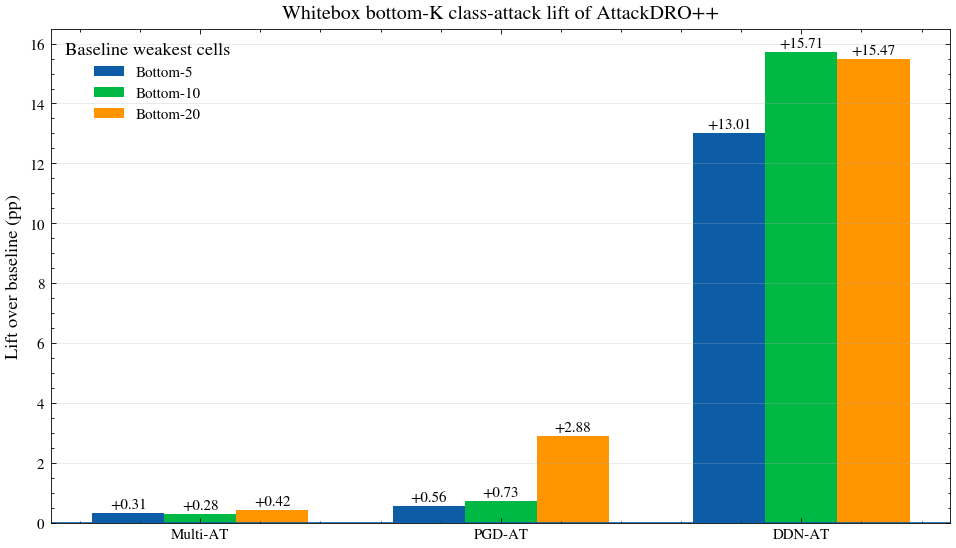

Saved: /content/drive/MyDrive/ardg_project/FINAL/whitebox_attack_class/whitebox_bottomk_lift_bar_n5.png


In [ ]:
# ============================================================================
# Figure: Bottom-K lift grouped bar chart
# ============================================================================

plot_df = (
    bottomk_df
    .pivot(index="Baseline", columns="K", values="Bottom-K lift (pp)")
    .reindex(index=baseline_order, columns=bottom_k_values)
)

display(Markdown("### Bottom-K lift pivot"))
display(plot_df.round(3))

fig, ax = plt.subplots(figsize=(8.2, 4.8))

x = np.arange(len(baseline_order))
width = 0.24

for i, k in enumerate(bottom_k_values):
    values = plot_df[k].to_numpy(dtype=float)
    bars = ax.bar(
        x + (i - 1) * width,
        values,
        width,
        label=f"Bottom-{k}",
    )

    for bar, value in zip(bars, values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value + (0.05 if value >= 0 else -0.12),
            f"{value:+.2f}",
            ha="center",
            va="bottom" if value >= 0 else "top",
            fontsize=9,
        )

ax.axhline(0, linewidth=1)
ax.set_xticks(x)
ax.set_xticklabels(baseline_order)
ax.set_ylabel("Lift over baseline (pp)")
ax.set_title("Whitebox bottom-K class-attack lift of AttackDRO++")
ax.legend(title="Baseline weakest cells")
ax.grid(axis="y", alpha=0.3)

fig.tight_layout()

out_path = WHITEBOX_CELL_OUT_DIR / "whitebox_bottomk_lift_bar_n5.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()

print("Saved:", out_path)

In [ ]:
# ============================================================================
# Figure: Bottom-K lift grouped bar chart
# ============================================================================

plot_df = (
    bottomk_df
    .pivot(index="Baseline", columns="K", values="Bottom-K lift (pp)")
    .reindex(index=baseline_order, columns=bottom_k_values)
)

display(Markdown("### Bottom-K lift pivot"))
display(plot_df.round(3))

fig, ax = plt.subplots(figsize=(8.2, 4.8))

x = np.arange(len(baseline_order))
width = 0.24

for i, k in enumerate(bottom_k_values):
    values = plot_df[k].to_numpy(dtype=float)
    bars = ax.bar(
        x + (i - 1) * width,
        values,
        width,
        label=f"Bottom-{k}",
    )

    for bar, value in zip(bars, values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value + (0.05 if value >= 0 else -0.12),
            f"{value:+.2f}",
            ha="center",
            va="bottom" if value >= 0 else "top",
            fontsize=9,
        )

ax.axhline(0, linewidth=1)
ax.set_xticks(x)
ax.set_xticklabels(baseline_order)
ax.set_ylabel("Lift over baseline (pp)")
ax.set_title("Whitebox bottom-K class-attack lift of AttackDRO++", fontsize=12)
ax.legend(title="Baseline weakest cells")
ax.grid(axis="y", alpha=0.3)

fig.tight_layout()

out_path = WHITEBOX_CELL_OUT_DIR / "whitebox_bottomk_lift_bar_n5.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()

print("Saved:", out_path)


NameError: name 'bottomk_df' is not defined

In [ ]:
# ============================================================================
# Figure: Bottom-10 lift only
# ============================================================================

bottom10_df = bottomk_df[bottomk_df["K"] == 10].copy()
bottom10_df["Baseline"] = pd.Categorical(
    bottom10_df["Baseline"],
    categories=baseline_order,
    ordered=True,
)
bottom10_df = bottom10_df.sort_values("Baseline")

fig, ax = plt.subplots(figsize=(6.6, 4.2))

bars = ax.bar(
    bottom10_df["Baseline"],
    bottom10_df["Bottom-K lift (pp)"],
)

for bar, value in zip(bars, bottom10_df["Bottom-K lift (pp)"]):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        value + (0.05 if value >= 0 else -0.12),
        f"{value:+.2f}",
        ha="center",
        va="bottom" if value >= 0 else "top",
        fontsize=10,
    )

ax.axhline(0, linewidth=1)
ax.set_ylabel("Bottom-10 lift (pp)")
ax.set_title("AttackDRO++ lift on each baseline's weakest 10 cells", fontsize=12)
ax.grid(axis="y", alpha=0.3)

fig.tight_layout()

out_path = WHITEBOX_CELL_OUT_DIR / "whitebox_bottom10_lift_bar_n5.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()

print("Saved:", out_path)


NameError: name 'bottomk_df' is not defined